In [16]:
#!pip install EMD-signal
#!pip install pyemd

#from PyEMD import EMD
#!pip install PyEMD
#!pip install PyEMD
#!pip install git
#Restart kernel after installing these packages
#!python setup.py install

In [3]:
!git clone https://github.com/laszukdawid/PyEMD

Cloning into 'PyEMD'...


In [35]:
#conda install -c conda-forge pyemd

In [36]:
#!pip uninstall EEMD-Signal

# LOAD THE BCG SUPINE DATASET

In [887]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt
#pip install "numpy>=1.16.5,<1.23.0"
#pip show numpy


# Read the accelerometer data from the CSV file
subject1 = pd.read_csv("aa1_acc_s.csv")
subject2 = pd.read_csv("aa2_acc_s.csv")
subject3 = pd.read_csv("ab4_acc_s.csv")
subject4 = pd.read_csv("ab5_acc_s.csv")
subject5 = pd.read_csv("ca2_acc_s.csv")
subject6 = pd.read_csv("ca3_acc_s.csv")
subject7 = pd.read_csv("ca4_acc_s.csv")
subject8 = pd.read_csv("dv1_acc_s.csv")
subject9 = pd.read_csv("dv2_acc_s.csv")
subject10 = pd.read_csv("ga1_acc_s.csv")
subject11 = pd.read_csv("mg1_acc_S.csv")
subject12 = pd.read_csv("mg2_acc_S.csv")
subject13 = pd.read_csv("mh1_acc_S.csv")
subject14 = pd.read_csv("mh2_acc_S.csv")


# Extracting the BCG accelerometer signal Z axis
raw_bcg_signal1 = subject1[['z1','z2','z3']].mean(axis=1).values
raw_bcg_signal2 = subject2[['z1','z2','z3']].mean(axis=1).values
raw_bcg_signal3 = subject3[['z1','z2','z3']].mean(axis=1).values
raw_bcg_signal4 = subject4[['z1','z2','z3']].mean(axis=1).values
raw_bcg_signal5 = subject5[['z1','z2','z3']].mean(axis=1).values
raw_bcg_signal6 = subject6[['z1','z2','z3']].mean(axis=1).values
raw_bcg_signal7 = subject7[['z1','z2','z3']].mean(axis=1).values
raw_bcg_signal8 = subject8[['z1','z2','z3']].mean(axis=1).values
raw_bcg_signal9 = subject9[['z1','z2','z3']].mean(axis=1).values
raw_bcg_signal10 = subject10[['z1','z2','z3']].mean(axis=1).values
raw_bcg_signal11 = subject11[['z1','z2','z3']].mean(axis=1).values
raw_bcg_signal12 = subject12[['z1','z2','z3']].mean(axis=1).values
raw_bcg_signal13 = subject13[['z1','z2','z3']].mean(axis=1).values
raw_bcg_signal14 = subject14[['z1','z2','z3']].mean(axis=1).values



# Sample rate of the accelerometer BCG signal
fs = 50 # Hz

# Time vector for plotting
time1 = subject1["ctime"]; 2 * raw_bcg_signal1.std()
time2 = subject2["ctime"]; 2 * raw_bcg_signal2.std()
time3 = subject3["ctime"]; 2 * raw_bcg_signal3.std()
time4 = subject4["ctime"]; 2 * raw_bcg_signal4.std()
time5 = subject5["ctime"]; 2 * raw_bcg_signal5.std()
time6 = subject6["ctime"]; 2 * raw_bcg_signal6.std()
time7 = subject7["ctime"]; 2 * raw_bcg_signal7.std()
time8 = subject8["ctime"]; 2 * raw_bcg_signal8.std()
time9 = subject9["ctime"]; 2 * raw_bcg_signal9.std()
time10 = subject10["ctime"]; 2 * raw_bcg_signal10.std()
time11 = subject11["ctime"]; 2 * raw_bcg_signal11.std()
time12 = subject12["ctime"]; 2 * raw_bcg_signal12.std()
time13 = subject13["ctime"]; 2 * raw_bcg_signal13.std()
time14 = subject14["ctime"]; 2 * raw_bcg_signal14.std()


600551.9752165723

In [888]:
data_frames = [raw_bcg_signal1, raw_bcg_signal2, raw_bcg_signal3, raw_bcg_signal4,
              raw_bcg_signal5, raw_bcg_signal6, raw_bcg_signal7, raw_bcg_signal8,
              raw_bcg_signal9, raw_bcg_signal10, raw_bcg_signal11, raw_bcg_signal12,
              raw_bcg_signal13, raw_bcg_signal14]  # Add all data frames here

# Loop through each data frame and perform scaling
for i, df in enumerate(data_frames):
    min_value = df.min()
    max_value = df.max()
    scaled_df = (df - min_value) / (max_value - min_value)
    data_frames[i] = scaled_df  

    
# data_frames contains all the scaled DataFrames
raw_bcg_signal1 = data_frames[0]
raw_bcg_signal2 = data_frames[1]
raw_bcg_signal3 = data_frames[2]
raw_bcg_signal4 = data_frames[3]
raw_bcg_signal5 = data_frames[4]
raw_bcg_signal6 = data_frames[5]
raw_bcg_signal7 = data_frames[6]
raw_bcg_signal8 = data_frames[7]
raw_bcg_signal9 = data_frames[8]
raw_bcg_signal10 = data_frames[9]
raw_bcg_signal11 = data_frames[10]
raw_bcg_signal12 = data_frames[11]
raw_bcg_signal13 = data_frames[12]
raw_bcg_signal14 = data_frames[13]

# RAW BCG SIGNAL

Duration of Invalid Signal for subject1: 175.5 seconds
Duration of Invalid Signal for subject2: 175.52 seconds
Duration of Invalid Signal for subject3: 172.16 seconds
Duration of Invalid Signal for subject3: 173.66 seconds
Duration of Invalid Signal for subject3: 175.08 seconds
Duration of Invalid Signal for subject3: 172.88 seconds
Duration of Invalid Signal for subject3: 173.28 seconds
Duration of Invalid Signal for subject3: 174.52 seconds
Duration of Invalid Signal for subject3: 175.0 seconds
Duration of Invalid Signal for subject3: 167.28 seconds


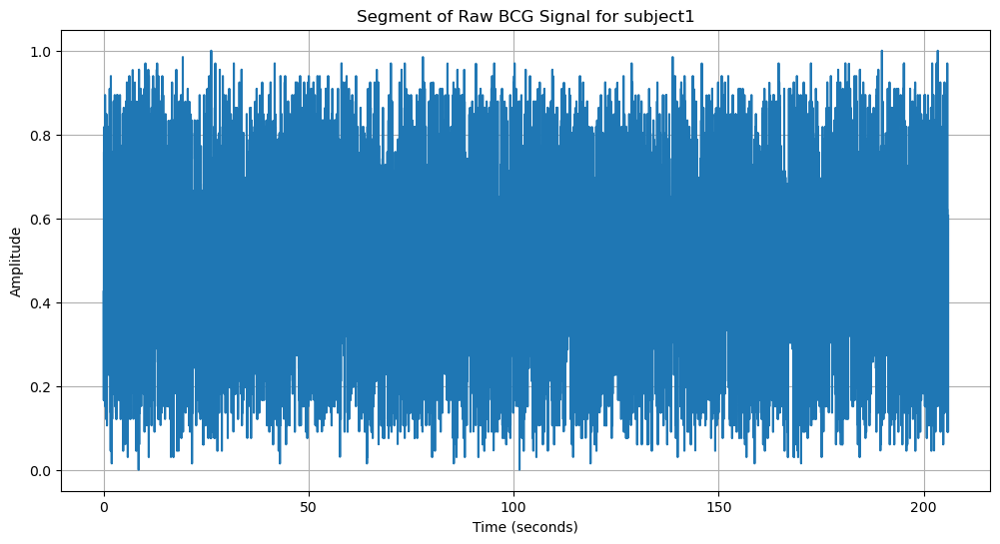

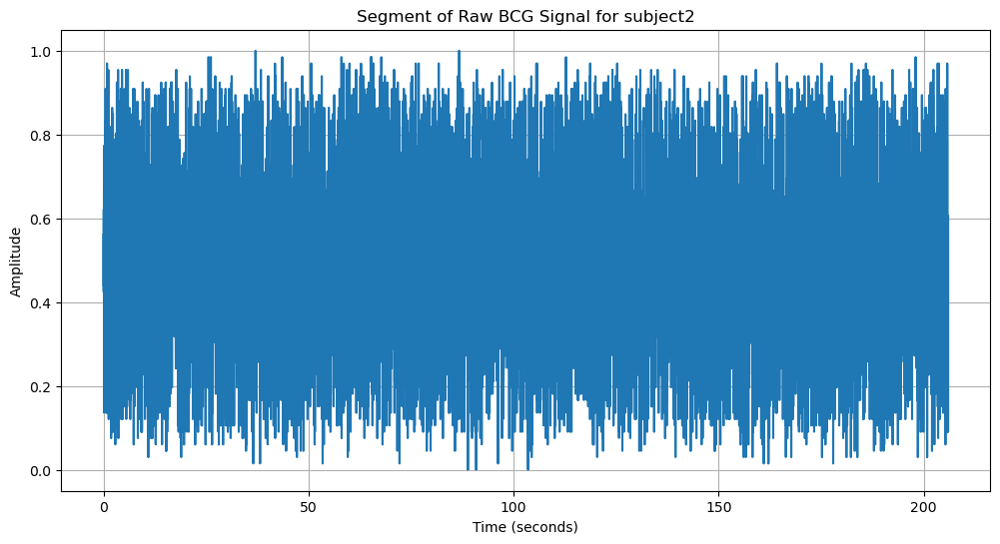

In [889]:
amplitude_threshold1 = 0.3  



#  Plotting a segment of the raw BCG signal
segment_duration1 =   len(raw_bcg_signal1) / fs;    segment_samples1 = int(fs * segment_duration1)
segment_time1 = np.arange(segment_samples1) / fs

segment_duration2 =   len(raw_bcg_signal2) / fs;     segment_samples2 = int(fs * segment_duration2)
segment_time2 = np.arange(segment_samples2) / fs

segment_duration3 =   len(raw_bcg_signal3) / fs;     segment_samples3 = int(fs * segment_duration3)
segment_time3 = np.arange(segment_samples3) / fs

segment_duration4 =   len(raw_bcg_signal4) / fs;     segment_samples4 = int(fs * segment_duration4)
segment_time4 = np.arange(segment_samples4) / fs

segment_duration5 =   len(raw_bcg_signal5) / fs;     segment_samples5 = int(fs * segment_duration5)
segment_time5 = np.arange(segment_samples5) / fs

segment_duration6 =   len(raw_bcg_signal6) / fs;     segment_samples6 = int(fs * segment_duration6)
segment_time6 = np.arange(segment_samples6) / fs

segment_duration7 =   len(raw_bcg_signal7) / fs;     segment_samples7 = int(fs * segment_duration7)
segment_time7 = np.arange(segment_samples7) / fs

segment_duration8 =   len(raw_bcg_signal8) / fs;     segment_samples8 = int(fs * segment_duration8)
segment_time8 = np.arange(segment_samples8) / fs

segment_duration9 =   len(raw_bcg_signal9) / fs;     segment_samples9 = int(fs * segment_duration9)
segment_time9 = np.arange(segment_samples9) / fs

segment_duration10 =   len(raw_bcg_signal10) / fs;   segment_samples10 = int(fs * segment_duration10)
segment_time10 = np.arange(segment_samples10) / fs


plt.figure(figsize=(12, 6))
plt.plot(segment_time1[:segment_samples1], raw_bcg_signal1[:segment_samples1])
plt.title("Segment of Raw BCG Signal for subject1")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(segment_time2[:segment_samples2], raw_bcg_signal2[:segment_samples2])
plt.title("Segment of Raw BCG Signal for subject2")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

# PREPROCESS THE BCG SIGNAL USING BUTTERWOTH BANDPASS AND BASELINE DRIFT

In [890]:
import numpy as np
from scipy.signal import butter, filtfilt, medfilt, correlate
import matplotlib.pyplot as plt

# Step 1: Apply a Butterworth bandpass filter to remove high-frequency noise
def butter_bandpass_filter(data, lowcut, highcut, fs, order=3):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    filtered_data = filtfilt(b, a, data)
    return filtered_data

# Step 2: Apply median filter to suppress baseline drift
def baseline_drift_correction(signal, kernel_size):
    return medfilt(signal, kernel_size)

# Step 3: Enhance peak prominence using cross-correlation
def enhance_peak_prominence(signal, reference_signal):
    cross_correlation = correlate(signal, reference_signal, mode='same')
    enhanced_signal = signal - cross_correlation
    return enhanced_signal

# Sampling frequency (fs) and order for the Butterworth filter
fs = 50  
order = 3

# Define cutoff frequencies
low_cutoff = 0.5  # Hz
high_cutoff = 8.0  # Hz


#  bandpass filter to each raw BCG signal
filtered_bcg_signal1 = butter_bandpass_filter(raw_bcg_signal1, low_cutoff, high_cutoff, fs, order)
filtered_bcg_signal2 = butter_bandpass_filter(raw_bcg_signal2, low_cutoff, high_cutoff, fs, order)
filtered_bcg_signal3 = butter_bandpass_filter(raw_bcg_signal3, low_cutoff, high_cutoff, fs, order)
filtered_bcg_signal4 = butter_bandpass_filter(raw_bcg_signal4, low_cutoff, high_cutoff, fs, order)
filtered_bcg_signal5 = butter_bandpass_filter(raw_bcg_signal5, low_cutoff, high_cutoff, fs, order)
filtered_bcg_signal6 = butter_bandpass_filter(raw_bcg_signal6, low_cutoff, high_cutoff, fs, order)
filtered_bcg_signal7 = butter_bandpass_filter(raw_bcg_signal7, low_cutoff, high_cutoff, fs, order)
filtered_bcg_signal8 = butter_bandpass_filter(raw_bcg_signal8, low_cutoff, high_cutoff, fs, order)
filtered_bcg_signal9 = butter_bandpass_filter(raw_bcg_signal9, low_cutoff, high_cutoff, fs, order)
filtered_bcg_signal10 = butter_bandpass_filter(raw_bcg_signal10, low_cutoff, high_cutoff, fs, order)



# baseline drift correction using median filter
baseline_corrected_signal1 = baseline_drift_correction(filtered_bcg_signal1, kernel_size=7)
baseline_corrected_signal2 = baseline_drift_correction(filtered_bcg_signal2, kernel_size=7)
baseline_corrected_signal3 = baseline_drift_correction(filtered_bcg_signal3, kernel_size=7)
baseline_corrected_signal4 = baseline_drift_correction(filtered_bcg_signal4, kernel_size=7)
baseline_corrected_signal5 = baseline_drift_correction(filtered_bcg_signal5, kernel_size=7)
baseline_corrected_signal6 = baseline_drift_correction(filtered_bcg_signal6, kernel_size=7)
baseline_corrected_signal7 = baseline_drift_correction(filtered_bcg_signal7, kernel_size=7)
baseline_corrected_signal8 = baseline_drift_correction(filtered_bcg_signal8, kernel_size=7)
baseline_corrected_signal9 = baseline_drift_correction(filtered_bcg_signal9, kernel_size=7)
baseline_corrected_signal10 = baseline_drift_correction(filtered_bcg_signal10, kernel_size=7)


# a reference signal for cross-correlation
reference_signal = baseline_corrected_signal10  


# Enhance peak prominence using cross-correlation
filtered_bcg_signal1 = enhance_peak_prominence(baseline_corrected_signal1, reference_signal)
filtered_bcg_signal2 = enhance_peak_prominence(baseline_corrected_signal2, reference_signal)
filtered_bcg_signal3 = enhance_peak_prominence(baseline_corrected_signal3, reference_signal)
filtered_bcg_signal4 = enhance_peak_prominence(baseline_corrected_signal4, reference_signal)
filtered_bcg_signal5 = enhance_peak_prominence(baseline_corrected_signal5, reference_signal)
filtered_bcg_signal6 = enhance_peak_prominence(baseline_corrected_signal6, reference_signal)
filtered_bcg_signal7 = enhance_peak_prominence(baseline_corrected_signal7, reference_signal)
filtered_bcg_signal8 = enhance_peak_prominence(baseline_corrected_signal8, reference_signal)
filtered_bcg_signal9 = enhance_peak_prominence(baseline_corrected_signal9, reference_signal)
filtered_bcg_signal10 = enhance_peak_prominence(baseline_corrected_signal10, reference_signal)


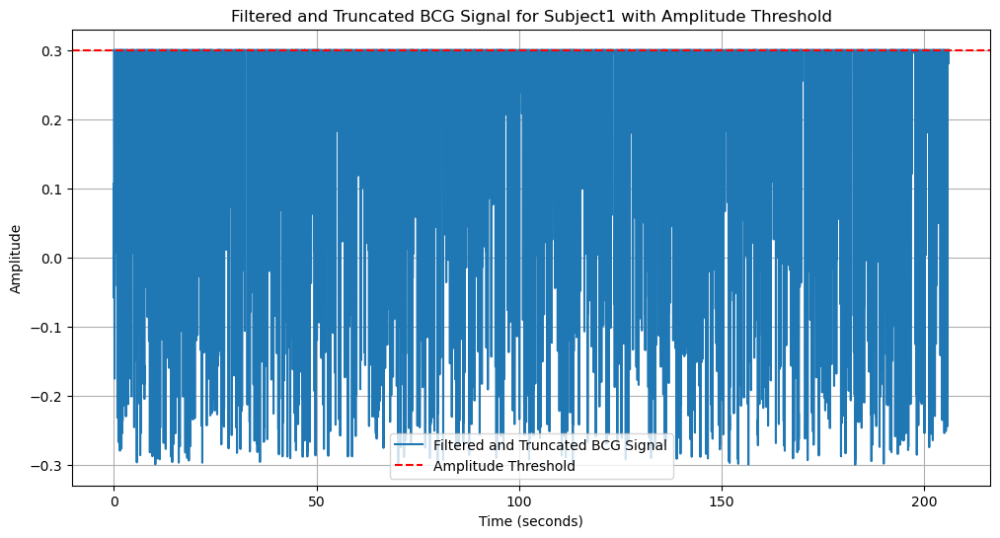

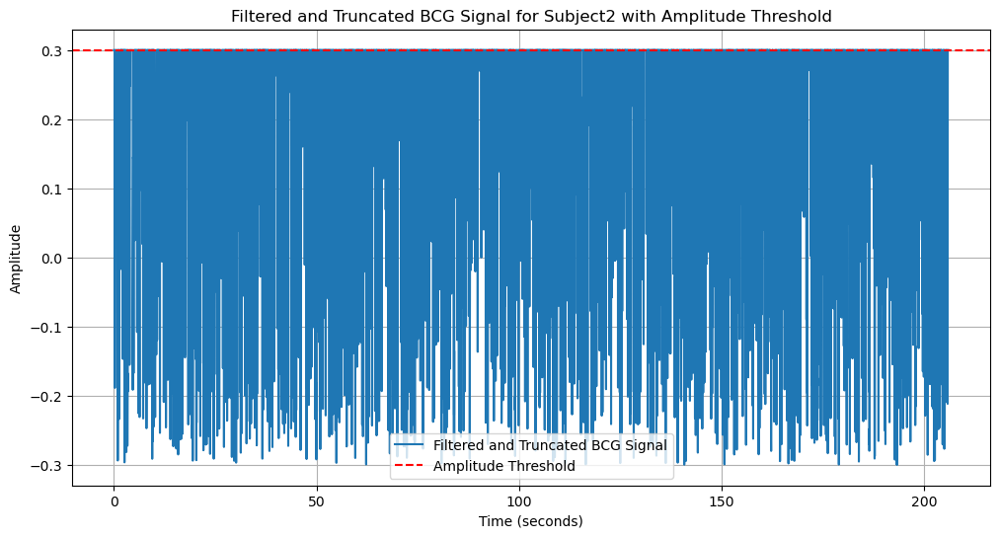

In [891]:
# Truncate the filtered signal at the amplitude threshold of 0.3
filtered_bcg_signal1_truncated = np.where(np.abs(filtered_bcg_signal1) > amplitude_threshold1, amplitude_threshold1, filtered_bcg_signal1)
filtered_bcg_signal2_truncated = np.where(np.abs(filtered_bcg_signal2) > amplitude_threshold1, amplitude_threshold1, filtered_bcg_signal2)
filtered_bcg_signal3_truncated = np.where(np.abs(filtered_bcg_signal3) > amplitude_threshold1, amplitude_threshold1, filtered_bcg_signal3)
filtered_bcg_signal4_truncated = np.where(np.abs(filtered_bcg_signal4) > amplitude_threshold1, amplitude_threshold1, filtered_bcg_signal4)
filtered_bcg_signal5_truncated = np.where(np.abs(filtered_bcg_signal5) > amplitude_threshold1, amplitude_threshold1, filtered_bcg_signal5)
filtered_bcg_signal6_truncated = np.where(np.abs(filtered_bcg_signal6) > amplitude_threshold1, amplitude_threshold1, filtered_bcg_signal6)
filtered_bcg_signal7_truncated = np.where(np.abs(filtered_bcg_signal7) > amplitude_threshold1, amplitude_threshold1, filtered_bcg_signal7)
filtered_bcg_signal8_truncated = np.where(np.abs(filtered_bcg_signal8) > amplitude_threshold1, amplitude_threshold1, filtered_bcg_signal8)
filtered_bcg_signal9_truncated = np.where(np.abs(filtered_bcg_signal9) > amplitude_threshold1, amplitude_threshold1, filtered_bcg_signal9)
filtered_bcg_signal10_truncated = np.where(np.abs(filtered_bcg_signal10) > amplitude_threshold1, amplitude_threshold1, filtered_bcg_signal10)

# Plot the filtered and truncated BCG signal for subject 1 with amplitude threshold
plt.figure(figsize=(12, 6))
plt.plot(segment_time1, filtered_bcg_signal1_truncated[:segment_samples1], label='Filtered and Truncated BCG Signal')
plt.axhline(y=amplitude_threshold1, color='r', linestyle='--', label='Amplitude Threshold')
plt.title("Filtered and Truncated BCG Signal for Subject1 with Amplitude Threshold")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)
plt.show()

# Plot the filtered and truncated BCG signal for subject 2 with amplitude threshold
plt.figure(figsize=(12, 6))
plt.plot(segment_time2, filtered_bcg_signal2_truncated[:segment_samples2], label='Filtered and Truncated BCG Signal')
plt.axhline(y=amplitude_threshold1, color='r', linestyle='--', label='Amplitude Threshold')
plt.title("Filtered and Truncated BCG Signal for Subject2 with Amplitude Threshold")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)
plt.show()



In [892]:
#!pip install PyWavelets

In [893]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pywt
from scipy.signal import butter, filtfilt
from scipy.interpolate import interp1d

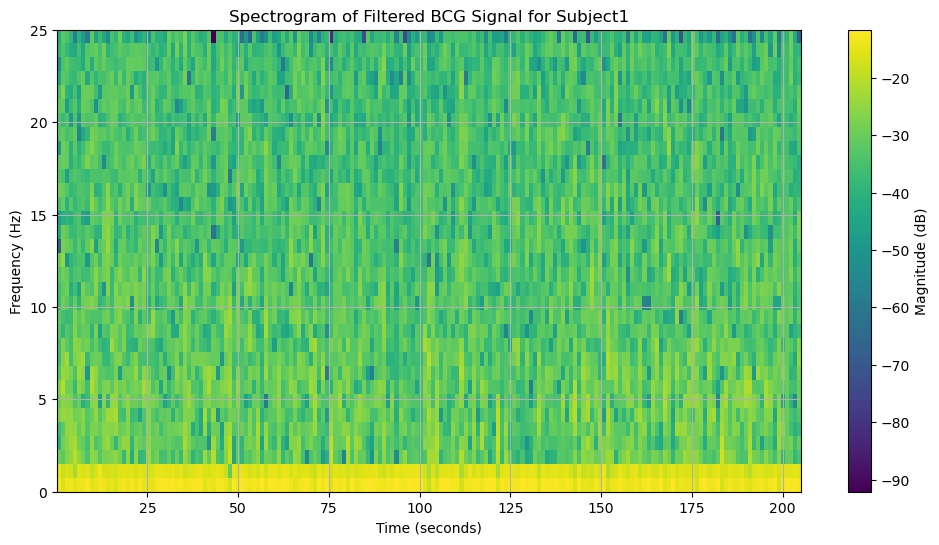

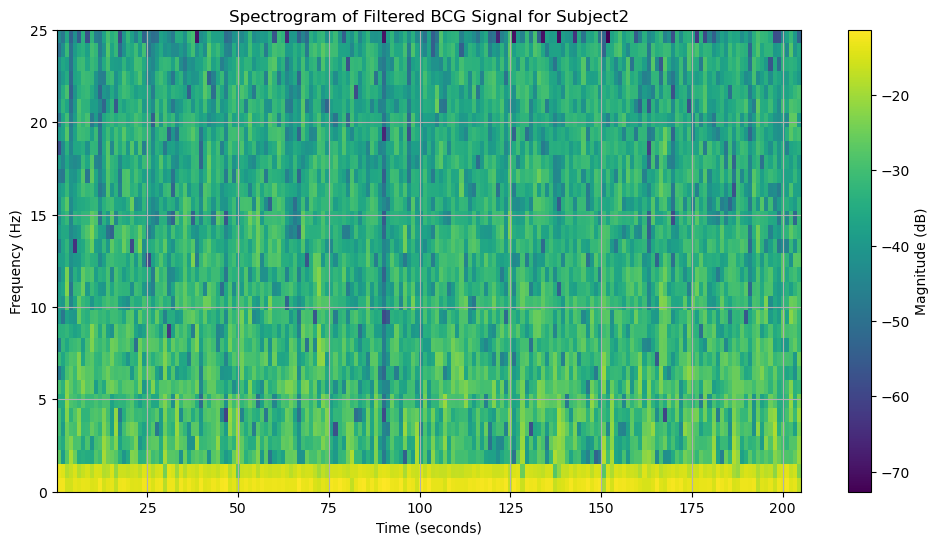

In [894]:
plt.figure(figsize=(12, 6))
plt.specgram(filtered_bcg_signal1_truncated, NFFT=64, Fs=fs, noverlap=8, cmap='viridis')
plt.title("Spectrogram of Filtered BCG Signal for Subject1")
plt.xlabel("Time (seconds)")
plt.ylabel("Frequency (Hz)")
plt.colorbar(label='Magnitude (dB)')
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 6))
plt.specgram(filtered_bcg_signal2_truncated, NFFT=64, Fs=fs, noverlap=8, cmap='viridis')
plt.title("Spectrogram of Filtered BCG Signal for Subject2")
plt.xlabel("Time (seconds)")
plt.ylabel("Frequency (Hz)")
plt.colorbar(label='Magnitude (dB)')
plt.grid(True)
plt.show()

In [895]:
#!pip install biosppy
#!pip install neurokit2

In [896]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pywt
from scipy.signal import butter, filtfilt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from biosppy.signals import ecg
from PyEMD import EEMD
#BioSPPy imports
#Local imports 
#signal processing
from scipy import signal
from scipy.ndimage import label
from scipy.stats import zscore
from scipy.interpolate import interp1d
from scipy.integrate import trapz
import neurokit2 as nk

In [897]:
#!pip install EMD-signal

# EEMD DECOMPOSITION PROCESS (SETTINGS TRIALS + ADDING GAUSSIAN NOISE + SETTING IMF LEVELS)

In [898]:
#Perform EEMD on the filtered BCG signal with added noise realizations

# Define the number of noise realizations to add
num_realizations = [100, 300]

# empty list to store noisy signals
noisy_signals_sub1 = []

# Add white Gaussian noise realizations to the filtered BCG signal
for realization in num_realizations:
    # Generate white Gaussian noise
    noise_sub1 = np.random.normal(0, np.std(filtered_bcg_signal1_truncated), len(filtered_bcg_signal1_truncated))
    # Combine noise with filtered BCG signal
    noisy_signal_sub1 = filtered_bcg_signal1_truncated + noise_sub1
    # Append the noisy signal to the list
    noisy_signals_sub1.append(noisy_signal_sub1)

# Initialize EEMD
eemd_sub1 = EEMD(trials=100)  

# Perform EEMD and average IMFs of the same level
avg_imfs_sub1 = []



#  empty list to store noisy signals
noisy_signals_sub2 = []

# Add white Gaussian noise realizations to the filtered BCG signal
for realization in num_realizations:
    # Generate white Gaussian noise
    noise_sub2 = np.random.normal(0, np.std(filtered_bcg_signal2_truncated), len(filtered_bcg_signal2_truncated))
    # Combine noise with filtered BCG signal
    noisy_signal_sub2 = filtered_bcg_signal2_truncated + noise_sub2
    # Append the noisy signal to the list
    noisy_signals_sub2.append(noisy_signal_sub2)

# Initialize EEMD
eemd_sub2 = EEMD(trials=100)  

# Perform EEMD and average IMFs of the same level
avg_imfs_sub2 = []




#  empty list to store noisy signals
noisy_signals_sub3 = []

# Add white Gaussian noise realizations to the filtered BCG signal
for realization in num_realizations:
    # Generate white Gaussian noise
    noise_sub3 = np.random.normal(0, np.std(filtered_bcg_signal3_truncated), len(filtered_bcg_signal3_truncated))
    # Combine noise with filtered BCG signal
    noisy_signal_sub3 = filtered_bcg_signal3_truncated + noise_sub3
    # Append the noisy signal to the list
    noisy_signals_sub3.append(noisy_signal_sub3)

# Initialize EEMD
eemd_sub3 = EEMD(trials=100)  

# Perform EEMD and average IMFs of the same level
avg_imfs_sub3 = []


#  empty list to store noisy signals
noisy_signals_sub4 = []

# Add white Gaussian noise realizations to the filtered BCG signal
for realization in num_realizations:
    # Generate white Gaussian noise
    noise_sub4 = np.random.normal(0, np.std(filtered_bcg_signal4_truncated), len(filtered_bcg_signal4_truncated))
    # Combine noise with filtered BCG signal
    noisy_signal_sub4 = filtered_bcg_signal4_truncated + noise_sub4
    # Append the noisy signal to the list
    noisy_signals_sub4.append(noisy_signal_sub4)

# Initialize EEMD
eemd_sub4 = EEMD(trials=100)  

# Perform EEMD and average IMFs of the same level
avg_imfs_sub4 = []




# Define the number of noise realizations to add
num_realizations = [100, 300]

#empty list to store noisy signals
noisy_signals_sub5 = []

# Add white Gaussian noise realizations to the filtered BCG signal
for realization in num_realizations:
    # Generate white Gaussian noise
    noise_sub5 = np.random.normal(0, np.std(filtered_bcg_signal5_truncated), len(filtered_bcg_signal5_truncated))
    # Combine noise with filtered BCG signal
    noisy_signal_sub5 = filtered_bcg_signal5_truncated + noise_sub5
    # Append the noisy signal to the list
    noisy_signals_sub5.append(noisy_signal_sub5)

# Initialize EEMD
eemd_sub5 = EEMD(trials=100)  

# Perform EEMD and average IMFs of the same level
avg_imfs_sub5 = []


In [899]:


#  empty list to store noisy signals
noisy_signals_sub6 = []

# Add white Gaussian noise realizations to the filtered BCG signal
for realization in num_realizations:
    # Generate white Gaussian noise
    noise_sub6 = np.random.normal(0, np.std(filtered_bcg_signal6_truncated), len(filtered_bcg_signal6_truncated))
    # Combine noise with filtered BCG signal
    noisy_signal_sub6 = filtered_bcg_signal6_truncated + noise_sub6
    # Append the noisy signal to the list
    noisy_signals_sub6.append(noisy_signal_sub6)

# Initialize EEMD
eemd_sub6 = EEMD(trials=100)  

# Perform EEMD and average IMFs of the same level
avg_imfs_sub6 = []




#  empty list to store noisy signals
noisy_signals_sub7 = []

# Add white Gaussian noise realizations to the filtered BCG signal
for realization in num_realizations:
    # Generate white Gaussian noise
    noise_sub7 = np.random.normal(0, np.std(filtered_bcg_signal7_truncated), len(filtered_bcg_signal7_truncated))
    # Combine noise with filtered BCG signal
    noisy_signal_sub7 = filtered_bcg_signal7_truncated + noise_sub7
    # Append the noisy signal to the list
    noisy_signals_sub7.append(noisy_signal_sub7)

# Initialize EEMD
eemd_sub7 = EEMD(trials=100)  #

# Perform EEMD and average IMFs of the same level
avg_imfs_sub7 = []


#  empty list to store noisy signals
noisy_signals_sub8 = []

# Add white Gaussian noise realizations to the filtered BCG signal
for realization in num_realizations:
    # Generate white Gaussian noise
    noise_sub8 = np.random.normal(0, np.std(filtered_bcg_signal8_truncated), len(filtered_bcg_signal8_truncated))
    # Combine noise with filtered BCG signal
    noisy_signal_sub8 = filtered_bcg_signal8_truncated + noise_sub8
    # Append the noisy signal to the list
    noisy_signals_sub8.append(noisy_signal_sub8)

# Initialize EEMD
eemd_sub8 = EEMD(trials=100)  

# Perform EEMD and average IMFs of the same level
avg_imfs_sub8 = []



# Define the number of noise realizations to add
num_realizations = [100, 300]

# Create an empty list to store noisy signals
noisy_signals_sub9 = []

# Add white Gaussian noise realizations to the filtered BCG signal
for realization in num_realizations:
    # Generate white Gaussian noise
    noise_sub9 = np.random.normal(0, np.std(filtered_bcg_signal9_truncated), len(filtered_bcg_signal9_truncated))
    # Combine noise with filtered BCG signal
    noisy_signal_sub9 = filtered_bcg_signal9_truncated + noise_sub9
    # Append the noisy signal to the list
    noisy_signals_sub9.append(noisy_signal_sub9)

# Initialize EEMD
eemd_sub9 = EEMD(trials=100)  

# Perform EEMD and average IMFs of the same level
avg_imfs_sub9 = []




# Create an empty list to store noisy signals
noisy_signals_sub10 = []

# Add white Gaussian noise realizations to the filtered BCG signal
for realization in num_realizations:
    # Generate white Gaussian noise
    noise_sub10 = np.random.normal(0, np.std(filtered_bcg_signal10_truncated), len(filtered_bcg_signal10_truncated))
    # Combine noise with filtered BCG signal
    noisy_signal_sub10 = filtered_bcg_signal10_truncated + noise_sub10
    # Append the noisy signal to the list
    noisy_signals_sub10.append(noisy_signal_sub10)

# Initialize EEMD
eemd_sub10 = EEMD(trials=100)  

# Perform EEMD and average IMFs of the same level
avg_imfs_sub10 = []

# EEMD DECOMPOSITION PROCESS FOR SUBJECT 1 - 10

# SUBJECT 1

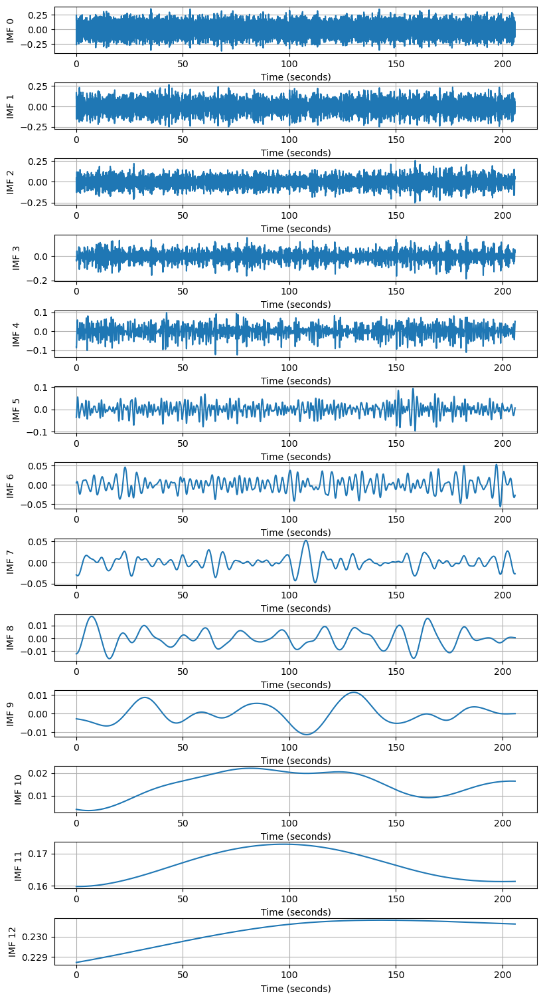

Combined plot saved successfully.


In [900]:
for i, noisy_signal_sub1 in enumerate(noisy_signals_sub1):
    imfs_sub1 = eemd_sub1.eemd(noisy_signal_sub1)
    if i == 0:
        avg_imfs_sub1 = imfs_sub1
    else:
        avg_imfs_sub1 += imfs_sub1

avg_imfs_sub1 /= len(noisy_signals_sub1)

# Plot each average IMF in separate, individual plots
num_imfs_sub1 = avg_imfs_sub1.shape[0]

fig, axs = plt.subplots(num_imfs_sub1, 1, figsize=(8, 15))
fig.tight_layout()

for i in range(num_imfs_sub1):
    ax = axs[i]

    ax.plot(segment_time1, avg_imfs_sub1[i, :segment_samples1])
    #ax.set_title(f"Averaged IMF from EEMD")
    ax.set_xlabel("Time (seconds)")
    ax.set_ylabel(f"IMF {i}")
    ax.grid(True)

# Save the combined plots as an image
plt.savefig('IMF Decomposition for subject 1.png', dpi=300)  
plt.show()
plt.close() 



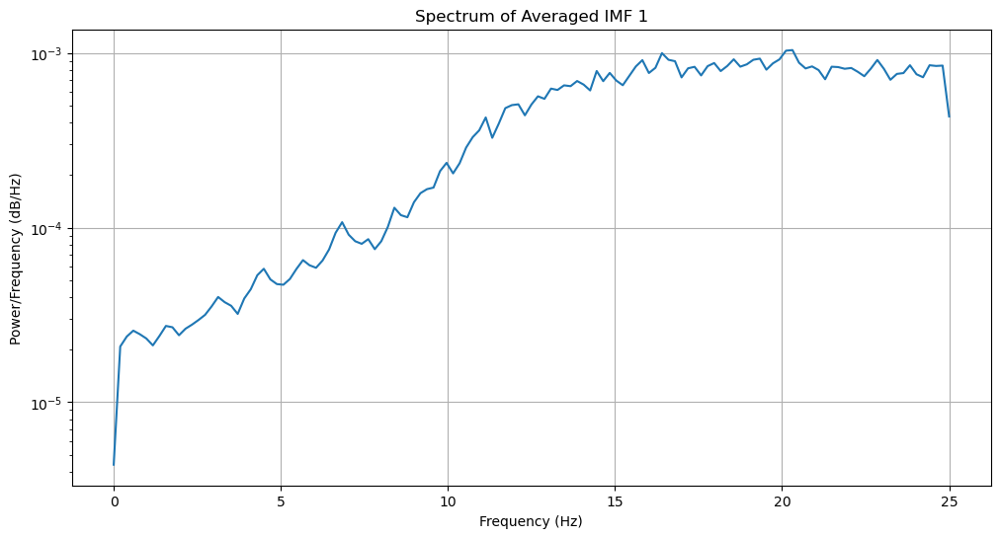

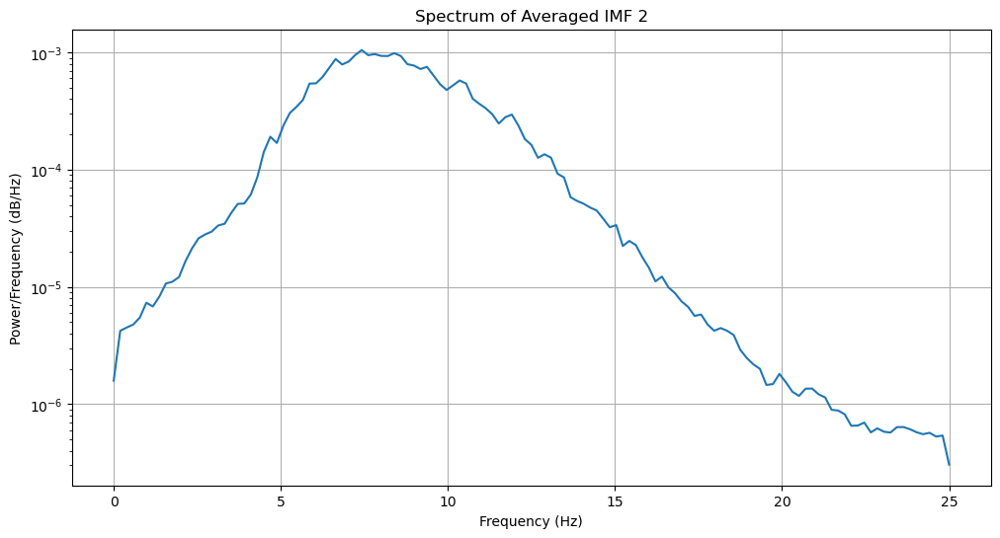

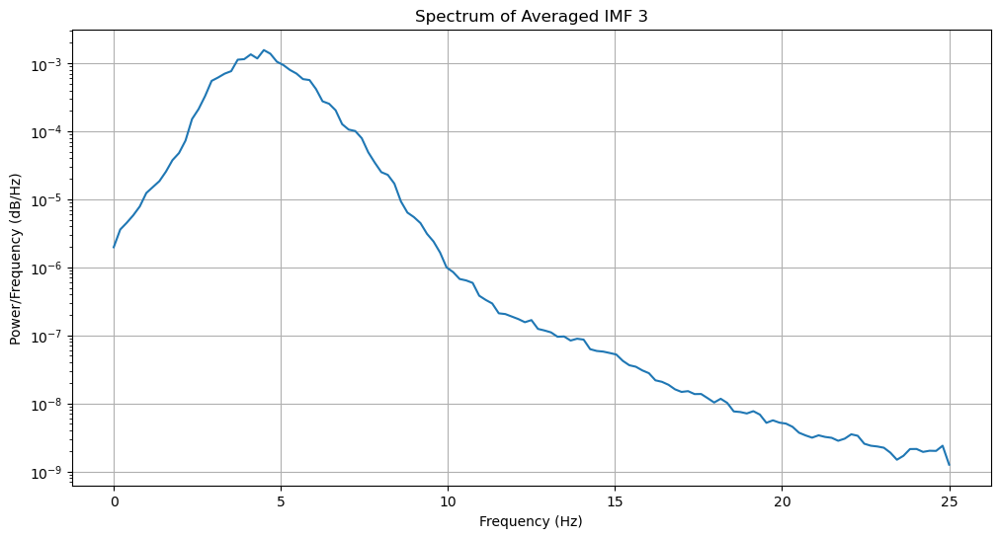

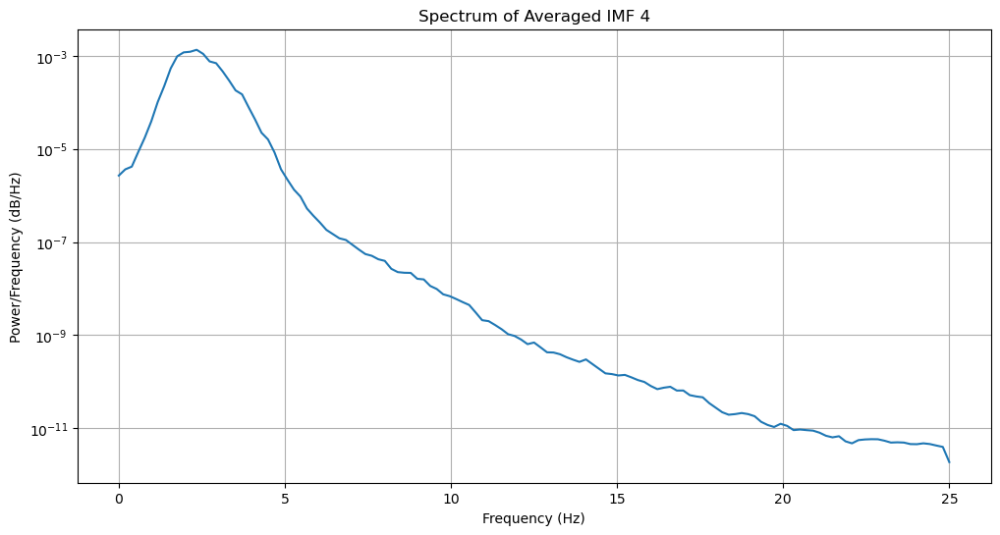

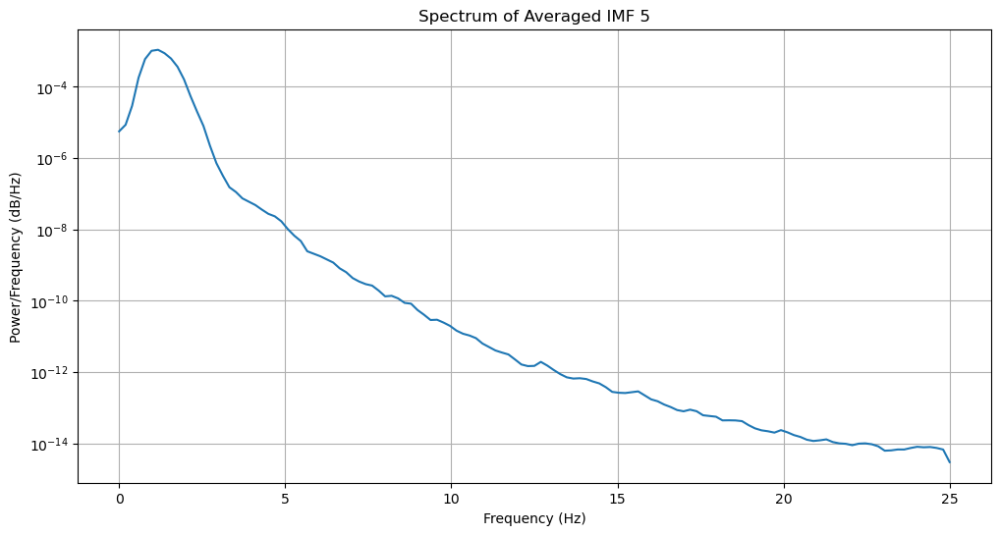

...

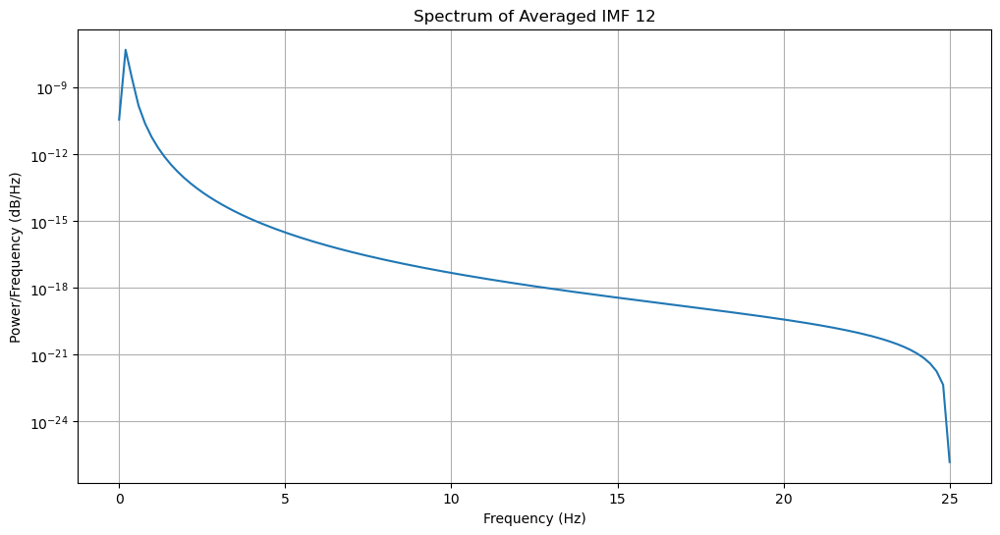

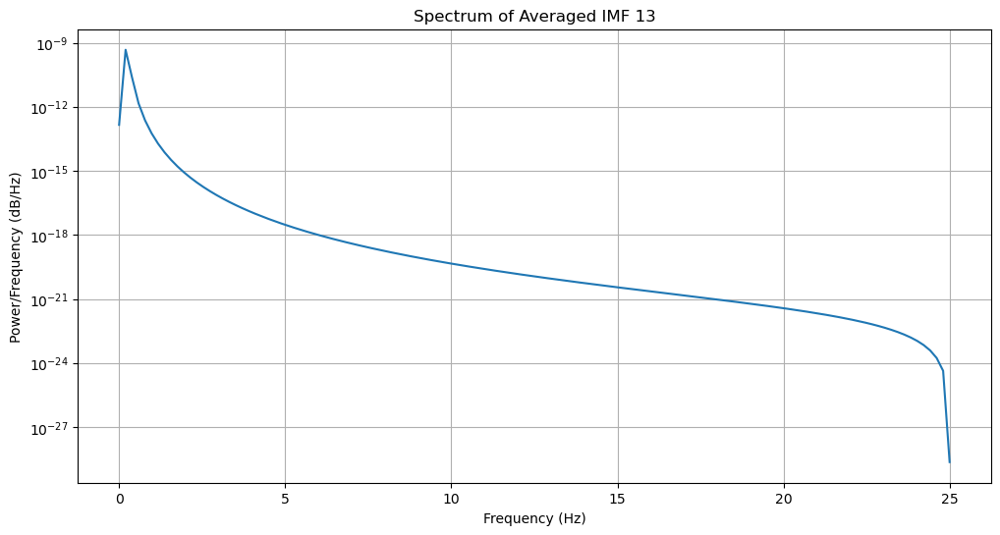

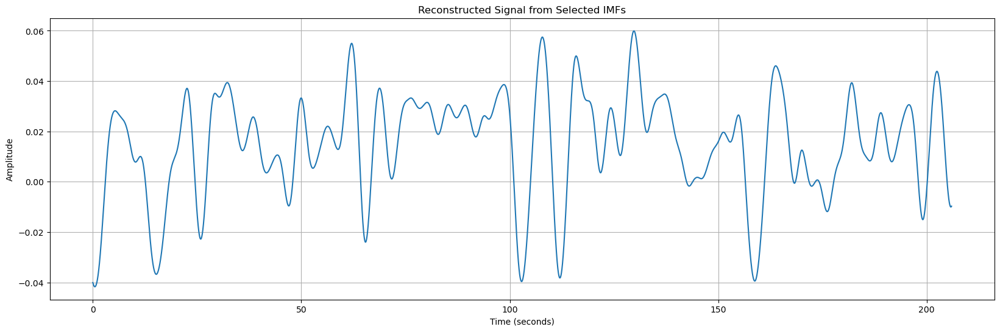

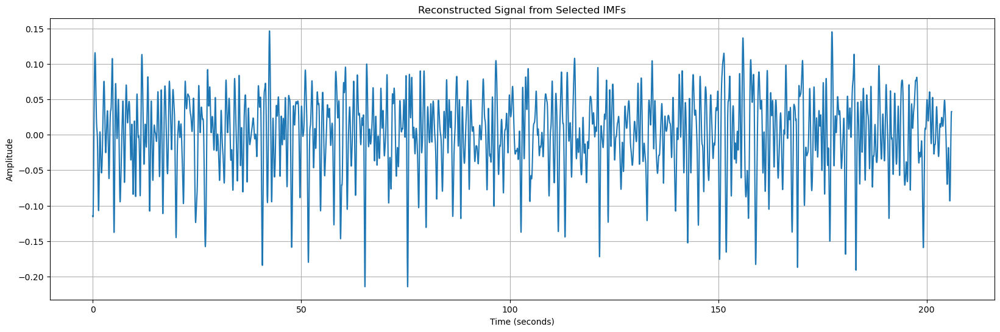

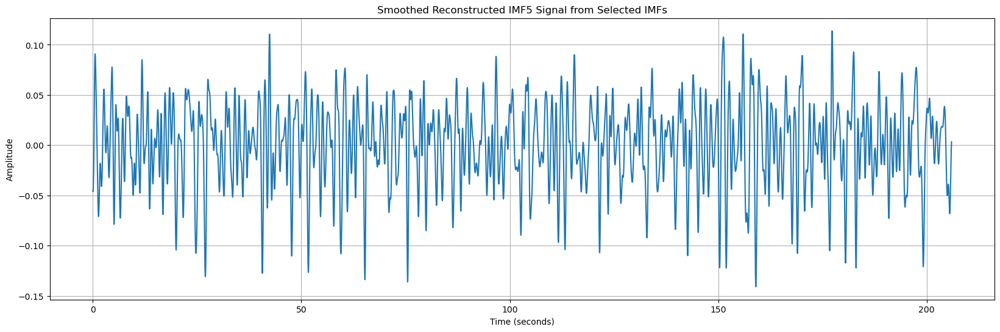

In [901]:
# Import the necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from PyEMD import EEMD
from scipy.fft import fft
from scipy.signal import welch

# Function to calculate and plot the frequency spectrum
def plot_frequency_spectrum(signal, fs, title):
    f, Pxx = welch(signal, fs, nperseg=256)
    plt.figure(figsize=(12, 6))
    plt.semilogy(f, Pxx)
    plt.title(title)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power/Frequency (dB/Hz)")
    plt.grid(True)
    plt.show()

for i in range(num_imfs_sub1):
    plot_frequency_spectrum(avg_imfs_sub1[i, :], fs, f"Spectrum of Averaged IMF {i+1}")
    
    
#  indices of the desired IMFs
selected_imf_indices = [7,8, 9,10]  

# Initialize the reconstructed signal
reconstructed_signal = np.zeros_like(avg_imfs_sub1[selected_imf_indices[0]])

# Add the selected IMFs to the reconstructed signal
for index in selected_imf_indices:
    reconstructed_signal += avg_imfs_sub1[index]

# Plot the reconstructed signal
plt.figure(figsize=(20, 6))
plt.plot(segment_time1, reconstructed_signal[:segment_samples1])
plt.title("Reconstructed Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()


#  indices of the desired IMFs
selected_imf_indices = [4,5,6]  

# Initialize the reconstructed signal
reconstructed_signal1 = np.zeros_like(avg_imfs_sub1[selected_imf_indices[0]])

# Add the selected IMFs to the reconstructed signal
for index in selected_imf_indices:
    reconstructed_signal1 += avg_imfs_sub1[index]

# Plot the reconstructed signal
plt.figure(figsize=(20, 6))
plt.plot(segment_time1, reconstructed_signal1[:segment_samples1])
plt.title("Reconstructed Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

# window size for the SMOOTHING moving average
window_size = 23

# Calculate the moving average
smoothed_reconstructed_signal12 = np.convolve(reconstructed_signal1, np.ones(window_size)/window_size, mode='same')

# Plot the smoothed reconstructed signal
plt.figure(figsize=(20, 6))
plt.plot(segment_time1, smoothed_reconstructed_signal12[:segment_samples1])
plt.title("Smoothed Reconstructed IMF5 Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()


# SUBJECT 2

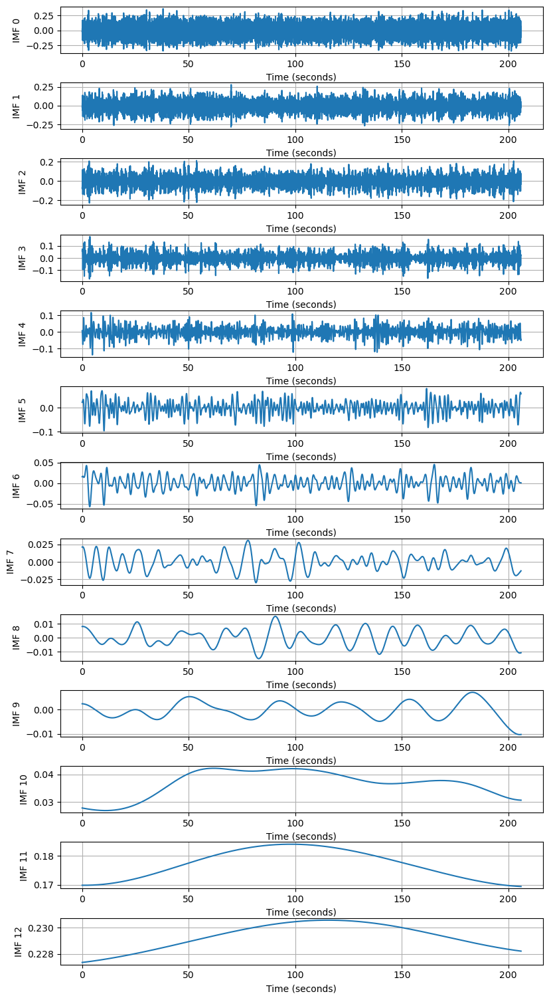

Combined plot saved successfully.


In [902]:
for i, noisy_signal_sub2 in enumerate(noisy_signals_sub2):
    imfs_sub2 = eemd_sub2.eemd(noisy_signal_sub2)
    if i == 0:
        avg_imfs_sub2 = imfs_sub2
    else:
        avg_imfs_sub2 += imfs_sub2

avg_imfs_sub2 /= len(noisy_signals_sub2)


num_imfs_sub2 = avg_imfs_sub2.shape[0]

# Create a single column grid of subplots with 13 rows
fig, axs = plt.subplots(num_imfs_sub2, 1, figsize=(8, 15))
fig.tight_layout()

for i in range(num_imfs_sub2):
    ax = axs[i]

    ax.plot(segment_time2, avg_imfs_sub2[i, :segment_samples2])
    #ax.set_title(f"Averaged IMF from EEMD")
    ax.set_xlabel("Time (seconds)")
    ax.set_ylabel(f"IMF {i}")
    ax.grid(True)

# Save the combined plots as an image
plt.savefig('IMF Decomposition for subject 2.png', dpi=300)  
plt.show()
plt.close()  


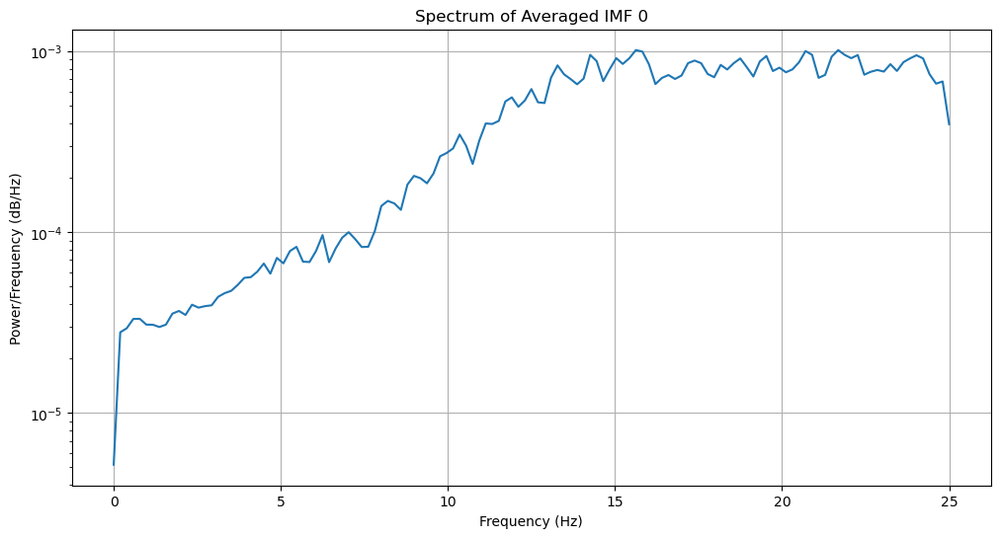

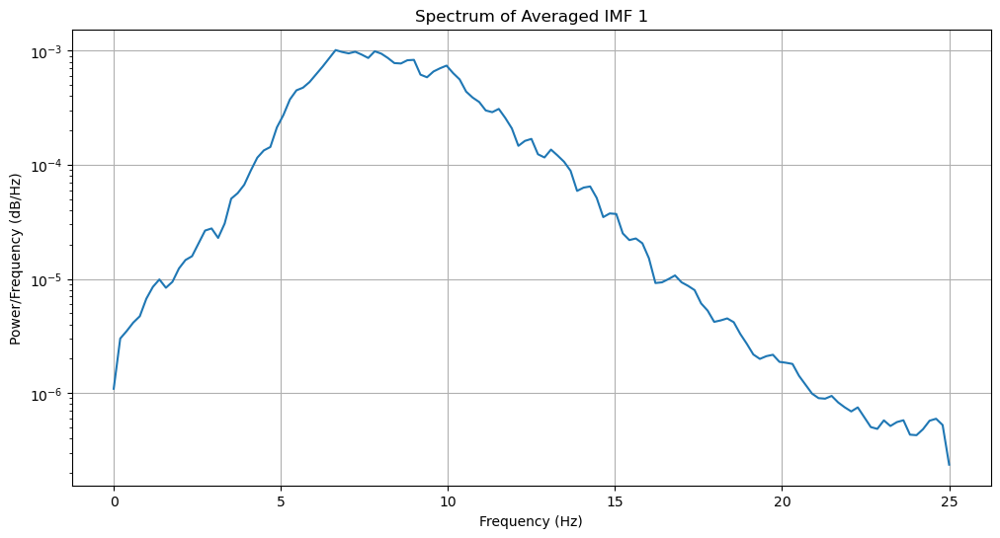

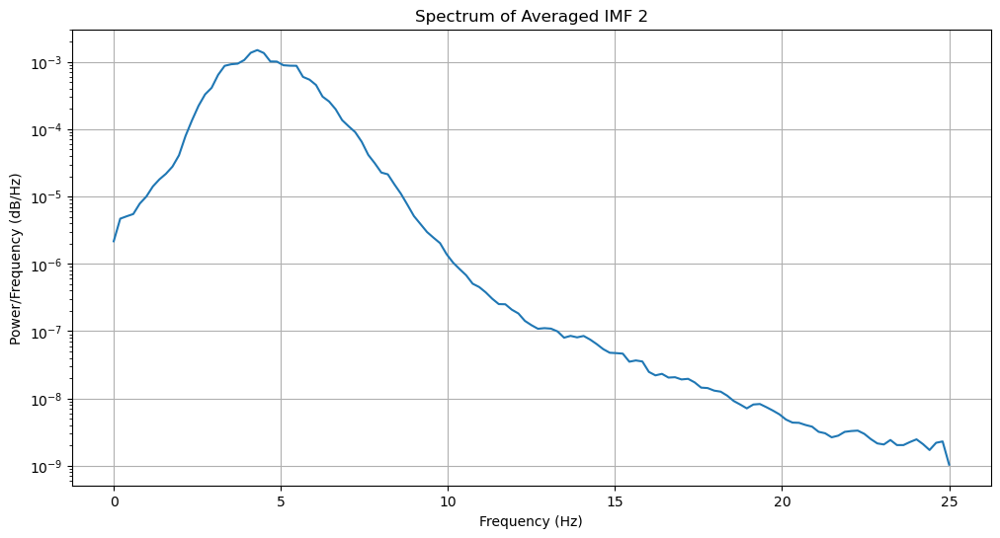

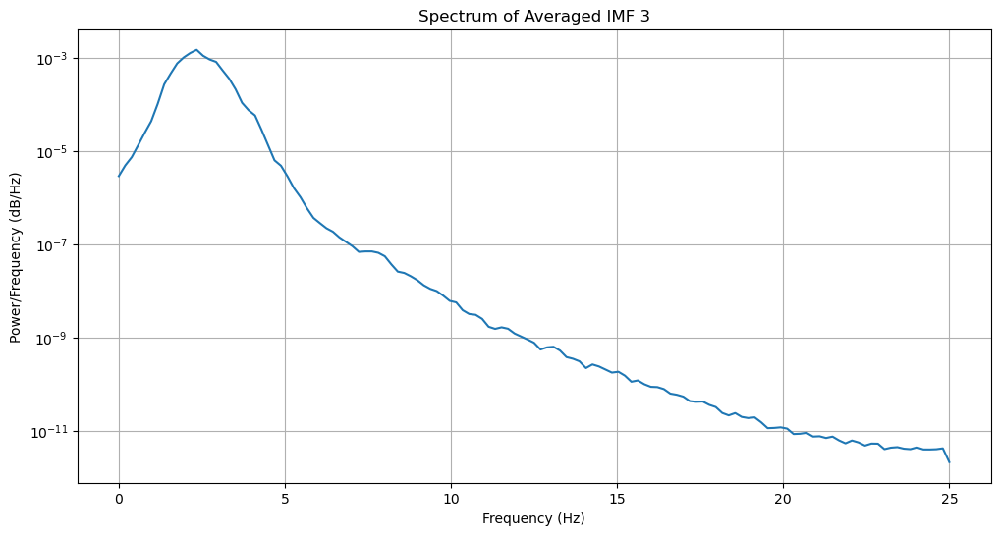

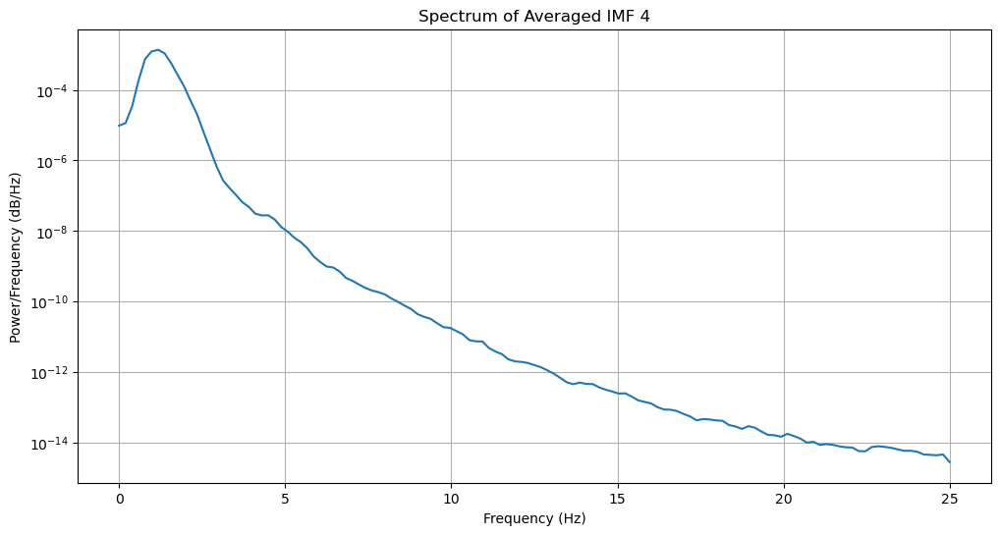

...

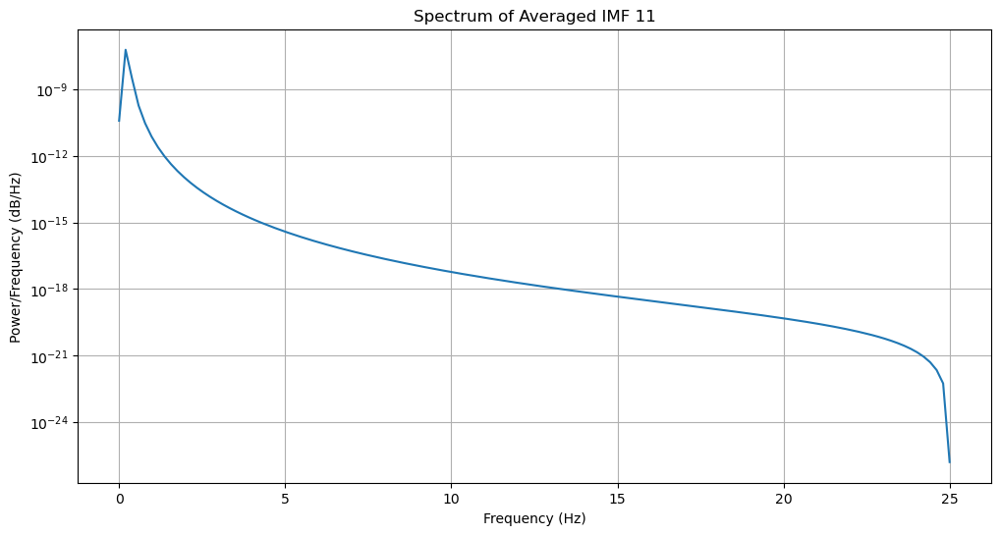

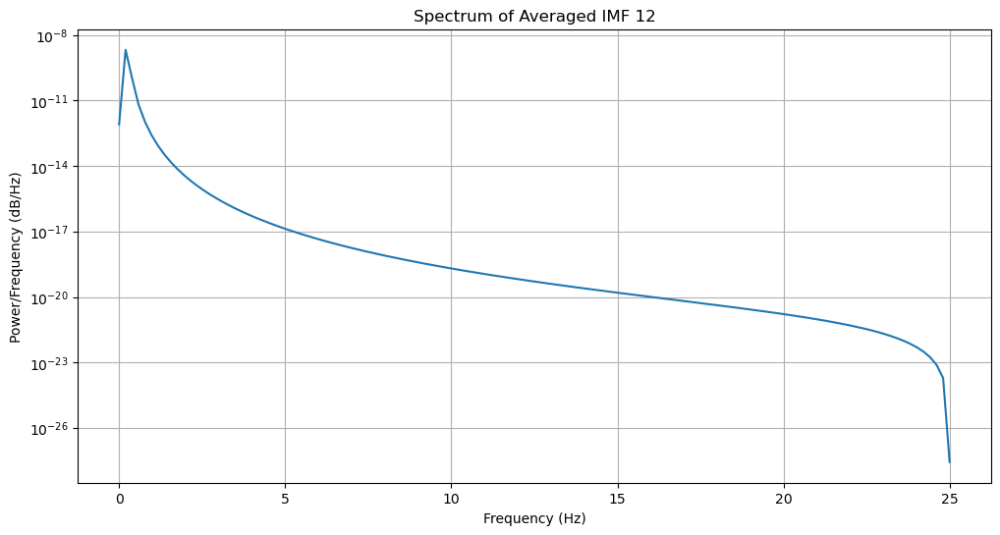

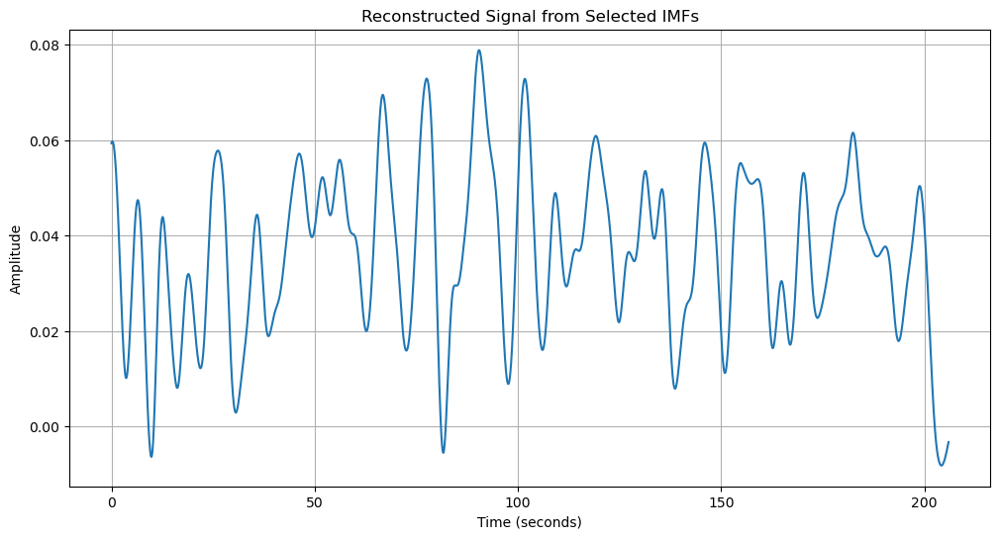

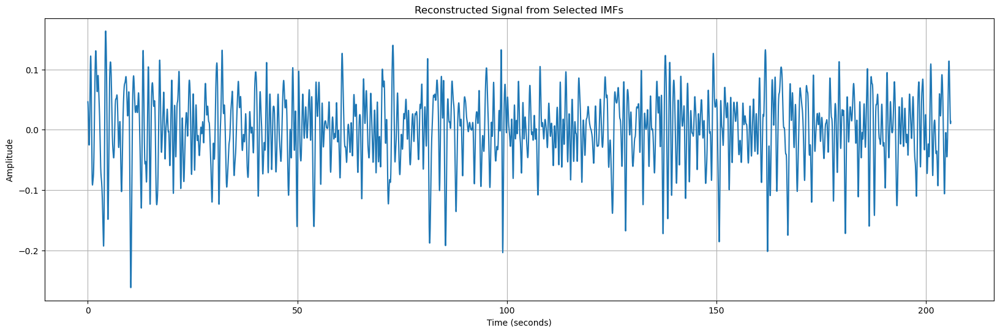

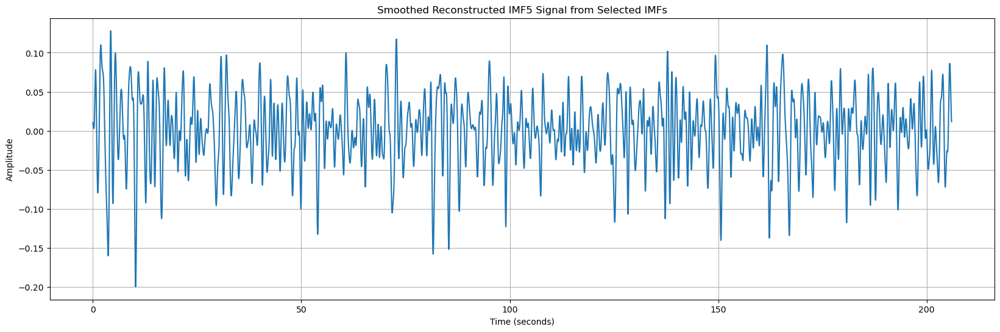

In [903]:
# Import the necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from PyEMD import EEMD
from scipy.fft import fft
from scipy.signal import welch

# Function to calculate and plot the frequency spectrum
def plot_frequency_spectrum(signal, fs, title):
    f, Pxx = welch(signal, fs, nperseg=256)
    plt.figure(figsize=(12, 6))
    plt.semilogy(f, Pxx)
    plt.title(title)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power/Frequency (dB/Hz)")
    plt.grid(True)
    plt.show()

for i in range(num_imfs_sub2):
    plot_frequency_spectrum(avg_imfs_sub2[i, :], fs, f"Spectrum of Averaged IMF {i}")
    
    
#  indices of the desired IMFs
selected_imf_indices = [7,8, 9,10]  

# Initialize the reconstructed signal
reconstructed_signal_sub21 = np.zeros_like(avg_imfs_sub2[selected_imf_indices[0]])

# Add the selected IMFs to the reconstructed signal
for index in selected_imf_indices:
    reconstructed_signal_sub21 += avg_imfs_sub2[index]

# Plot the reconstructed signal
plt.figure(figsize=(12, 6))
plt.plot(segment_time2, reconstructed_signal_sub21[:segment_samples2])
plt.title("Reconstructed Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()


#  indices of the desired IMFs
selected_imf_indices = [4,5,6]
                        

# Initialize the reconstructed signal
reconstructed_signal2 = np.zeros_like(avg_imfs_sub2[selected_imf_indices[0]])

# Add the selected IMFs to the reconstructed signal
for index in selected_imf_indices:
    reconstructed_signal2 += avg_imfs_sub2[index]

# Plot the reconstructed signal
plt.figure(figsize=(20, 6))
plt.plot(segment_time2, reconstructed_signal2[:segment_samples2])
plt.title("Reconstructed Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

# window size for the SMOOTHING moving average
window_size = 23

#  empty array for the smoothed signal
smoothed_cardiac_signal_sub22 = np.zeros_like(reconstructed_signal2)

# Apply the moving average smoothing
for i in range(len(reconstructed_signal2)):
    start_idx = max(0, i - window_size // 2)
    end_idx = min(len(reconstructed_signal2), i + window_size // 2 + 3)
    smoothed_cardiac_signal_sub22[i] = np.mean(reconstructed_signal2[start_idx:end_idx])

# Calculate the moving average
smoothed_reconstructed_signal22 = np.convolve(reconstructed_signal2, np.ones(window_size)/window_size, mode='same')

# Plot the smoothed reconstructed signal
plt.figure(figsize=(20, 6))
plt.plot(segment_time2, smoothed_reconstructed_signal22[:segment_samples2])
plt.title("Smoothed Reconstructed IMF5 Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

# SUBJECT 3

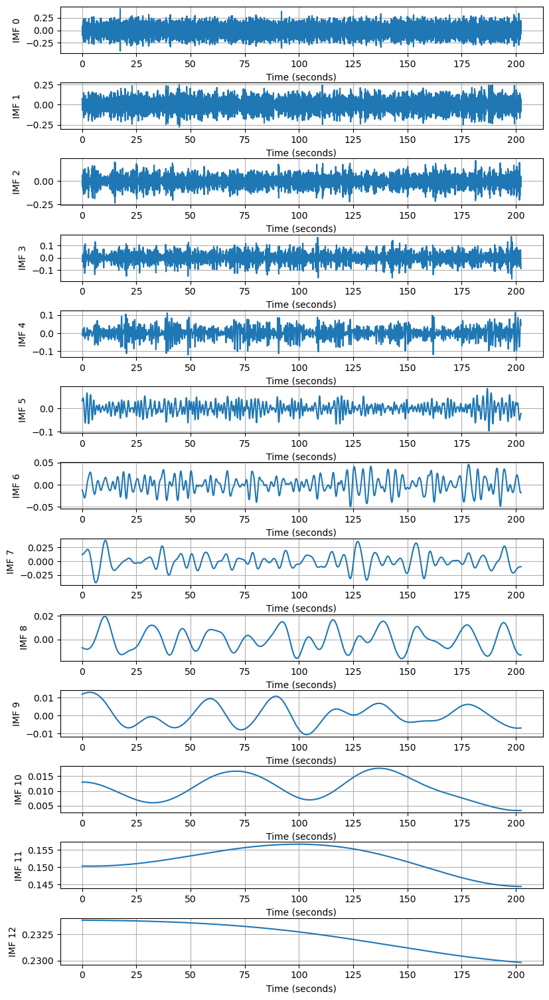

Combined plot saved successfully.


In [904]:
for i, noisy_signal_sub3 in enumerate(noisy_signals_sub3):
    imfs_sub3 = eemd_sub3.eemd(noisy_signal_sub3)
    if i == 0:
        avg_imfs_sub3 = imfs_sub3
    else:
        avg_imfs_sub3 += imfs_sub3

avg_imfs_sub3 /= len(noisy_signals_sub3)

num_imfs_sub3 = avg_imfs_sub3.shape[0]


# Create a single column grid of subplots with 13 rows
fig, axs = plt.subplots(num_imfs_sub3, 1, figsize=(8, 15))
fig.tight_layout()

for i in range(num_imfs_sub3):
    ax = axs[i]

    ax.plot(segment_time3, avg_imfs_sub3[i, :segment_samples3])
    #ax.set_title(f"Averaged IMF from EEMD")
    ax.set_xlabel("Time (seconds)")
    ax.set_ylabel(f"IMF {i}")
    ax.grid(True)

# Save the combined  plots as an image
plt.savefig('IMF Decomposition for subject 1.png', dpi=300)  
plt.show()
plt.close() 



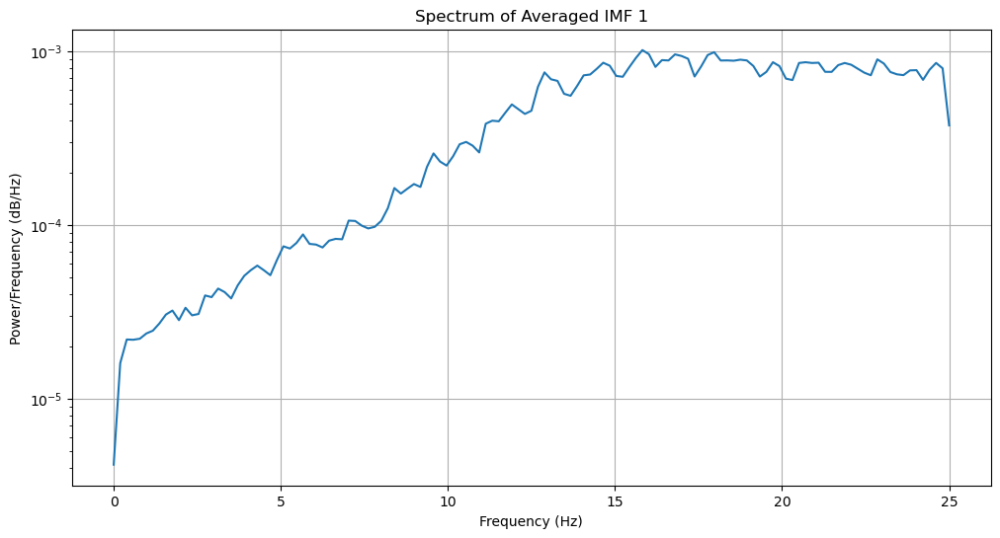

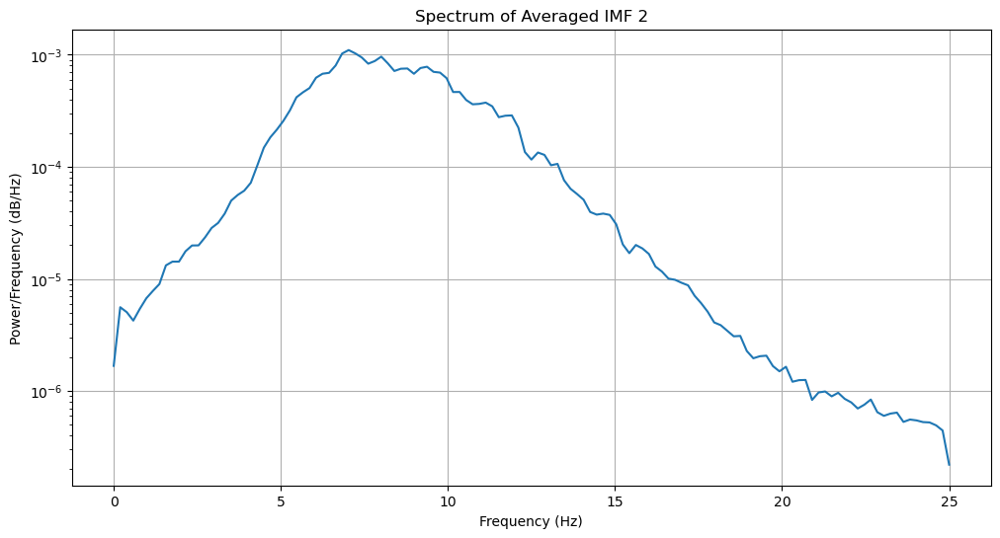

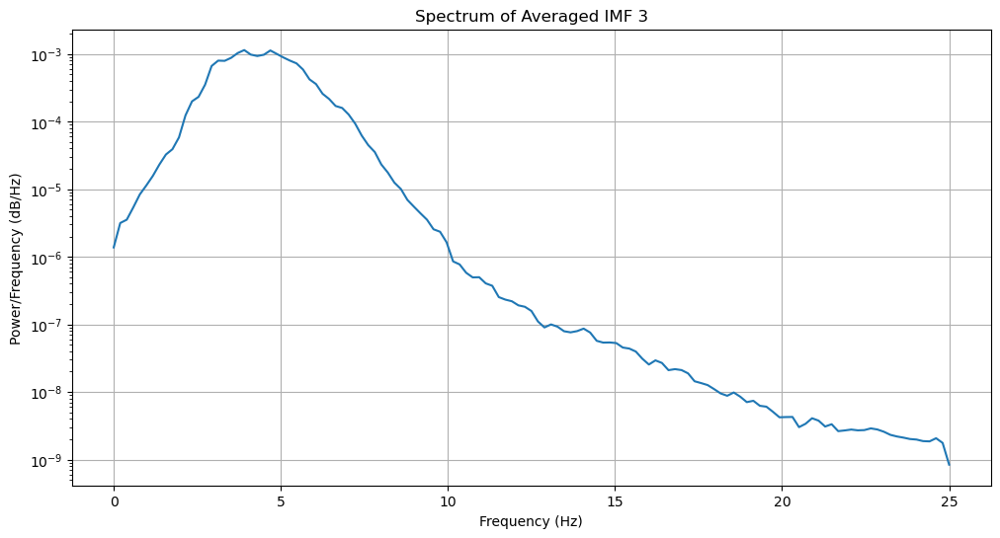

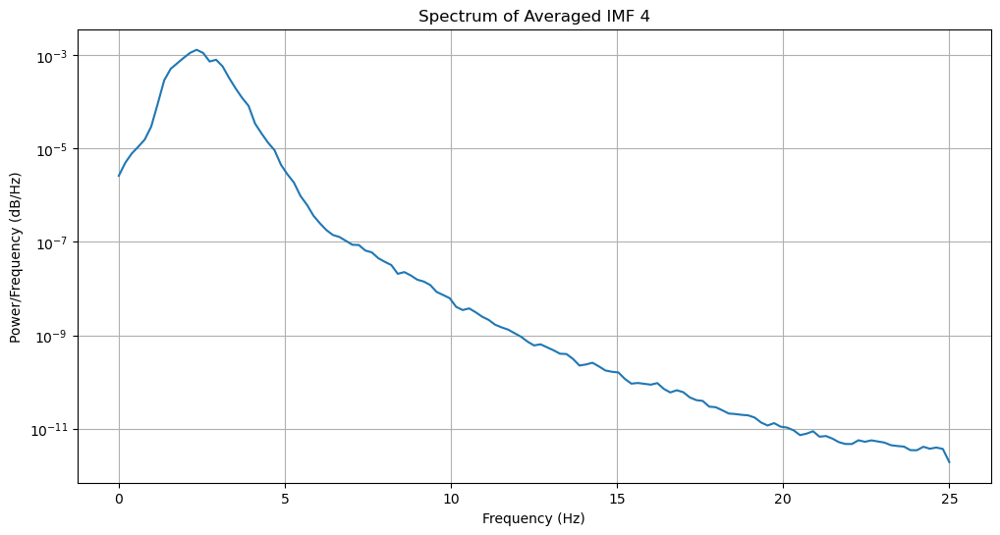

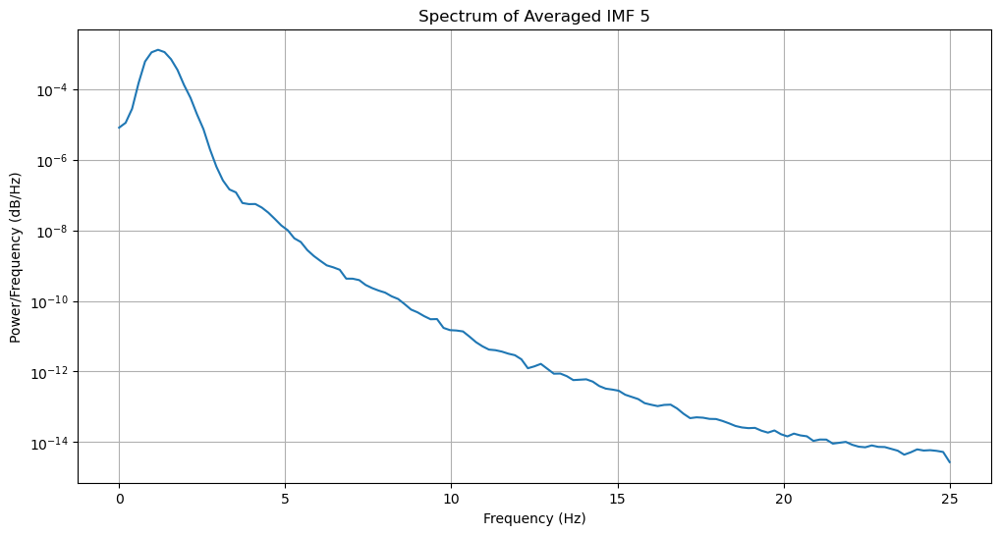

...

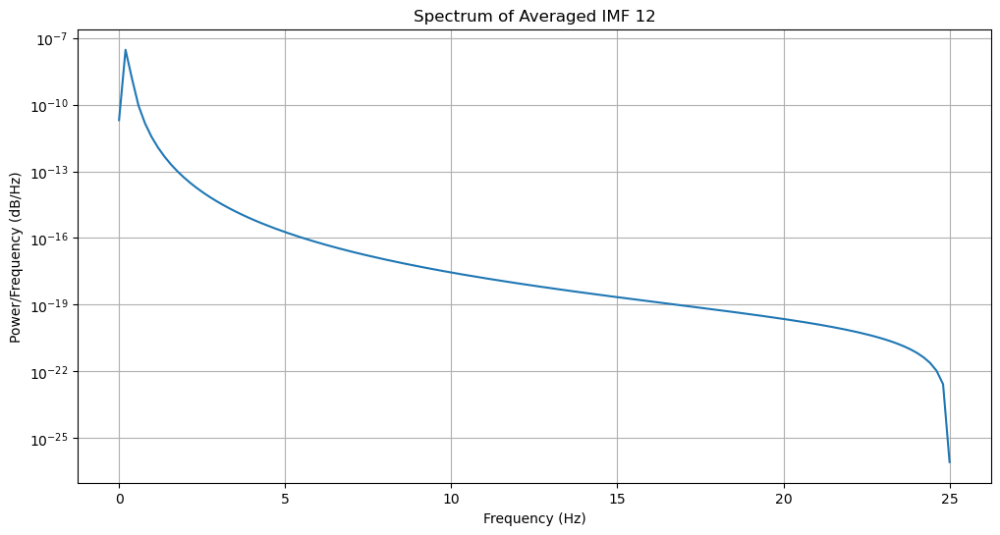

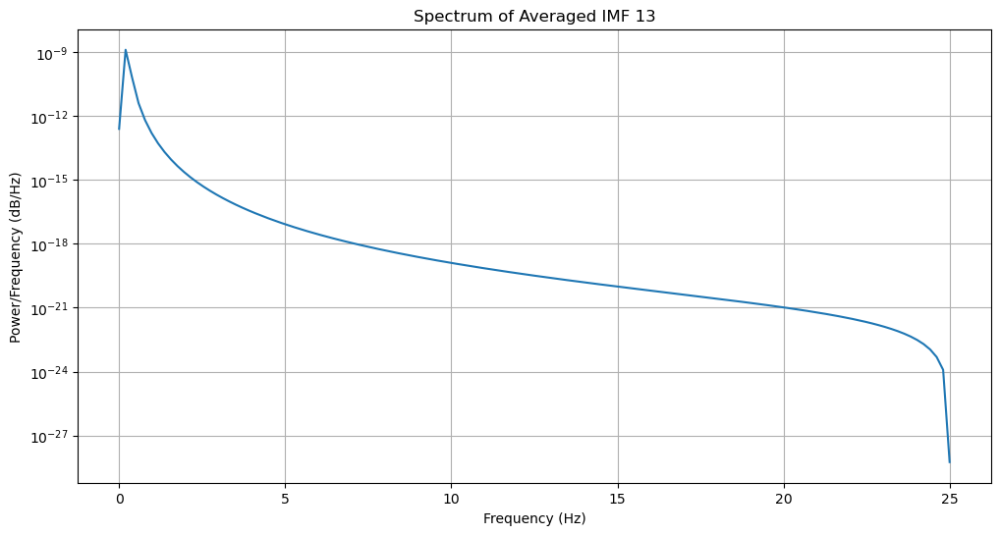

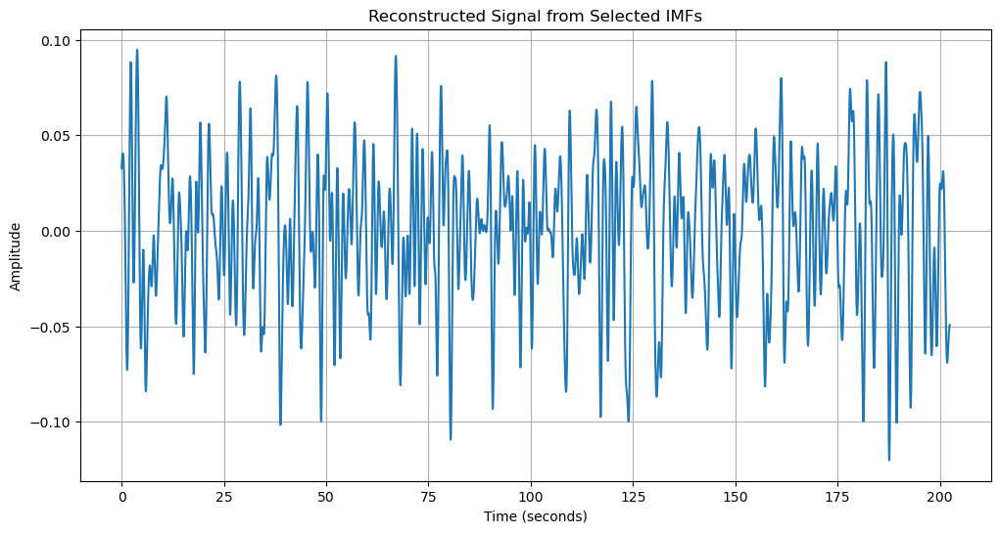

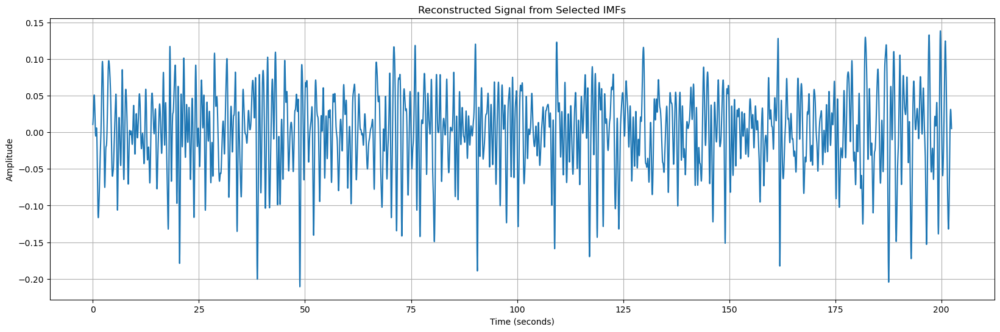

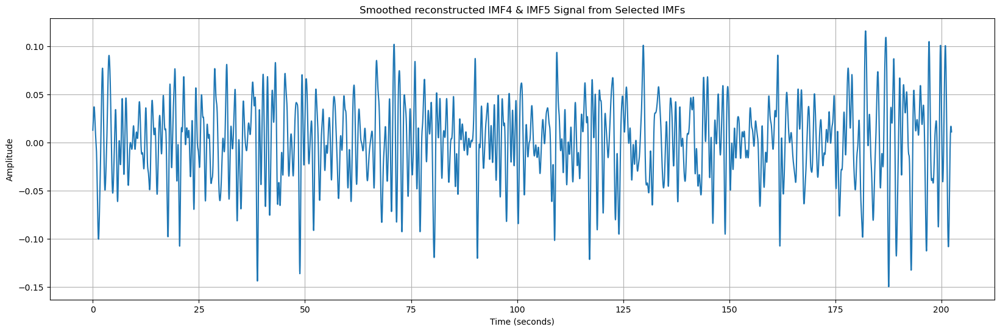

In [905]:
# Import the necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from PyEMD import EEMD
from scipy.fft import fft
from scipy.signal import welch

# Function to calculate and plot the frequency spectrum
def plot_frequency_spectrum(signal, fs, title):
    f, Pxx = welch(signal, fs, nperseg=256)
    plt.figure(figsize=(12, 6))
    plt.semilogy(f, Pxx)
    plt.title(title)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power/Frequency (dB/Hz)")
    plt.grid(True)
    plt.show()

for i in range(num_imfs_sub3):
    plot_frequency_spectrum(avg_imfs_sub3[i, :], fs, f"Spectrum of Averaged IMF {i+1}")
    
    
# indices of the desired IMFs
selected_imf_indices = [5,6,7]  

# Initialize the reconstructed signal
reconstructed_signal_sub32 = np.zeros_like(avg_imfs_sub3[selected_imf_indices[0]])

# Add the selected IMFs to the reconstructed signal
for index in selected_imf_indices:
    reconstructed_signal_sub32 += avg_imfs_sub3[index]

# Plot the reconstructed signal
plt.figure(figsize=(12, 6))
plt.plot(segment_time3, reconstructed_signal_sub32[:segment_samples3])
plt.title("Reconstructed Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()


#  indices of the desired IMFs
selected_imf_indices = [4,5,6]  

# Initialize the reconstructed signal
reconstructed_signal3 = np.zeros_like(avg_imfs_sub3[selected_imf_indices[0]])

# Add the selected IMFs to the reconstructed signal
for index in selected_imf_indices:
    reconstructed_signal3 += avg_imfs_sub3[index]

# Plot the reconstructed signal
plt.figure(figsize=(20, 6))
plt.plot(segment_time3, reconstructed_signal3[:segment_samples3])
plt.title("Reconstructed Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

from scipy.signal import savgol_filter


# empty array for the smoothed signal
smoothed_cardiac_signal_sub32 = np.zeros_like(reconstructed_signal3)

# window size for the SMOOTHING moving average
window_size = 23

# Calculate the moving average
smoothed_reconstructed_signal32 = np.convolve(reconstructed_signal3, np.ones(window_size)/window_size, mode='same')

#Plot the smoothed reconstructed signal
plt.figure(figsize=(20, 6))
plt.plot(segment_time3, smoothed_reconstructed_signal32[:segment_samples3])
plt.title("Smoothed reconstructed IMF4 & IMF5 Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

# SUBJECT 4

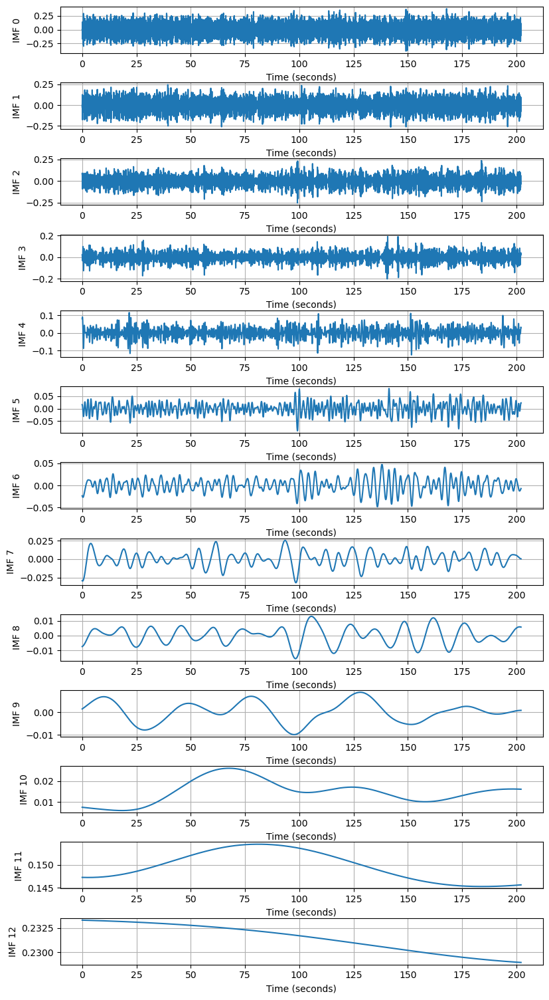

Combined plot saved successfully.


In [908]:
for i, noisy_signal_sub4 in enumerate(noisy_signals_sub4):
    imfs_sub4 = eemd_sub4.eemd(noisy_signal_sub4)
    if i == 0:
        avg_imfs_sub4 = imfs_sub4
    else:
        avg_imfs_sub4 += imfs_sub4

avg_imfs_sub4 /= len(noisy_signals_sub4)

# Plot each average IMF in separate, individual plots for subject 4
num_imfs_sub4 = avg_imfs_sub4.shape[0]

# Create a single column grid of subplots with 13 rows for subject 4
fig, axs = plt.subplots(num_imfs_sub4, 1, figsize=(8, 15))
fig.tight_layout()

for i in range(num_imfs_sub4):
    ax = axs[i]

    ax.plot(segment_time4, avg_imfs_sub4[i, :segment_samples4])
    #ax.set_title(f"Averaged IMF from EEMD")
    ax.set_xlabel("Time (seconds)")
    ax.set_ylabel(f"IMF {i}")
    ax.grid(True)

# Save the combined  plots as an image
plt.savefig('combined_plots3.png', dpi=300)  
plt.show()
plt.close()  

    

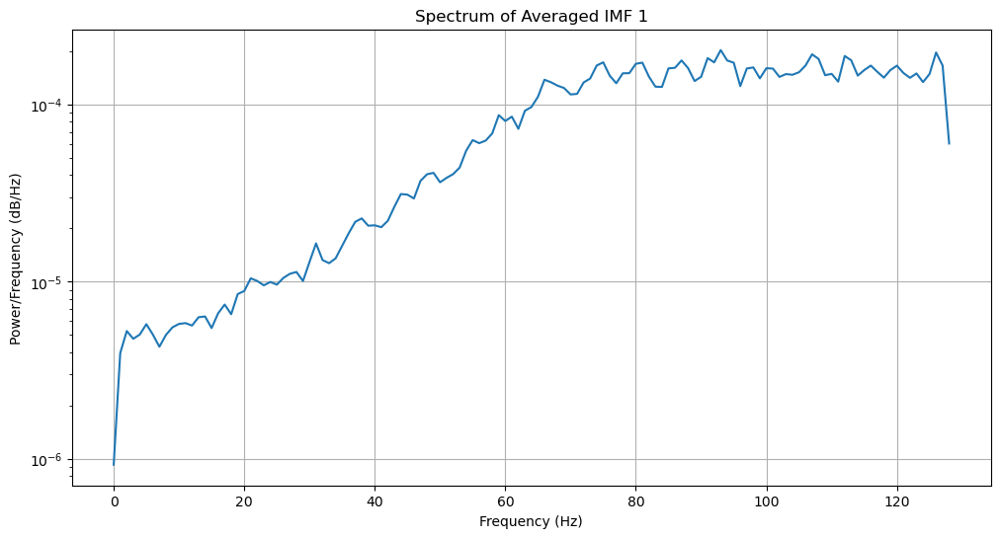

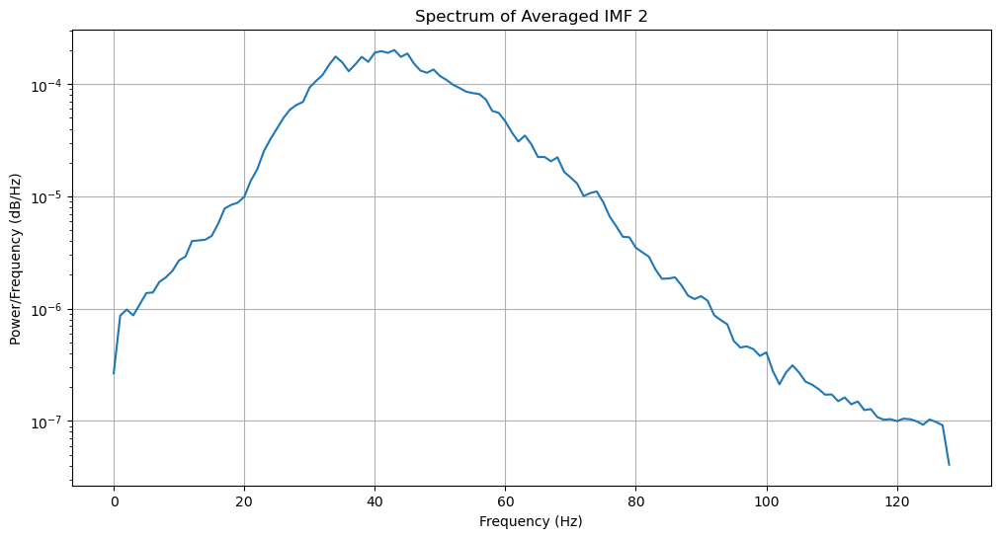

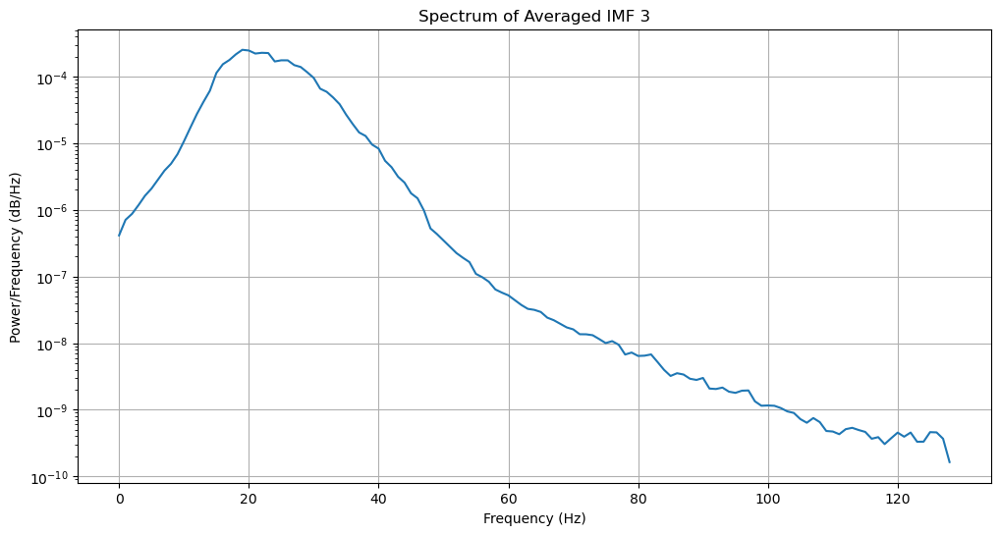

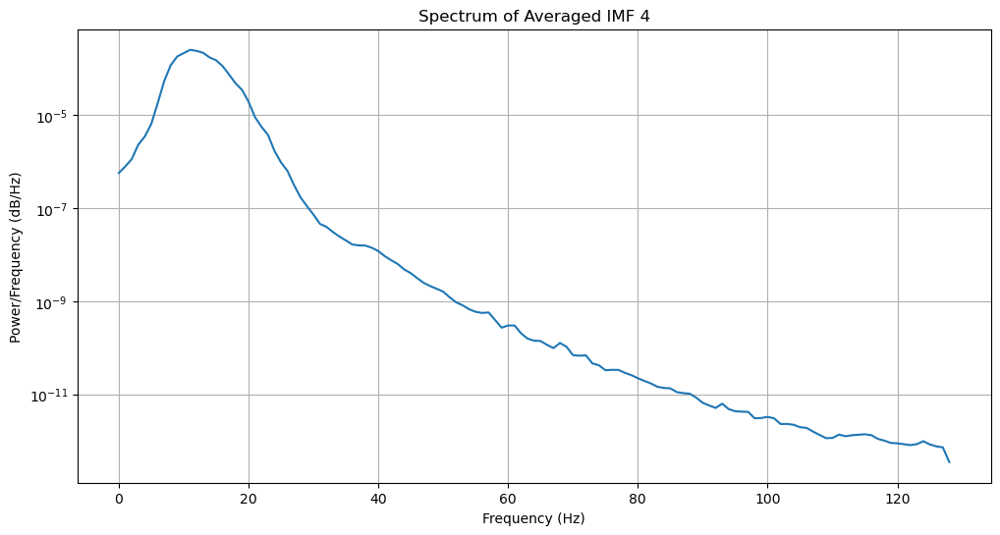

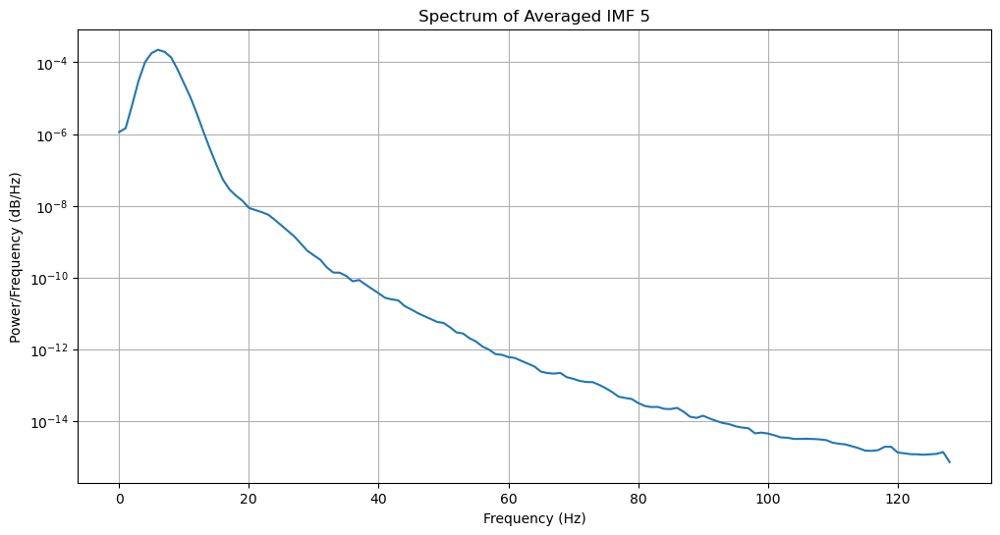

...

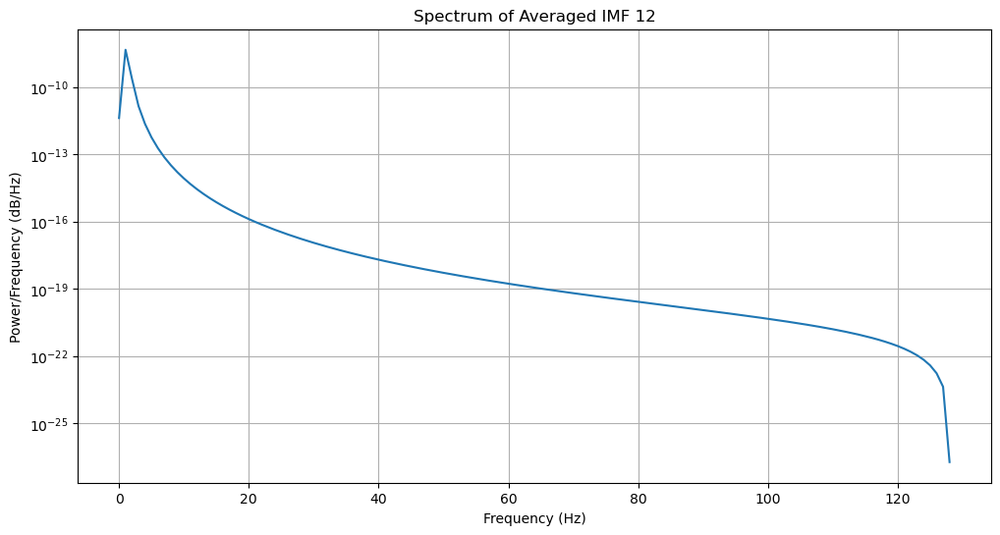

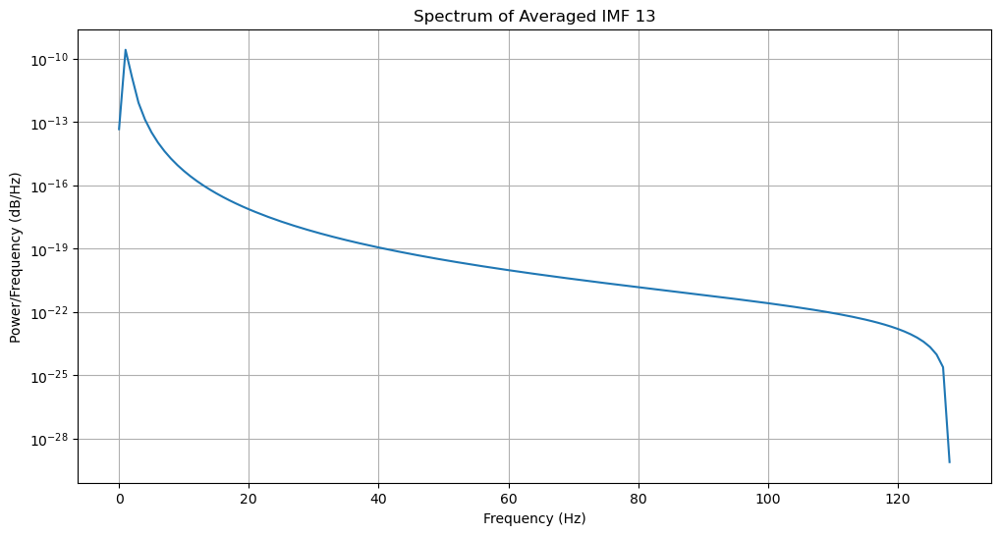

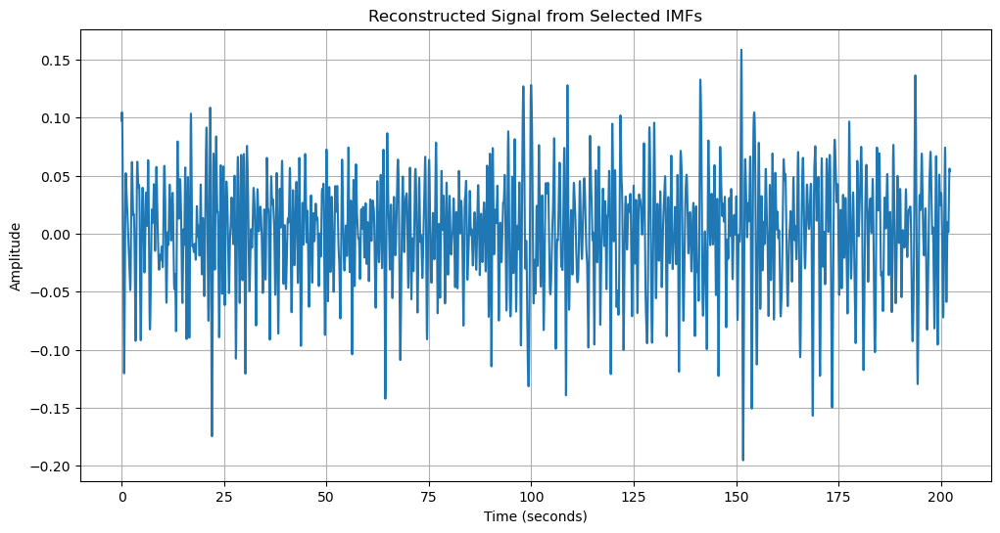

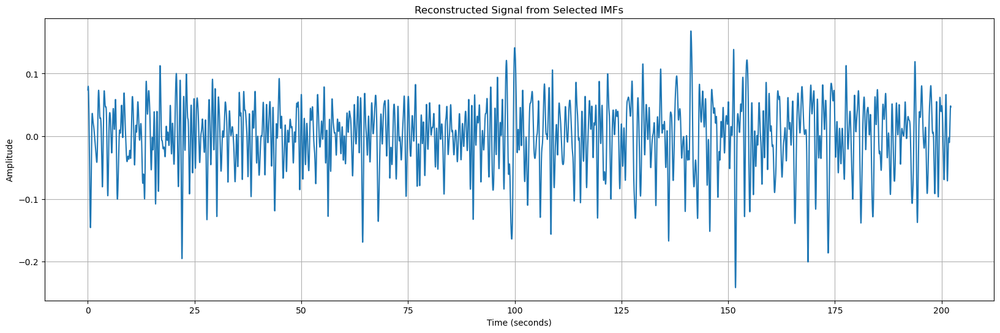

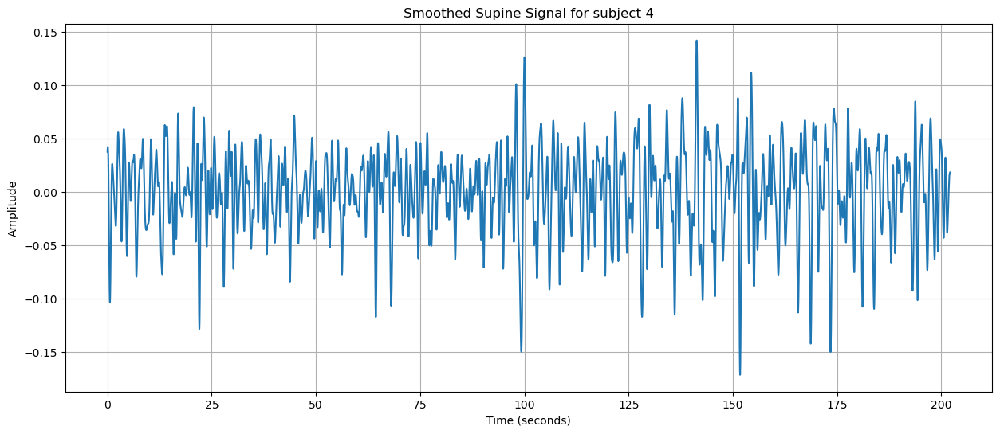

In [1233]:
# Import the necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from PyEMD import EEMD
from scipy.fft import fft
from scipy.signal import welch

# Function to calculate and plot the frequency spectrum
def plot_frequency_spectrum(signal, fs, title):
    f, Pxx = welch(signal, fs, nperseg=256)
    plt.figure(figsize=(12, 6))
    plt.semilogy(f, Pxx)
    plt.title(title)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power/Frequency (dB/Hz)")
    plt.grid(True)
    plt.show()

for i in range(num_imfs_sub4):
    plot_frequency_spectrum(avg_imfs_sub4[i, :], fs, f"Spectrum of Averaged IMF {i+1}")
    
    
#  indices of the desired IMFs
selected_imf_indices = [4,5]  

# Initialize the reconstructed signal
reconstructed_signal_sub41 = np.zeros_like(avg_imfs_sub4[selected_imf_indices[0]])

# Add the selected IMFs to the reconstructed signal
for index in selected_imf_indices:
    reconstructed_signal_sub41 += avg_imfs_sub4[index]

# Plot the reconstructed signal
plt.figure(figsize=(12, 6))
plt.plot(segment_time4, reconstructed_signal_sub41[:segment_samples4])
plt.title("Reconstructed Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()


#  indices of the desired IMFs
selected_imf_indices = [4,5,6] 

# Initialize the reconstructed signal
reconstructed_signal4 = np.zeros_like(avg_imfs_sub4[selected_imf_indices[0]])

# Add the selected IMFs to the reconstructed signal
for index in selected_imf_indices:
    reconstructed_signal4 += avg_imfs_sub4[index]

# Plot the reconstructed signal
plt.figure(figsize=(20, 6))
plt.plot(segment_time4, reconstructed_signal4[:segment_samples4])
plt.title("Reconstructed Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

from scipy.signal import savgol_filter

# empty array for the smoothed signal
smoothed_cardiac_signal_sub42 = np.zeros_like(reconstructed_signal4)

# window size for the SMOOTHING moving average
window_size = 23

# Calculate the moving average
smoothed_reconstructed_signal42 = np.convolve(reconstructed_signal4, np.ones(window_size)/window_size, mode='same')

# Plot the smoothed reconstructed signal
plt.figure(figsize=(15, 6))
plt.plot(segment_time4, smoothed_reconstructed_signal42[:segment_samples4])
plt.title("Smoothed Supine Signal for subject 4")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

# SUBJECT 5

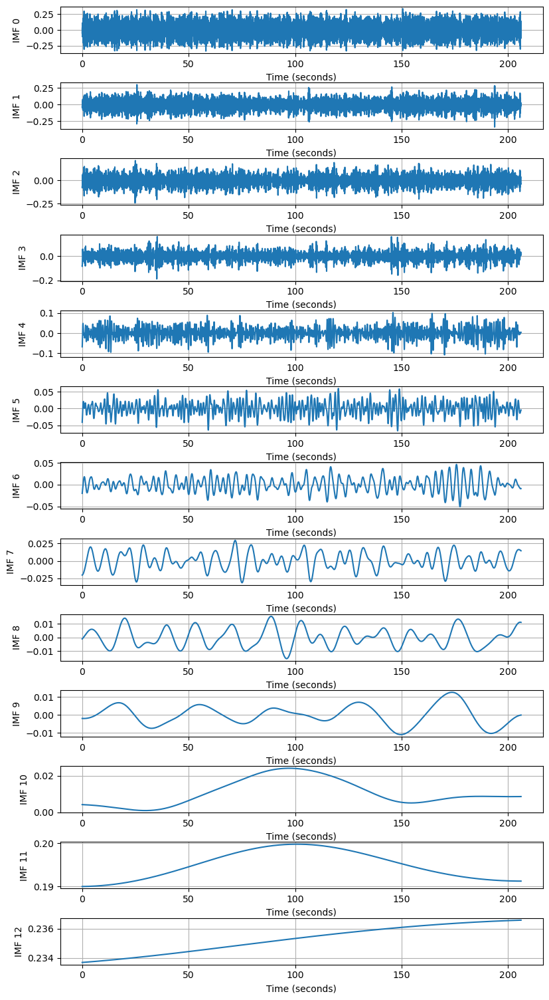

Combined plot saved successfully.


In [910]:
for i, noisy_signal_sub5 in enumerate(noisy_signals_sub5):
    imfs_sub5 = eemd_sub5.eemd(noisy_signal_sub5)
    if i == 0:
        avg_imfs_sub5 = imfs_sub5
    else:
        avg_imfs_sub5 += imfs_sub5

avg_imfs_sub5 /= len(noisy_signals_sub5)

# Plot each average IMF in separate, individual plots for subject 5
num_imfs_sub5 = avg_imfs_sub5.shape[0]

# Create a single column grid of subplots with 13 rows for subject 5
fig, axs = plt.subplots(num_imfs_sub5, 1, figsize=(8, 15))
fig.tight_layout()

for i in range(num_imfs_sub5):
    ax = axs[i]

    ax.plot(segment_time5, avg_imfs_sub5[i, :segment_samples5])
    #ax.set_title(f"Averaged IMF from EEMD")
    ax.set_xlabel("Time (seconds)")
    ax.set_ylabel(f"IMF {i}")
    ax.grid(True)

# Save the combined plots as an image
plt.savefig('combined_plots3.png', dpi=300)  
plt.show()
plt.close()  



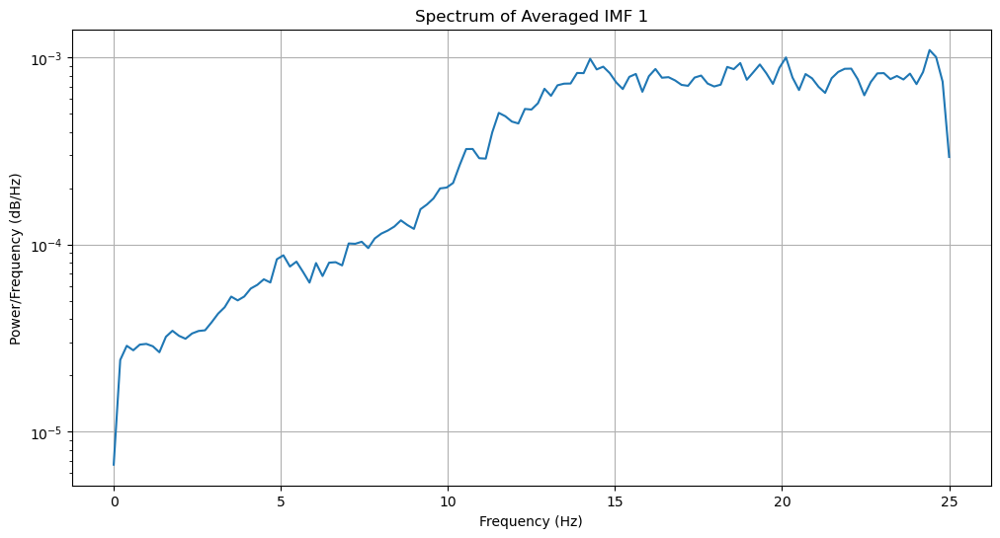

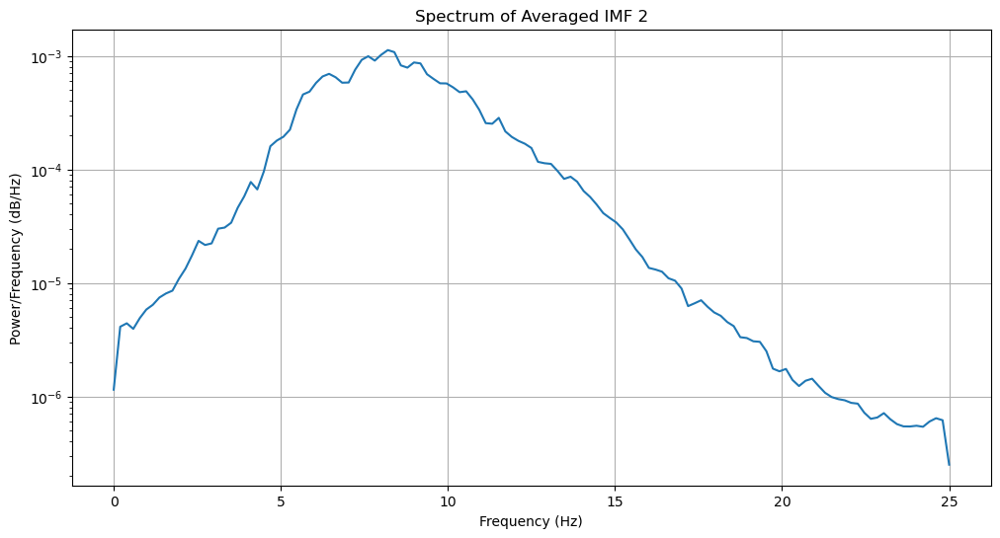

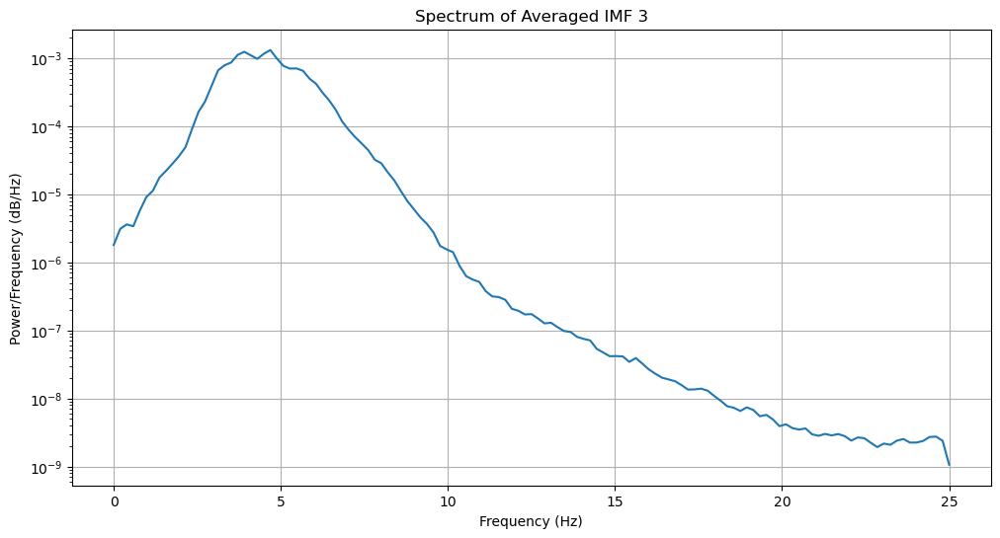

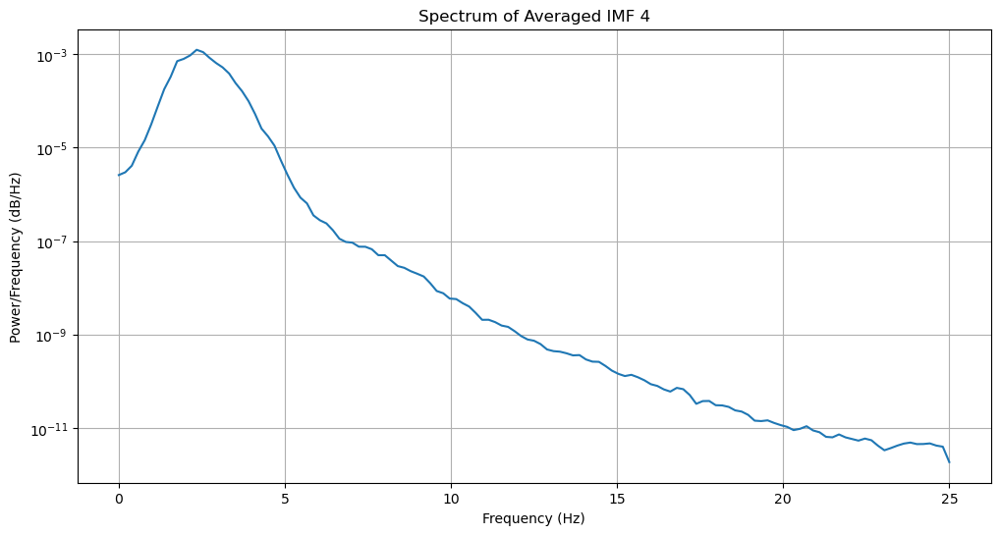

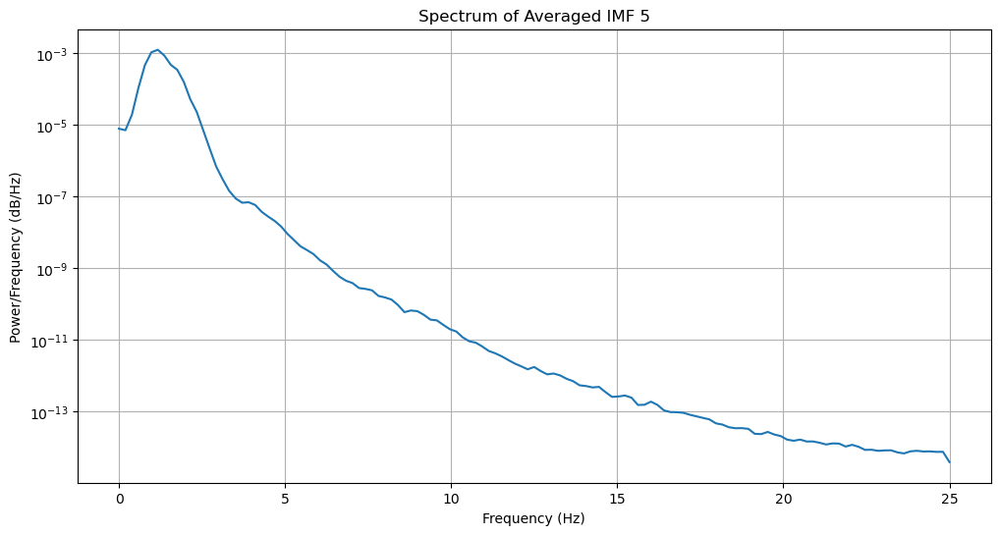

...

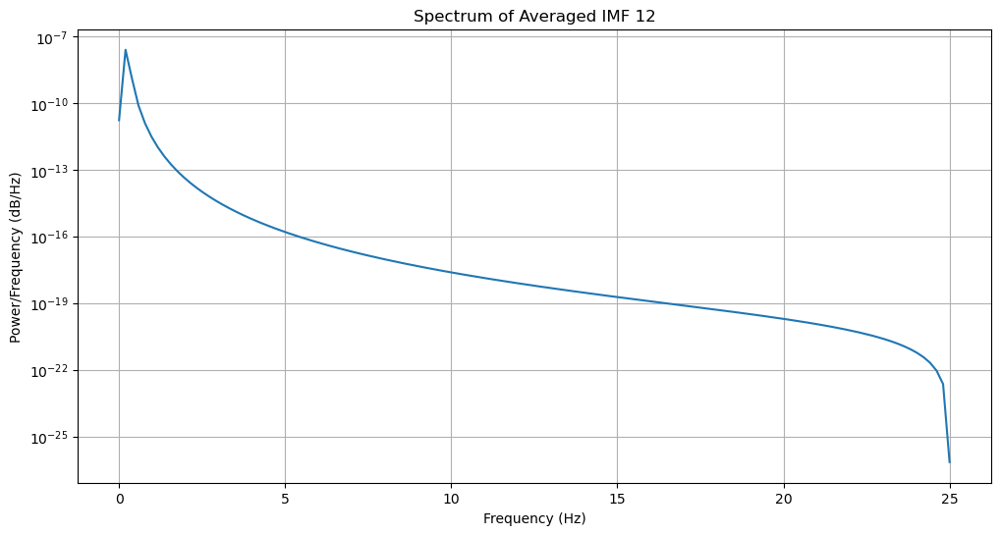

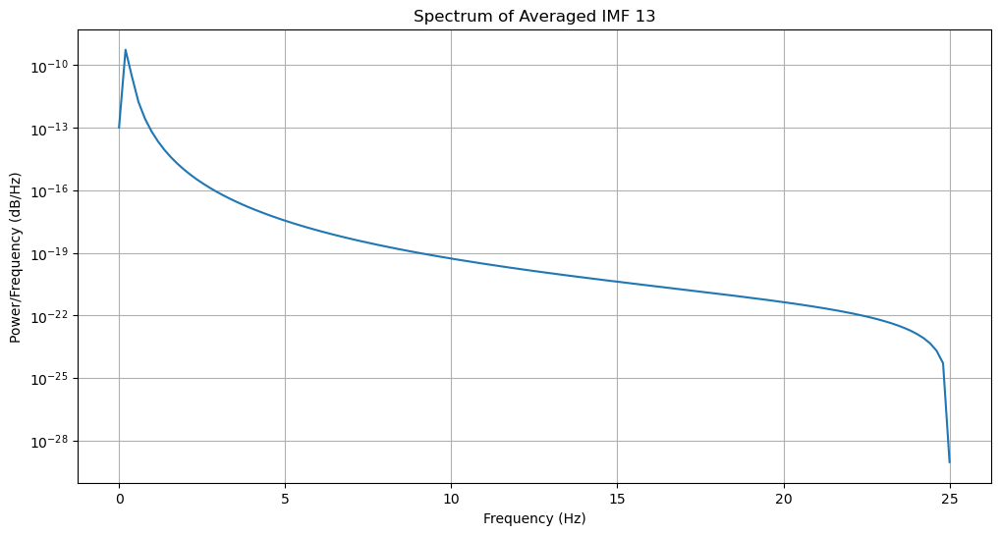

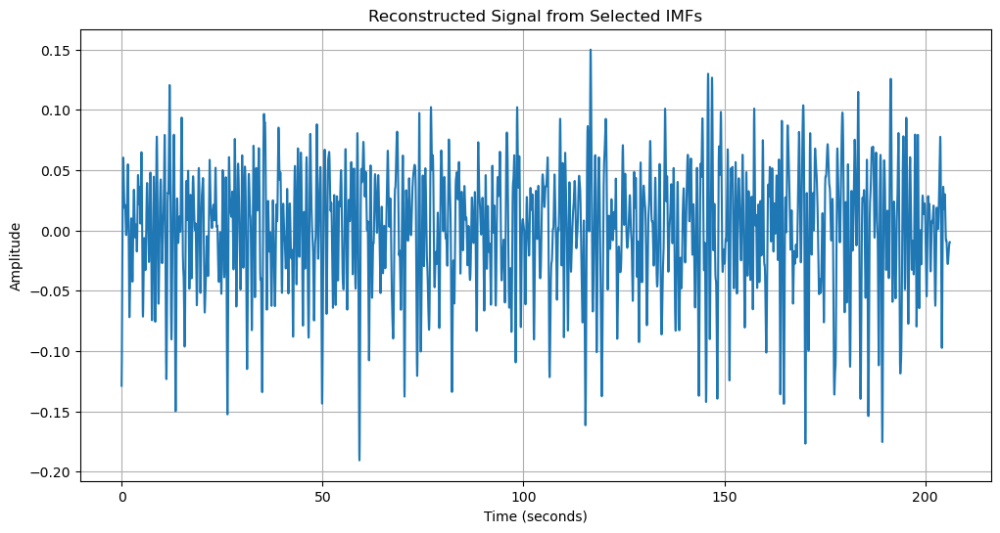

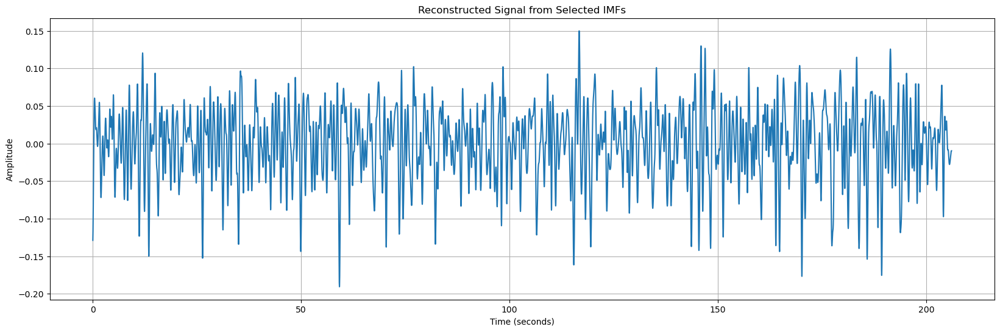

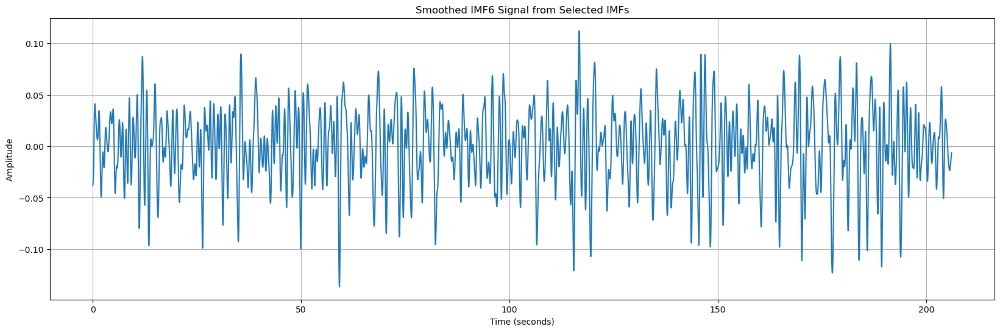

In [911]:
# Import the necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from PyEMD import EEMD
from scipy.fft import fft
from scipy.signal import welch

# Function to calculate and plot the frequency spectrum
def plot_frequency_spectrum(signal, fs, title):
    f, Pxx = welch(signal, fs, nperseg=256)
    plt.figure(figsize=(12, 6))
    plt.semilogy(f, Pxx)
    plt.title(title)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power/Frequency (dB/Hz)")
    plt.grid(True)
    plt.show()

for i in range(num_imfs_sub5):
    plot_frequency_spectrum(avg_imfs_sub5[i, :], fs, f"Spectrum of Averaged IMF {i+1}")
    
    
#  indices of the desired IMFs
selected_imf_indices = [4,5,6] 

# Initialize the reconstructed signal
reconstructed_signal_sub51 = np.zeros_like(avg_imfs_sub5[selected_imf_indices[0]])

# Add the selected IMFs to the reconstructed signal
for index in selected_imf_indices:
    reconstructed_signal_sub51 += avg_imfs_sub5[index]

# Plot the reconstructed signal
plt.figure(figsize=(12, 6))
plt.plot(segment_time5, reconstructed_signal_sub51[:segment_samples5])
plt.title("Reconstructed Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()


# indices of the desired IMFs
selected_imf_indices = [4,5,6]  

# Initialize the reconstructed signal
reconstructed_signal5 = np.zeros_like(avg_imfs_sub5[selected_imf_indices[0]])

# Add the selected IMFs to the reconstructed signal
for index in selected_imf_indices:
    reconstructed_signal5 += avg_imfs_sub5[index]

# Plot the reconstructed signal
plt.figure(figsize=(20, 6))
plt.plot(segment_time5, reconstructed_signal5[:segment_samples5])
plt.title("Reconstructed Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

from scipy.signal import savgol_filter

#  empty array for the smoothed signal
smoothed_cardiac_signal_sub52 = np.zeros_like(reconstructed_signal5)

# window size for the SMOOTHING moving average
window_size = 23

# Calculate the moving average
smoothed_reconstructed_signal52 = np.convolve(reconstructed_signal5, np.ones(window_size)/window_size, mode='same')

# Plot the smoothed reconstructed signal
plt.figure(figsize=(20, 6))
plt.plot(segment_time5, smoothed_reconstructed_signal52[:segment_samples5])
plt.title("Smoothed IMF6 Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

# SUBJECT 6

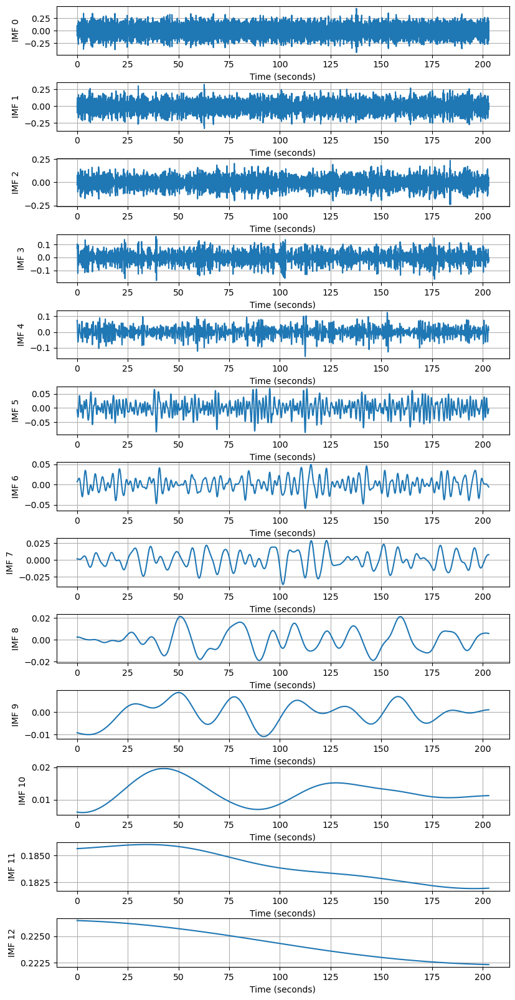

Combined plot saved successfully.


In [912]:
for i, noisy_signal_sub6 in enumerate(noisy_signals_sub6):
    imfs_sub6 = eemd_sub6.eemd(noisy_signal_sub6)
    if i == 0:
        avg_imfs_sub6 = imfs_sub6
    else:
        avg_imfs_sub6 += imfs_sub6

avg_imfs_sub6 /= len(noisy_signals_sub6)

# Plot each average IMF in separate, individual plots for subject 6
num_imfs_sub6 = avg_imfs_sub6.shape[0]

# Create a single column grid of subplots with 13 rows for subject 6
fig, axs = plt.subplots(num_imfs_sub6, 1, figsize=(8, 16))
fig.tight_layout()

for i in range(num_imfs_sub6):
    ax = axs[i]

    ax.plot(segment_time6, avg_imfs_sub6[i, :segment_samples6])
    #ax.set_title(f"Averaged IMF from EEMD")
    ax.set_xlabel("Time (seconds)")
    ax.set_ylabel(f"IMF {i}")
    ax.grid(True)

# Save the combined  plots as an image
plt.savefig('combined_plots3.png', dpi=300)  
plt.show()
plt.close()  




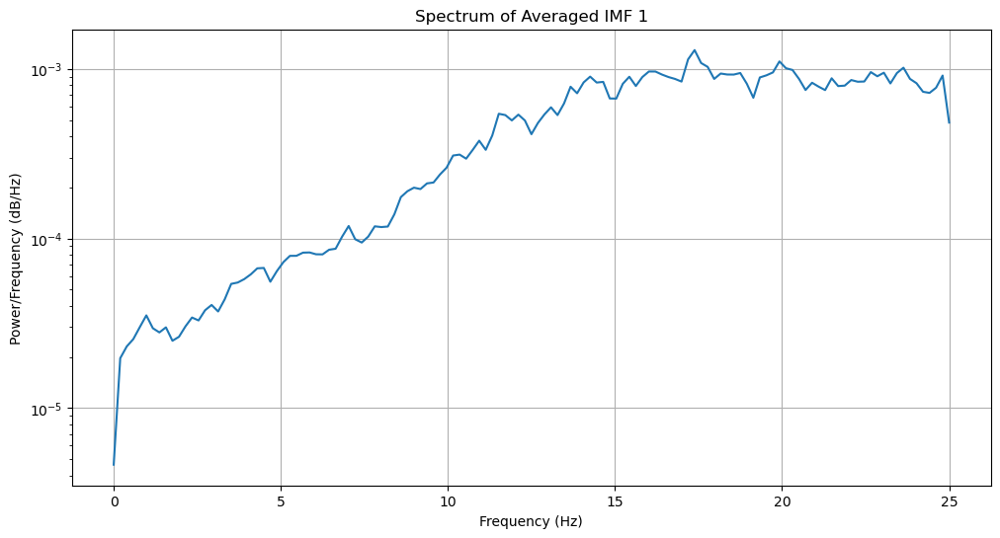

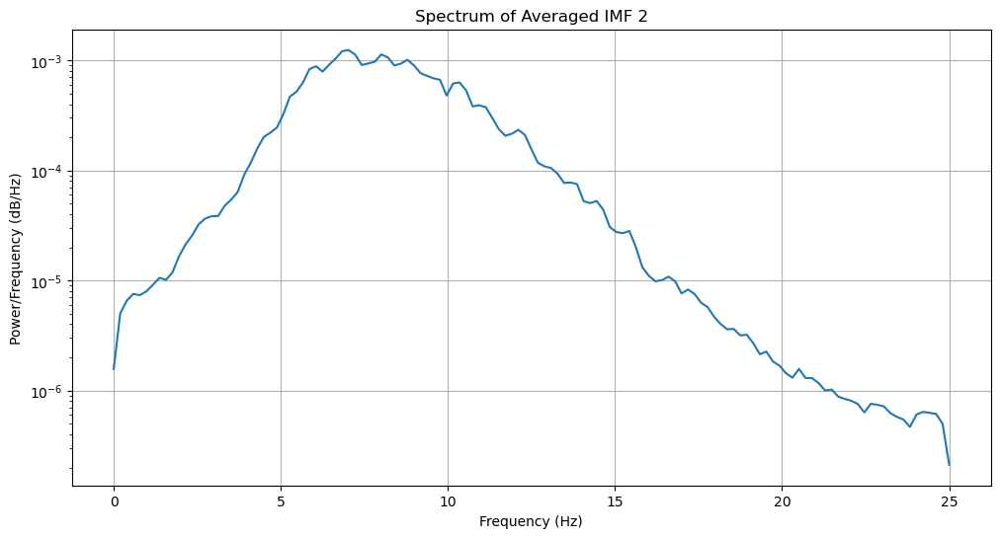

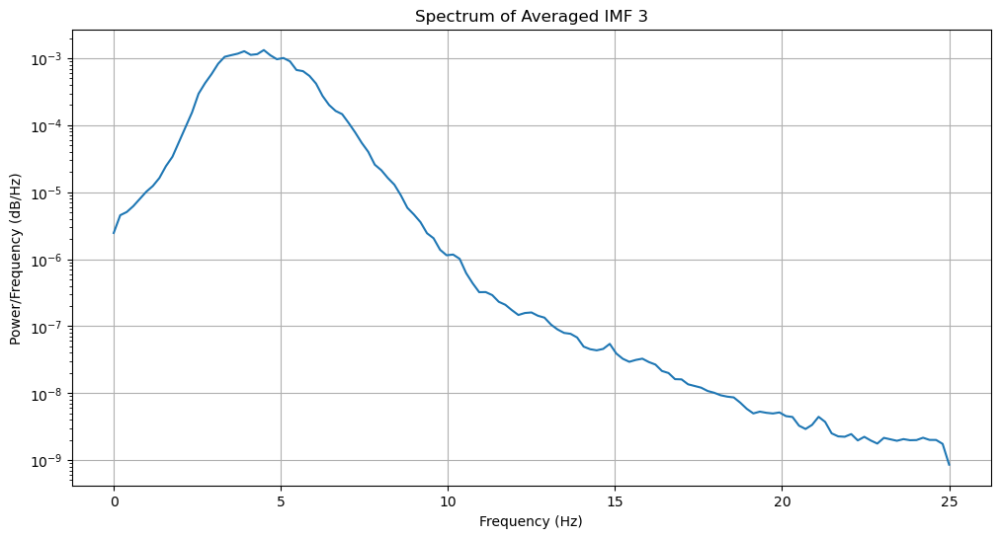

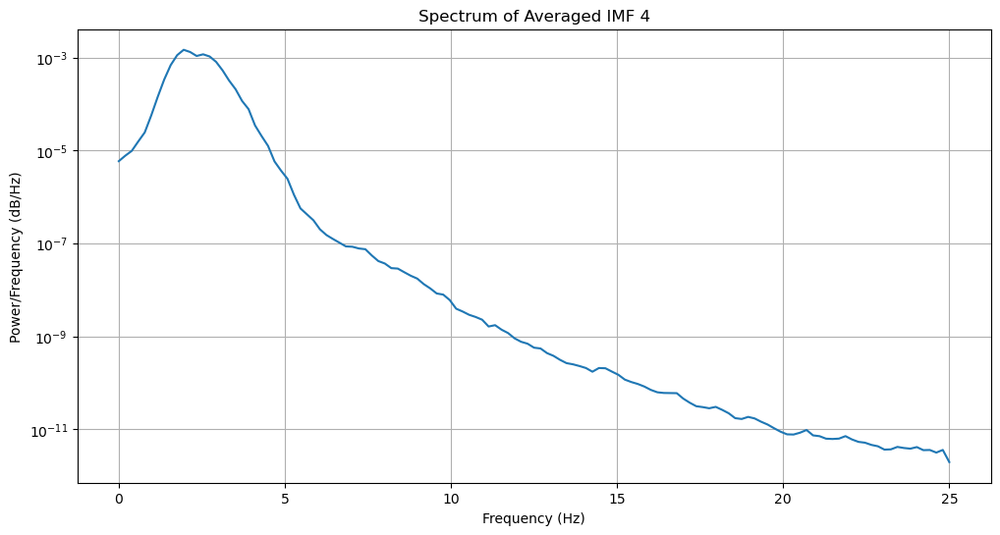

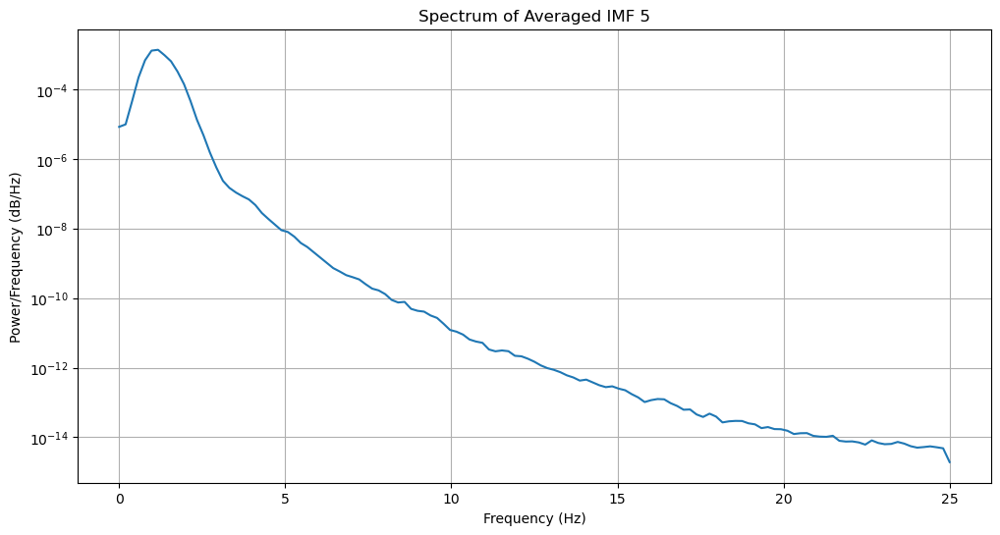

...

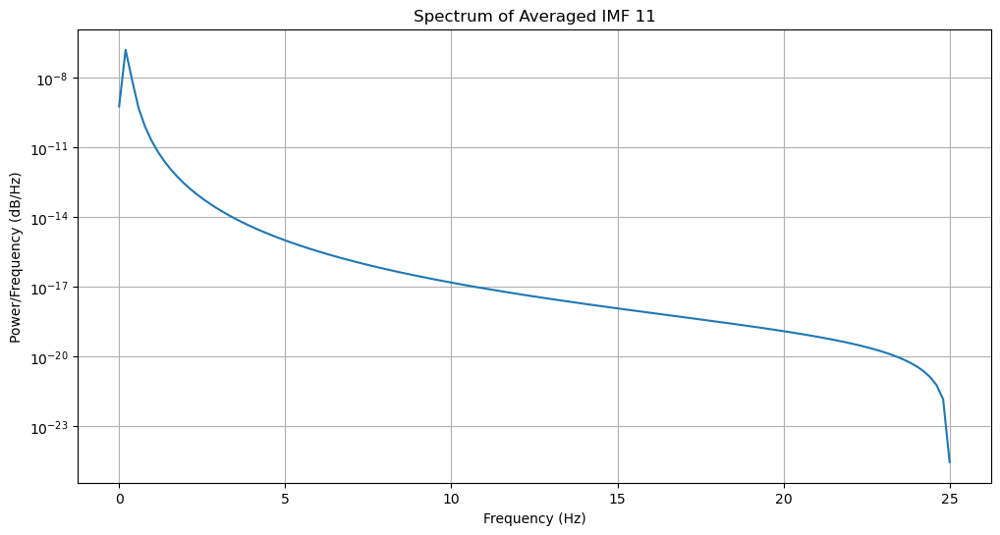

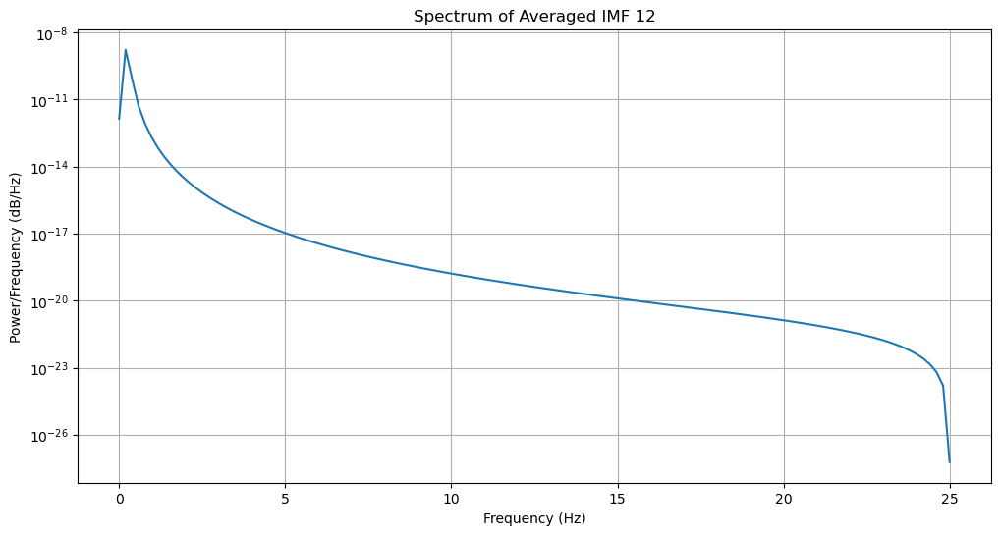

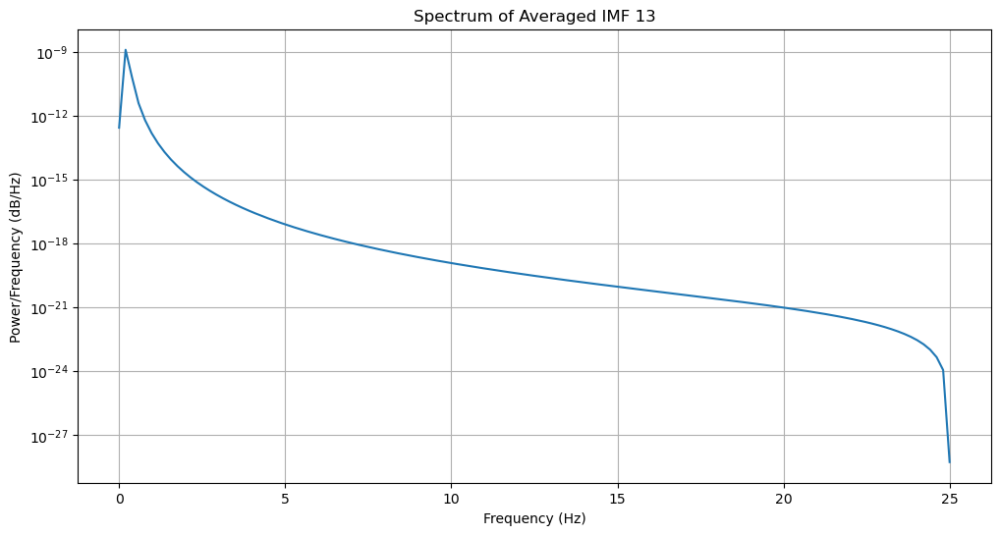

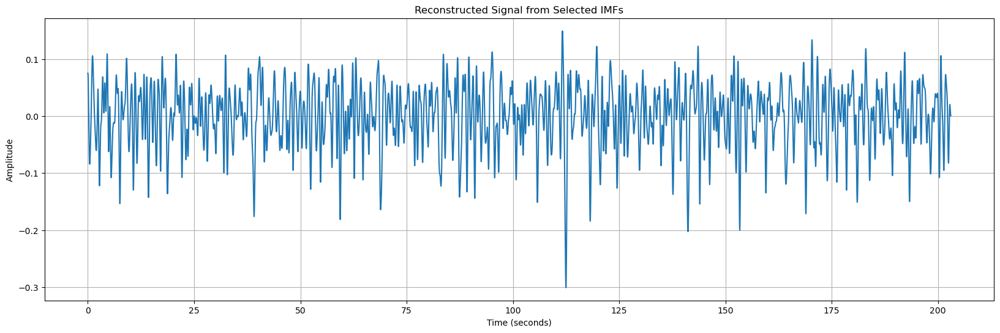

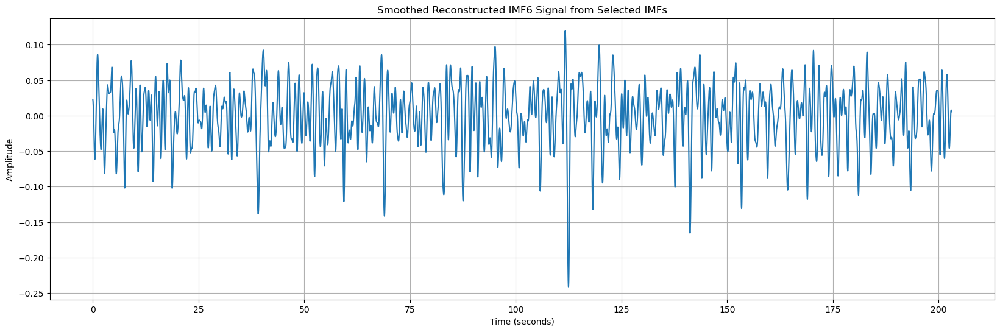

In [913]:
# Import the necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from PyEMD import EEMD
from scipy.fft import fft
from scipy.signal import welch

# Function to calculate and plot the frequency spectrum
def plot_frequency_spectrum(signal, fs, title):
    f, Pxx = welch(signal, fs, nperseg=256)
    plt.figure(figsize=(12, 6))
    plt.semilogy(f, Pxx)
    plt.title(title)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power/Frequency (dB/Hz)")
    plt.grid(True)
    plt.show()

for i in range(num_imfs_sub6):
    plot_frequency_spectrum(avg_imfs_sub6[i, :], fs, f"Spectrum of Averaged IMF {i+1}")
    
#  indices of the desired IMFs
selected_imf_indices = [4,5,6]  

# Initialize the reconstructed signal
reconstructed_signal6 = np.zeros_like(avg_imfs_sub6[selected_imf_indices[0]])

# Add the selected IMFs to the reconstructed signal
for index in selected_imf_indices:
    reconstructed_signal6 += avg_imfs_sub6[index]

# Plot the reconstructed signal
plt.figure(figsize=(20, 6))
plt.plot(segment_time6, reconstructed_signal6[:segment_samples6])
plt.title("Reconstructed Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

# window size for the SMOOTHING moving average
window_size = 23

# Calculate the moving average
smoothed_reconstructed_signal62 = np.convolve(reconstructed_signal6, np.ones(window_size)/window_size, mode='same')

# Plot the smoothed reconstructed signal
plt.figure(figsize=(20, 6))
plt.plot(segment_time6, smoothed_reconstructed_signal62[:segment_samples6])
plt.title("Smoothed Reconstructed IMF6 Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()
    


# SUBJECT 7

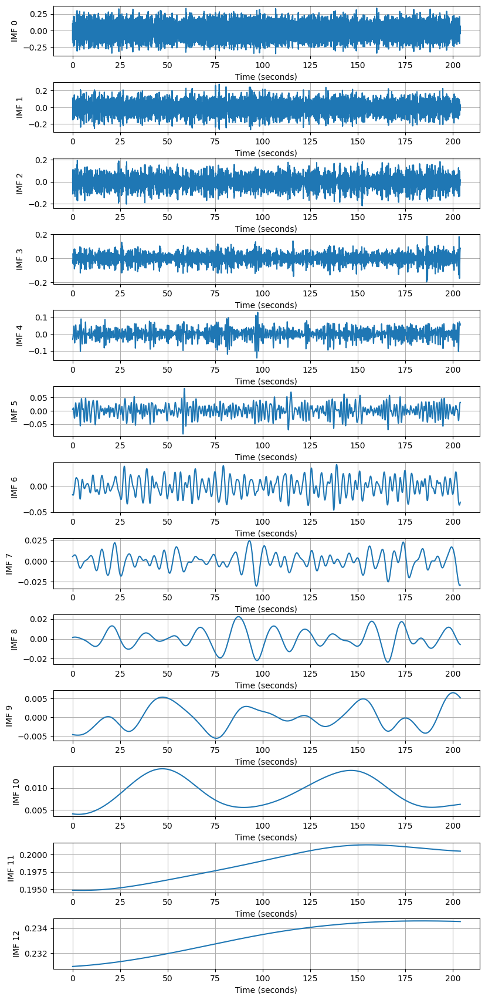

Combined plot saved successfully.


In [914]:
for i, noisy_signal_sub7 in enumerate(noisy_signals_sub7):
    imfs_sub7 = eemd_sub7.eemd(noisy_signal_sub7)
    if i == 0:
        avg_imfs_sub7 = imfs_sub7
    else:
        avg_imfs_sub7 += imfs_sub7

avg_imfs_sub7 /= len(noisy_signals_sub7)

# Plot each average IMF in separate, individual plots for subject 7
num_imfs_sub7 = avg_imfs_sub7.shape[0]

# Create a single column grid of subplots with 13 rows for subject 7
fig, axs = plt.subplots(num_imfs_sub7, 1, figsize=(8, 17))
fig.tight_layout()

for i in range(num_imfs_sub7):
    ax = axs[i]

    ax.plot(segment_time7, avg_imfs_sub7[i, :segment_samples7])
    #ax.set_title(f"Averaged IMF from EEMD")
    ax.set_xlabel("Time (seconds)")
    ax.set_ylabel(f"IMF {i}")
    ax.grid(True)

# Save the combined plots as an image
plt.savefig('combined_plots3.png', dpi=300)  
plt.show()
plt.close()  



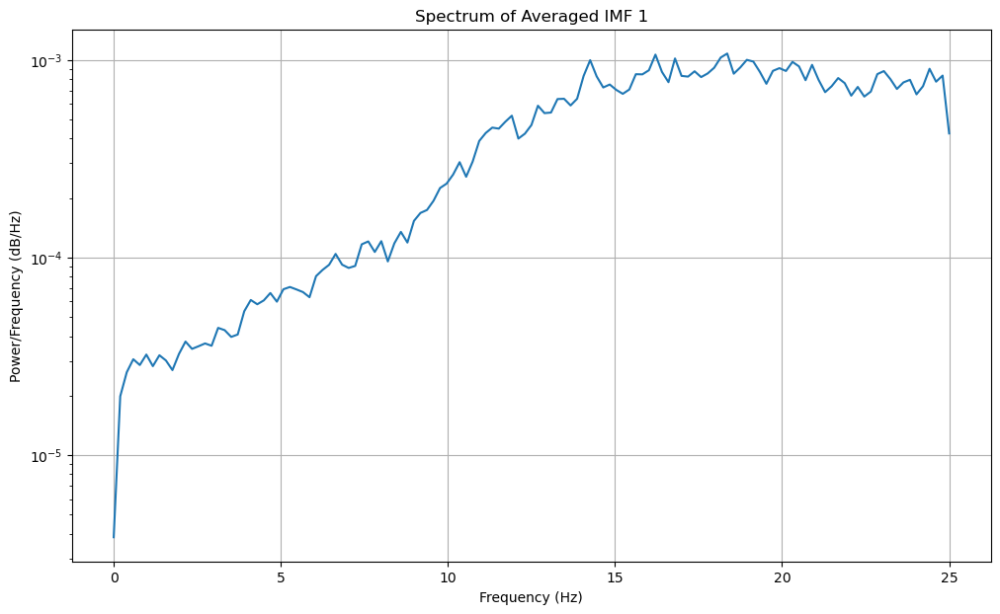

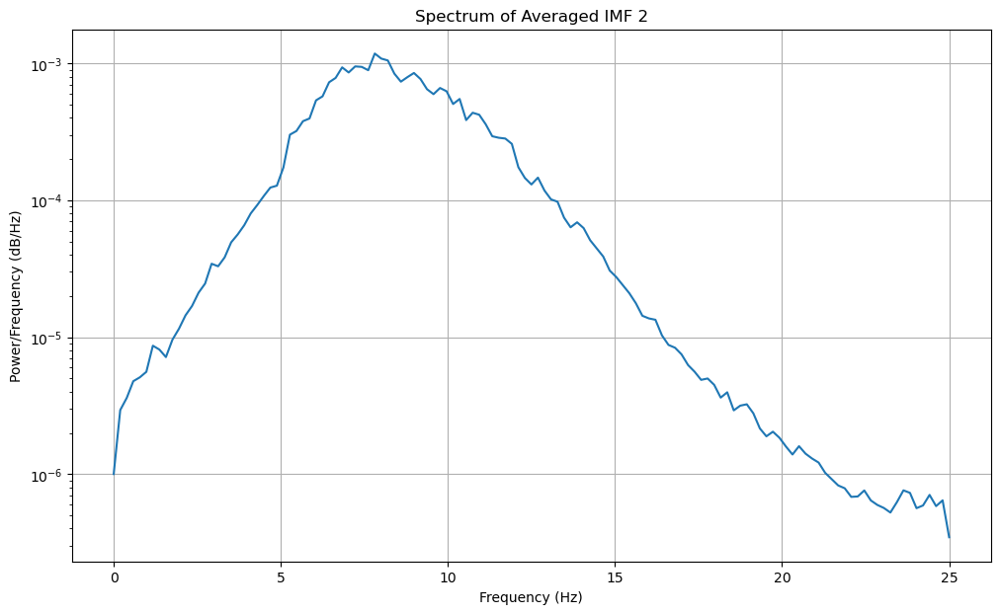

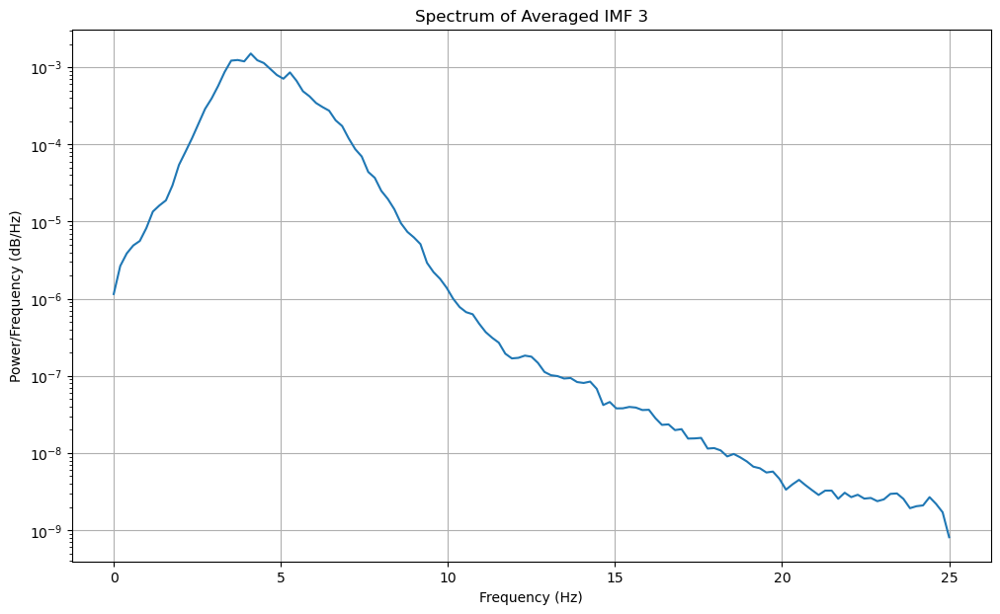

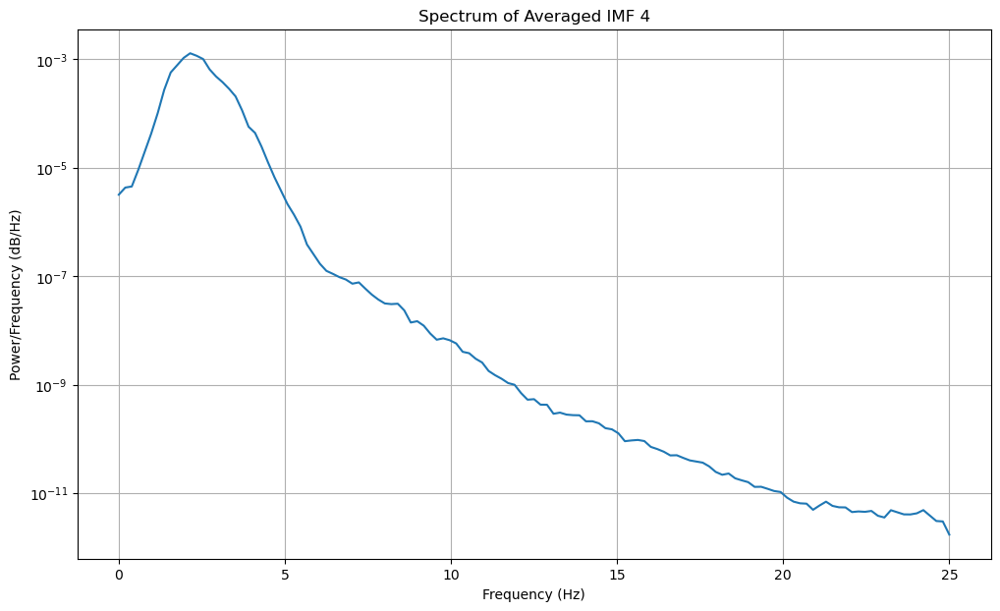

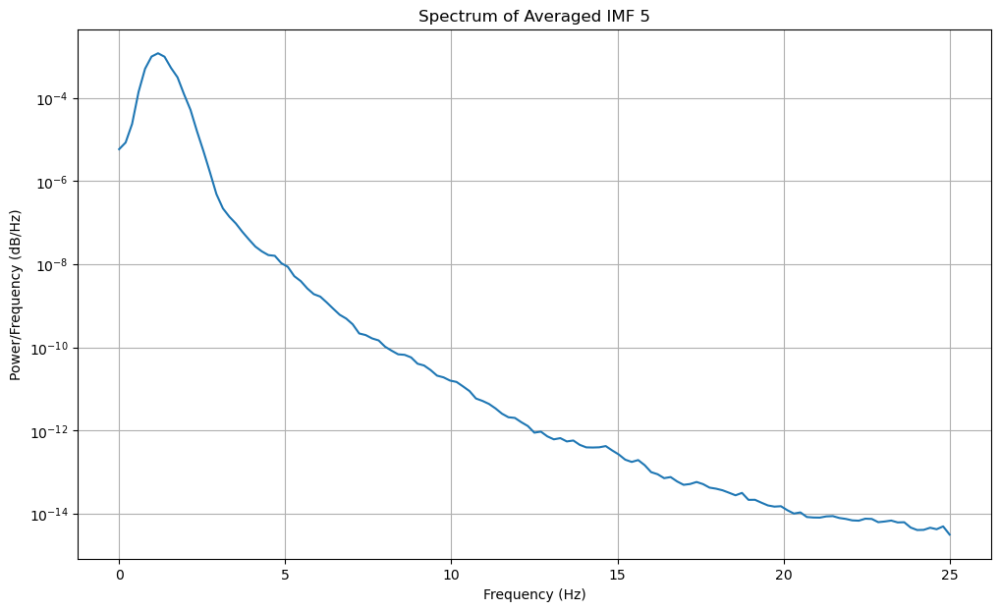

...

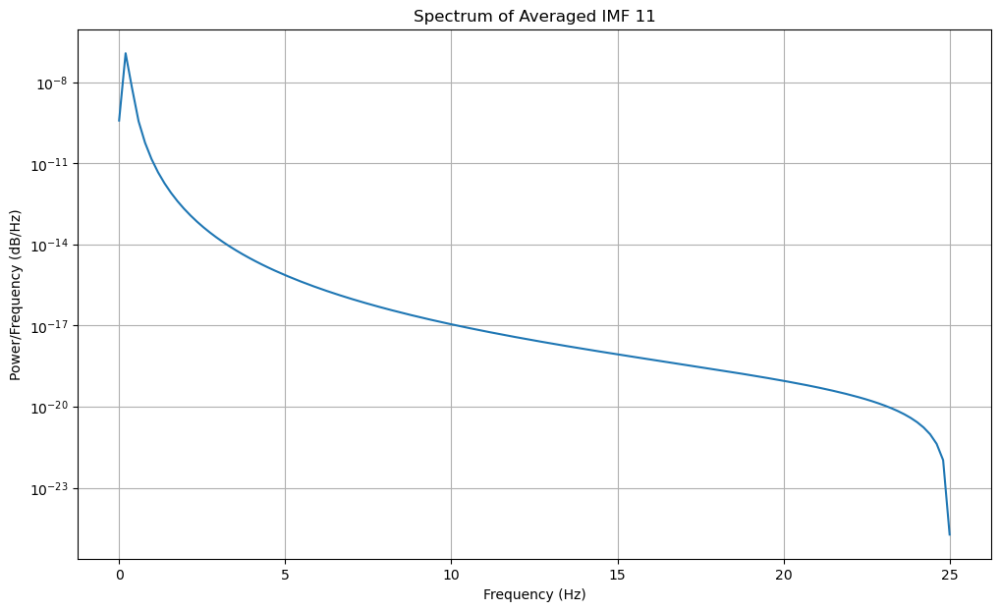

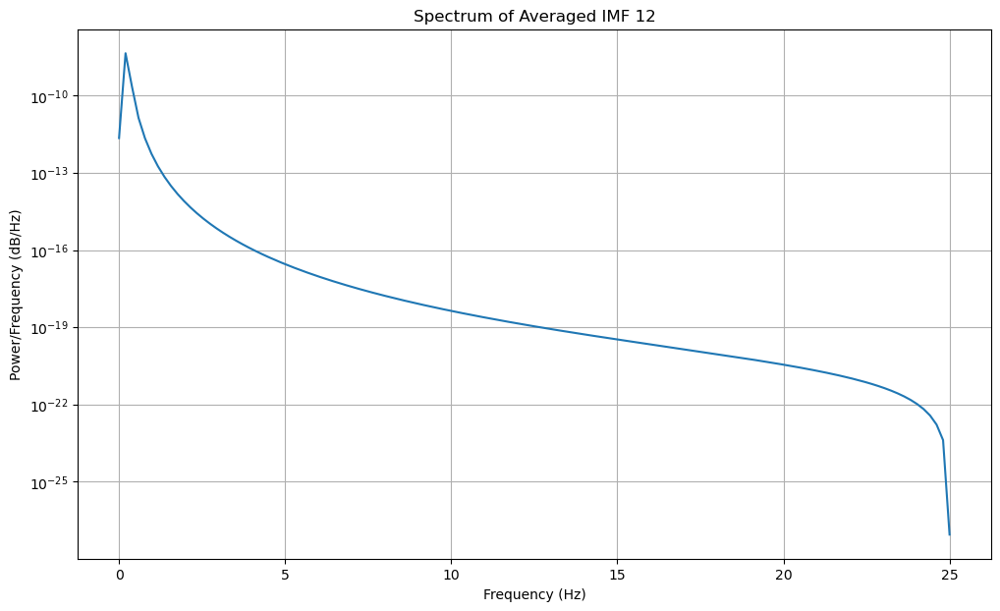

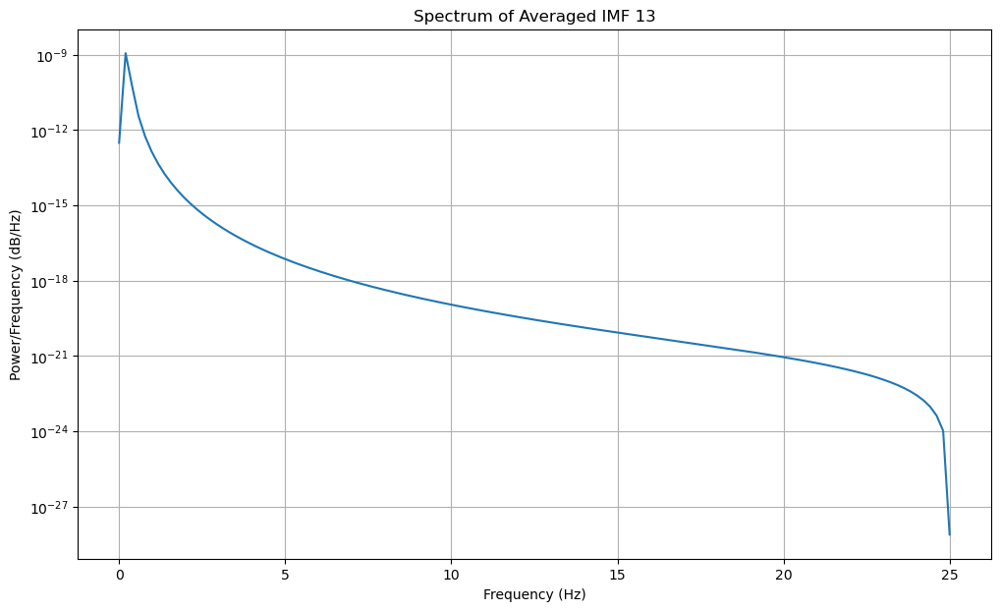

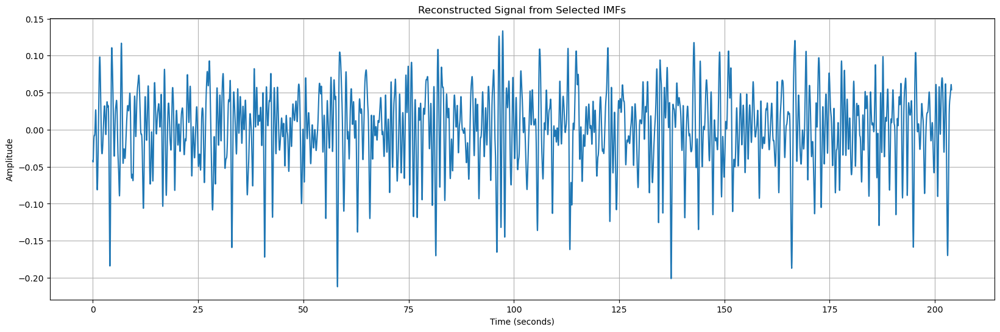

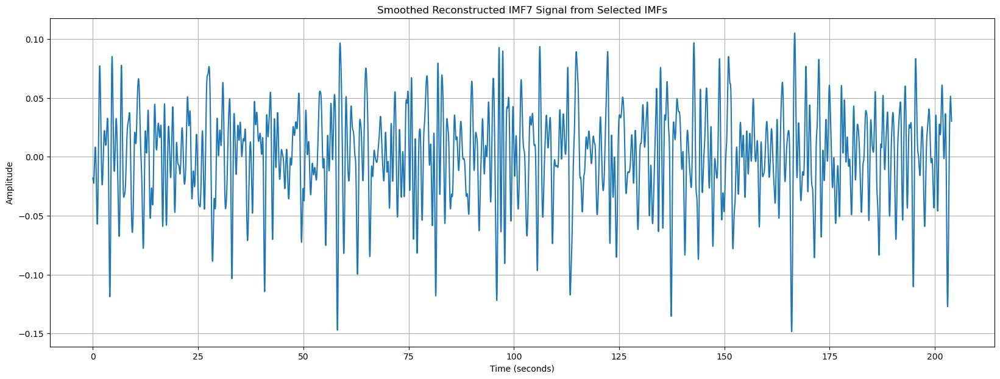

In [915]:
# Import the necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from PyEMD import EEMD
from scipy.fft import fft
from scipy.signal import welch

# Function to calculate and plot the frequency spectrum
def plot_frequency_spectrum(signal, fs, title):
    f, Pxx = welch(signal, fs, nperseg=256)
    plt.figure(figsize=(12, 7))
    plt.semilogy(f, Pxx)
    plt.title(title)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power/Frequency (dB/Hz)")
    plt.grid(True)
    plt.show()

for i in range(num_imfs_sub7):
    plot_frequency_spectrum(avg_imfs_sub7[i, :], fs, f"Spectrum of Averaged IMF {i+1}")
    
# indices of the desired IMFs
selected_imf_indices = [4,5,6] 

# Initialize the reconstructed signal
reconstructed_signal7 = np.zeros_like(avg_imfs_sub7[selected_imf_indices[0]])

# Add the selected IMFs to the reconstructed signal
for index in selected_imf_indices:
    reconstructed_signal7 += avg_imfs_sub7[index]

# Plot the reconstructed signal
plt.figure(figsize=(20, 6))
plt.plot(segment_time7, reconstructed_signal7[:segment_samples7])
plt.title("Reconstructed Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

# window size for the SMOOTHING moving average
window_size = 23

# Calculate the moving average
smoothed_reconstructed_signal72 = np.convolve(reconstructed_signal7, np.ones(window_size)/window_size, mode='same')

# Plot the smoothed reconstructed signal
plt.figure(figsize=(20, 7))
plt.plot(segment_time7, smoothed_reconstructed_signal72[:segment_samples7])
plt.title("Smoothed Reconstructed IMF7 Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()
    


# SUBJECT 8

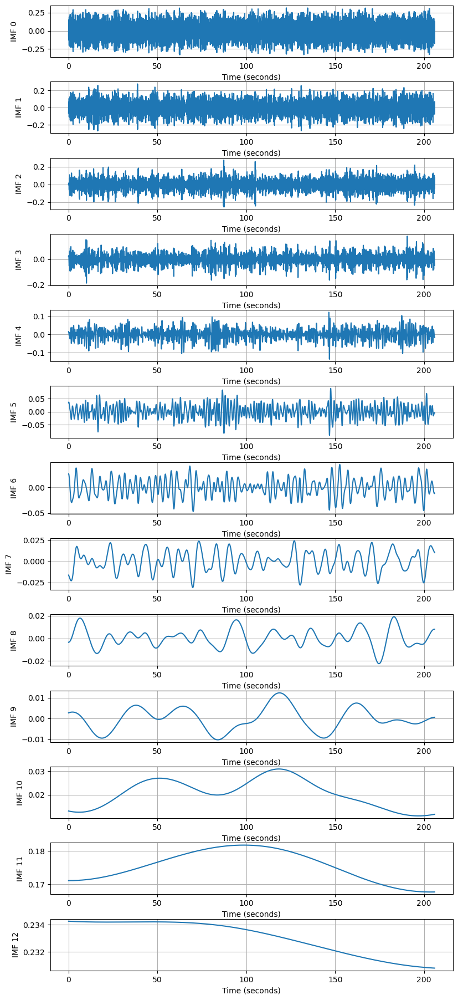

Combined plot saved successfully.


In [916]:
for i, noisy_signal_sub8 in enumerate(noisy_signals_sub8):
    imfs_sub8 = eemd_sub8.eemd(noisy_signal_sub8)
    if i == 0:
        avg_imfs_sub8 = imfs_sub8
    else:
        avg_imfs_sub8 += imfs_sub8

avg_imfs_sub8 /= len(noisy_signals_sub8)

# Plot each average IMF in separate, individual plots for subject 8
num_imfs_sub8 = avg_imfs_sub8.shape[0]

# Create a single column grid of subplots with 13 rows for subject 8
fig, axs = plt.subplots(num_imfs_sub8, 1, figsize=(8, 18))
fig.tight_layout()

for i in range(num_imfs_sub8):
    ax = axs[i]

    ax.plot(segment_time8, avg_imfs_sub8[i, :segment_samples8])
    #ax.set_title(f"Averaged IMF from EEMD")
    ax.set_xlabel("Time (seconds)")
    ax.set_ylabel(f"IMF {i}")
    ax.grid(True)

# Save the combined plots as an image
plt.savefig('combined_plots3.png', dpi=300)  
plt.show()
plt.close() 


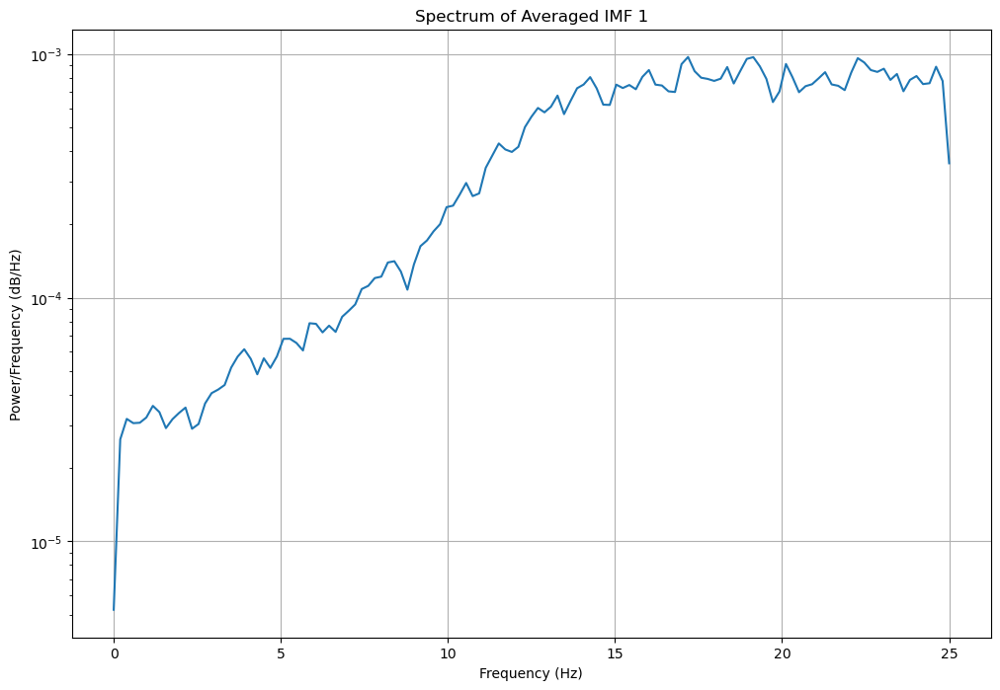

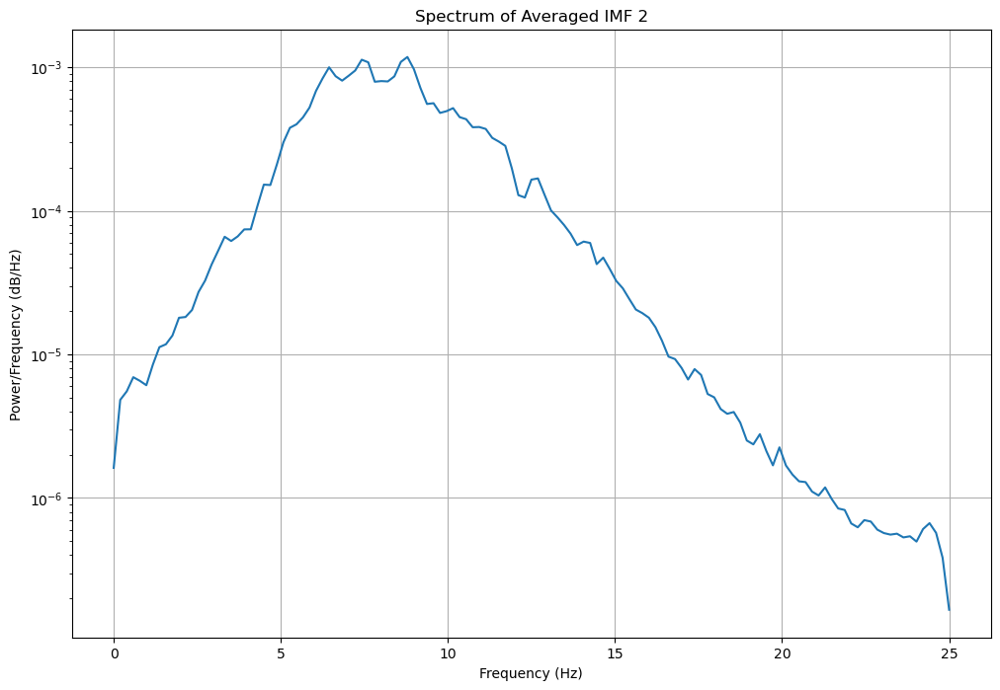

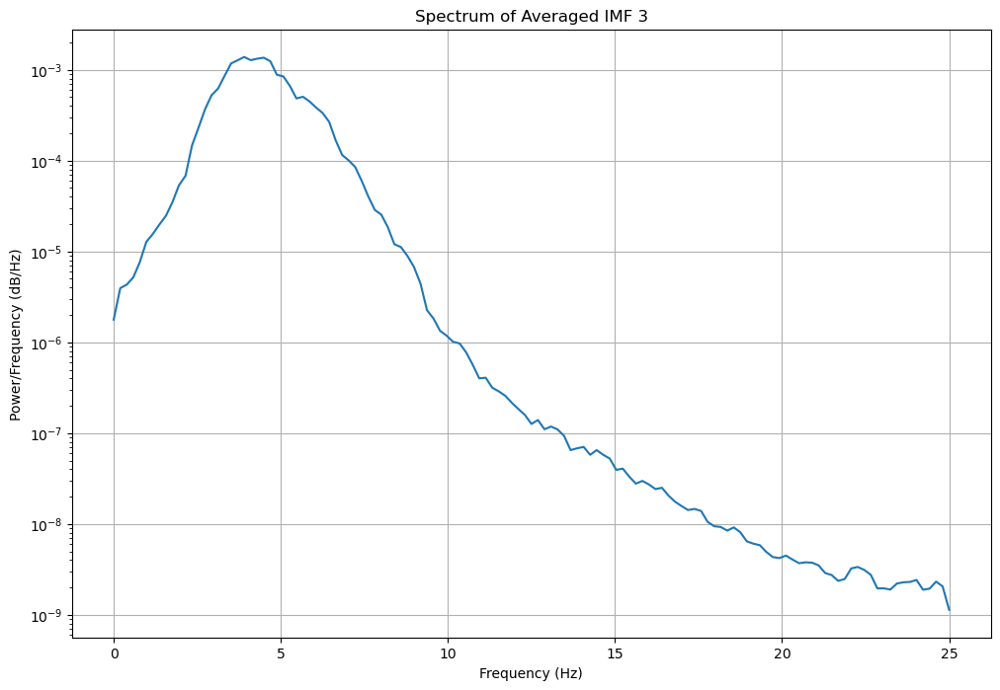

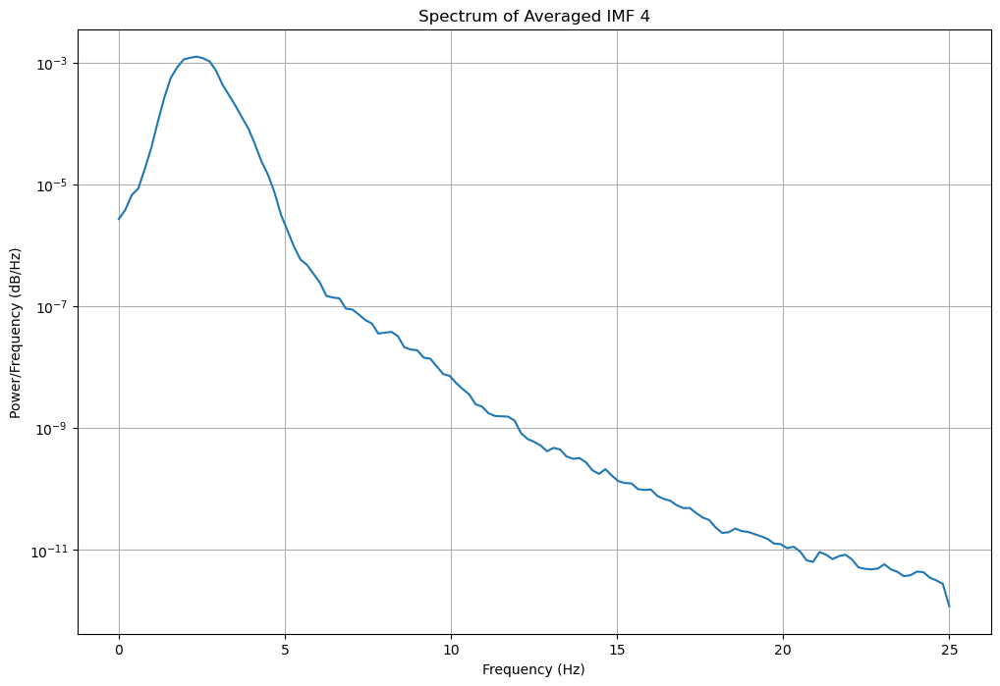

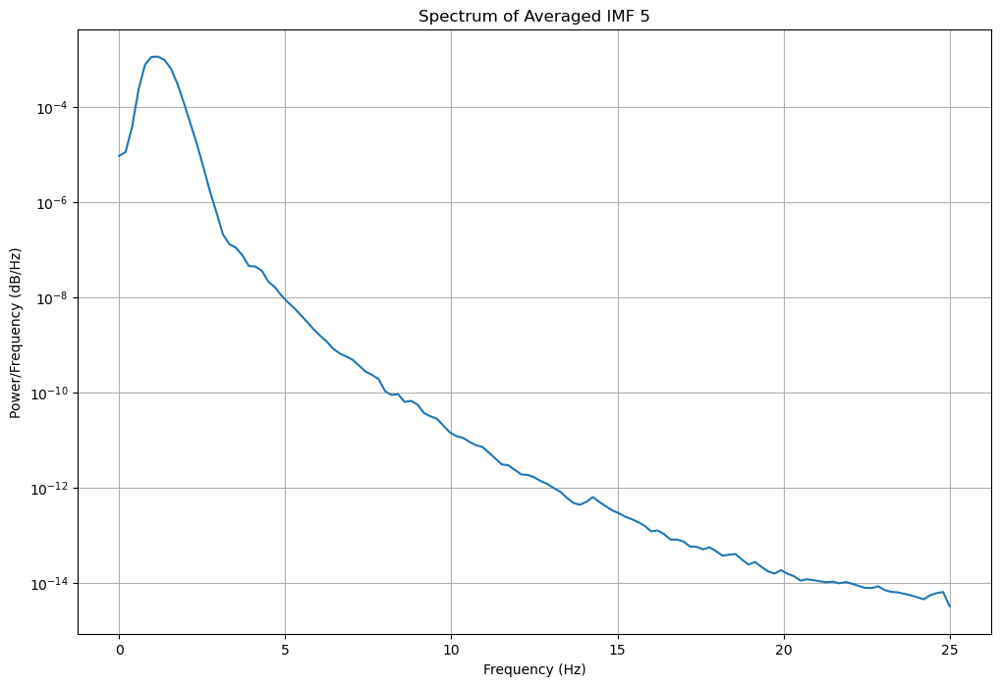

...

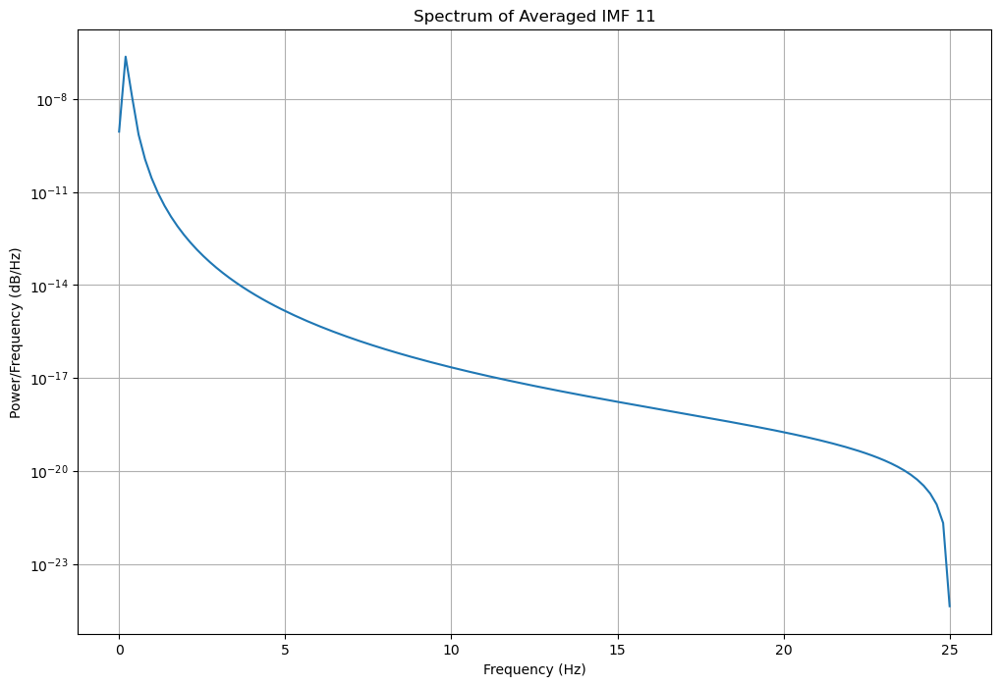

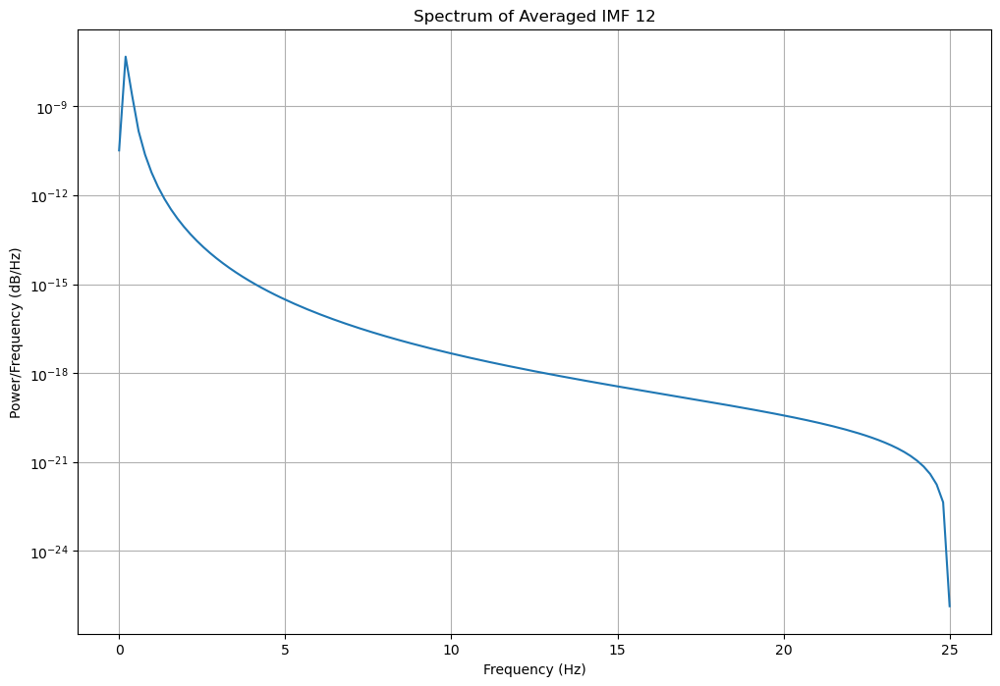

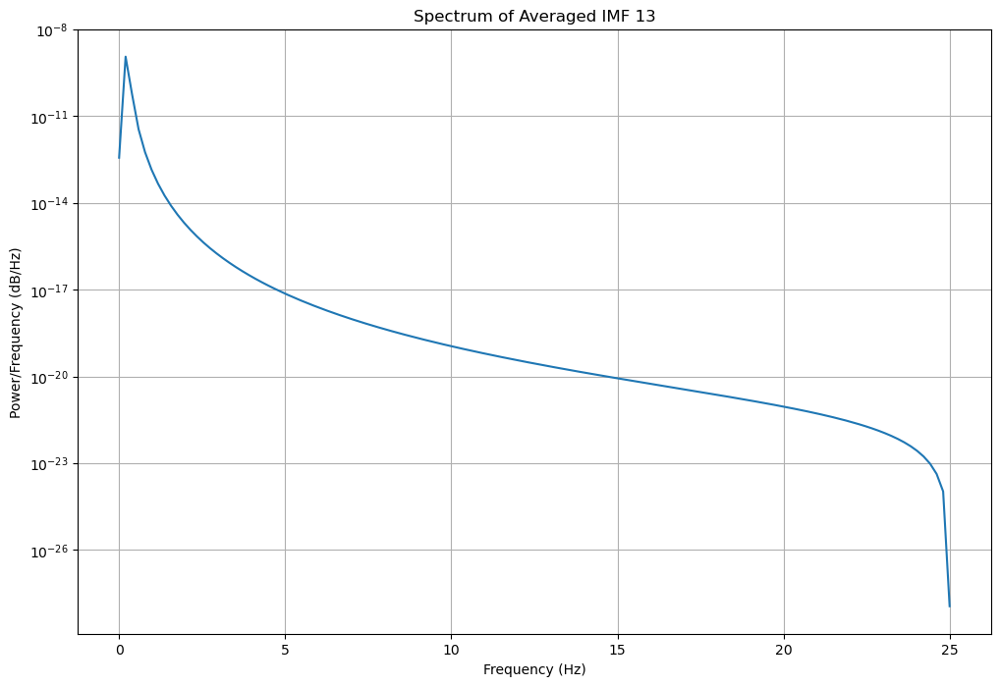

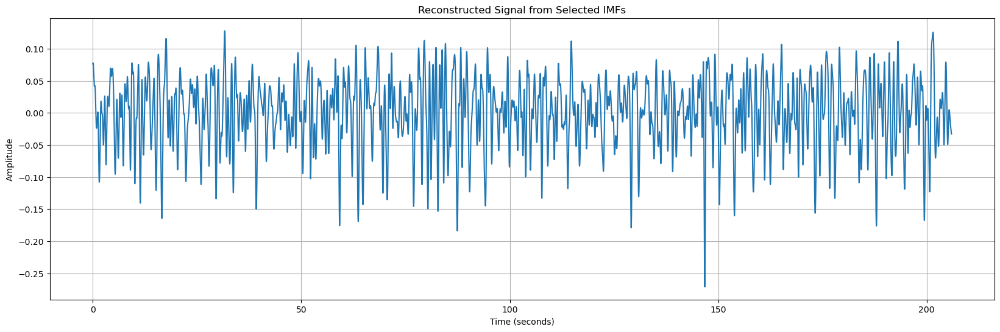

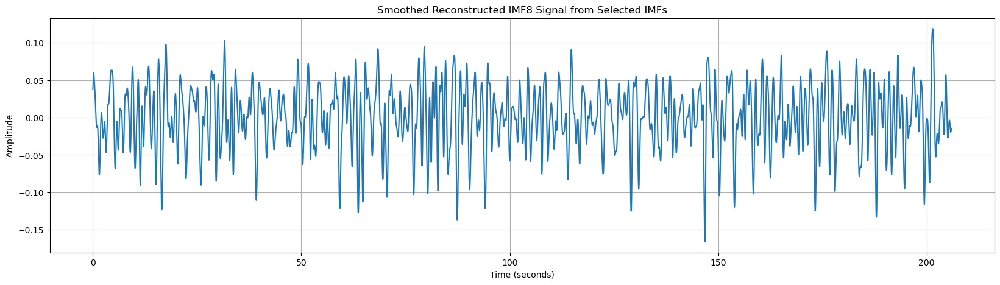

In [917]:
# Import the necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from PyEMD import EEMD
from scipy.fft import fft
from scipy.signal import welch

# Function to calculate and plot the frequency spectrum
def plot_frequency_spectrum(signal, fs, title):
    f, Pxx = welch(signal, fs, nperseg=256)
    plt.figure(figsize=(12, 8))
    plt.semilogy(f, Pxx)
    plt.title(title)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power/Frequency (dB/Hz)")
    plt.grid(True)
    plt.show()

for i in range(num_imfs_sub8):
    plot_frequency_spectrum(avg_imfs_sub8[i, :], fs, f"Spectrum of Averaged IMF {i+1}")
    
# indices of the desired IMFs
selected_imf_indices = [4,5,6] 

# Initialize the reconstructed signal
reconstructed_signal8 = np.zeros_like(avg_imfs_sub8[selected_imf_indices[0]])

# Add the selected IMFs to the reconstructed signal
for index in selected_imf_indices:
    reconstructed_signal8 += avg_imfs_sub8[index]

# Plot the reconstructed signal
plt.figure(figsize=(20, 6))
plt.plot(segment_time8, reconstructed_signal8[:segment_samples8])
plt.title("Reconstructed Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

# window size for the SMOOTHING moving average
window_size = 23

# Calculate the moving average
smoothed_reconstructed_signal82 = np.convolve(reconstructed_signal8, np.ones(window_size)/window_size, mode='same')

# Plot the smoothed reconstructed signal
plt.figure(figsize=(20, 5))
plt.plot(segment_time8, smoothed_reconstructed_signal82[:segment_samples8])
plt.title("Smoothed Reconstructed IMF8 Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

# SUBJECT 9

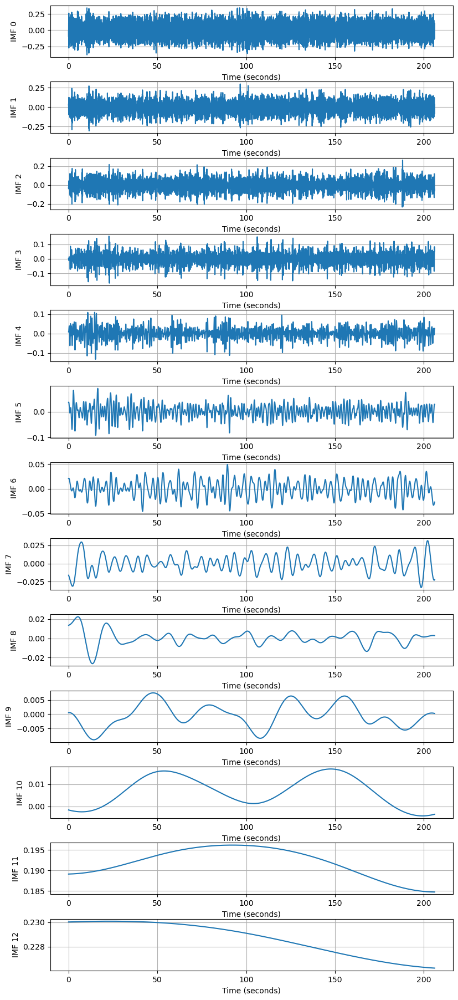

Combined plot saved successfully.


In [918]:
for i, noisy_signal_sub9 in enumerate(noisy_signals_sub9):
    imfs_sub9 = eemd_sub9.eemd(noisy_signal_sub9)
    if i == 0:
        avg_imfs_sub9 = imfs_sub9
    else:
        avg_imfs_sub9 += imfs_sub9

avg_imfs_sub9 /= len(noisy_signals_sub9)

# Plot each average IMF in separate, individual plots for subject 9
num_imfs_sub9 = avg_imfs_sub9.shape[0]

# Create a single column of subplots with 13 rows for subject 9
fig, axs = plt.subplots(num_imfs_sub9, 1, figsize=(8, 18))
fig.tight_layout()

for i in range(num_imfs_sub9):
    ax = axs[i]

    ax.plot(segment_time9, avg_imfs_sub9[i, :segment_samples9])
    #ax.set_title(f"Averaged IMF from EEMD")
    ax.set_xlabel("Time (seconds)")
    ax.set_ylabel(f"IMF {i}")
    ax.grid(True)

# Save the combined grid of plots as an image
plt.savefig('combined_plots3.png', dpi=300)  
plt.show()
plt.close()  



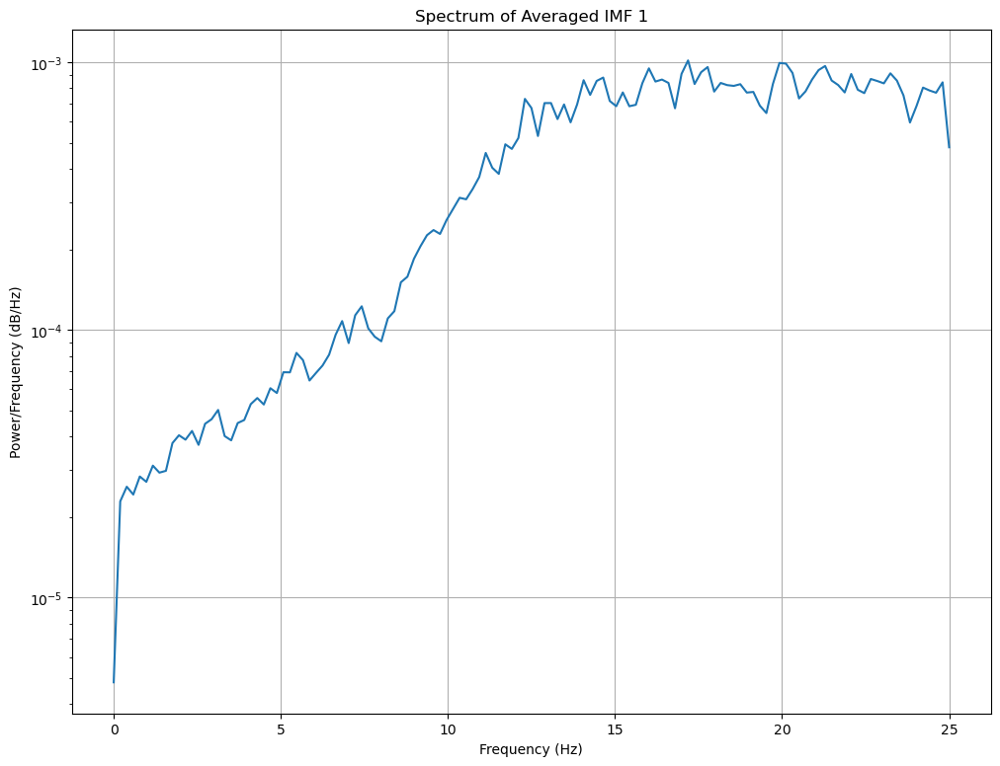

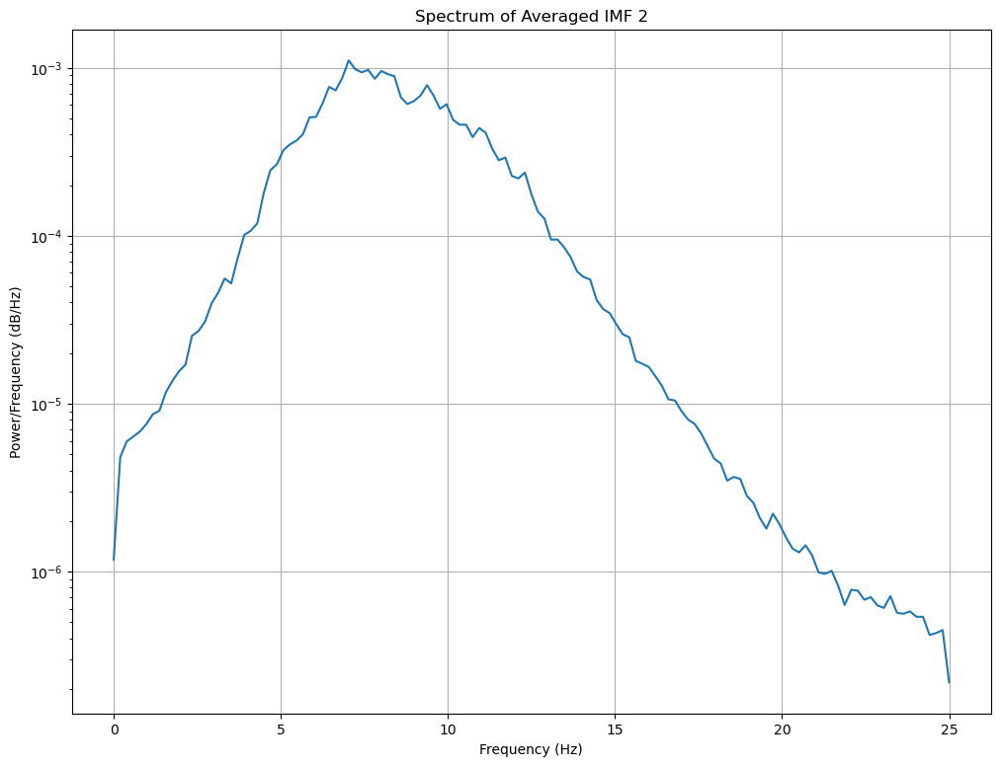

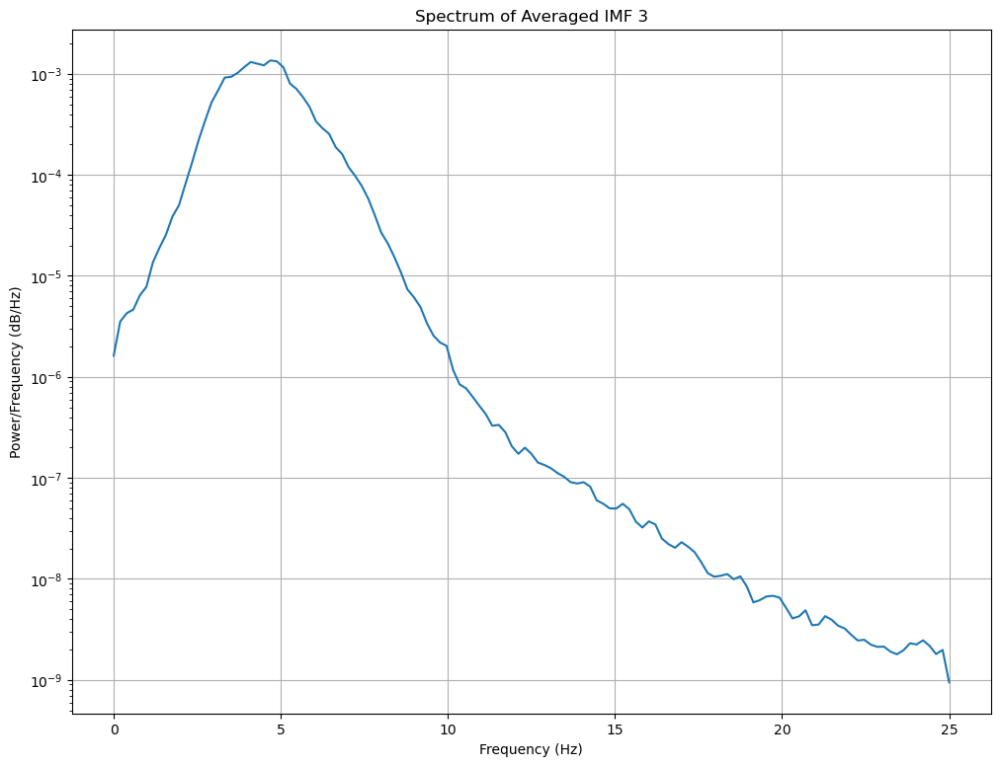

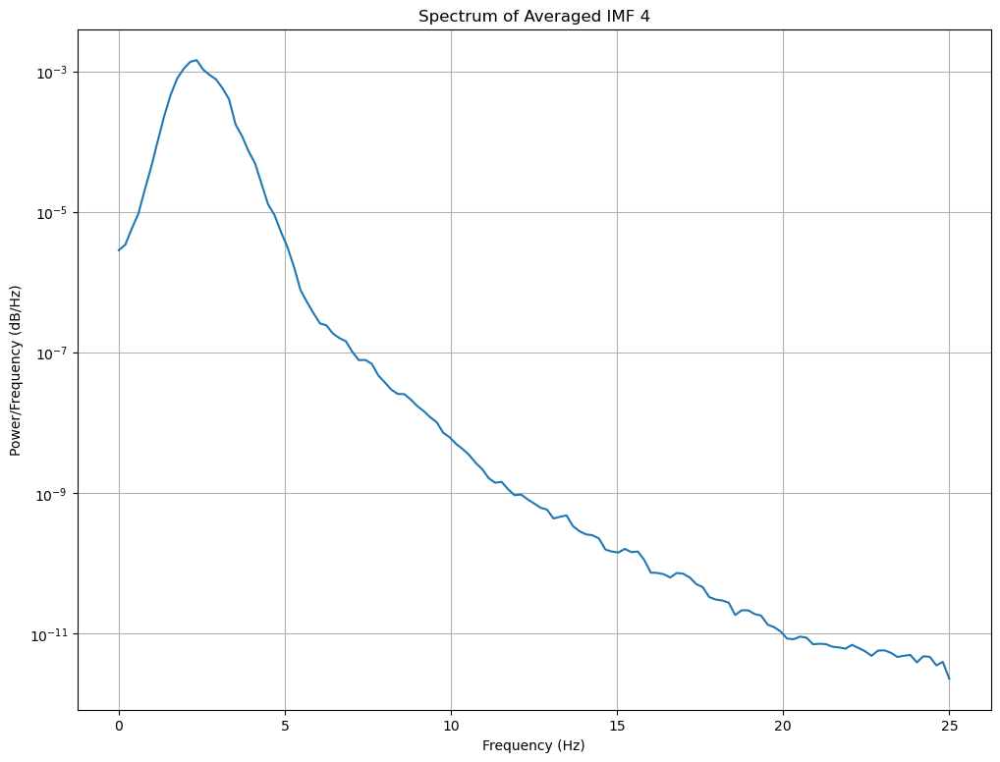

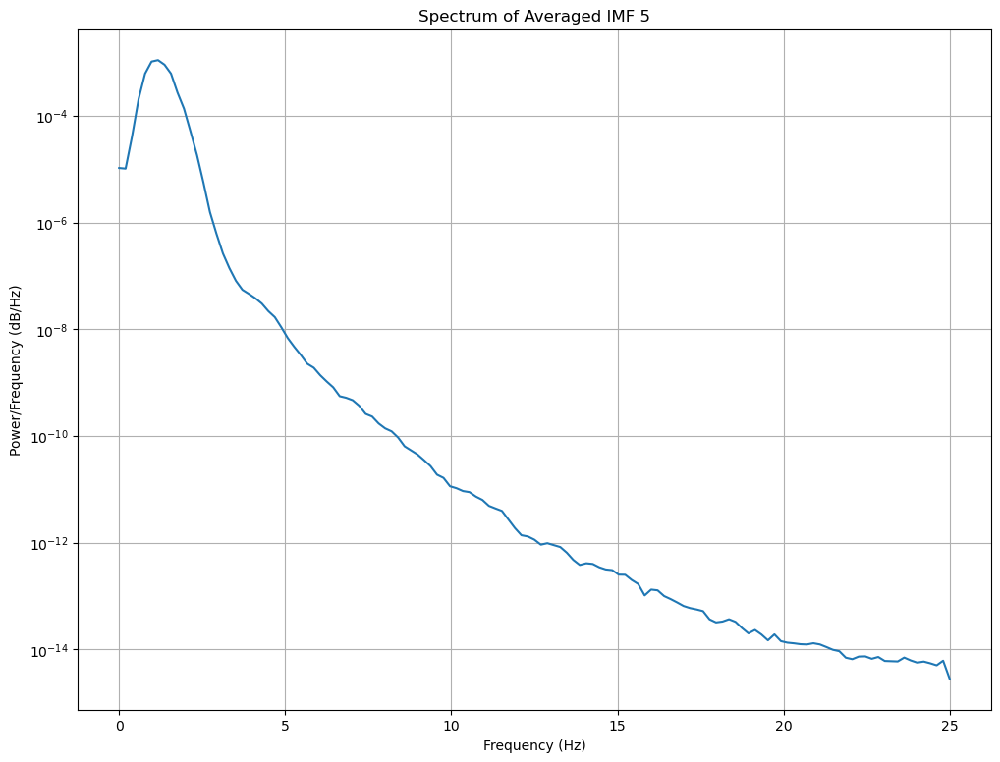

...

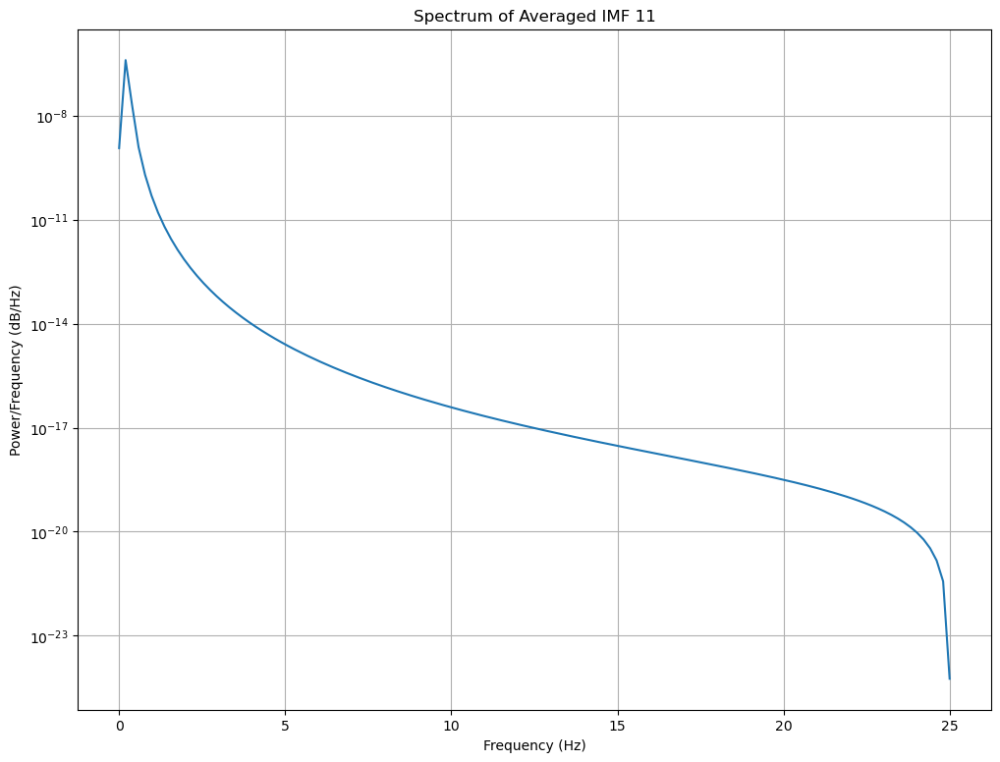

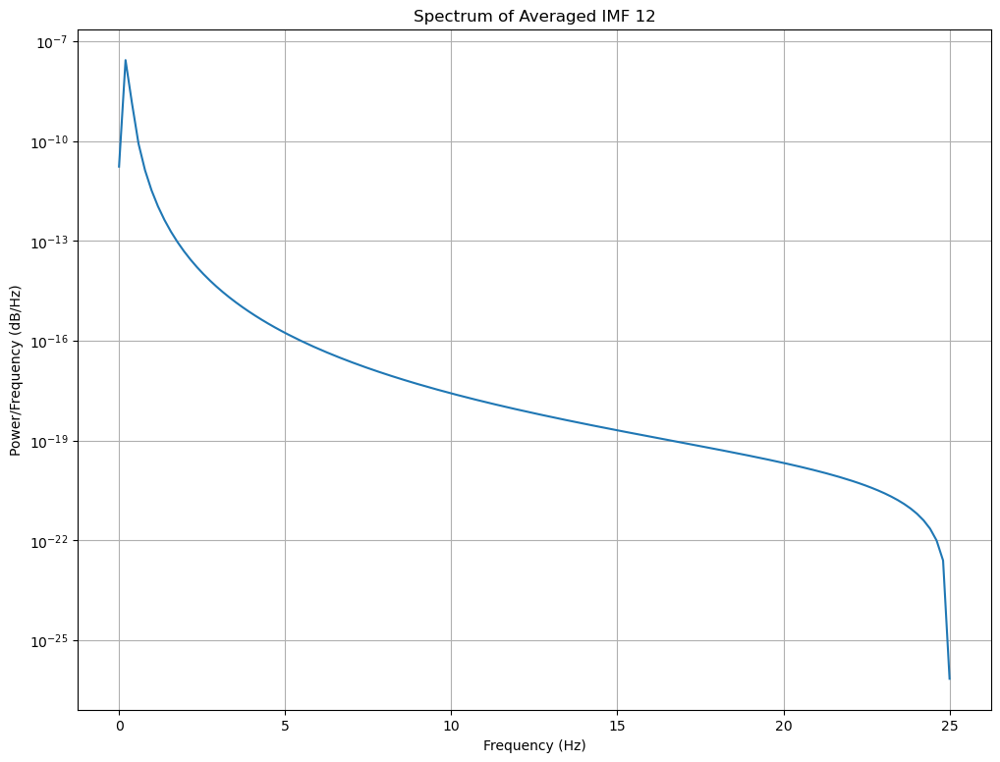

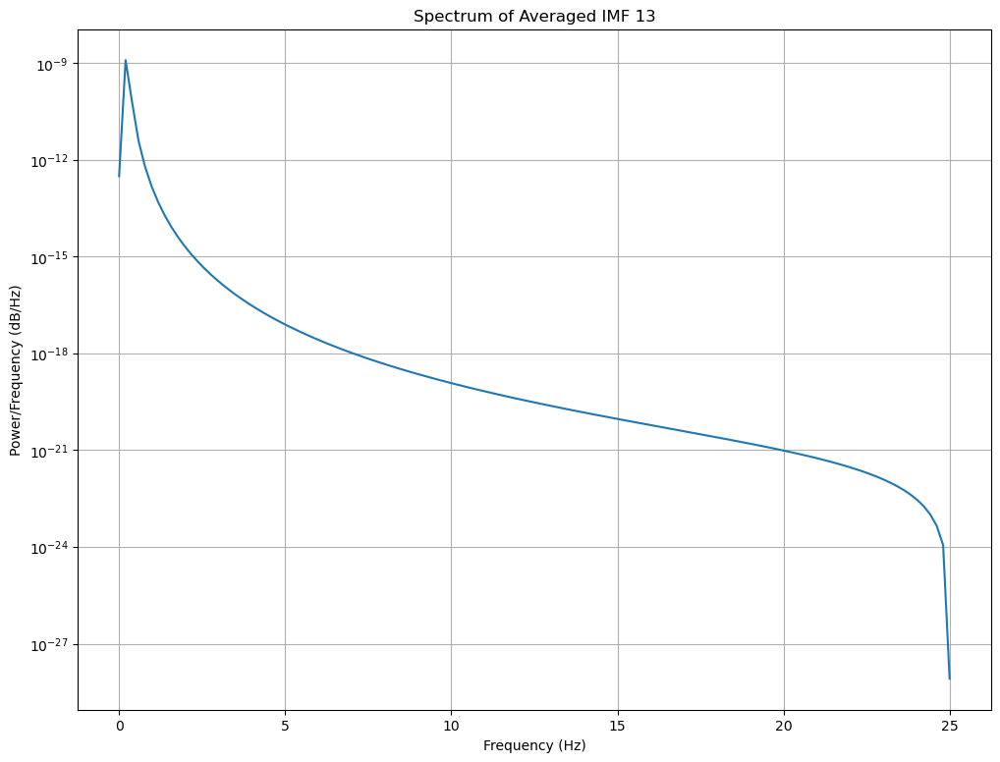

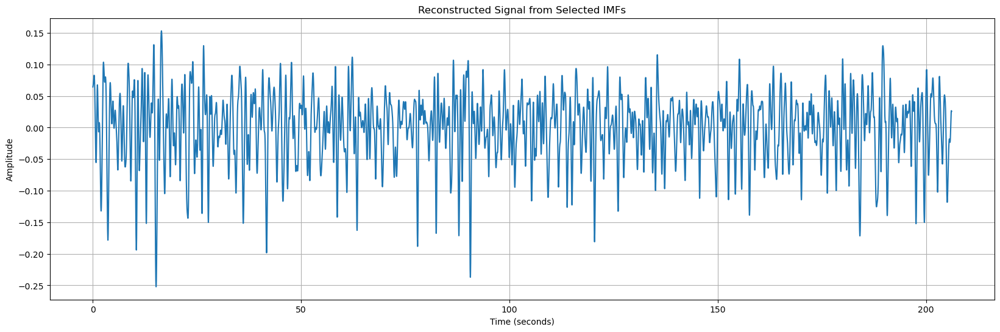

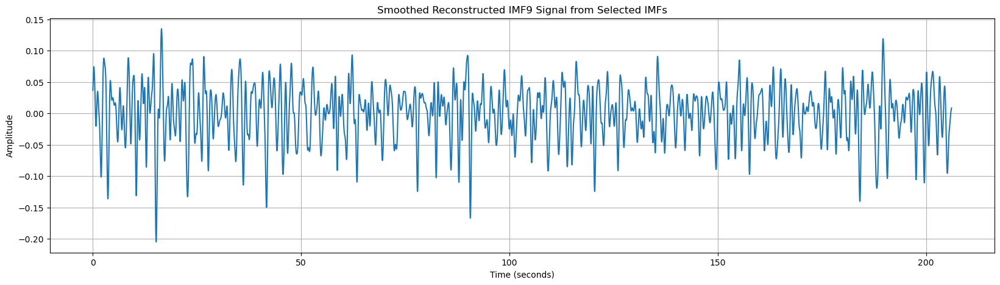

In [920]:
# Import the necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from PyEMD import EEMD
from scipy.fft import fft
from scipy.signal import welch

# Function to calculate and plot the frequency spectrum
def plot_frequency_spectrum(signal, fs, title):
    f, Pxx = welch(signal, fs, nperseg=256)
    plt.figure(figsize=(12, 9))
    plt.semilogy(f, Pxx)
    plt.title(title)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power/Frequency (dB/Hz)")
    plt.grid(True)
    plt.show()

for i in range(num_imfs_sub9):
    plot_frequency_spectrum(avg_imfs_sub9[i, :], fs, f"Spectrum of Averaged IMF {i+1}")
    
#  indices of the desired IMFs
selected_imf_indices = [4,5,6]  

# Initialize the reconstructed signal
reconstructed_signal9 = np.zeros_like(avg_imfs_sub9[selected_imf_indices[0]])

# Add the selected IMFs to the reconstructed signal
for index in selected_imf_indices:
    reconstructed_signal9 += avg_imfs_sub9[index]

# Plot the reconstructed signal
plt.figure(figsize=(20, 6))
plt.plot(segment_time9, reconstructed_signal9[:segment_samples9])
plt.title("Reconstructed Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

# window size for the SMOOTHING moving average
window_size = 23

# Calculate the moving average
smoothed_reconstructed_signal92 = np.convolve(reconstructed_signal9, np.ones(window_size)/window_size, mode='same')

# Plot the smoothed reconstructed signal
plt.figure(figsize=(20, 5))
plt.plot(segment_time9, smoothed_reconstructed_signal92[:segment_samples9])
plt.title("Smoothed Reconstructed IMF9 Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()
    


# SUBJECT 10

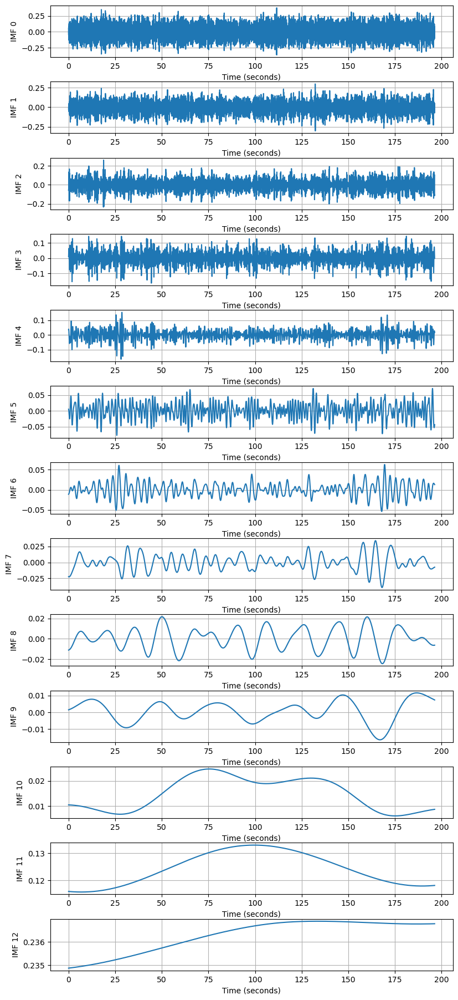

Combined plot saved successfully.


In [921]:
for i, noisy_signal_sub10 in enumerate(noisy_signals_sub10):
    imfs_sub10 = eemd_sub10.eemd(noisy_signal_sub10)
    if i == 0:
        avg_imfs_sub10 = imfs_sub10
    else:
        avg_imfs_sub10 += imfs_sub10

avg_imfs_sub10 /= len(noisy_signals_sub10)

# Plot each average IMF in separate, individual plots for subject 10
num_imfs_sub10 = avg_imfs_sub10.shape[0]

# Create a single column grid of subplots with 13 rows for subject 10
fig, axs = plt.subplots(num_imfs_sub10, 1, figsize=(8, 18))
fig.tight_layout()

for i in range(num_imfs_sub10):
    ax = axs[i]

    ax.plot(segment_time10, avg_imfs_sub10[i, :segment_samples10])
    #ax.set_title(f"Averaged IMF from EEMD")
    ax.set_xlabel("Time (seconds)")
    ax.set_ylabel(f"IMF {i}")
    ax.grid(True)

# Save the combined plots as an image
plt.savefig('combined_plots3.png', dpi=300) 
plt.show()
plt.close() 


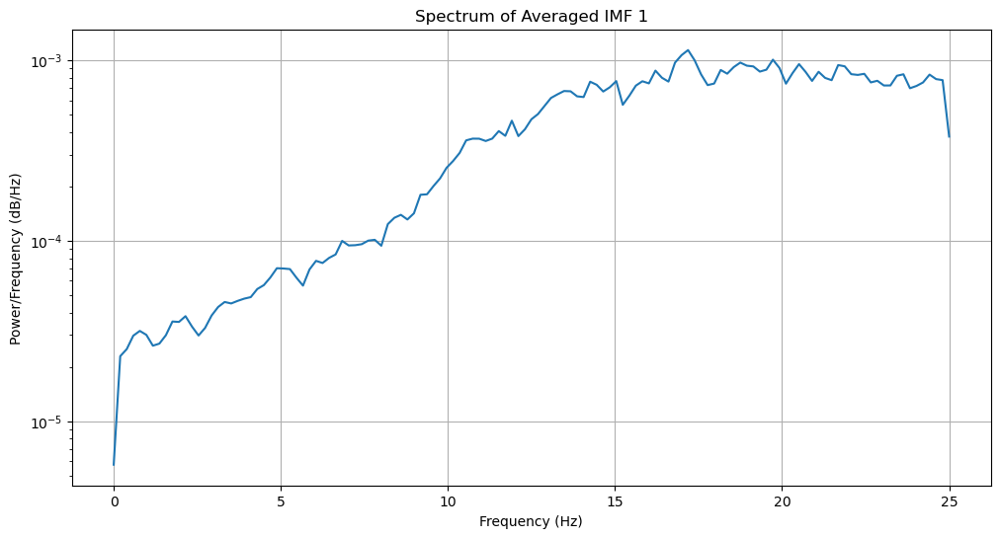

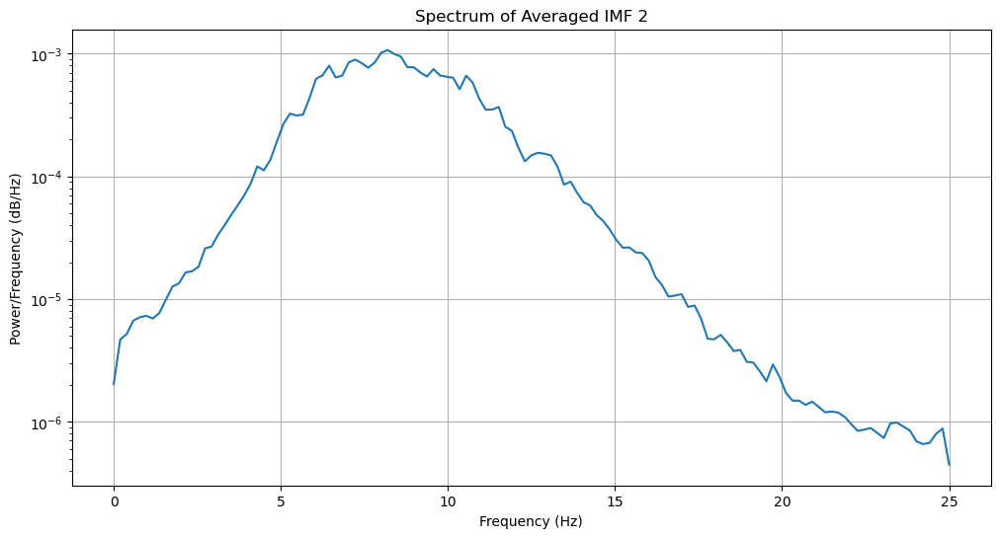

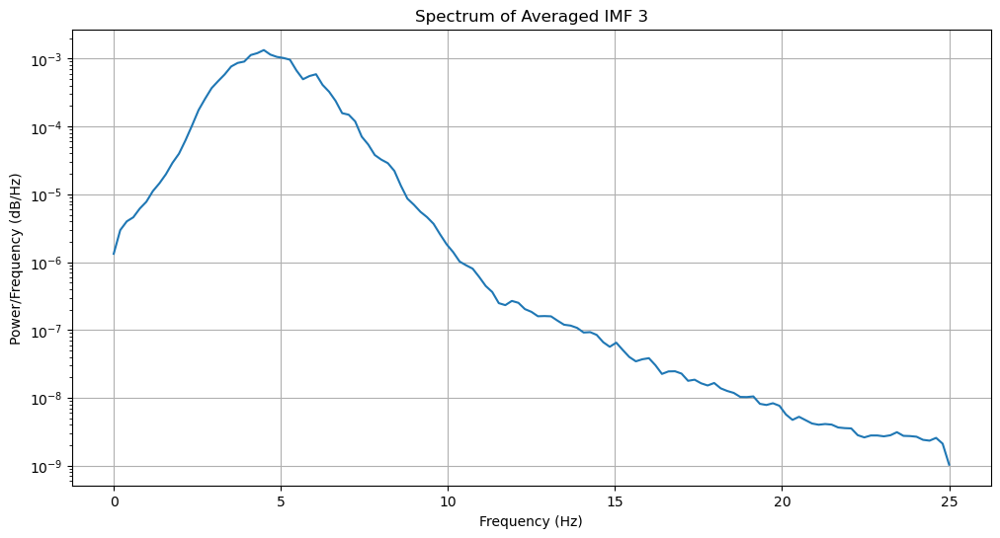

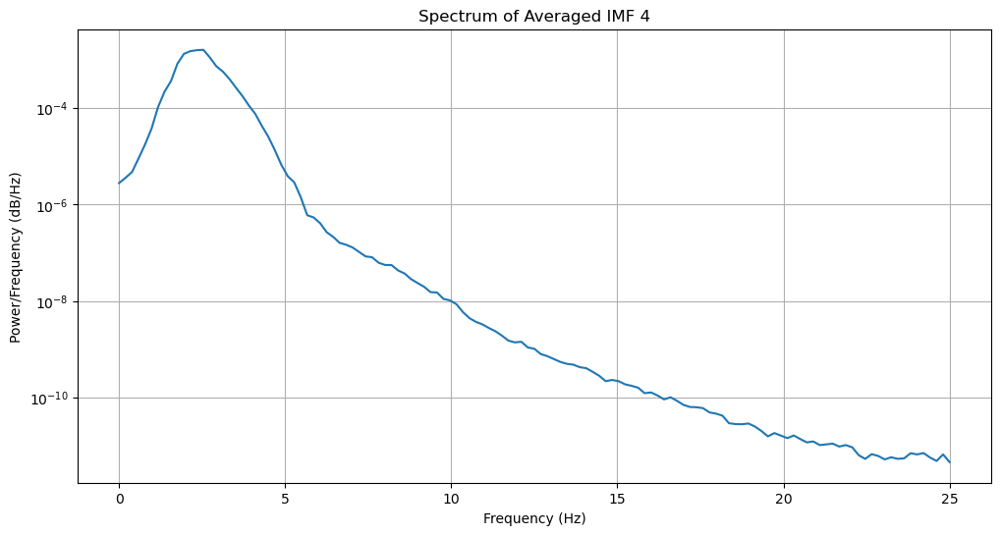

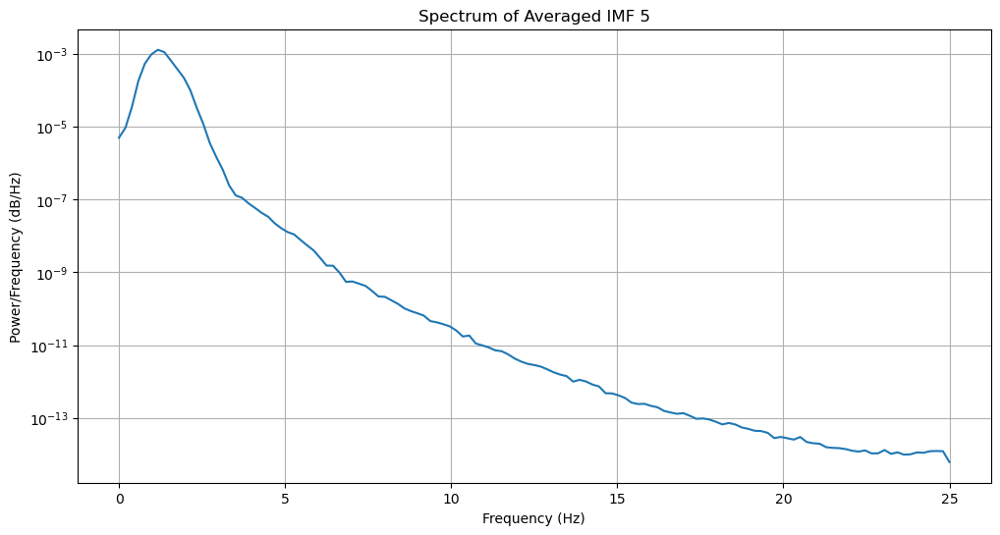

...

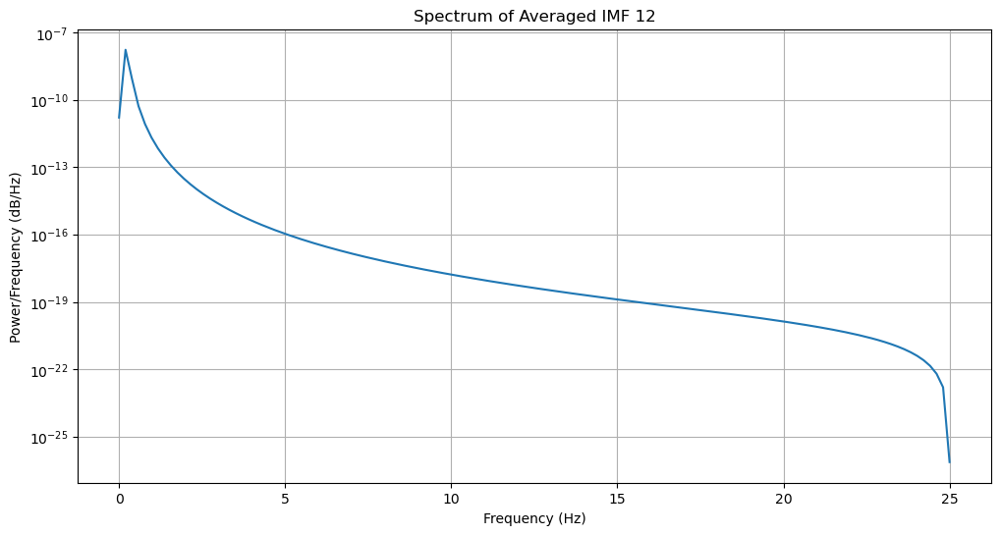

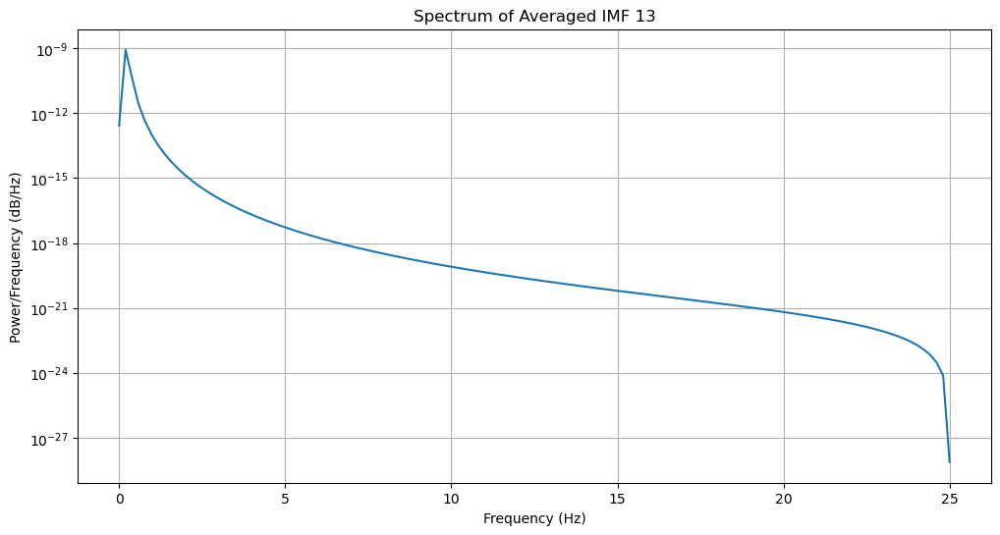

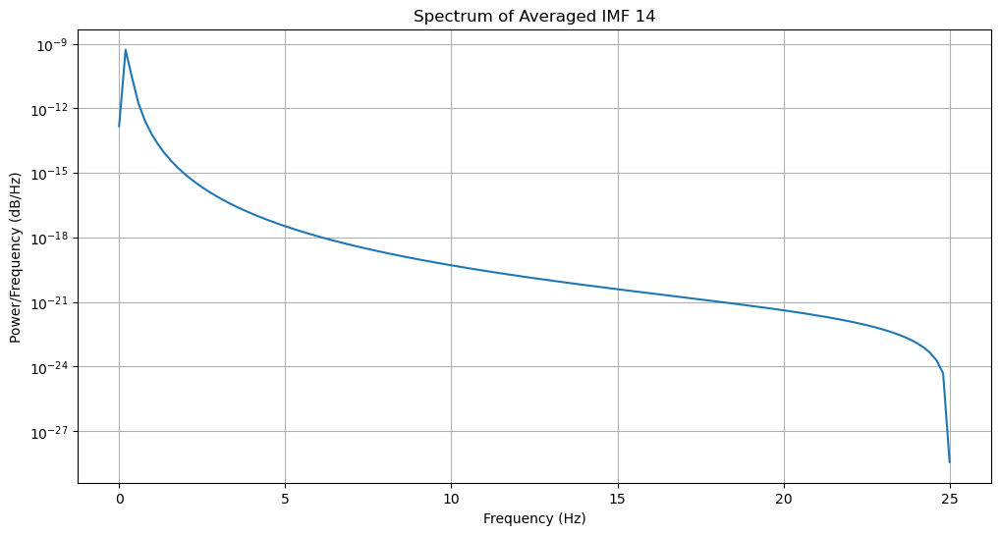

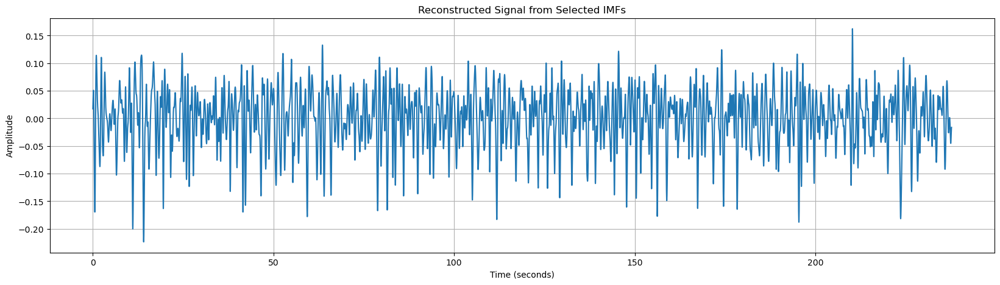

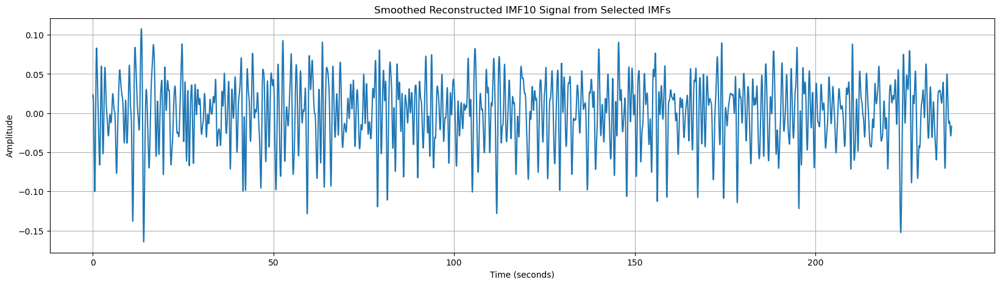

In [868]:
# Import the necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from PyEMD import EEMD
from scipy.fft import fft
from scipy.signal import welch

# Function to calculate and plot the frequency spectrum
def plot_frequency_spectrum(signal, fs, title):
    f, Pxx = welch(signal, fs, nperseg=256)
    plt.figure(figsize=(12, 6))
    plt.semilogy(f, Pxx)
    plt.title(title)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power/Frequency (dB/Hz)")
    plt.grid(True)
    plt.show()

for i in range(num_imfs_sub10):
    plot_frequency_spectrum(avg_imfs_sub10[i, :], fs, f"Spectrum of Averaged IMF {i+1}")
    
#  indices of the desired IMFs
selected_imf_indices = [4,5,6] 

# Initialize the reconstructed signal
reconstructed_signal10 = np.zeros_like(avg_imfs_sub10[selected_imf_indices[0]])

# Add the selected IMFs to the reconstructed signal
for index in selected_imf_indices:
    reconstructed_signal10 += avg_imfs_sub10[index]

# Plot the reconstructed signal
plt.figure(figsize=(20, 5))
plt.plot(segment_time10, reconstructed_signal10[:segment_samples10])
plt.title("Reconstructed Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

# window size for the SMOOTHING moving average
window_size = 23

# Calculate the moving average
smoothed_reconstructed_signal10 = np.convolve(reconstructed_signal10, np.ones(window_size)/window_size, mode='same')

# Plot the smoothed reconstructed signal
plt.figure(figsize=(20, 5))
plt.plot(segment_time10, smoothed_reconstructed_signal10[:segment_samples10])
plt.title("Smoothed Reconstructed IMF10 Signal from Selected IMFs")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()
    


In [ ]:
#jpeak_indices_sub1 = jpeak_indices[0:61]
# Find local maxima in the derivative signal (J-peaks)
#jpeak_indices_sub1, _ = find_peaks(reconstructed_signal1, height = 0.02) 
#jpeak_indices_sub2, _ = find_peaks(reconstructed_signal_sub22, height = 0.02)
#jpeak_indices_sub3, _ = find_peaks(reconstructed_signal_sub3, height = 0.002) 
#jpeak_indices_sub4, _ = find_peaks(IMF4_derivative, height = 0.002)
#jpeak_indices_sub5, _ = find_peaks(IMF5_derivative, height = 0.0025) 
#jpeak_indices_sub6, _ = find_peaks(IMF6_derivative, height = 0.002)
#jpeak_indices_sub7, _ = find_peaks(IMF7_derivative, height = 0.002) 
#jpeak_indices_sub8, _ = find_peaks(IMF8_derivative, height = 0.002)
#jpeak_indices_sub9, _ = find_peaks(IMF9_derivative, height = 0.0005) 
#jpeak_indices_sub10, _ = find_peaks(IMF10_derivative, height = 0.0035)

# PEAK DETECTION AND HRV (BPM) CALCULATION FOR DURATION 200s

J-J Intervals (seconds): [0.64 0.66 0.82 0.9  0.82 1.18 0.66 0.92 0.94 0.72 0.66 0.62 0.64 1.12
 1.42 0.84 0.78 0.78 0.82 0.82 1.1  0.94 1.14 0.76 0.98 0.74 1.26 1.2
 0.78 1.34 0.64 0.64 0.64 0.68 0.7  1.16 0.78 0.68 0.62 1.06 0.7  0.66
 0.94 0.98 0.76 0.62 1.36 1.24 0.94 0.72 1.28 0.94 0.8  1.1  0.68 1.3
 0.82 1.22 1.72 1.2  1.08 1.3  0.82 0.78 1.08 1.36 1.02 0.94 0.64 0.62
 1.   0.86 0.6  0.76 1.18 0.6  0.82 1.4  1.76 0.9  1.34 0.62 1.12 0.88
 0.84 0.96 0.72 0.66 1.18 0.6  0.76 0.6  0.72 1.22 1.16 0.72 1.02 1.
 0.64 0.72 0.76 0.78 0.62 0.7  0.92 0.8  1.2  1.06 1.06 0.68 1.7  0.78
 0.72 0.6  1.26 0.6  1.32 0.84 1.44 1.16 1.06 1.58 0.84 0.78 1.38 0.86
 0.62 1.12 0.86 0.94 0.86 1.22 0.82 0.7  0.92 1.42 0.62 0.84 1.38 0.86
 0.8  0.82 1.   0.78 0.76 1.48 0.9  0.7  1.2  0.98 1.22 0.78 0.94 0.8
 0.8  0.96 0.66 0.64 1.2  1.36 1.26 1.58 1.2  1.58 0.78 1.06 0.72 0.8
 0.98 0.94 0.64 0.66 0.86 1.24 1.04 1.3  0.88 1.1  1.3  0.74 0.9  0.84
 1.   1.32 0.98 0.7  0.6  0.7  0.94 1.   0.88 0.92 0.68 0.

HRV Features:    HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  938.082192  258.680442   26.125912  266.441621         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD   HRV_SDSD  ...  HRV_SampEn  HRV_ShanEn  \
0         NaN         NaN  353.522251  354.33587  ...    1.870498    5.283142   

   HRV_FuzzyEn  HRV_MSEn  HRV_CMSEn  HRV_RCMSEn    HRV_CD   HRV_HFD   HRV_KFD  \
0     1.602315  1.178105   1.527404    1.809952  1.854997  1.963615  3.881339   

    HRV_LZC  
0  1.100541  

[1 rows x 91 columns]
HRV Features:    HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  926.696833  232.93082   25.015187  237.191266         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD   HRV_SDSD  ...  HRV_SampEn  HRV_ShanEn  \
0         NaN         NaN  321.561531  322.28804  ...    2.108429     5.20815   

   HRV_FuzzyEn  HRV_MSEn  HRV_CMSEn  HRV_RCMSEn   HRV_CD   HRV_HFD  HRV_KFD  \
0     1.624285  1.318579   1.485922    2.0665

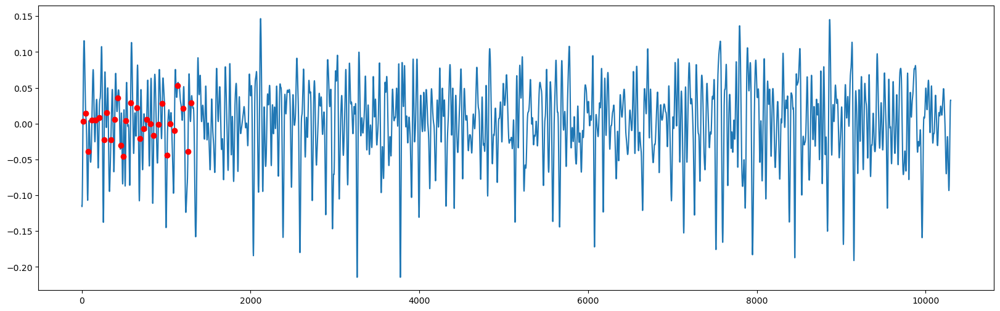

In [980]:
import numpy as np
from scipy.signal import find_peaks
from scipy.stats import describe
import neurokit2 as nk


# the derivative of soomthied signal for subject 1 - 10
IMF1_derivative = np.diff(smoothed_reconstructed_signal12)
IMF2_derivative = np.diff(smoothed_reconstructed_signal22)
IMF3_derivative = np.diff(smoothed_reconstructed_signal32)
IMF4_derivative = np.diff(smoothed_reconstructed_signal42)
IMF5_derivative = np.diff(smoothed_reconstructed_signal52)
IMF6_derivative = np.diff(smoothed_reconstructed_signal62)
IMF7_derivative = np.diff(smoothed_reconstructed_signal72)
IMF8_derivative = np.diff(smoothed_reconstructed_signal82)
IMF9_derivative = np.diff(smoothed_reconstructed_signal92)
IMF10_derivative = np.diff(smoothed_reconstructed_signal10)

min_peak_distance = 30
jpeak_indices_sub1, _ = find_peaks(IMF1_derivative, distance=min_peak_distance)
jpeak_indices_sub2, _ = find_peaks(IMF2_derivative, distance=min_peak_distance)
jpeak_indices_sub3, _ = find_peaks(IMF3_derivative, distance=min_peak_distance)
jpeak_indices_sub4, _ = find_peaks(IMF4_derivative, distance=min_peak_distance)
jpeak_indices_sub5, _ = find_peaks(IMF5_derivative, distance=min_peak_distance)
jpeak_indices_sub6, _ = find_peaks(IMF6_derivative, distance=min_peak_distance)
jpeak_indices_sub7, _ = find_peaks(IMF7_derivative, distance=min_peak_distance)
jpeak_indices_sub8, _ = find_peaks(IMF8_derivative, distance=min_peak_distance)
jpeak_indices_sub9, _ = find_peaks(IMF9_derivative, distance=min_peak_distance)
jpeak_indices_sub10, _ = find_peaks(IMF10_derivative, distance=min_peak_distance)



#  J-J intervals
jj_intervals_sub1 = np.diff(jpeak_indices_sub1) ; jj_intervals_sub2 = np.diff(jpeak_indices_sub2)
jj_intervals_sub3 = np.diff(jpeak_indices_sub3) ; jj_intervals_sub4 = np.diff(jpeak_indices_sub4)
jj_intervals_sub5 = np.diff(jpeak_indices_sub5) ; jj_intervals_sub6 = np.diff(jpeak_indices_sub6)
jj_intervals_sub7 = np.diff(jpeak_indices_sub7) ; jj_intervals_sub8 = np.diff(jpeak_indices_sub8)
jj_intervals_sub9 = np.diff(jpeak_indices_sub9) ; jj_intervals_sub10 = np.diff(jpeak_indices_sub10)


#  J-J intervals to time units (seconds)
sampling_frequency = 50 
jj_intervals_time_sub1 = jj_intervals_sub1 / sampling_frequency ; jj_intervals_time_sub2 = jj_intervals_sub2 / sampling_frequency
jj_intervals_time_sub3 = jj_intervals_sub3 / sampling_frequency ; jj_intervals_time_sub4 = jj_intervals_sub4 / sampling_frequency
jj_intervals_time_sub5 = jj_intervals_sub5 / sampling_frequency ; jj_intervals_time_sub6 = jj_intervals_sub6 / sampling_frequency
jj_intervals_time_sub7 = jj_intervals_sub7 / sampling_frequency ; jj_intervals_time_sub8 = jj_intervals_sub8 / sampling_frequency
jj_intervals_time_sub9 = jj_intervals_sub9 / sampling_frequency ; jj_intervals_time_sub10 = jj_intervals_sub10 / sampling_frequency


# Calculate BCG timestamps
bcg_timestamps_sub1 = jpeak_indices_sub1 / sampling_frequency ; bcg_timestamps_sub2 = jpeak_indices_sub2 / sampling_frequency
bcg_timestamps_sub3 = jpeak_indices_sub3 / sampling_frequency ; bcg_timestamps_sub4 = jpeak_indices_sub4 / sampling_frequency
bcg_timestamps_sub5 = jpeak_indices_sub5 / sampling_frequency ; bcg_timestamps_sub6 = jpeak_indices_sub6 / sampling_frequency
bcg_timestamps_sub7 = jpeak_indices_sub7 / sampling_frequency ; bcg_timestamps_sub8 = jpeak_indices_sub8 / sampling_frequency
bcg_timestamps_sub9 = jpeak_indices_sub9 / sampling_frequency ; bcg_timestamps_sub10 = jpeak_indices_sub10 / sampling_frequency


#  J-J intervals in time units
print("J-J Intervals (seconds):", jj_intervals_time_sub1)  ; print("J-J Intervals (seconds):", jj_intervals_time_sub2)
print("J-J Intervals (seconds):", jj_intervals_time_sub3)  ; print("J-J Intervals (seconds):", jj_intervals_time_sub4)
print("J-J Intervals (seconds):", jj_intervals_time_sub5)  ; print("J-J Intervals (seconds):", jj_intervals_time_sub6)
print("J-J Intervals (seconds):", jj_intervals_time_sub7)  ; print("J-J Intervals (seconds):", jj_intervals_time_sub8)
print("J-J Intervals (seconds):", jj_intervals_time_sub9)  ; print("J-J Intervals (seconds):", jj_intervals_time_sub10)

#  mean J-J interval in seconds
mean_jj_interval_sub1 = np.mean(jj_intervals_time_sub1) ; mean_jj_interval_sub2 = np.mean(jj_intervals_time_sub2)
mean_jj_interval_sub3 = np.mean(jj_intervals_time_sub3) ; mean_jj_interval_sub4 = np.mean(jj_intervals_time_sub4)
mean_jj_interval_sub5 = np.mean(jj_intervals_time_sub5) ; mean_jj_interval_sub6 = np.mean(jj_intervals_time_sub6)
mean_jj_interval_sub7 = np.mean(jj_intervals_time_sub7) ; mean_jj_interval_sub8 = np.mean(jj_intervals_time_sub8)
mean_jj_interval_sub9 = np.mean(jj_intervals_time_sub9) ; mean_jj_interval_sub10 = np.mean(jj_intervals_time_sub10)

#  average heart rate in beats per minute (BPM)
avg_jjbpm_sub1 = 60 / mean_jj_interval_sub1 ; avg_jjbpm_sub2 = 60 / mean_jj_interval_sub2
avg_jjbpm_sub3 = 60 / mean_jj_interval_sub3 ; avg_jjbpm_sub4 = 60 / mean_jj_interval_sub4
avg_jjbpm_sub5 = 60 / mean_jj_interval_sub5 ; avg_jjbpm_sub6 = 60 / mean_jj_interval_sub6
avg_jjbpm_sub7 = 60 / mean_jj_interval_sub7 ; avg_jjbpm_sub8 = 60 / mean_jj_interval_sub8
avg_jjbpm_sub9 = 60 / mean_jj_interval_sub9 ; avg_jjbpm_sub10 = 60 / mean_jj_interval_sub10


# Extract HRV features
hrv_features_sub1 = nk.hrv(jpeak_indices_sub1, sampling_rate=50) ;  print("HRV Features:", hrv_features_sub1)
hrv_features_sub2 = nk.hrv(jpeak_indices_sub2, sampling_rate=50) ;  print("HRV Features:", hrv_features_sub2)
hrv_features_sub3 = nk.hrv(jpeak_indices_sub3, sampling_rate=50) ;  print("HRV Features:", hrv_features_sub3)
#hrv_features_sub4 = nk.hrv(jpeak_indices_sub4, sampling_rate=50) ;  print("HRV Features:", hrv_features_sub4)
hrv_features_sub5 = nk.hrv(jpeak_indices_sub5, sampling_rate=50) ;  print("HRV Features:", hrv_features_sub5)
hrv_features_sub6 = nk.hrv(jpeak_indices_sub6, sampling_rate=50) ;  print("HRV Features:", hrv_features_sub6)
hrv_features_sub7 = nk.hrv(jpeak_indices_sub7, sampling_rate=50) ;  print("HRV Features:", hrv_features_sub7)
hrv_features_sub8 = nk.hrv(jpeak_indices_sub8, sampling_rate=50) ;  print("HRV Features:", hrv_features_sub8)
hrv_features_sub9 = nk.hrv(jpeak_indices_sub9, sampling_rate=50) ;  print("HRV Features:", hrv_features_sub9)
hrv_features_sub10 = nk.hrv(jpeak_indices_sub10, sampling_rate=50) ;  print("HRV Features:", hrv_features_sub10)




In [981]:
# Print the average bpm for each subject
print("Average BPM for Sub1:", avg_jjbpm_sub1) ; print("Average BPM for Sub2:", avg_jjbpm_sub2)
print("Average BPM for Sub3:", avg_jjbpm_sub3) ; print("Average BPM for Sub4:", avg_jjbpm_sub4)
print("Average BPM for Sub5:", avg_jjbpm_sub5) ; print("Average BPM for Sub5:", avg_jjbpm_sub6)
print("Average BPM for Sub5:", avg_jjbpm_sub7) ; print("Average BPM for Sub5:", avg_jjbpm_sub8)
print("Average BPM for Sub5:", avg_jjbpm_sub9) ; print("Average BPM for Sub5:", avg_jjbpm_sub10)

# Print the BCG timestamps for each subject
print("BCG Timestamps for Sub1:", bcg_timestamps_sub1) ; print("BCG Timestamps for Sub2:", bcg_timestamps_sub2)
print("BCG Timestamps for Sub3:", bcg_timestamps_sub3) ; print("BCG Timestamps for Sub4:", bcg_timestamps_sub4)
print("BCG Timestamps for Sub5:", bcg_timestamps_sub5) ; print("BCG Timestamps for Sub5:", bcg_timestamps_sub6)
print("BCG Timestamps for Sub5:", bcg_timestamps_sub7) ; print("BCG Timestamps for Sub5:", bcg_timestamps_sub8)
print("BCG Timestamps for Sub5:", bcg_timestamps_sub9) ; print("BCG Timestamps for Sub5:", bcg_timestamps_sub10)

Average BPM for Sub1: 63.96028037383178
Average BPM for Sub2: 64.74609375
Average BPM for Sub3: 64.80380499405469
Average BPM for Sub4: 65.7501494321578
Average BPM for Sub5: 62.73708783192296
Average BPM for Sub5: 61.515601783060916
Average BPM for Sub5: 63.288643533123036
Average BPM for Sub5: 61.457418788410884
Average BPM for Sub5: 61.48615832928606
Average BPM for Sub5: 63.74873010497799
BCG Timestamps for Sub1: [  0.26   0.9    1.56   2.38   3.28   4.1    5.28   5.94   6.86   7.8
   8.52   9.18   9.8   10.44  11.56  12.98  13.82  14.6   15.38  16.2
  17.02  18.12  19.06  20.2   20.96  21.94  22.68  23.94  25.14  25.92
  27.26  27.9   28.54  29.18  29.86  30.56  31.72  32.5   33.18  33.8
  34.86  35.56  36.22  37.16  38.14  38.9   39.52  40.88  42.12  43.06
  43.78  45.06  46.    46.8   47.9   48.58  49.88  50.7   51.92  53.64
  54.84  55.92  57.22  58.04  58.82  59.9   61.26  62.28  63.22  63.86
  64.48  65.48  66.34  66.94  67.7   68.88  69.48  70.3   71.7   73.46
  74.36  75.7 

#  HRV (BPM) CALCULATION FOR DURATION 12s (JJ INTERVALS WITH OUTLIERS)

In [982]:
import numpy as np
from scipy.signal import find_peaks
import neurokit2 as nk

# Define a function to calculate JJ intervals and timestamps not greater than 13 seconds
def calculate_jj_intervals_and_timestamps(IMF_derivative, sampling_frequency, max_timestamp):

    jpeak_indices, _ = find_peaks(IMF_derivative, distance=min_peak_distance)
    
    # Calculate BCG timestamps
    bcg_timestamps = jpeak_indices / sampling_frequency
    
    filtered_bcg_timestamps = bcg_timestamps[bcg_timestamps <= max_timestamp]
    
    
    # Calculate JJ intervals
    jj_intervals = np.diff(filtered_bcg_timestamps)
    
    # Filter JJ intervals and timestamps not greater than max_timestamp
    filtered_jj_intervals = jj_intervals[jj_intervals <= max_timestamp]
    
    return filtered_jj_intervals, filtered_bcg_timestamps
    return jpeak_indices

# Define the maximum timestamp 
max_timestamp = 13

sampling_frequency = 50  

# Create a list of DWT_derivative_ and subject names 
subjects = [
    (IMF1_derivative, "Sub1"),
    (IMF2_derivative, "Sub2"),
    (IMF3_derivative, "Sub3"),
    (IMF4_derivative, "Sub4"),
    (IMF5_derivative, "Sub5"),
    (IMF6_derivative, "Sub6"),
    (IMF7_derivative, "Sub7"),
    (IMF8_derivative, "Sub8"),
    (IMF9_derivative, "Sub9"),
    (IMF10_derivative, "Sub10"),
]

# Create dictionaries to store filtered JJ intervals and filtered BCG timestamps for each subject
filtered_jj_intervals_dict = {}
filtered_bcg_timestamps_dict = {}
jpeak_indices_dict = {}

# Iterate through subjects and calculate JJ intervals and timestamps
for subject_data, subject_name in subjects:
    filtered_jj_intervals, filtered_bcg_timestamps = calculate_jj_intervals_and_timestamps(subject_data, sampling_frequency, max_timestamp)
    
    # Store the filtered JJ intervals and filtered BCG timestamps in the dictionaries
    filtered_jj_intervals_dict[f"filtered_jj_intervals_{subject_name}"] = filtered_jj_intervals
    filtered_bcg_timestamps_dict[f"filtered_bcg_timestamps_{subject_name}"] = filtered_bcg_timestamps
    
    # Print the results for each subject
    print(f"JJ Intervals for {subject_name} (seconds):", filtered_jj_intervals)
    print(f"BCG Timestamps for {subject_name} (seconds):", filtered_bcg_timestamps)


#  filtered JJ intervals and filtered BCG timestamps for each subject using the dictionaries.
filtered_jj_intervals_sub1 = filtered_jj_intervals_dict["filtered_jj_intervals_Sub1"]
filtered_jj_intervals_sub2 = filtered_jj_intervals_dict["filtered_jj_intervals_Sub2"]
filtered_jj_intervals_sub3 = filtered_jj_intervals_dict["filtered_jj_intervals_Sub3"]
filtered_jj_intervals_sub4 = filtered_jj_intervals_dict["filtered_jj_intervals_Sub4"]
filtered_jj_intervals_sub5 = filtered_jj_intervals_dict["filtered_jj_intervals_Sub5"]
filtered_jj_intervals_sub6 = filtered_jj_intervals_dict["filtered_jj_intervals_Sub6"]
filtered_jj_intervals_sub7 = filtered_jj_intervals_dict["filtered_jj_intervals_Sub7"]
filtered_jj_intervals_sub8 = filtered_jj_intervals_dict["filtered_jj_intervals_Sub8"]
filtered_jj_intervals_sub9 = filtered_jj_intervals_dict["filtered_jj_intervals_Sub9"]
filtered_jj_intervals_sub10 = filtered_jj_intervals_dict["filtered_jj_intervals_Sub10"]


#  mean J-J interval in seconds
mean_jj_interval_sub1 = np.mean(filtered_jj_intervals_sub1) ; mean_jj_interval_sub2 = np.mean(filtered_jj_intervals_sub2)
mean_jj_interval_sub3 = np.mean(filtered_jj_intervals_sub3) ; mean_jj_interval_sub4 = np.mean(filtered_jj_intervals_sub4)
mean_jj_interval_sub5 = np.mean(filtered_jj_intervals_sub5) ; mean_jj_interval_sub6 = np.mean(filtered_jj_intervals_sub6)
mean_jj_interval_sub7 = np.mean(filtered_jj_intervals_sub7) ; mean_jj_interval_sub8 = np.mean(filtered_jj_intervals_sub8)
mean_jj_interval_sub9 = np.mean(filtered_jj_intervals_sub9) ; mean_jj_interval_sub10 = np.mean(filtered_jj_intervals_sub10)

#  average heart rate in beats per minute (BPM)
avg_jjbpm_sub1 = 60 / filtered_jj_intervals_sub1 ; avg_jjbpm_sub2 = 60 / filtered_jj_intervals_sub6
avg_jjbpm_sub3 = 60 / filtered_jj_intervals_sub2 ; avg_jjbpm_sub4 = 60 / filtered_jj_intervals_sub7
avg_jjbpm_sub5 = 60 / filtered_jj_intervals_sub3 ; avg_jjbpm_sub6 = 60 / filtered_jj_intervals_sub8
avg_jjbpm_sub7 = 60 / filtered_jj_intervals_sub4 ; avg_jjbpm_sub8 = 60 / filtered_jj_intervals_sub9
avg_jjbpm_sub9 = 60 / filtered_jj_intervals_sub5 ; avg_jjbpm_sub10 = 60 / filtered_jj_intervals_sub10


# Print the average bpm for each subject
print("Average BPM for Sub1:", avg_jjbpm_sub1) ; print("Average BPM for Sub2:", avg_jjbpm_sub2)
print("Average BPM for Sub3:", avg_jjbpm_sub3) ; print("Average BPM for Sub4:", avg_jjbpm_sub4)
print("Average BPM for Sub5:", avg_jjbpm_sub5) ; print("Average BPM for Sub5:", avg_jjbpm_sub6)
print("Average BPM for Sub5:", avg_jjbpm_sub7) ; print("Average BPM for Sub5:", avg_jjbpm_sub8)
print("Average BPM for Sub5:", avg_jjbpm_sub9) ; print("Average BPM for Sub5:", avg_jjbpm_sub10)


#  filtered BCG timestamps
filtered_bcg_timestamps_sub1 = filtered_bcg_timestamps_dict["filtered_bcg_timestamps_Sub1"]
filtered_bcg_timestamps_sub2 = filtered_bcg_timestamps_dict["filtered_bcg_timestamps_Sub2"]
filtered_bcg_timestamps_sub3 = filtered_bcg_timestamps_dict["filtered_bcg_timestamps_Sub3"]
filtered_bcg_timestamps_sub4 = filtered_bcg_timestamps_dict["filtered_bcg_timestamps_Sub4"]
filtered_bcg_timestamps_sub5 = filtered_bcg_timestamps_dict["filtered_bcg_timestamps_Sub5"]
filtered_bcg_timestamps_sub6 = filtered_bcg_timestamps_dict["filtered_bcg_timestamps_Sub6"]
filtered_bcg_timestamps_sub7 = filtered_bcg_timestamps_dict["filtered_bcg_timestamps_Sub7"]
filtered_bcg_timestamps_sub8 = filtered_bcg_timestamps_dict["filtered_bcg_timestamps_Sub8"]
filtered_bcg_timestamps_sub9 = filtered_bcg_timestamps_dict["filtered_bcg_timestamps_Sub9"]
filtered_bcg_timestamps_sub10 = filtered_bcg_timestamps_dict["filtered_bcg_timestamps_Sub10"]


# to access the jpeak_indices
filtered_jpeak_indices_sub1 = sampling_frequency * filtered_bcg_timestamps_sub1
filtered_jpeak_indices_sub2 = sampling_frequency * filtered_bcg_timestamps_sub2
filtered_jpeak_indices_sub3 = sampling_frequency * filtered_bcg_timestamps_sub3
filtered_jpeak_indices_sub4 = sampling_frequency * filtered_bcg_timestamps_sub4
filtered_jpeak_indices_sub5 = sampling_frequency * filtered_bcg_timestamps_sub5
filtered_jpeak_indices_sub6 = sampling_frequency * filtered_bcg_timestamps_sub6
filtered_jpeak_indices_sub7 = sampling_frequency * filtered_bcg_timestamps_sub7
filtered_jpeak_indices_sub8 = sampling_frequency * filtered_bcg_timestamps_sub8
filtered_jpeak_indices_sub9 = sampling_frequency * filtered_bcg_timestamps_sub9
filtered_jpeak_indices_sub10 = sampling_frequency * filtered_bcg_timestamps_sub10


filtered_hrv_features_sub1 = nk.hrv( filtered_jpeak_indices_sub1, sampling_rate=50) ; filtered_hrv_features_sub2 = nk.hrv( filtered_jpeak_indices_sub2, sampling_rate=50)
filtered_hrv_features_sub3 = nk.hrv( filtered_jpeak_indices_sub3, sampling_rate=50) ; #filtered_hrv_features_sub4 = nk.hrv( filtered_jpeak_indices_sub4, sampling_rate=50)
filtered_hrv_features_sub5 = nk.hrv( filtered_jpeak_indices_sub5, sampling_rate=50) ; #filtered_hrv_features_sub6 = nk.hrv( filtered_jpeak_indices_sub6, sampling_rate=50)
filtered_hrv_features_sub7 = nk.hrv( filtered_jpeak_indices_sub7, sampling_rate=50) ; filtered_hrv_features_sub8 = nk.hrv( filtered_jpeak_indices_sub8, sampling_rate=50)
filtered_hrv_features_sub9 = nk.hrv( filtered_jpeak_indices_sub9, sampling_rate=50) ; filtered_hrv_features_sub10 = nk.hrv( filtered_jpeak_indices_sub10, sampling_rate=50)

print("HRV Features:", filtered_hrv_features_sub1) ; print("HRV Features:", filtered_hrv_features_sub2)
print("HRV Features:", filtered_hrv_features_sub3) ; print("HRV Features:", filtered_hrv_features_sub4)
print("HRV Features:", filtered_hrv_features_sub5) ; print("HRV Features:", filtered_hrv_features_sub6)
print("HRV Features:", filtered_hrv_features_sub7) ; print("HRV Features:", filtered_hrv_features_sub8)
print("HRV Features:", filtered_hrv_features_sub9) ; print("HRV Features:", filtered_hrv_features_sub10)


JJ Intervals for Sub1 (seconds): [0.64 0.66 0.82 0.9  0.82 1.18 0.66 0.92 0.94 0.72 0.66 0.62 0.64 1.12
 1.42]
BCG Timestamps for Sub1 (seconds): [ 0.26  0.9   1.56  2.38  3.28  4.1   5.28  5.94  6.86  7.8   8.52  9.18
  9.8  10.44 11.56 12.98]
JJ Intervals for Sub2 (seconds): [1.12 0.78 0.9  0.72 1.06 1.36 1.08 0.82 1.28 0.92 1.36 1.1 ]
BCG Timestamps for Sub2 (seconds): [ 0.46  1.58  2.36  3.26  3.98  5.04  6.4   7.48  8.3   9.58 10.5  11.86
 12.96]
JJ Intervals for Sub3 (seconds): [0.62 1.26 1.5  1.64 0.9  0.72 0.8  1.04 0.86 0.68 0.64 0.86 0.66]
BCG Timestamps for Sub3 (seconds): [ 0.08  0.7   1.96  3.46  5.1   6.    6.72  7.52  8.56  9.42 10.1  10.74
 11.6  12.26]
JJ Intervals for Sub4 (seconds): [1.48 1.32 1.28 0.86 1.4  1.16 1.22 0.68 0.92 1.12]
BCG Timestamps for Sub4 (seconds): [ 0.82  2.3   3.62  4.9   5.76  7.16  8.32  9.54 10.22 11.14 12.26]
JJ Intervals for Sub5 (seconds): [1.12 0.82 0.72 1.02 0.82 0.78 0.62 0.84 0.82 0.78 0.86 1.   0.94 1.3 ]
BCG Timestamps for Sub5 (seco

C:\ProgramData\anaconda3\lib\site-packages\neurokit2\hrv\hrv_nonlinear.py:474: NeuroKitWarning: DFA_alpha2 related indices will not be calculated. The maximum duration of the windows provided for the long-term correlation is smaller than the minimum duration of windows. Refer to the `scale` argument in `nk.fractal_dfa()` for more information.
  warn(
C:\ProgramData\anaconda3\lib\site-packages\neurokit2\complexity\entropy_multiscale.py:351: RuntimeWarning: invalid value encountered in scalar divide
  mse = np.trapz(mse) / len(mse)
C:\ProgramData\anaconda3\lib\site-packages\neurokit2\complexity\optim_complexity_k.py:134: RuntimeWarning: divide by zero encountered in divide
  normalization = (n - 1) / (np.floor((n - k_subrange) / k).astype(int) * k)
C:\ProgramData\anaconda3\lib\site-packages\neurokit2\complexity\optim_complexity_k.py:135: RuntimeWarning: invalid value encountered in multiply
  sets = (np.nansum(np.abs(np.diff(sig_values)), axis=1) * normalization) / k
C:\ProgramData\anaco

HRV Features:    HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0       848.0  237.583068         NaN         NaN         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_SampEn  \
0         NaN         NaN  250.884151  253.853813  ...         inf   

   HRV_ShanEn  HRV_FuzzyEn  HRV_MSEn  HRV_CMSEn  HRV_RCMSEn    HRV_CD  \
0    3.589898     1.791567       NaN        NaN         NaN  1.580167   

   HRV_HFD   HRV_KFD   HRV_LZC  
0      NaN  1.848828  1.302297  

[1 rows x 82 columns]
HRV Features:     HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  1041.666667  218.832993         NaN         NaN         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_SampEn  \
0         NaN         NaN  318.576379  334.120283  ...         inf   

   HRV_ShanEn  HRV_FuzzyEn  HRV_MSEn  HRV_CMSEn  HRV_RCMSEn    HRV_CD  \
0    3.418296     1.729274       NaN        NaN         NaN  0.677066

C:\ProgramData\anaconda3\lib\site-packages\neurokit2\hrv\hrv_nonlinear.py:474: NeuroKitWarning: DFA_alpha2 related indices will not be calculated. The maximum duration of the windows provided for the long-term correlation is smaller than the minimum duration of windows. Refer to the `scale` argument in `nk.fractal_dfa()` for more information.
  warn(
C:\ProgramData\anaconda3\lib\site-packages\neurokit2\complexity\entropy_multiscale.py:351: RuntimeWarning: invalid value encountered in scalar divide
  mse = np.trapz(mse) / len(mse)
C:\ProgramData\anaconda3\lib\site-packages\neurokit2\complexity\optim_complexity_k.py:134: RuntimeWarning: divide by zero encountered in divide
  normalization = (n - 1) / (np.floor((n - k_subrange) / k).astype(int) * k)
C:\ProgramData\anaconda3\lib\site-packages\neurokit2\complexity\optim_complexity_k.py:135: RuntimeWarning: invalid value encountered in multiply
  sets = (np.nansum(np.abs(np.diff(sig_values)), axis=1) * normalization) / k


#  HRV (BPM) CALCULATION FOR DURATION 13s (JJ INTERVALS WITHOUT OUTLIERS)

In [983]:
import numpy as np
from scipy.signal import find_peaks
import neurokit2 as nk

# Define a function to calculate JJ intervals and timestamps not greater than 13 seconds
def calculate_jj_intervals_and_timestamps(IMF_derivative, sampling_frequency, max_timestamp1):

    jpeak_indices1, _ = find_peaks(IMF_derivative, distance=min_peak_distance)
    
    # Calculate BCG timestamps
    bcg_timestamps1 = jpeak_indices1 / sampling_frequency1
    
    filtered_bcg_timestamps1 = bcg_timestamps1[bcg_timestamps1 <= max_timestamp1]
    
    # Calculate JJ intervals
    jj_intervals1 = np.diff(filtered_bcg_timestamps1)
    
    # Filter JJ intervals and timestamps not greater than max_timestamp
    filtered_jj_intervals1 = jj_intervals[jj_intervals <= max_timestamp1]
    
    return filtered_jj_intervals1, filtered_bcg_timestamps1
    return jpeak_indices1

# Define the maximum timestamp
max_timestamp1 = 13

sampling_frequency = 50  

# Create a list of DWT_derivative and subject names
subjects = [
    (IMF1_derivative, "Sub1"),
    (IMF2_derivative, "Sub2"),
    (IMF3_derivative, "Sub3"),
    (IMF4_derivative, "Sub4"),
    (IMF5_derivative, "Sub5"),
    (IMF6_derivative, "Sub6"),
    (IMF7_derivative, "Sub7"),
    (IMF8_derivative, "Sub8"),
    (IMF9_derivative, "Sub9"),
    (IMF10_derivative, "Sub10"),
]

# Create dictionaries to store filtered JJ intervals and filtered BCG timestamps for each subject
filtered_jj_intervals_dict1 = {}
filtered_bcg_timestamps_dict1 = {}
jpeak_indices_dict1 = {}
sampling_frequency1 =  50

# Iterate through subjects and calculate JJ intervals and timestamps
for subject_data, subject_name in subjects:
    filtered_jj_intervals1, filtered_bcg_timestamps1 = calculate_jj_intervals_and_timestamps(subject_data, sampling_frequency, max_timestamp1)
    
    # Store the filtered JJ intervals and filtered BCG timestamps in the dictionaries
    filtered_jj_intervals_dict1[f"filtered_jj_intervals_{subject_name}"] = filtered_jj_intervals1
    filtered_bcg_timestamps_dict1[f"filtered_bcg_timestamps_{subject_name}"] = filtered_bcg_timestamps1
    
    # Print the results for each subject
    print(f"JJ Intervals for {subject_name} (seconds):", filtered_jj_intervals1)
    print(f"BCG Timestamps for {subject_name} (seconds):", filtered_bcg_timestamps1)

    
#  JJ intervals and filtered BCG timestamps for each subject using the dictionaries.
#  the filtered JJ intervals for each subject
filtered_jj_intervals_sub11 = filtered_jj_intervals_dict1["filtered_jj_intervals_Sub1"]
filtered_jj_intervals_sub21 = filtered_jj_intervals_dict1["filtered_jj_intervals_Sub2"]
filtered_jj_intervals_sub31 = filtered_jj_intervals_dict1["filtered_jj_intervals_Sub3"]
filtered_jj_intervals_sub41 = filtered_jj_intervals_dict1["filtered_jj_intervals_Sub4"]
filtered_jj_intervals_sub51 = filtered_jj_intervals_dict1["filtered_jj_intervals_Sub5"]
filtered_jj_intervals_sub61 = filtered_jj_intervals_dict1["filtered_jj_intervals_Sub6"]
filtered_jj_intervals_sub71 = filtered_jj_intervals_dict1["filtered_jj_intervals_Sub7"]
filtered_jj_intervals_sub81 = filtered_jj_intervals_dict1["filtered_jj_intervals_Sub8"]
filtered_jj_intervals_sub91 = filtered_jj_intervals_dict1["filtered_jj_intervals_Sub9"]
filtered_jj_intervals_sub101 = filtered_jj_intervals_dict1["filtered_jj_intervals_Sub10"]

filtered_bcg_timestamps1 = filtered_bcg_timestamps_dict1[f"filtered_bcg_timestamps_Sub1"]
filtered_bcg_timestamps2 = filtered_bcg_timestamps_dict1[f"filtered_bcg_timestamps_Sub1"]
filtered_bcg_timestamps3 = filtered_bcg_timestamps_dict1[f"filtered_bcg_timestamps_Sub1"]
filtered_bcg_timestamps4 = filtered_bcg_timestamps_dict1[f"filtered_bcg_timestamps_Sub1"]
filtered_bcg_timestamps5 = filtered_bcg_timestamps_dict1[f"filtered_bcg_timestamps_Sub1"]
filtered_bcg_timestamps6 = filtered_bcg_timestamps_dict1[f"filtered_bcg_timestamps_Sub1"]
filtered_bcg_timestamps7 = filtered_bcg_timestamps_dict1[f"filtered_bcg_timestamps_Sub1"]
filtered_bcg_timestamps8 = filtered_bcg_timestamps_dict1[f"filtered_bcg_timestamps_Sub1"]
filtered_bcg_timestamps9 = filtered_bcg_timestamps_dict1[f"filtered_bcg_timestamps_Sub1"]
filtered_bcg_timestamps10 = filtered_bcg_timestamps_dict1[f"filtered_bcg_timestamps_Sub1"]



#  filtered JJ intervals lists
jj_intervals_lists = [filtered_jj_intervals_sub11, filtered_jj_intervals_sub21, filtered_jj_intervals_sub31, 
                      filtered_jj_intervals_sub41, filtered_jj_intervals_sub51, filtered_jj_intervals_sub61,
                     filtered_jj_intervals_sub71, filtered_jj_intervals_sub81, filtered_jj_intervals_sub9,
                     filtered_jj_intervals_sub101,]


# Iterate through each list and filter out intervals above 1.2
for index, jj_intervals in enumerate(jj_intervals_lists, start=1):
    jj_intervals_lists[index - 1] = [jj_interval for jj_interval in jj_intervals if jj_interval <= 1.2]

# updated lists now contain only JJ intervals <= 1.2
filtered_jj_intervals1 = np.array(jj_intervals_lists[0])
filtered_jj_intervals2 = np.array(jj_intervals_lists[1])
filtered_jj_intervals3 = np.array(jj_intervals_lists[2])
filtered_jj_intervals4 = np.array(jj_intervals_lists[3])
filtered_jj_intervals5 = np.array(jj_intervals_lists[4])
filtered_jj_intervals6 = np.array(jj_intervals_lists[5])
filtered_jj_intervals7 = np.array(jj_intervals_lists[6])
filtered_jj_intervals8 = np.array(jj_intervals_lists[7])
filtered_jj_intervals9 = np.array(jj_intervals_lists[8])
filtered_jj_intervals10 = np.array(jj_intervals_lists[9])


JJ Intervals for Sub1 (seconds): [0.72 0.64 0.96 0.78 0.66 0.76 0.7  0.78 1.42 0.7  0.98 0.66 0.78 1.14
 0.68 1.18 1.54 0.72 1.14 0.8  1.22 0.76 1.74 1.2  1.06 0.86 0.76 0.78
 1.18 0.78 0.66 1.22 0.86 0.68 0.88 0.68 0.74 1.   0.66 1.18 0.84 0.9
 0.98 0.8  0.8  0.74 0.68 0.78 0.9  0.6  0.62 0.72 1.34 0.9  0.86 1.1
 1.34 1.02 1.4  1.28 1.2  1.44 0.94]
BCG Timestamps for Sub1 (seconds): [ 0.26  0.9   1.56  2.38  3.28  4.1   5.28  5.94  6.86  7.8   8.52  9.18
  9.8  10.44 11.56 12.98 13.82 14.6  15.38 16.2  17.02 18.12 19.06 20.2
 20.96 21.94 22.68 23.94 25.14 25.92 27.26 27.9  28.54 29.18 29.86 30.56
 31.72 32.5  33.18 33.8  34.86 35.56 36.22 37.16 38.14 38.9  39.52 40.88
 42.12 43.06 43.78 45.06 46.   46.8  47.9  48.58 49.88 50.7  51.92 53.64
 54.84 55.92 57.22 58.04 58.82 59.9 ]
JJ Intervals for Sub2 (seconds): [0.72 0.64 0.96 0.78 0.66 0.76 0.7  0.78 1.42 0.7  0.98 0.66 0.78 1.14
 0.68 1.18 1.54 0.72 1.14 0.8  1.22 0.76 1.74 1.2  1.06 0.86 0.76 0.78
 1.18 0.78 0.66 1.22 0.86 0.68 0.88 

In [928]:
#  mean J-J interval in seconds
mean_jj_interval_sub1 = np.mean(filtered_jj_intervals1[0:13]) ; mean_jj_interval_sub2 = np.mean(filtered_jj_intervals_sub6[0:13])
mean_jj_interval_sub3 = np.mean(filtered_jj_intervals2[0:13]) ; mean_jj_interval_sub4 = np.mean(filtered_jj_intervals_sub7[0:13])
mean_jj_interval_sub5 = np.mean(filtered_jj_intervals3[0:13]) ; mean_jj_interval_sub6 = np.mean(filtered_jj_intervals_sub8[0:13])
mean_jj_interval_sub7 = np.mean(filtered_jj_intervals4[0:13]) ; mean_jj_interval_sub8 = np.mean(filtered_jj_intervals_sub9[0:13])
mean_jj_interval_sub9 = np.mean(filtered_jj_intervals5[0:13]) ; mean_jj_interval_sub10 = np.mean(filtered_jj_intervals_sub10[0:13])


avg_jjbpm_sub1 = 60 / mean_jj_interval_sub1 ; avg_jjbpm_sub2 = 60 / mean_jj_interval_sub2
avg_jjbpm_sub3 = 60 / mean_jj_interval_sub3 ; avg_jjbpm_sub4 = 60 / mean_jj_interval_sub4
avg_jjbpm_sub5 = 60 / mean_jj_interval_sub5 ; avg_jjbpm_sub6 = 60 / mean_jj_interval_sub6
avg_jjbpm_sub7 = 60 / mean_jj_interval_sub7 ; avg_jjbpm_sub8 = 60 / mean_jj_interval_sub8
avg_jjbpm_sub9 = 60 / mean_jj_interval_sub9 ; avg_jjbpm_sub10 = 60 / mean_jj_interval_sub10

# Print the average bpm for each subject
print("Average BPM for Sub1:", avg_jjbpm_sub1) ; print("Average BPM for Sub2:", avg_jjbpm_sub2)
print("Average BPM for Sub3:", avg_jjbpm_sub3) ; print("Average BPM for Sub4:", avg_jjbpm_sub4)
print("Average BPM for Sub5:", avg_jjbpm_sub5) ; print("Average BPM for Sub5:", avg_jjbpm_sub6)
print("Average BPM for Sub5:", avg_jjbpm_sub7) ; print("Average BPM for Sub5:", avg_jjbpm_sub8)
print("Average BPM for Sub5:", avg_jjbpm_sub9) ; print("Average BPM for Sub5:", avg_jjbpm_sub10)

# Print the average bpm for each subject
print("mean_jj_interval for Sub1:",mean_jj_interval_sub1) ; print("mean_jj_interval for Sub1:", mean_jj_interval_sub6)
print("mean_jj_interval for Sub1:", mean_jj_interval_sub2) ; print("mean_jj_interval for Sub1:", mean_jj_interval_sub7)
print("mean_jj_interval for Sub1:", mean_jj_interval_sub3) ; print("mean_jj_interval for Sub1:", mean_jj_interval_sub8)
print("mean_jj_interval for Sub1:", mean_jj_interval_sub4) ; print("mean_jj_interval for Sub1:", mean_jj_interval_sub8)
print("mean_jj_interval for Sub1:", mean_jj_interval_sub5) ; print("mean_jj_interval for Sub1:", mean_jj_interval_sub10)

Average BPM for Sub1: 76.62082514734776
Average BPM for Sub2: 60.00000000000001
Average BPM for Sub3: 64.25041186161448
Average BPM for Sub4: 62.00317965023847
Average BPM for Sub5: 77.5347912524851
Average BPM for Sub5: 59.21052631578948
Average BPM for Sub5: 69.39501779359433
Average BPM for Sub5: 63.82978723404255
Average BPM for Sub5: 70.01795332136446
Average BPM for Sub5: 74.00379506641366


# LOADING ECG DATASET AND PREPROCESSING

In [984]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from biosppy.signals import ecg



ecg_subject1 = pd.read_csv("aa1_ecg_s.csv")  
ecg_subject2 = pd.read_csv("aa2_ecg_s.csv")
ecg_subject3 = pd.read_csv("ab4_ecg_s.csv")
ecg_subject4 = pd.read_csv("ab5_ecg_s.csv")
ecg_subject5 = pd.read_csv("ca2_ecg_s.csv")
ecg_subject6 = pd.read_csv("ca3_ecg_s.csv")
ecg_subject7 = pd.read_csv("ca4_ecg_s.csv")
ecg_subject8 = pd.read_csv("dv1_ecg_s.csv")
ecg_subject9 = pd.read_csv("dv2_ecg_s.csv")
ecg_subject10 = pd.read_csv("ga1_ecg_s.csv")
ecg_subject11 = pd.read_csv("mg1_ecg_s.csv")
ecg_subject12 = pd.read_csv("mg2_ecg_s.csv")
ecg_subject13 = pd.read_csv("mh1_ecg_s.csv")
ecg_subject14 = pd.read_csv("mh2_ecg_s.csv")

# Extract the ECG signal and sampling frequency from the DataFrame
ecg_signal1 = ecg_subject1['ECG II'].values
ecg_signal2 = ecg_subject2['ECG II'].values
ecg_signal3 = ecg_subject3['ECG II'].values
ecg_signal4 = ecg_subject4['ECG II'].values
ecg_signal5 = ecg_subject5['ECG II'].values
ecg_signal6 = ecg_subject6['ECG II'].values
ecg_signal7 = ecg_subject7['ECG II'].values
ecg_signal8 = ecg_subject8['ECG II'].values
ecg_signal9 = ecg_subject9['ECG II'].values
ecg_signal10 = ecg_subject10['ECG II'].values
ecg_signal11 = ecg_subject11['ECG II'].values
ecg_signal12 = ecg_subject12['ECG II'].values
ecg_signal13 = ecg_subject13['ECG II'].values
ecg_signal14 = ecg_subject14['ECG II'].values


sampling_frequency_ecg = 256 

In [985]:
def butter_bandpass_filter(data, lowcut, highcut, fs, order=3):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    filtered_data = filtfilt(b, a, data)
    return filtered_data

# Sampling frequency (fs) and order for the Butterworth filter
fs = 256  
order = 3

# Define cutoff frequencies
low_cutoff = 0.5  # Hz
high_cutoff = 20  # Hz

ecg_duration1 = len(ecg_signal1) / sampling_frequency_ecg; ecg_time1 = np.linspace(0, ecg_duration1, len(ecg_signal1))
ecg_duration2 = len(ecg_signal2) / sampling_frequency_ecg; ecg_time2 = np.linspace(0, ecg_duration2, len(ecg_signal2))
ecg_duration3 = len(ecg_signal3) / sampling_frequency_ecg; ecg_time3 = np.linspace(0, ecg_duration3, len(ecg_signal3))
ecg_duration4 = len(ecg_signal4) / sampling_frequency_ecg; ecg_time4 = np.linspace(0, ecg_duration4, len(ecg_signal4))
ecg_duration5 = len(ecg_signal5) / sampling_frequency_ecg; ecg_time5 = np.linspace(0, ecg_duration5, len(ecg_signal5))
ecg_duration6 = len(ecg_signal6) / sampling_frequency_ecg; ecg_time6 = np.linspace(0, ecg_duration6, len(ecg_signal6))
ecg_duration7 = len(ecg_signal7) / sampling_frequency_ecg; ecg_time7 = np.linspace(0, ecg_duration7, len(ecg_signal7))
ecg_duration8 = len(ecg_signal8) / sampling_frequency_ecg; ecg_time8 = np.linspace(0, ecg_duration8, len(ecg_signal8))
ecg_duration9 = len(ecg_signal9) / sampling_frequency_ecg; ecg_time9 = np.linspace(0, ecg_duration9, len(ecg_signal9))
ecg_duration10 = len(ecg_signal10) / sampling_frequency_ecg; ecg_time10 = np.linspace(0, ecg_duration10, len(ecg_signal10))

In [986]:
data_frame = [ecg_signal1, ecg_signal2, ecg_signal3, ecg_signal4,
              ecg_signal5, ecg_signal6, ecg_signal7 ,ecg_signal8, ecg_signal9, ecg_signal10]  

# Loop through each data frame and perform scaling
for i, df in enumerate(data_frame):
    min_value = df.min()
    max_value = df.max()
    scaled_df = (df - min_value) / (max_value - min_value)
    data_frames[i] = scaled_df  

ecg_signal1 = data_frame[0] ; ecg_signal2 = data_frame[1]
ecg_signal3 = data_frame[2] ; ecg_signal4 = data_frame[3]
ecg_signal5 = data_frame[4] ; ecg_signal6 = data_frame[5]
ecg_signal7 = data_frame[6] ; ecg_signal8 = data_frame[7]
ecg_signal9 = data_frame[8] ; ecg_signal10 = data_frame[9]


# FINDING R-PEAKS AND RR INTERVALS IN ECG

In [989]:
# Perform R-peak detection using biosppy.signals.ecg
rpeaks_sub1 = ecg.ecg(signal=ecg_signal1, sampling_rate=sampling_frequency_ecg, show=False)['rpeaks']
rpeak_times_sub1 = ecg_time1[rpeaks_sub1]

rpeaks_sub2 = ecg.ecg(signal=ecg_signal2, sampling_rate=sampling_frequency_ecg, show=False)['rpeaks']
rpeak_times_sub2 = ecg_time2[rpeaks_sub2]

rpeaks_sub3 = ecg.ecg(signal=ecg_signal3, sampling_rate=sampling_frequency_ecg, show=False)['rpeaks']
rpeak_times_sub3 = ecg_time3[rpeaks_sub3]

rpeaks_sub4 = ecg.ecg(signal=ecg_signal4, sampling_rate=sampling_frequency_ecg, show=False)['rpeaks']
rpeak_times_sub4 = ecg_time3[rpeaks_sub4]

rpeaks_sub5 = ecg.ecg(signal=ecg_signal5, sampling_rate=sampling_frequency_ecg, show=False)['rpeaks']
rpeak_times_sub5 = ecg_time3[rpeaks_sub5]

rpeaks_sub6 = ecg.ecg(signal=ecg_signal6, sampling_rate=sampling_frequency_ecg, show=False)['rpeaks']
rpeak_times_sub6 = ecg_time6[rpeaks_sub6]

rpeaks_sub7 = ecg.ecg(signal=ecg_signal7, sampling_rate=sampling_frequency_ecg, show=False)['rpeaks']
rpeak_times_sub7 = ecg_time7[rpeaks_sub7]

rpeaks_sub8 = ecg.ecg(signal=ecg_signal8, sampling_rate=sampling_frequency_ecg, show=False)['rpeaks']
rpeak_times_sub8 = ecg_time8[rpeaks_sub8]

rpeaks_sub9 = ecg.ecg(signal=ecg_signal9, sampling_rate=sampling_frequency_ecg, show=False)['rpeaks']
rpeak_times_sub9 = ecg_time9[rpeaks_sub9]

rpeaks_sub10 = ecg.ecg(signal=ecg_signal10, sampling_rate=sampling_frequency_ecg, show=False)['rpeaks']
rpeak_times_sub10 = ecg_time10[rpeaks_sub10]

rr_intervals_sub1 = np.diff(rpeak_times_sub1) ; rr_intervals_sub2 = np.diff(rpeak_times_sub2)
rr_intervals_sub3 = np.diff(rpeak_times_sub3) ; rr_intervals_sub4 = np.diff(rpeak_times_sub4)
rr_intervals_sub5 = np.diff(rpeak_times_sub5) ; rr_intervals_sub6 = np.diff(rpeak_times_sub6)
rr_intervals_sub7 = np.diff(rpeak_times_sub7) ; rr_intervals_sub8 = np.diff(rpeak_times_sub8)
rr_intervals_sub9 = np.diff(rpeak_times_sub9) ; rr_intervals_sub10 = np.diff(rpeak_times_sub10)

array([  88,  279,  470,  658,  851, 1052, 1255, 1452, 1644, 1835, 2029,
       2220, 2410])

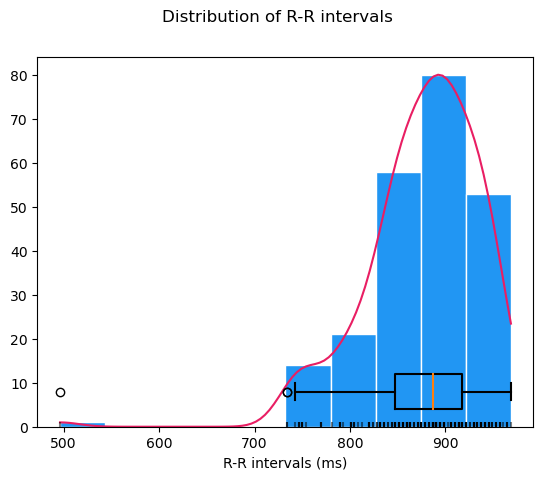

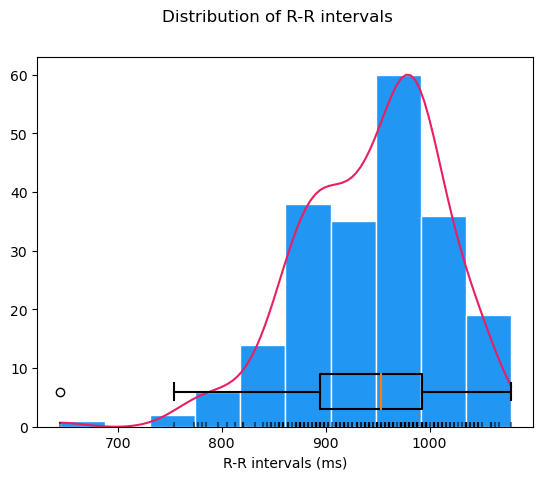

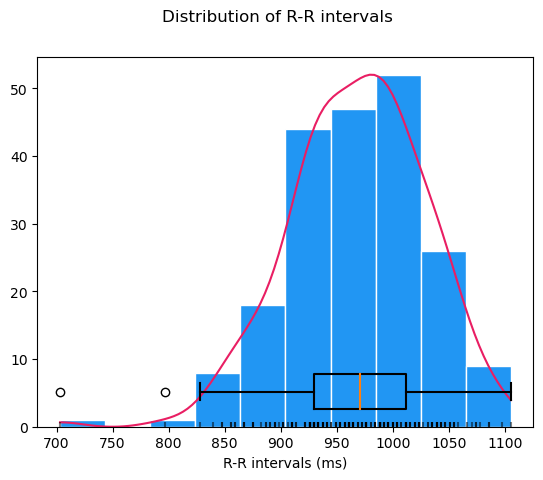

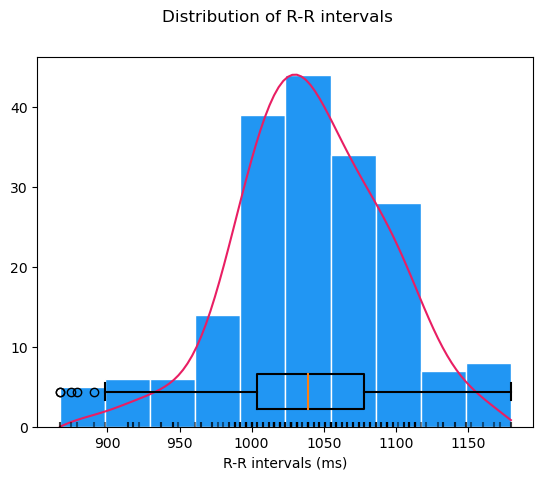

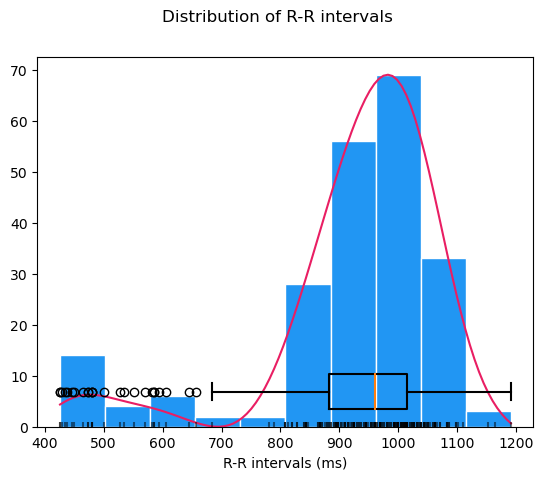

In [990]:
# Load the NeuroKit package
import neurokit2 as nk
peaks1, info1 = nk.ecg_peaks(ecg_subject1['ECG II'].values, sampling_rate=256)
hrv_time = nk.hrv_time(peaks1, sampling_rate=256, show=True)

peaks2, info2 = nk.ecg_peaks(ecg_subject2['ECG II'].values, sampling_rate=256)
hrv_time = nk.hrv_time(peaks2, sampling_rate=256, show=True)

peaks3, info3 = nk.ecg_peaks(ecg_subject3['ECG II'].values, sampling_rate=256)
hrv_time = nk.hrv_time(peaks3, sampling_rate=256, show=True)

peaks4, info4 = nk.ecg_peaks(ecg_subject4['ECG II'].values, sampling_rate=256)
hrv_time = nk.hrv_time(peaks4, sampling_rate=256, show=True)

peaks5, info5 = nk.ecg_peaks(ecg_subject5['ECG II'].values, sampling_rate=256)
hrv_time = nk.hrv_time(peaks5, sampling_rate=256, show=True)

# CALCULATE THE AVERAGE BPM AND HR TIME DOMAIN INDICES USING ECG

In [991]:
sampling_frequency_ecg = 256

rr_intervals_sub1 = np.diff(rpeaks_sub1) ; rr_intervals_sub2 = np.diff(rpeaks_sub2)
rr_intervals_sub3 = np.diff(rpeaks_sub3) ; rr_intervals_sub4 = np.diff(rpeaks_sub4)
rr_intervals_sub5 = np.diff(rpeaks_sub5) ; rr_intervals_sub6 = np.diff(rpeaks_sub6)
rr_intervals_sub7 = np.diff(rpeaks_sub7) ; rr_intervals_sub8 = np.diff(rpeaks_sub8)
rr_intervals_sub9 = np.diff(rpeaks_sub9) ; rr_intervals_sub10 = np.diff(rpeaks_sub10)


# Convert rr_intervals to time units (seconds)
rr_intervals_time_sub1 = rr_intervals_sub1 / sampling_frequency_ecg ; rr_intervals_time_sub2 = rr_intervals_sub2 / sampling_frequency_ecg
rr_intervals_time_sub3 = rr_intervals_sub3 / sampling_frequency_ecg ; rr_intervals_time_sub4 = rr_intervals_sub4 / sampling_frequency_ecg
rr_intervals_time_sub5 = rr_intervals_sub5 / sampling_frequency_ecg ; rr_intervals_time_sub6 = rr_intervals_sub6 / sampling_frequency_ecg
rr_intervals_time_sub7 = rr_intervals_sub7 / sampling_frequency_ecg ; rr_intervals_time_sub8 = rr_intervals_sub8 / sampling_frequency_ecg
rr_intervals_time_sub9 = rr_intervals_sub9 / sampling_frequency_ecg ; rr_intervals_time_sub10 = rr_intervals_sub10 / sampling_frequency_ecg


#  the average bpm for each subject
mean_rr_interval_sub1 = np.mean(rr_intervals_time_sub1) ; mean_rr_interval_sub2 = np.mean(rr_intervals_time_sub2)
mean_rr_interval_sub3 = np.mean(rr_intervals_time_sub3) ; mean_rr_interval_sub4 = np.mean(rr_intervals_time_sub4)
mean_rr_interval_sub5 = np.mean(rr_intervals_time_sub5) ; mean_rr_interval_sub6 = np.mean(rr_intervals_time_sub6)
mean_rr_interval_sub7 = np.mean(rr_intervals_time_sub7) ; mean_rr_interval_sub8 = np.mean(rr_intervals_time_sub8)
mean_rr_interval_sub9 = np.mean(rr_intervals_time_sub10) ; mean_rr_interval_sub10 = np.mean(rr_intervals_time_sub10)


avg_bpm_sub1 = 60 / mean_rr_interval_sub1 ; avg_bpm_sub2 = 60 / mean_rr_interval_sub2
avg_bpm_sub3 = 60 / mean_rr_interval_sub3 ; avg_bpm_sub4 = 60 / mean_rr_interval_sub4
avg_bpm_sub5 = 60 / mean_rr_interval_sub5 ; avg_bpm_sub6 = 60 / mean_rr_interval_sub6
avg_bpm_sub7 = 60 / mean_rr_interval_sub7 ; avg_bpm_sub8 = 60 / mean_rr_interval_sub8
avg_bpm_sub9 = 60 / mean_rr_interval_sub9 ; avg_bpm_sub10 = 60 / mean_rr_interval_sub10

# Save rr_intervals for each subject
rr_intervals_sub1 = rr_intervals_time_sub1 ; rr_intervals_sub2 = rr_intervals_time_sub2
rr_intervals_sub3 = rr_intervals_time_sub3 ; rr_intervals_sub4 = rr_intervals_time_sub4
rr_intervals_sub5 = rr_intervals_time_sub5 ; rr_intervals_sub6 = rr_intervals_time_sub6
rr_intervals_sub7 = rr_intervals_time_sub7 ; rr_intervals_sub8 = rr_intervals_time_sub8
rr_intervals_sub9 = rr_intervals_time_sub9 ; rr_intervals_sub10 = rr_intervals_time_sub10


# Print the average bpm for each subject
print("Average BPM for Sub1:", avg_bpm_sub1) ; print("Average BPM for Sub2:", avg_bpm_sub2)
print("Average BPM for Sub3:", avg_bpm_sub3) ; print("Average BPM for Sub4:", avg_bpm_sub4)
print("Average BPM for Sub5:", avg_bpm_sub5) ; print("Average BPM for Sub6:", avg_bpm_sub6)
print("Average BPM for Sub7:", avg_bpm_sub7) ; print("Average BPM for Sub8:", avg_bpm_sub8)
print("Average BPM for Sub9:", avg_bpm_sub9) ; print("Average BPM for Sub10:", avg_bpm_sub10)

# Extract HRV features
hrv_ecgfeatures_sub1 = nk.hrv(rpeaks_sub1, sampling_rate=256) ; hrv_ecgfeatures_sub2 = nk.hrv(rpeaks_sub2, sampling_rate=256)
hrv_ecgfeatures_sub3 = nk.hrv(rpeaks_sub3, sampling_rate=256) ; hrv_ecgfeatures_sub4 = nk.hrv(rpeaks_sub4, sampling_rate=256)
hrv_ecgfeatures_sub5 = nk.hrv(rpeaks_sub5, sampling_rate=256) ; hrv_ecgfeatures_sub6 = nk.hrv(rpeaks_sub6, sampling_rate=256)
hrv_ecgfeatures_sub7 = nk.hrv(rpeaks_sub7, sampling_rate=256) ; hrv_ecgfeatures_sub8 = nk.hrv(rpeaks_sub8, sampling_rate=256)
hrv_ecgfeatures_sub9 = nk.hrv(rpeaks_sub9, sampling_rate=256) ; hrv_ecgfeatures_sub10 = nk.hrv(rpeaks_sub10, sampling_rate=256)

print("HRV Features:", hrv_ecgfeatures_sub1)
print("HRV Features:", hrv_ecgfeatures_sub2)
print("HRV Features:", hrv_ecgfeatures_sub3)
print("HRV Features:", hrv_ecgfeatures_sub4)
print("HRV Features:", hrv_ecgfeatures_sub5)
print("HRV Features:", hrv_ecgfeatures_sub6)
print("HRV Features:", hrv_ecgfeatures_sub7)
print("HRV Features:", hrv_ecgfeatures_sub8)
print("HRV Features:", hrv_ecgfeatures_sub9)
print("HRV Features:", hrv_ecgfeatures_sub10)

Average BPM for Sub1: 68.47581452895776
Average BPM for Sub2: 63.226060582187735
Average BPM for Sub3: 61.69524897123393
Average BPM for Sub4: 57.787582729278284
Average BPM for Sub5: 61.72441642864178
Average BPM for Sub6: 72.1807349731611
Average BPM for Sub7: 68.01120667698517
Average BPM for Sub8: 64.39427637923907
Average BPM for Sub9: 78.44381241047147
Average BPM for Sub10: 78.44381241047147
HRV Features:    HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  876.221779  59.556522   38.471568   51.855918         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD  HRV_SDSD  ...  HRV_SampEn  HRV_ShanEn  \
0         NaN         NaN  41.459732  41.54913  ...    1.157882    5.516176   

   HRV_FuzzyEn  HRV_MSEn  HRV_CMSEn  HRV_RCMSEn    HRV_CD   HRV_HFD   HRV_KFD  \
0     0.853626  1.317827   1.300103    1.806055  1.612088  1.796208  2.288611   

    HRV_LZC  
0  0.792998  

[1 rows x 91 columns]
HRV Features:    HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SD

# CALCULATE THE AVERAGE BPM AND HR TIME DOMAIN INDICES USING ECG FOR 12s

In [992]:
time = 13

filtered_ecg_timestamps_sub1 = rpeak_times_sub1[rpeak_times_sub1 < time]
filtered_ecg_timestamps_sub2 = rpeak_times_sub2[rpeak_times_sub2 < time]
filtered_ecg_timestamps_sub3 = rpeak_times_sub3[rpeak_times_sub3 < time]
filtered_ecg_timestamps_sub4 = rpeak_times_sub4[rpeak_times_sub4 < time]
filtered_ecg_timestamps_sub5 = rpeak_times_sub5[rpeak_times_sub5 < time]
filtered_ecg_timestamps_sub6 = rpeak_times_sub6[rpeak_times_sub6 < time]
filtered_ecg_timestamps_sub7 = rpeak_times_sub7[rpeak_times_sub7 < time]
filtered_ecg_timestamps_sub8 = rpeak_times_sub8[rpeak_times_sub8 < time]
filtered_ecg_timestamps_sub9 = rpeak_times_sub9[rpeak_times_sub9 < time]
filtered_ecg_timestamps_sub10 = rpeak_times_sub10[rpeak_times_sub10 < time]


# Calculate JJ intervals
filtered_rr_intervals_sub1 = np.diff(filtered_ecg_timestamps_sub1)
filtered_rr_intervals_sub2 = np.diff(filtered_ecg_timestamps_sub2)
filtered_rr_intervals_sub3 = np.diff(filtered_ecg_timestamps_sub3)
filtered_rr_intervals_sub4 = np.diff(filtered_ecg_timestamps_sub4)
filtered_rr_intervals_sub5 = np.diff(filtered_ecg_timestamps_sub5)
filtered_rr_intervals_sub6 = np.diff(filtered_ecg_timestamps_sub6)
filtered_rr_intervals_sub7 = np.diff(filtered_ecg_timestamps_sub7)
filtered_rr_intervals_sub8 = np.diff(filtered_ecg_timestamps_sub8)
filtered_rr_intervals_sub9 = np.diff(filtered_ecg_timestamps_sub9)
filtered_rr_intervals_sub10 = np.diff(filtered_ecg_timestamps_sub10)

    
filtered_mean_rr_interval_sub1 = np.mean(filtered_rr_intervals_sub1)
filtered_mean_rr_interval_sub2 = np.mean(filtered_rr_intervals_sub2)
filtered_mean_rr_interval_sub3 = np.mean(filtered_rr_intervals_sub3)
filtered_mean_rr_interval_sub4 = np.mean(filtered_rr_intervals_sub4)
filtered_mean_rr_interval_sub5 = np.mean(filtered_rr_intervals_sub5)
filtered_mean_rr_interval_sub6 = np.mean(filtered_rr_intervals_sub6)
filtered_mean_rr_interval_sub7 = np.mean(filtered_rr_intervals_sub7)
filtered_mean_rr_interval_sub8 = np.mean(filtered_rr_intervals_sub8)
filtered_mean_rr_interval_sub9 = np.mean(filtered_rr_intervals_sub9)
filtered_mean_rr_interval_sub10 = np.mean(filtered_rr_intervals_sub10)


filtered_avg_bpm_sub1 = 60 / mean_rr_interval_sub1 ; filtered_avg_bpm_sub2 = 60 / mean_rr_interval_sub2
filtered_avg_bpm_sub3 = 60 / mean_rr_interval_sub3 ; filtered_avg_bpm_sub4 = 60 / mean_rr_interval_sub4
filtered_avg_bpm_sub5 = 60 / mean_rr_interval_sub5 ; filtered_avg_bpm_sub6 = 60 / mean_rr_interval_sub6
filtered_avg_bpm_sub7 = 60 / mean_rr_interval_sub7 ; filtered_avg_bpm_sub8 = 60 / mean_rr_interval_sub8
filtered_avg_bpm_sub9 = 60 / mean_rr_interval_sub9 ; filtered_avg_bpm_sub10 = 60 / mean_rr_interval_sub10


# Print the average bpm for each subject
print("Average BPM for Sub1:", filtered_avg_bpm_sub1) ; print("Average BPM for Sub2:", filtered_avg_bpm_sub2)
print("Average BPM for Sub3:", filtered_avg_bpm_sub3) ; print("Average BPM for Sub4:", filtered_avg_bpm_sub4)
print("Average BPM for Sub5:", filtered_avg_bpm_sub5) ; print("Average BPM for Sub6:", filtered_avg_bpm_sub6)
print("Average BPM for Sub7:", filtered_avg_bpm_sub7) ; print("Average BPM for Sub8:", filtered_avg_bpm_sub8)
print("Average BPM for Sub9:", filtered_avg_bpm_sub9) ; print("Average BPM for Sub10:", filtered_avg_bpm_sub10)


filtered_rpeaks_sub1 = filtered_ecg_timestamps_sub1 * sampling_frequency_ecg ; filtered_rpeaks_sub2 = filtered_ecg_timestamps_sub2 * sampling_frequency_ecg
filtered_rpeaks_sub3 = filtered_ecg_timestamps_sub3 * sampling_frequency_ecg ; filtered_rpeaks_sub4 = filtered_ecg_timestamps_sub4 * sampling_frequency_ecg
filtered_rpeaks_sub5 = filtered_ecg_timestamps_sub5 * sampling_frequency_ecg ; filtered_rpeaks_sub6 = filtered_ecg_timestamps_sub6 * sampling_frequency_ecg
filtered_rpeaks_sub7 = filtered_ecg_timestamps_sub7 * sampling_frequency_ecg ; filtered_rpeaks_sub8 = filtered_ecg_timestamps_sub8 * sampling_frequency_ecg
filtered_rpeaks_sub9 = filtered_ecg_timestamps_sub9 * sampling_frequency_ecg ; filtered_rpeaks_sub10 = filtered_ecg_timestamps_sub10 * sampling_frequency_ecg


filtered_ecghrv_features_sub1 = nk.hrv(filtered_rpeaks_sub1, sampling_rate=256) ; filtered_ecghrv_features_sub2 = nk.hrv(filtered_rpeaks_sub2, sampling_rate=256)
filtered_ecghrv_features_sub3 = nk.hrv(filtered_rpeaks_sub3, sampling_rate=256) ; filtered_ecghrv_features_sub4 = nk.hrv(filtered_rpeaks_sub4, sampling_rate=256)
#filtered_ecghrv_features_sub5 = nk.hrv(filtered_rpeaks_sub5, sampling_rate=256) ; filtered_ecghrv_features_sub6 = nk.hrv(filtered_rpeaks_sub6, sampling_rate=256)
filtered_ecghrv_features_sub7 = nk.hrv(filtered_rpeaks_sub7, sampling_rate=256) ; filtered_ecghrv_features_sub8 = nk.hrv(filtered_rpeaks_sub8, sampling_rate=256)
filtered_ecghrv_features_sub9 = nk.hrv(filtered_rpeaks_sub9, sampling_rate=256) ; filtered_ecghrv_features_sub10 = nk.hrv(filtered_rpeaks_sub10, sampling_rate=256)


print("HRV Features:", filtered_ecghrv_features_sub1) ; print("HRV Features:", filtered_ecghrv_features_sub2)
print("HRV Features:", filtered_ecghrv_features_sub3) ; print("HRV Features:", filtered_ecghrv_features_sub4)
#print("HRV Features:", filtered_ecghrv_features_sub5) ; print("HRV Features:", filtered_ecghrv_features_sub6)
print("HRV Features:", filtered_ecghrv_features_sub7) ; print("HRV Features:", filtered_ecghrv_features_sub8)
print("HRV Features:", filtered_ecghrv_features_sub9) ; print("HRV Features:", filtered_ecghrv_features_sub10)

print("HRV Features:", filtered_rr_intervals_sub1) ; print("HRV Features:", filtered_rr_intervals_sub2)
print("HRV Features:", filtered_rr_intervals_sub3) ; print("HRV Features:", filtered_rr_intervals_sub4)
print("HRV Features:", filtered_rr_intervals_sub5) ; print("HRV Features:", filtered_rr_intervals_sub6)
print("HRV Features:", filtered_rr_intervals_sub7) ; print("HRV Features:", filtered_rr_intervals_sub8)
print("HRV Features:", filtered_rr_intervals_sub9) ; print("HRV Features:", filtered_rr_intervals_sub10)

Average BPM for Sub1: 68.47581452895776
Average BPM for Sub2: 63.226060582187735
Average BPM for Sub3: 61.69524897123393
Average BPM for Sub4: 57.787582729278284
Average BPM for Sub5: 61.72441642864178
Average BPM for Sub6: 72.1807349731611
Average BPM for Sub7: 68.01120667698517
Average BPM for Sub8: 64.39427637923907
Average BPM for Sub9: 78.44381241047147
Average BPM for Sub10: 78.44381241047147
HRV Features:    HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  758.315592  20.713354         NaN         NaN         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_SampEn  HRV_ShanEn  \
0         NaN         NaN  17.986077  18.334188  ...    1.386294       3.875   

   HRV_FuzzyEn  HRV_MSEn  HRV_CMSEn  HRV_RCMSEn    HRV_CD  HRV_HFD   HRV_KFD  \
0     1.341937       NaN        NaN         NaN  1.551989      NaN  2.249262   

   HRV_LZC  
0     1.25  

[1 rows x 82 columns]
HRV Features:    HRV_MeanNN  HRV_SDNN  HRV_SDANN1  HRV_SDNNI

C:\ProgramData\anaconda3\lib\site-packages\neurokit2\hrv\hrv_nonlinear.py:474: NeuroKitWarning: DFA_alpha2 related indices will not be calculated. The maximum duration of the windows provided for the long-term correlation is smaller than the minimum duration of windows. Refer to the `scale` argument in `nk.fractal_dfa()` for more information.
  warn(
C:\ProgramData\anaconda3\lib\site-packages\neurokit2\complexity\entropy_multiscale.py:351: RuntimeWarning: invalid value encountered in scalar divide
  mse = np.trapz(mse) / len(mse)
C:\ProgramData\anaconda3\lib\site-packages\neurokit2\complexity\optim_complexity_k.py:134: RuntimeWarning: divide by zero encountered in divide
  normalization = (n - 1) / (np.floor((n - k_subrange) / k).astype(int) * k)
C:\ProgramData\anaconda3\lib\site-packages\neurokit2\complexity\optim_complexity_k.py:135: RuntimeWarning: invalid value encountered in multiply
  sets = (np.nansum(np.abs(np.diff(sig_values)), axis=1) * normalization) / k
C:\ProgramData\anaco

In [993]:
filtered_rr_intervals_sub8

array([0.89454872, 0.9062677 , 0.94923729, 0.93361198, 0.93361198,
       0.92970566, 0.94142464, 0.94142464, 0.95314362, 0.9804879 ,
       0.94533096, 0.95314362, 0.95314362])

In [945]:
# SUPINE FOR SUBJECT 8
import numpy as np

# threshold for abnormal intervals
threshold = 1.2

# Create data arrays
dtw_data = np.array([[0.89454872, 0.82], [0.9062677, 1.02], [0.94923729, 0.6],
                      [0.93361198, 0.64], [0.93361198, 0.72], [0.92970566, 0.72],
                      [0.94142464, 0.74], [0.94142464, 0.82], [0.95314362, 0.84],
                      [0.9804879, 0.58]])
eemd_data = np.array([[0.89454872, 0.82], [0.9062677, 0.74], [0.94923729, 0.92],
                      [0.93361198, 0.7], [0.93361198, 0.66], [0.92970566, 1.5],
                      [0.94142464, 0.74], [0.94142464, 1.24], [0.95314362, 1.7],
                      [0.9804879, 1.08]])

# standard deviation of the normal BCG JJ intervals using DWT
dtw_normal_jji = [row[1] for row in dtw_data if row[1] <= threshold]
dtw_sd_jji = np.std(dtw_normal_jji)

# standard deviation of the normal BCG JJ intervals using EEMD
eemd_normal_jji = [row[1] for row in eemd_data if row[1] <= threshold]
eemd_sd_jji = np.std(eemd_normal_jji)

# standard deviation of the normal ECG RR intervals using DWT
dtw_normal_rri = [row[0] for row in dtw_data if row[1] <= threshold]
dtw_sd_rri = np.std(dtw_normal_rri)

#  standard deviation of the normal ECG RR intervals using EEMD
eemd_normal_rri = [row[0] for row in eemd_data if row[1] <= threshold]
eemd_sd_rri = np.std(eemd_normal_rri)



print("DWT:")
print("BCG JJI SD (normal):", dtw_sd_jji)
print("ECG RR SD (normal):", dtw_sd_rri)
print("ECG JJI mean (normal):", dtw_mean_jji)
print("ECG RR mean (normal):", dtw_mean_rri)


print("EEMD:")
print("BCG JJI SD (normal):", eemd_sd_jji)
print("ECG RR SD (normal):", eemd_sd_rri)
print("ECG JJI mean (normal):", eemd_mean_jji)
print("ECG RR mean (normal):", eemd_mean_rri)


DWT:
BCG JJI SD (normal): 0.12497999839974396
ECG RR SD (normal): 0.022713869089736362
ECG JJI mean (normal): 0.74
ECG RR mean (normal): 0.758217932
EEMD:
BCG JJI SD (normal): 0.1360072026904218
ECG RR SD (normal): 0.02611515114872864
ECG JJI mean (normal): 0.826
ECG RR mean (normal): 0.758217932


# CALCULATE THE AVERAGE BPM AND HR TIME DOMAIN INDICES USING ECG FOR 12s

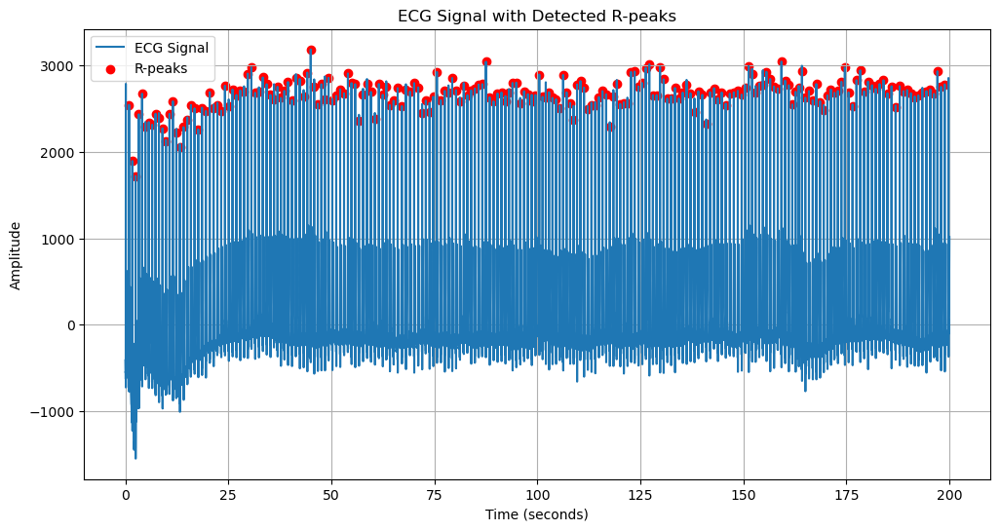

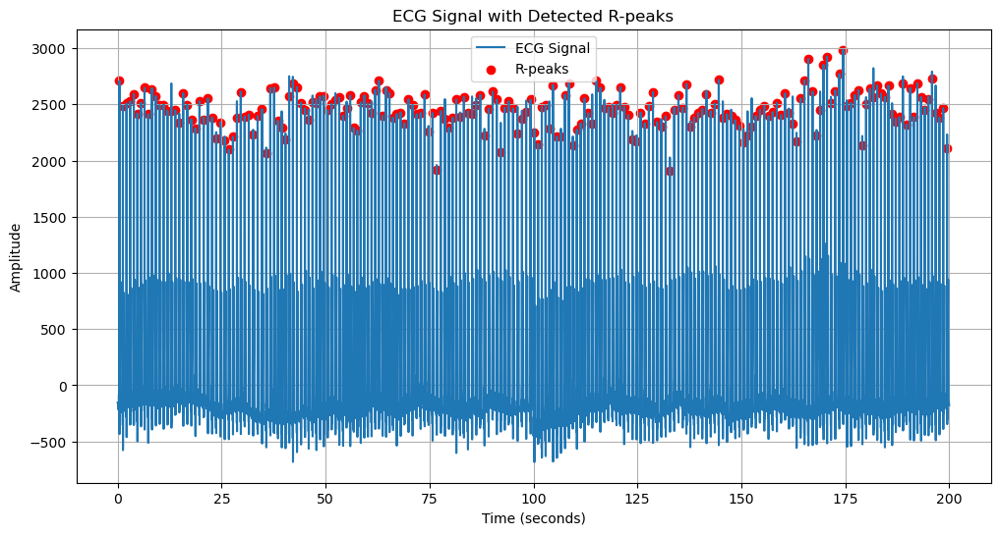

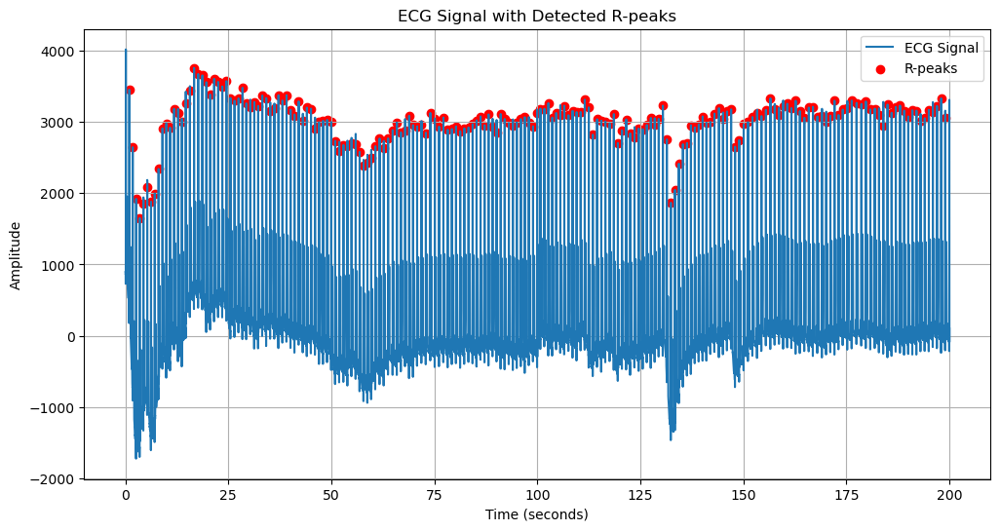

In [760]:
# Plot the ECG signal with detected R-peaks
plt.figure(figsize=(12, 6))
plt.plot(ecg_time1, ecg_signal1, label='ECG Signal')
plt.scatter(rpeak_times_sub1 , ecg_signal1[rpeaks_sub1], c='r', marker='o', label='R-peaks')
plt.title("ECG Signal with Detected R-peaks")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(ecg_time2, ecg_signal2, label='ECG Signal')
plt.scatter(rpeak_times_sub2 , ecg_signal2[rpeaks_sub2], c='r', marker='o', label='R-peaks')
plt.title("ECG Signal with Detected R-peaks")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(ecg_time3, ecg_signal3, label='ECG Signal')
plt.scatter(rpeak_times_sub3 , ecg_signal3[rpeaks_sub3], c='r', marker='o', label='R-peaks')
plt.title("ECG Signal with Detected R-peaks")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)
plt.show()

In [761]:
# Calculate the time duration of the ECG signal in seconds
duration = len(ecg_signal1) / sampling_frequency_ecg

# Set the plot duration to be 10 seconds 
plot_duration_sub1 = min(10, duration)
plot_duration_sub2 = min(10, duration)
plot_duration_sub3 = min(10, duration)
plot_duration_sub4 = min(10, duration)
plot_duration_sub5 = min(10, duration)

# Create a time array for the x-axis from 0 to the plot duration
time_array_sub1 = np.arange(len(ecg_signal1)) / sampling_frequency_ecg
time_array_sub1 = time_array_sub1[time_array_sub1 < plot_duration_sub1]

time_array_sub2 = np.arange(len(ecg_signal2)) / sampling_frequency_ecg
time_array_sub2 = time_array_sub2[time_array_sub2 < plot_duration_sub2]

time_array_sub5 = np.arange(len(ecg_signal5)) / sampling_frequency_ecg
time_array_sub5 = time_array_sub5[time_array_sub5 < plot_duration_sub5]



# Create a mask for R-peaks within the plot duration
r_peak_20s_mask_sub1 = rpeak_times_sub1  < plot_duration_sub1
r_peak_20s_times_sub1 = rpeak_times_sub1[r_peak_20s_mask_sub1]

r_peak_20s_mask_sub2 = rpeak_times_sub2  < plot_duration_sub2
r_peak_20s_times_sub2 = rpeak_times_sub2[r_peak_20s_mask_sub2]

r_peak_20s_mask_sub5 = rpeak_times_sub5  < plot_duration_sub5
r_peak_20s_times_sub5 = rpeak_times_sub5[r_peak_20s_mask_sub5]

r_peak_20s_times_sub5

array([1.19924217, 2.23832497, 3.30475204, 4.36727279, 5.41807457,
       6.49622062, 7.55874138, 8.5431356 , 9.64862594])

In [762]:

duration = len(smoothed_reconstructed_signal22) / fs

# Set the plot duration to be 10 seconds 
plot_duration_sub1 = min(10, duration)
plot_duration_sub2 = min(10, duration)
plot_duration_sub3 = min(10, duration)
plot_duration_sub4 = min(10, duration)
plot_duration_sub5 = min(10, duration)


bcg_time_array_sub5 = np.arange(len(smoothed_reconstructed_signal52)) / fs
bcg_time_array_sub5 = bcg_time_array_sub5[bcg_time_array_sub5 < plot_duration_sub1]

bcg_mask_sub5 = bcg_timestamps_sub5  < plot_duration_sub5
bcg_mask_sub5 = bcg_timestamps_sub5[bcg_mask_sub5]


# Create a time array for the x-axis from 0 to the plot duration
bcg_time_array_sub2 = np.arange(len(smoothed_reconstructed_signal22)) / fs
bcg_time_array_sub2 = bcg_time_array_sub2[bcg_time_array_sub2 < plot_duration_sub2]

bcg_mask_sub2 = bcg_timestamps_sub2  < plot_duration_sub2
bcg_mask_sub2 = bcg_timestamps_sub2[bcg_mask_sub2]


bcg_time_array_sub1 = np.arange(len(smoothed_reconstructed_signal12)) / fs
bcg_time_array_sub1 = bcg_time_array_sub1[bcg_time_array_sub1 < plot_duration_sub1]

bcg_mask_sub1 = bcg_timestamps_sub1  < plot_duration_sub1
bcg_mask_sub1 = bcg_timestamps_sub1[bcg_mask_sub1]



# PLOT SYNCHRONIZATION OF BCG AND ECG FOR SUBJECT 1,2, AND 5

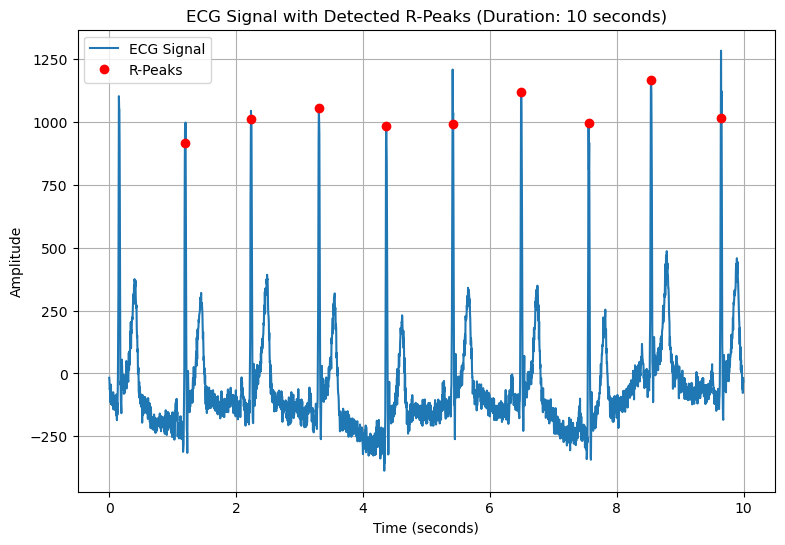

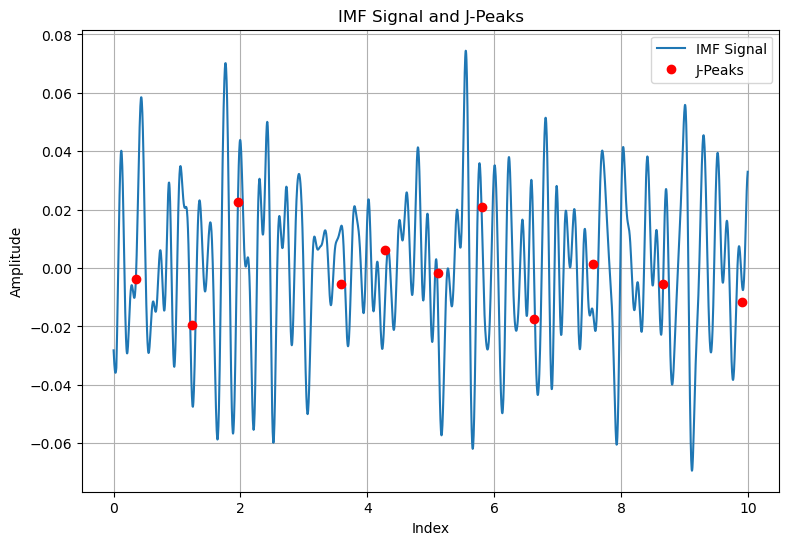

In [763]:
# Plot the ECG signal with detected R-peaks for 10 seconds
plt.figure(figsize=(9, 6))
plt.plot(time_array_sub5, ecg_signal5[:len(time_array_sub5)], label='ECG Signal')
plt.plot(r_peak_20s_times_sub5, ecg_signal5[rpeaks_sub5][:len(r_peak_20s_times_sub5)], 'ro', label='R-Peaks')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.title(f'ECG Signal with Detected R-Peaks (Duration: {plot_duration_sub5} seconds)')
plt.legend()
plt.grid(True)
plt.show()


# Plot the IMF signal and J-peaks
plt.figure(figsize=(9, 6))
plt.plot(bcg_time_array_sub5, smoothed_reconstructed_signal52[:len(bcg_time_array_sub5)], label='IMF Signal')
plt.plot(bcg_mask_sub5, smoothed_reconstructed_signal52[jpeak_indices_sub5][:len(bcg_mask_sub5)], 'ro', label='J-Peaks')
plt.title("IMF Signal and J-Peaks")
plt.xlabel("Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)
#plt.xlim(0, 693)  # Set x-axis limit
#plt.show()

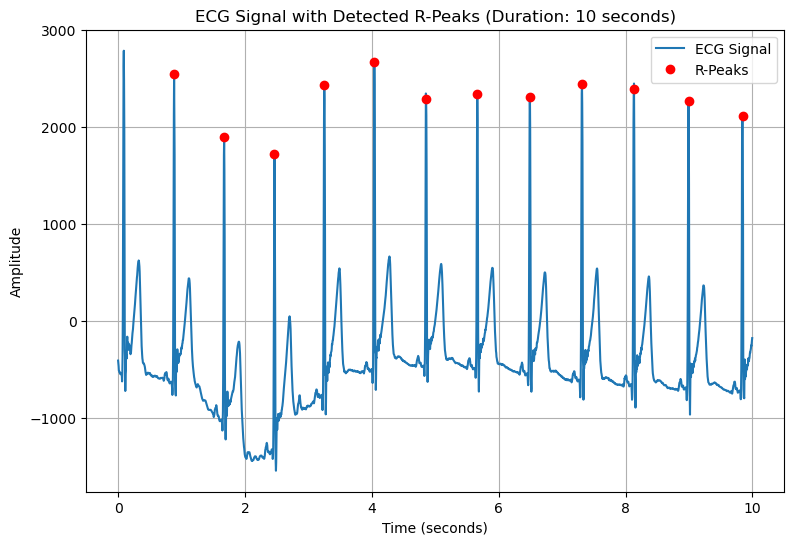

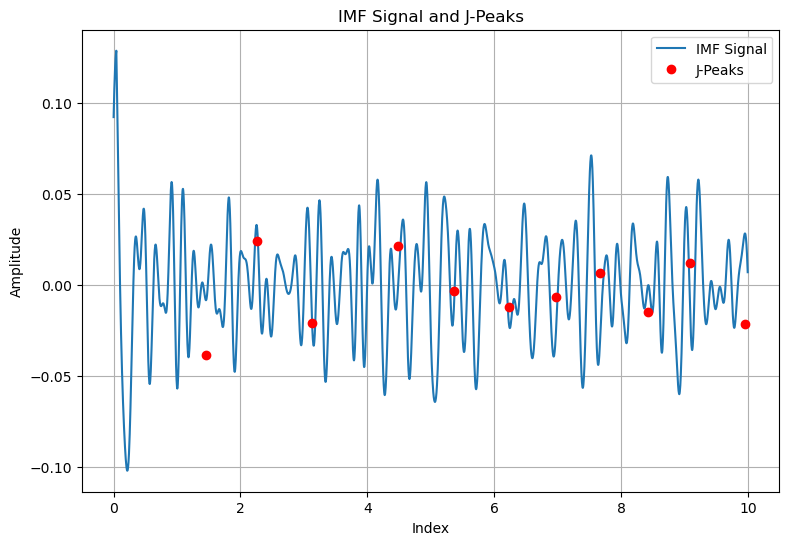

In [764]:
# Plot the ECG signal with detected R-peaks for 10 seconds
plt.figure(figsize=(9, 6))
plt.plot(time_array_sub1, ecg_signal1[:len(time_array_sub1)], label='ECG Signal')
plt.plot(r_peak_20s_times_sub1, ecg_signal1[rpeaks_sub1][:len(r_peak_20s_times_sub1)], 'ro', label='R-Peaks')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.title(f'ECG Signal with Detected R-Peaks (Duration: {plot_duration_sub5} seconds)')
plt.legend()
plt.grid(True)
plt.show()


# Plot the IMF signal and J-peaks
plt.figure(figsize=(9, 6))
plt.plot(bcg_time_array_sub1, smoothed_reconstructed_signal12[:len(bcg_time_array_sub1)], label='IMF Signal')
plt.plot(bcg_mask_sub1, smoothed_reconstructed_signal12[jpeak_indices_sub1][:len(bcg_mask_sub1)], 'ro', label='J-Peaks')
plt.title("IMF Signal and J-Peaks")
plt.xlabel("Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)
#plt.xlim(0, 693)  # Set x-axis limit
#plt.show()

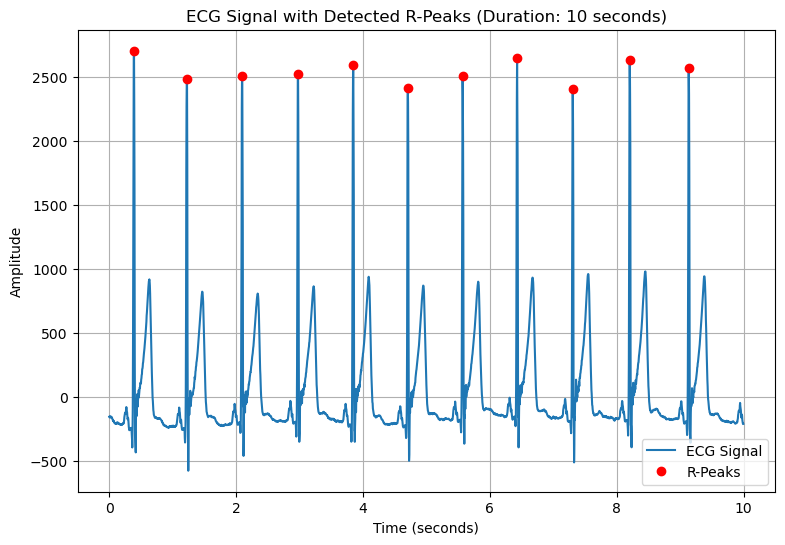

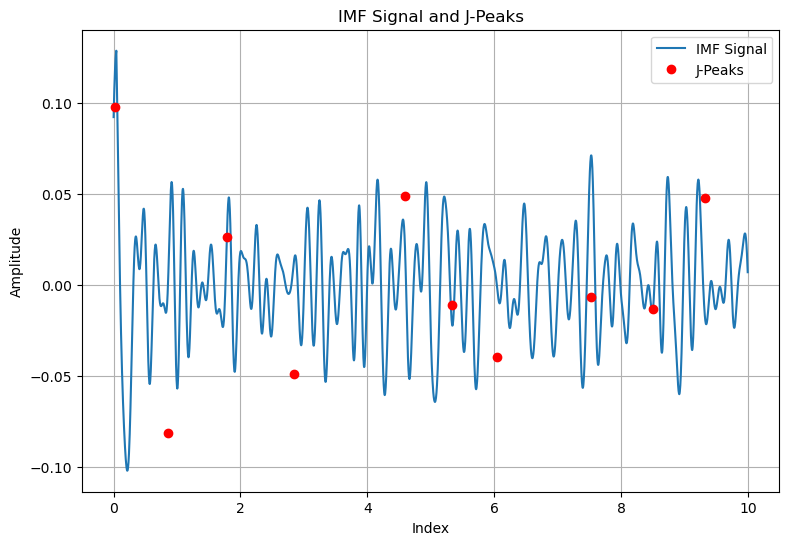

In [765]:
# Plot the ECG signal with detected R-peaks for 10seconds
plt.figure(figsize=(9, 6))
plt.plot(time_array_sub2, ecg_signal2[:len(time_array_sub2)], label='ECG Signal')
plt.plot(r_peak_20s_times_sub2, ecg_signal2[rpeaks_sub2][:len(r_peak_20s_times_sub2)], 'ro', label='R-Peaks')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.title(f'ECG Signal with Detected R-Peaks (Duration: {plot_duration_sub5} seconds)')
plt.legend()
plt.grid(True)
plt.show()


# Plot the IMF signal and J-peaks
plt.figure(figsize=(9, 6))
plt.plot(bcg_time_array_sub2, smoothed_reconstructed_signal12[:len(bcg_time_array_sub2)], label='IMF Signal')
plt.plot(bcg_mask_sub2, smoothed_reconstructed_signal12[jpeak_indices_sub2][:len(bcg_mask_sub2)], 'ro', label='J-Peaks')
plt.title("IMF Signal and J-Peaks")
plt.xlabel("Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)
#plt.xlim(0, 693)  # Set x-axis limit
#plt.show()

array(['123234', '234345', '345456', '456678'], dtype='<U6')

In [543]:
filtered_hrv_features_sub1 = filtered_hrv_features_sub1[['HRV_MeanNN','HRV_SDNN','HRV_RMSSD']]
filtered_hrv_features_sub2 = filtered_hrv_features_sub2[['HRV_MeanNN','HRV_SDNN','HRV_RMSSD']]
filtered_hrv_features_sub3 = filtered_hrv_features_sub3[['HRV_MeanNN','HRV_SDNN','HRV_RMSSD']]
filtered_hrv_features_sub4 = filtered_hrv_features_sub4[['HRV_MeanNN','HRV_SDNN','HRV_RMSSD']]
filtered_hrv_features_sub5 = filtered_hrv_features_sub5[['HRV_MeanNN','HRV_SDNN','HRV_RMSSD']]
filtered_hrv_features_sub6 = filtered_hrv_features_sub6[['HRV_MeanNN','HRV_SDNN','HRV_RMSSD']]
filtered_hrv_features_sub7 = filtered_hrv_features_sub7[['HRV_MeanNN','HRV_SDNN','HRV_RMSSD']]
filtered_hrv_features_sub8 = filtered_hrv_features_sub8[['HRV_MeanNN','HRV_SDNN','HRV_RMSSD']]
filtered_hrv_features_sub9 = filtered_hrv_features_sub9[['HRV_MeanNN','HRV_SDNN','HRV_RMSSD']]
filtered_hrv_features_sub10 = filtered_hrv_features_sub10[['HRV_MeanNN','HRV_SDNN','HRV_RMSSD']]

In [462]:
hrv_features_subjects = [filtered_hrv_features_sub1, filtered_hrv_features_sub2, filtered_hrv_features_sub3,
              filtered_hrv_features_sub4, filtered_hrv_features_sub5, filtered_hrv_features_sub6,
              filtered_hrv_features_sub7, filtered_hrv_features_sub8, filtered_hrv_features_sub9,
              filtered_hrv_features_sub10]

# empty list to store HRV features for each subject
hrv_feature_data = []

# Iterate through each ECG signal and calculate HRV features
for hrv in hrv_features_subjects:
    hrv_features = hrv[['HRV_MeanNN', 'HRV_SDNN', 'HRV_RMSSD']]
    hrv_feature_data.append(hrv_features.values.flatten())

In [464]:
# Create a combined dataset
bcg_combined_dataset = pd.DataFrame(hrv_feature_data, columns=['HRV_MeanNN', 'HRV_SDNN', 'HRV_RMSSD'])

# Display the combined dataset
bcg_combined_dataset

,HRV_MeanNN,HRV_SDNN,HRV_RMSSD
0,1056.666667,231.542145,358.296624
1,977.000000,336.813239,459.381736
2,1037.894737,311.690355,426.822888
3,1242.500000,493.686810,704.159073
4,1107.777778,440.702054,530.682136
5,1010.000000,349.345252,521.374701
6,924.761905,300.126957,448.998886
7,1024.210526,388.420102,615.322860
8,1032.631579,280.888315,349.444003
9,997.000000,387.449148,544.638944


In [465]:
ecg_signals = [ecg_signal1, ecg_signal2, ecg_signal3, ecg_signal4, ecg_signal5,
               ecg_signal6, ecg_signal7, ecg_signal8, ecg_signal9, ecg_signal10]

# sampling frequency for ECG signals
sampling_frequency_ecg = 256  

#  empty list to store HRV features for each subject
hrv_feature_data = []

# Iterate through each ECG signal and calculate HRV features
for ecg_signal in ecg_signals:
    ecg_signal_normalized = (ecg_signal - np.mean(ecg_signal)) / np.std(ecg_signal)
    hrv_results, info = nk.bio_process(ecg_signal_normalized, sampling_rate=sampling_frequency_ecg)
    hrv_features = nk.hrv(hrv_results, sampling_rate=sampling_frequency_ecg)
    hrv_features = hrv_features[['HRV_MeanNN', 'HRV_SDNN', 'HRV_SDANN1', 'HRV_RMSSD']]
    hrv_feature_data.append(hrv_features.values.flatten())

# Create a combined dataset
ecg_combined_dataset = pd.DataFrame(hrv_feature_data, columns=['HRV_MeanNN', 'HRV_SDNN', 'HRV_SDANN1', 'HRV_RMSSD'])

# Display the combined dataset
print(ecg_combined_dataset)

    HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_RMSSD
0   899.922229   51.033351    6.996810  30.936594
1   943.738892   56.214568   17.623722  32.006969
2   995.151539   50.925535   29.142114  35.533453
3  1032.735189   69.802340   25.570857  43.869406
4   999.388415   62.585543   34.769045  47.337044
5   858.230065   50.555106   11.235202  37.204706
6   922.638081   68.704951   24.926809  54.445759
7   914.746544   80.999694   49.493070  41.620016
8   765.956805   51.622231   29.488518  26.091960
9   875.705534  115.802797   34.983742  77.759880


In [468]:
# Calculate mean and standard deviation of 'HRV_MeanNN' and 'HRV_SDNN'
bcg_mean_HRV_MeanNN = bcg_combined_dataset['HRV_MeanNN'].mean()
ecg_mean_HRV_MeanNN = ecg_combined_dataset['HRV_MeanNN'].mean()

bcg_std_HRV_SDNN = bcg_combined_dataset['HRV_SDNN'].std()
ecg_std_HRV_SDNN = ecg_combined_dataset['HRV_SDNN'].std()


print("BCG Mean HRV_MeanNN:", bcg_mean_HRV_MeanNN)
print("ECG Mean HRV_MeanNN:", ecg_mean_HRV_MeanNN)

print("BCG Standard Deviation HRV_SDNN:", bcg_std_HRV_SDNN)
print("ECG Standard Deviation HRV_SDNN:", ecg_std_HRV_SDNN)

BCG Mean HRV_MeanNN: 1041.0443191311613
ECG Mean HRV_MeanNN: 920.8213292827326
BCG Standard Deviation HRV_SDNN: 77.92201266438538
ECG Standard Deviation HRV_SDNN: 20.35980404017155


# WINDOW SIZED LABELLING USING THE SMOOTHED SIGNAL AS INPUT DATA 

In [1019]:
# Step 11: Window-Based Labeling
window_size = 6  

# Organize labeled data pairs
input_data_sub1 = []
target_data_sub1 = []
labeled_data_pairs_sub1 = []
j_peak_sync_duration_sub1_reshaped = np.unique(filtered_bcg_timestamps1[0:61])
num_windows_sub1 = len(filtered_bcg_timestamps1[0:61])

for i in range(num_windows_sub1):
    window_center_sub1 = filtered_bcg_timestamps1[i]
    window_start_sub1 = window_center_sub1 - window_size / 2
    window_end_sub1 = window_center_sub1 + window_size / 2

    # Find the indices corresponding to the window start and end times
    start_index_sub1 = np.searchsorted(filtered_bcg_timestamps1[0:30], window_start_sub1, side='right')
    end_index_sub1 = np.searchsorted(filtered_bcg_timestamps1[0:30], window_end_sub1, side='left')
    
    # Check if there are valid indices for the window
    if start_index_sub1 < end_index_sub1:
        windowed_synchronized_cardiac_signals_sub1 = smoothed_reconstructed_signal12[start_index_sub1:end_index_sub1]
        avg_RRI_window_sub1 = jj_intervals_time_sub1[i] 
        # Append the input-target pair to the list
        labeled_data_pairs_sub1.append((windowed_synchronized_cardiac_signals_sub1, avg_RRI_window_sub1))
        input_data_sub1.append(windowed_synchronized_cardiac_signals_sub1)
        target_data_sub1.append(avg_RRI_window_sub1)

In [1020]:
# Initialize the new array
input_data_sub1_concat = []
# Iterate through the given array to concatenate consecutive INPUT DATA
for i in range(len(input_data_sub1) - 1):
    concatenated_element = np.concatenate([input_data_sub1[i], input_data_sub1[i + 1]])
    input_data_sub1_concat.append(concatenated_element)
    
target_data_sub1_diff = []
# Iterate through the given list to calculate the difference between consecutive JJI
for i in range(len( target_data_sub1) - 1):
    difference =  target_data_sub1[i + 1] -  target_data_sub1[i]
    target_data_sub1_diff.append(difference)
target_data_sub1_diff


target_data_sub1_diff = np.array(target_data_sub1_diff)

# Find the indices where target values are within the desired range
valid_indices = np.where((target_data_sub1_diff <= 0.4) & (target_data_sub1_diff >= -0.4))[0]

# Filter the input and target data based on the valid indices
input_data_sub1_concat = [input_data_sub1_concat[i] for i in valid_indices]
target_data_sub1_diff = target_data_sub1_diff[valid_indices]

target_data_sub1_diff 

array([ 0.02,  0.16,  0.08, -0.08,  0.36,  0.26,  0.02, -0.22, -0.06,
       -0.04,  0.02,  0.3 , -0.06,  0.  ,  0.04,  0.  ,  0.28, -0.16,
        0.2 , -0.38,  0.22, -0.24, -0.06,  0.  ,  0.  ])

In [1021]:
# Step 11: Window-Based Labeling
window_size = 6 

# Organize labeled data pairs
input_data_sub2 = []
target_data_sub2 = []
labeled_data_pairs_sub2 = []
j_peak_sync_duration_sub2_reshaped = np.unique(filtered_bcg_timestamps2[0:31])
num_windows_sub2 = len(filtered_bcg_timestamps2[0:31])

for i in range(num_windows_sub2):
    window_center_sub2 = j_peak_sync_duration_sub2_reshaped[i]
    window_start_sub2 = window_center_sub2 - window_size / 2
    window_end_sub2 = window_center_sub2 + window_size / 2

    # Find the indices corresponding to the window start and end times
    start_index_sub2 = np.searchsorted(j_peak_sync_duration_sub2_reshaped, window_start_sub2, side='right')
    end_index_sub2 = np.searchsorted(j_peak_sync_duration_sub2_reshaped, window_end_sub2, side='left')
    
    # Check if there are valid indices for the window
    if start_index_sub2 < end_index_sub2:
        windowed_synchronized_cardiac_signals_sub2 = smoothed_reconstructed_signal22[start_index_sub2:end_index_sub2]
        avg_RRI_window_sub2 = jj_intervals_time_sub2[i] 
        # Append the input-target pair to the list
        labeled_data_pairs_sub2.append((windowed_synchronized_cardiac_signals_sub2, avg_RRI_window_sub2))
        input_data_sub2.append(windowed_synchronized_cardiac_signals_sub2)
        target_data_sub2.append(avg_RRI_window_sub2)

In [1022]:
input_data_sub2_concat = []
# Iterate through the given array to concatenate consecutive INPUT DATA
for i in range(len(input_data_sub2) - 1):
    concatenated_element = np.concatenate([input_data_sub2[i], input_data_sub2[i + 1]])
    input_data_sub2_concat.append(concatenated_element)
    
target_data_sub2_diff = []
# Iterate through the given list to calculate the difference between consecutive jji
for i in range(len( target_data_sub2) - 1):
    difference =  target_data_sub2[i + 1] -  target_data_sub2[i]
    target_data_sub2_diff.append(difference)
target_data_sub2_diff

target_data_sub2_diff = np.array(target_data_sub2_diff)

# Find the indices where target values are within the desired range
valid_indices = np.where((target_data_sub2_diff <= 0.4) & (target_data_sub2_diff >= -0.4))[0]

# Filter the input and target data based on the valid indices
input_data_sub2_concat = [input_data_sub2_concat[i] for i in valid_indices]
target_data_sub2_diff = target_data_sub2_diff[valid_indices]

target_data_sub2_diff 

array([-0.34,  0.12, -0.18,  0.34,  0.3 , -0.28, -0.26, -0.36, -0.26,
        0.14, -0.36, -0.22, -0.14, -0.16,  0.3 , -0.34, -0.12, -0.34,
        0.06,  0.06, -0.2 , -0.06, -0.32])

In [1023]:
# Step 11: Window-Based Labeling
window_size = 6  

# Organize labeled data pairs
input_data_sub3 = []
target_data_sub3 = []
labeled_data_pairs_sub3 = []
j_peak_sync_duration_sub3_reshaped = np.unique(filtered_bcg_timestamps3[0:31])
num_windows_sub3 = len(j_peak_sync_duration_sub3_reshaped)

for i in range(num_windows_sub2):
    window_center_sub3 = j_peak_sync_duration_sub3_reshaped[i]
    window_start_sub3 = window_center_sub3 - window_size / 2
    window_end_sub3 = window_center_sub3 + window_size / 2

    # Find the indices corresponding to the window start and end times
    start_index_sub3 = np.searchsorted(j_peak_sync_duration_sub3_reshaped, window_start_sub3, side='right')
    end_index_sub3 = np.searchsorted(j_peak_sync_duration_sub3_reshaped, window_end_sub3, side='left')
    
    # Check if there are valid indices for the window
    if start_index_sub3 < end_index_sub3:
        windowed_synchronized_cardiac_signals_sub3 = smoothed_reconstructed_signal32[start_index_sub3:end_index_sub3]
        avg_RRI_window_sub3 = jj_intervals_time_sub3[i] 
        # Append the input-target pair to the list
        labeled_data_pairs_sub3.append((windowed_synchronized_cardiac_signals_sub3, avg_RRI_window_sub3))
        input_data_sub3.append(windowed_synchronized_cardiac_signals_sub3)
        target_data_sub3.append(avg_RRI_window_sub3)

In [1024]:
input_data_sub3_concat = []
# Iterate through the given array to concatenate consecutive INPUT DATA
for i in range(len(input_data_sub3) - 1):
    concatenated_element = np.concatenate([input_data_sub3[i], input_data_sub3[i + 1]])
    input_data_sub3_concat.append(concatenated_element)
    
target_data_sub3_diff = []
# Iterate through the given list to calculate the difference between consecutive JJI
for i in range(len( target_data_sub3) - 1):
    difference =  target_data_sub3[i + 1] -  target_data_sub3[i]
    target_data_sub3_diff.append(difference)
target_data_sub3_diff

target_data_sub3_diff = np.array(target_data_sub3_diff)

# Find the indices where target values are within the desired range
valid_indices = np.where((target_data_sub3_diff <= 0.4) & (target_data_sub3_diff >= -0.4))[0]

# Filter the input and target data based on the valid indices
input_data_sub3_concat = [input_data_sub3_concat[i] for i in valid_indices]
target_data_sub3_diff = target_data_sub3_diff[valid_indices]

target_data_sub3_diff 

array([ 0.24,  0.14, -0.18,  0.08,  0.24, -0.18, -0.18, -0.04,  0.22,
       -0.2 ,  0.1 , -0.12,  0.24, -0.04,  0.18, -0.36,  0.24, -0.1 ,
        0.38, -0.1 ,  0.14, -0.08, -0.14,  0.02,  0.1 ])

In [1045]:
# Step 11: Window-Based Labeling
window_size = 6  

# Organize labeled data pairs
input_data_sub4 = []
target_data_sub4 = []
labeled_data_pairs_sub4 = []
j_peak_sync_duration_sub4_reshaped = np.unique(filtered_bcg_timestamps4[0:31])
num_windows_sub4 = len(j_peak_sync_duration_sub4_reshaped)

for i in range(num_windows_sub4):
    window_center_sub4 = j_peak_sync_duration_sub4_reshaped[i]
    window_start_sub4 = window_center_sub4 - window_size / 2
    window_end_sub4 = window_center_sub4 + window_size / 2

    # Find the indices corresponding to the window start and end times
    start_index_sub4 = np.searchsorted(j_peak_sync_duration_sub4_reshaped, window_start_sub4, side='right')
    end_index_sub4 = np.searchsorted(j_peak_sync_duration_sub4_reshaped, window_end_sub4, side='left')
    
    # Check if there are valid indices for the window
    if start_index_sub4 < end_index_sub4:
        windowed_synchronized_cardiac_signals_sub4 = smoothed_reconstructed_signal42[start_index_sub4:end_index_sub4]
        avg_RRI_window_sub4 = jj_intervals_time_sub4[i] 
        # Append the input-target pair to the list
        labeled_data_pairs_sub4.append((windowed_synchronized_cardiac_signals_sub4, avg_RRI_window_sub4))
        input_data_sub4.append(windowed_synchronized_cardiac_signals_sub4)
        target_data_sub4.append(avg_RRI_window_sub4)

In [1047]:
input_data_sub4_concat = []
# Iterate through the given array to concatenate consecutive INPUT DATA
for i in range(len(input_data_sub4) - 1):
    concatenated_element = np.concatenate([input_data_sub4[i], input_data_sub4[i + 1]])
    input_data_sub4_concat.append(concatenated_element)
    
target_data_sub4_diff = []
# Iterate through the given list to calculate the difference between consecutive JJI
for i in range(len( target_data_sub4) - 1):
    difference =  target_data_sub4[i + 1] -  target_data_sub4[i]
    target_data_sub4_diff.append(difference)
target_data_sub4_diff

target_data_sub4_diff = np.array(target_data_sub4_diff)

# Find the indices where target values are within the desired range
valid_indices = np.where((target_data_sub4_diff <= 0.4) & (target_data_sub4_diff >= -0.4))[0]

# Filter the input and target data based on the valid indices
input_data_sub4_concat = [input_data_sub4_concat[i] for i in valid_indices]
target_data_sub4_diff = target_data_sub4_diff[valid_indices]
target_data_sub4_diff

array([-0.16, -0.04, -0.24,  0.06,  0.24,  0.2 ,  0.08,  0.38, -0.22,
       -0.16, -0.3 ,  0.06,  0.26, -0.12, -0.18,  0.04,  0.36, -0.22,
       -0.08,  0.1 , -0.22,  0.1 ])

In [1048]:

window_size = 6  

# Organize labeled data pairs
input_data_sub5 = []
target_data_sub5 = []
labeled_data_pairs_sub5 = []
j_peak_sync_duration_sub5_reshaped = np.unique(filtered_bcg_timestamps5[0:31])
num_windows_sub4 = len(filtered_bcg_timestamps5[0:31])

for i in range(num_windows_sub5):
    window_center_sub5 = j_peak_sync_duration_sub5_reshaped[i]
    window_start_sub5 = window_center_sub5 - window_size / 2
    window_end_sub5 = window_center_sub5 + window_size / 2

    # Find the indices corresponding to the window start and end times
    start_index_sub5 = np.searchsorted(j_peak_sync_duration_sub5_reshaped, window_start_sub5, side='right')
    end_index_sub5 = np.searchsorted(j_peak_sync_duration_sub5_reshaped, window_end_sub5, side='left')
    
    # Check if there are valid indices for the window
    if start_index_sub5 < end_index_sub5:
        windowed_synchronized_cardiac_signals_sub5 = smoothed_reconstructed_signal52[start_index_sub5:end_index_sub5]
        avg_RRI_window_sub5 = jj_intervals_time_sub5[i] 
        # Append the input-target pair to the list
        labeled_data_pairs_sub5.append((windowed_synchronized_cardiac_signals_sub5, avg_RRI_window_sub5))
        input_data_sub5.append(windowed_synchronized_cardiac_signals_sub5)
        target_data_sub5.append(avg_RRI_window_sub5)

In [1049]:
input_data_sub5_concat = []
# Iterate through the given array to concatenate consecutive INPUT DATA
for i in range(len(input_data_sub5) - 1):
    concatenated_element = np.concatenate([input_data_sub5[i], input_data_sub5[i + 1]])
    input_data_sub5_concat.append(concatenated_element)
    
target_data_sub5_diff = []
# Iterate through the given list to calculate the difference between consecutive JJI
for i in range(len( target_data_sub5) - 1):
    difference =  target_data_sub5[i + 1] -  target_data_sub5[i]
    target_data_sub5_diff.append(difference)

target_data_sub5_diff = np.array(target_data_sub5_diff)

# Find the indices where target values are within the desired range
valid_indices = np.where((target_data_sub5_diff <= 0.4) & (target_data_sub5_diff >= -0.4))[0]

# Filter the input and target data based on the valid indices
input_data_sub5_concat = [input_data_sub5_concat[i] for i in valid_indices]
target_data_sub5_diff = target_data_sub5_diff[valid_indices]

target_data_sub5_diff 

array([-0.3 , -0.1 ,  0.3 , -0.2 , -0.04, -0.16,  0.22, -0.02, -0.04,
        0.08,  0.14, -0.06,  0.36, -0.32])

In [1050]:
window_size = 6  

# Organize labeled data pairs
input_data_sub6 = []
target_data_sub6 = []
labeled_data_pairs_sub6 = []
j_peak_sync_duration_sub6_reshaped = np.unique(filtered_bcg_timestamps6[0:31])
num_windows_sub6 = len(j_peak_sync_duration_sub6_reshaped)

for i in range(num_windows_sub6):
    window_center_sub6 = j_peak_sync_duration_sub6_reshaped[i]
    window_start_sub6 = window_center_sub6 - window_size / 2
    window_end_sub6 = window_center_sub6 + window_size / 2

    # Find the indices corresponding to the window start and end times
    start_index_sub6 = np.searchsorted(j_peak_sync_duration_sub6_reshaped, window_start_sub6, side='right')
    end_index_sub6 = np.searchsorted(j_peak_sync_duration_sub6_reshaped, window_end_sub6, side='left')
    
    # Check if there are valid indices for the window
    if start_index_sub6 < end_index_sub6:
        windowed_synchronized_cardiac_signals_sub6 = smoothed_reconstructed_signal62[start_index_sub6:end_index_sub6]
        avg_RRI_window_sub6 = jj_intervals_time_sub6[i] 
        # Append the input-target pair to the list
        labeled_data_pairs_sub6.append((windowed_synchronized_cardiac_signals_sub6, avg_RRI_window_sub6))
        input_data_sub6.append(windowed_synchronized_cardiac_signals_sub6)
        target_data_sub6.append(avg_RRI_window_sub6)

In [1051]:
input_data_sub6_concat = []
# Iterate through the given array to concatenate consecutive INPUT DATA
for i in range(len(input_data_sub6) - 1):
    concatenated_element = np.concatenate([input_data_sub6[i], input_data_sub6[i + 1]])
    input_data_sub6_concat.append(concatenated_element)
    
target_data_sub6_diff = []
# Iterate through the given list to calculate the difference between consecutive JJI
for i in range(len( target_data_sub6) - 1):
    difference =  target_data_sub6[i + 1] -  target_data_sub6[i]
    target_data_sub6_diff.append(difference)
target_data_sub6_diff

target_data_sub6_diff = np.array(target_data_sub6_diff)

# Find the indices where target values are within the desired range
valid_indices = np.where((target_data_sub6_diff <= 0.4) & (target_data_sub6_diff >= -0.4))[0]

# Filter the input and target data based on the valid indices
input_data_sub6_concat = [input_data_sub6_concat[i] for i in valid_indices]
target_data_sub6_diff = target_data_sub6_diff[valid_indices]

target_data_sub6_diff 

array([ 0.  ,  0.06, -0.16,  0.  , -0.18, -0.08,  0.38,  0.16,  0.12,
       -0.06,  0.12, -0.28,  0.22, -0.22, -0.14, -0.24, -0.32,  0.16,
       -0.04, -0.02])

In [1052]:
# Step 11: Window-Based Labeling
window_size = 6  #

# Organize labeled data pairs
input_data_sub7 = []
target_data_sub7 = []
labeled_data_pairs_sub7 = []
j_peak_sync_duration_sub7_reshaped = np.unique(filtered_bcg_timestamps7[0:31])
num_windows_sub7 = len(filtered_bcg_timestamps7[0:31])

for i in range(num_windows_sub7):
    window_center_sub7 = j_peak_sync_duration_sub7_reshaped[i]
    window_start_sub7 = window_center_sub7 - window_size / 2
    window_end_sub7 = window_center_sub7 + window_size / 2

    # Find the indices corresponding to the window start and end times
    start_index_sub7 = np.searchsorted(j_peak_sync_duration_sub7_reshaped, window_start_sub7, side='right')
    end_index_sub7 = np.searchsorted(j_peak_sync_duration_sub7_reshaped, window_end_sub7, side='left')
    
    # Check if there are valid indices for the window
    if start_index_sub7 < end_index_sub7:
        windowed_synchronized_cardiac_signals_sub7 = smoothed_reconstructed_signal72[start_index_sub7:end_index_sub7]
        avg_RRI_window_sub7 = jj_intervals_time_sub7[i] # Use the precalculated wavelet entropy value
        # Append the input-target pair to the list
        labeled_data_pairs_sub7.append((windowed_synchronized_cardiac_signals_sub7, avg_RRI_window_sub7))
        input_data_sub7.append(windowed_synchronized_cardiac_signals_sub7)
        target_data_sub7.append(avg_RRI_window_sub7)

In [1053]:
input_data_sub7_concat = []
# Iterate through the given array to concatenate consecutive INPUT DATA
for i in range(len(input_data_sub7) - 1):
    concatenated_element = np.concatenate([input_data_sub7[i], input_data_sub7[i + 1]])
    input_data_sub7_concat.append(concatenated_element)
    
target_data_sub7_diff = []
# Iterate through the given list to calculate the difference between consecutive JJI
for i in range(len( target_data_sub7) - 1):
    difference =  target_data_sub7[i + 1] -  target_data_sub7[i]
    target_data_sub7_diff.append(difference)
target_data_sub7_diff

target_data_sub7_diff = np.array(target_data_sub7_diff)

# Find the indices where target values are within the desired range
valid_indices = np.where((target_data_sub7_diff <= 0.4) & (target_data_sub7_diff >= -0.4))[0]

# Filter the input and target data based on the valid indices
input_data_sub7_concat = [input_data_sub7_concat[i] for i in valid_indices]
target_data_sub7_diff = target_data_sub7_diff[valid_indices]

target_data_sub7_diff 

array([ 0.2 , -0.34,  0.16,  0.06,  0.18,  0.16, -0.4 ,  0.28, -0.28,
        0.  ,  0.1 , -0.16,  0.2 , -0.18,  0.06,  0.12,  0.18, -0.14,
       -0.28,  0.  ,  0.02, -0.02, -0.22])

In [1054]:
# Step 11: Window-Based Labeling
window_size = 6  

# Organize labeled data pairs
input_data_sub8 = []
target_data_sub8 = []
labeled_data_pairs_sub8 = []
j_peak_sync_duration_sub8_reshaped = np.unique(filtered_bcg_timestamps8[0:31])
num_windows_sub8 = len(filtered_bcg_timestamps8[0:31])

for i in range(num_windows_sub8):
    window_center_sub8 = j_peak_sync_duration_sub8_reshaped[i]
    window_start_sub8 = window_center_sub8 - window_size / 2
    window_end_sub8 = window_center_sub8 + window_size / 2

    # Find the indices corresponding to the window start and end times
    start_index_sub8 = np.searchsorted(j_peak_sync_duration_sub8_reshaped, window_start_sub8, side='right')
    end_index_sub8 = np.searchsorted(j_peak_sync_duration_sub8_reshaped, window_end_sub8, side='left')
    
    # Check if there are valid indices for the window
    if start_index_sub8 < end_index_sub8:
        windowed_synchronized_cardiac_signals_sub8 =  smoothed_reconstructed_signal82[start_index_sub8:end_index_sub8]
        avg_RRI_window_sub8 = jj_intervals_time_sub8[i] 
        # Append the input-target pair to the list
        labeled_data_pairs_sub8.append((windowed_synchronized_cardiac_signals_sub8, avg_RRI_window_sub8))
        input_data_sub8.append(windowed_synchronized_cardiac_signals_sub8)
        target_data_sub8.append(avg_RRI_window_sub8)

In [1055]:
input_data_sub8_concat = []
# Iterate through the given array to concatenate consecutive INPUT DATA
for i in range(len(input_data_sub8) - 1):
    concatenated_element = np.concatenate([input_data_sub8[i], input_data_sub8[i + 1]])
    input_data_sub8_concat.append(concatenated_element)
    
target_data_sub8_diff = []
# Iterate through the given list to calculate the difference between consecutive JJI
for i in range(len( target_data_sub8) - 1):
    difference =  target_data_sub8[i + 1] -  target_data_sub8[i]
    target_data_sub8_diff.append(difference)
target_data_sub8_diff

target_data_sub8_diff = np.array(target_data_sub8_diff)

# Find the indices where target values are within the desired range
valid_indices = np.where((target_data_sub8_diff <= 0.4) & (target_data_sub8_diff >= -0.4))[0]

# Filter the input and target data based on the valid indices
input_data_sub8_concat = [input_data_sub8_concat[i] for i in valid_indices]
target_data_sub8_diff = target_data_sub8_diff[valid_indices]

target_data_sub8_diff 

array([-0.08,  0.18, -0.22, -0.04,  0.2 , -0.02, -0.14,  0.28,  0.02,
        0.12, -0.34,  0.4 ,  0.4 , -0.38,  0.08])

In [1056]:
# Step 11: Window-Based Labeling
window_size = 6  

# Organize labeled data pairs
input_data_sub9 = []
target_data_sub9 = []
labeled_data_pairs_sub9 = []
j_peak_sync_duration_sub9_reshaped = np.unique(filtered_bcg_timestamps9[0:31])
num_windows_sub9 = len(filtered_bcg_timestamps9[0:31])

for i in range(num_windows_sub9):
    window_center_sub9 = j_peak_sync_duration_sub9_reshaped[i]
    window_start_sub9 = window_center_sub9 - window_size / 2
    window_end_sub9 = window_center_sub9 + window_size / 2

    # Find the indices corresponding to the window start and end times
    start_index_sub9 = np.searchsorted(j_peak_sync_duration_sub9_reshaped, window_start_sub9, side='right')
    end_index_sub9 = np.searchsorted(j_peak_sync_duration_sub9_reshaped, window_end_sub9, side='left')
    
    # Check if there are valid indices for the window
    if start_index_sub9 < end_index_sub9:
        windowed_synchronized_cardiac_signals_sub9 = smoothed_reconstructed_signal92[start_index_sub9:end_index_sub9]
        avg_RRI_window_sub9 = jj_intervals_time_sub9[i] 
        # Append the input-target pair to the list
        labeled_data_pairs_sub9.append((windowed_synchronized_cardiac_signals_sub9, avg_RRI_window_sub9))
        input_data_sub9.append(windowed_synchronized_cardiac_signals_sub9)
        target_data_sub9.append(avg_RRI_window_sub9)

In [1057]:
input_data_sub9_concat = []
# Iterate through the given array to concatenate consecutive INPUT DATA
for i in range(len(input_data_sub9) - 1):
    concatenated_element = np.concatenate([input_data_sub9[i], input_data_sub9[i + 1]])
    input_data_sub9_concat.append(concatenated_element)
    
target_data_sub9_diff = []
# Iterate through the given list to calculate the difference between consecutive JJI
for i in range(len( target_data_sub9) - 1):
    difference =  target_data_sub9[i + 1] -  target_data_sub9[i]
    target_data_sub9_diff.append(difference)

target_data_sub9_diff = np.array(target_data_sub9_diff)

# Find the indices where target values are within the desired range
valid_indices = np.where((target_data_sub9_diff <= 0.4) & (target_data_sub9_diff >= -0.4))[0]

# Filter the input and target data based on the valid indices
input_data_sub9_concat = [input_data_sub9_concat[i] for i in valid_indices]
target_data_sub9_diff = target_data_sub9_diff[valid_indices]

target_data_sub9_diff 

array([ 0.4 , -0.2 , -0.2 ,  0.38, -0.1 ,  0.18,  0.08,  0.16, -0.38,
       -0.18,  0.02, -0.36, -0.26,  0.1 , -0.08, -0.14, -0.38, -0.18,
        0.08,  0.38,  0.  ])

In [1058]:
# Step 11: Window-Based Labeling
window_size = 6  

# Organize labeled data pairs
input_data_sub10 = []
target_data_sub10 = []
labeled_data_pairs_sub10 = []
j_peak_sync_duration_sub10_reshaped = np.unique(filtered_bcg_timestamps10[0:31])
num_windows_sub10 = len(filtered_bcg_timestamps10[0:31])

for i in range(num_windows_sub10):
    window_center_sub10 = j_peak_sync_duration_sub10_reshaped[i]
    window_start_sub10 = window_center_sub9 - window_size / 2
    window_end_sub10 = window_center_sub9 + window_size / 2

    # Find the indices corresponding to the window start and end times
    start_index_sub10 = np.searchsorted(j_peak_sync_duration_sub10_reshaped, window_start_sub10, side='right')
    end_index_sub10 = np.searchsorted(j_peak_sync_duration_sub10_reshaped, window_end_sub10, side='left')
    
    # Check if there are valid indices for the window
    if start_index_sub10 < end_index_sub10:
        windowed_synchronized_cardiac_signals_sub10 = smoothed_reconstructed_signal10[start_index_sub10:end_index_sub10]
        avg_RRI_window_sub10 = jj_intervals_time_sub10[i] 
        # Append the input-target pair to the list
        labeled_data_pairs_sub10.append((windowed_synchronized_cardiac_signals_sub10, avg_RRI_window_sub10))
        input_data_sub10.append(windowed_synchronized_cardiac_signals_sub10)
        target_data_sub10.append(avg_RRI_window_sub10)

In [1059]:
input_data_sub10_concat = []
# Iterate through the given array to concatenate consecutive INPUT DATA
for i in range(len(input_data_sub10) - 1):
    concatenated_element = np.concatenate([input_data_sub10[i], input_data_sub10[i + 1]])
    input_data_sub10_concat.append(concatenated_element)
    
target_data_sub10_diff = []
# Iterate through the given list to calculate the difference between consecutive JJI
for i in range(len( target_data_sub10) - 1):
    difference =  target_data_sub10[i + 1] -  target_data_sub10[i]
    target_data_sub10_diff.append(difference)

target_data_sub10_diff = np.array(target_data_sub10_diff)

# Find the indices where target values are within the desired range
valid_indices = np.where((target_data_sub10_diff <= 0.4) & (target_data_sub10_diff >= -0.4))[0]

# Filter the input and target data based on the valid indices
input_data_sub10_concat = [input_data_sub10_concat[i] for i in valid_indices]
target_data_sub10_diff = target_data_sub10_diff[valid_indices]
    
target_data_sub10_diff 

array([-0.08,  0.32, -0.18, -0.12,  0.1 , -0.06,  0.08,  0.28, -0.32,
        0.12,  0.36,  0.36, -0.34, -0.14, -0.2 , -0.1 ,  0.02,  0.4 ,
       -0.4 , -0.12])

In [1060]:
target_data_sub1 = np.array(target_data_sub1_diff)
target_data_sub2 = np.array(target_data_sub2_diff)
target_data_sub3 = np.array(target_data_sub3_diff)
target_data_sub4 = np.array(target_data_sub4_diff)
target_data_sub5 = np.array(target_data_sub5_diff)
target_data_sub6 = np.array(target_data_sub6_diff)
target_data_sub7 = np.array(target_data_sub7_diff)
target_data_sub8 = np.array(target_data_sub8_diff)
target_data_sub9 = np.array(target_data_sub9_diff)
target_data_sub10 = np.array(target_data_sub10_diff)

In [1061]:
num_subjects = 10

# empty lists to store target binary data
target_binarydata = []

# Loop through subjects
for i in range(1, num_subjects + 1):
    target_data_sub = globals()[f"target_data_sub{i}"]  
    
    # Process the target data for each subject
    output_data = []
    for value in target_data_sub:
        if -0.07 <= value <= 0.07:
            output_data.append(0)
        else:
            output_data.append(1)
    
    # Convert the binary labels to a list
    target_binarydata_sub = np.array(output_data)
    
    # Append the processed data to the list
    target_binarydata.append(target_binarydata_sub)
    
target_binarydata

[array([0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
        1, 0, 0]),
 array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
        1]),
 array([1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 0, 1]),
 array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]),
 array([1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1]),
 array([0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]),
 array([1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0,
        1]),
 array([1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]),
 array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]),
 array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1])]

In [1062]:
# Define the list of arrays

# Create individual variables for each array
for i, arr in enumerate(target_binarydata):
    globals()[f'target_binarydata_sub{i+1}'] = arr

In [1091]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Combine all input data arrays into one list
all_input_data = [input_data_sub1_concat, input_data_sub2_concat, input_data_sub3_concat, input_data_sub4_concat, input_data_sub5_concat,
                 input_data_sub6_concat, input_data_sub7_concat, input_data_sub8_concat, input_data_sub9_concat, input_data_sub10_concat]

# Create variables to store the padded data 
padded_input_data_sub1 = None ; padded_input_data_sub2 = None
padded_input_data_sub3 = None ; padded_input_data_sub4 = None
padded_input_data_sub5 = None ; padded_input_data_sub6 = None
padded_input_data_sub7 = None ; padded_input_data_sub8 = None
padded_input_data_sub9 = None ; padded_input_data_sub10 = None


#  maximum sequence length among all sequences
max_sequence_length = max(max(len(seq) for seq in data) for data in all_input_data)

#  Pad sequences to match the maximum length
padded_input_data = []
for data in all_input_data:
    padded_data = pad_sequences(data, maxlen=15, dtype='float32', padding='post', truncating='post')
    padded_input_data.append(padded_data)

padded_input_data_sub1 = padded_input_data[0]
padded_input_data_sub2 = padded_input_data[1]
padded_input_data_sub3 = padded_input_data[2]
padded_input_data_sub4 = padded_input_data[3]
padded_input_data_sub5 = padded_input_data[4]
padded_input_data_sub6 = padded_input_data[5]
padded_input_data_sub7 = padded_input_data[6]
padded_input_data_sub8 = padded_input_data[7]
padded_input_data_sub9 = padded_input_data[8]
padded_input_data_sub10 = padded_input_data[9]

In [1092]:
target_labels_sub1 = np.array(target_binarydata_sub1)
target_labels_sub2 = np.array(target_binarydata_sub2)
target_labels_sub3 = np.array(target_binarydata_sub3)
target_labels_sub4 = np.array(target_binarydata_sub4)
target_labels_sub5 = np.array(target_binarydata_sub5)
target_labels_sub6 = np.array(target_binarydata_sub6)
target_labels_sub7 = np.array(target_binarydata_sub7)
target_labels_sub8 = np.array(target_binarydata_sub8)
target_labels_sub9 = np.array(target_binarydata_sub9)
target_labels_sub10 = np.array(target_binarydata_sub10)

In [1093]:
imf_values_normalized_sub1 = np.array(padded_input_data_sub1)
imf_values_normalized_sub2 = np.array(padded_input_data_sub2)
imf_values_normalized_sub3 = np.array(padded_input_data_sub3)
imf_values_normalized_sub4 = np.array(padded_input_data_sub4)
imf_values_normalized_sub5 = np.array(padded_input_data_sub5)
imf_values_normalized_sub6 = np.array(padded_input_data_sub6)
imf_values_normalized_sub7 = np.array(padded_input_data_sub7)
imf_values_normalized_sub8 = np.array(padded_input_data_sub8)
imf_values_normalized_sub9 = np.array(padded_input_data_sub9)
imf_values_normalized_sub10 = np.array(padded_input_data_sub10)

In [1094]:
print(len(imf_values_normalized_sub1)); print(len(target_labels_sub1))
print(len(imf_values_normalized_sub2)); print(len(target_labels_sub2))
print(len(imf_values_normalized_sub3)); print(len(target_labels_sub3))
print(len(imf_values_normalized_sub4)); print(len(target_labels_sub4))
print(len(imf_values_normalized_sub5)); print(len(target_labels_sub5))
print(len(imf_values_normalized_sub6)); print(len(target_labels_sub6))
print(len(imf_values_normalized_sub7)); print(len(target_labels_sub7))
print(len(imf_values_normalized_sub8)); print(len(target_labels_sub8))
print(len(imf_values_normalized_sub9)); print(len(target_labels_sub9))
print(len(imf_values_normalized_sub10)); print(len(target_labels_sub10))

25
25
23
23
25
25
22
22
14
14
20
20
23
23
15
15
21
21
20
20


In [1190]:
input_data = np.concatenate((imf_values_normalized_sub1, imf_values_normalized_sub2, imf_values_normalized_sub8,
                            imf_values_normalized_sub4, imf_values_normalized_sub5, imf_values_normalized_sub6,
                            imf_values_normalized_sub7))

output_data = np.array(target_labels_sub1.tolist() + target_labels_sub2.tolist() + target_labels_sub8.tolist()
                      + target_labels_sub4.tolist() + target_labels_sub5.tolist() + target_labels_sub6.tolist()
                       + target_labels_sub7.tolist())

input_data.shape

(142, 15)

# BILSTM MODEL FIT AND EVALUATION

In [1191]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

import tensorflow as tf
from tensorflow.keras.datasets import imdb
from tensorflow.keras.layers import Embedding, Dense, LSTM, Bidirectional
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.sequence import pad_sequences
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import KFold
from keras.callbacks import EarlyStopping

In [ ]:
# Set a random seed for reproducibility
seed_value = 42
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

In [1234]:
scaler = StandardScaler()
normalized_input_data = scaler.fit_transform(input_data)

# Split data into training and testing sets
reshaped_input_data = normalized_input_data.reshape((normalized_input_data.shape[0], normalized_input_data.shape[1], input_dim))

In [1235]:
# Create a KFold object with 10 folds
kf = KFold(n_splits=10, shuffle=True, random_state=33)

In [1236]:
learning_rate = 0.0003

# optimizer with the desired learning rate
custom_optimizer = Adam(learning_rate=learning_rate)

In [1237]:
model = Sequential()
model.add(Bidirectional(LSTM(128, activation='relu'), input_shape=(15, 1)))
model.add(Dense(1))
model

In [1238]:
model.compile(optimizer=custom_optimizer, loss='mse', metrics=['accuracy'])

In [1255]:
# Train the model using KFold cross validation
fold = 0
for train_index, test_index in kf.split(reshaped_input_data):
    X_train, X_test, y_train, y_test = train_test_split(
    reshaped_input_data, output_data, test_size=0.3, random_state=4)

    early_stopping = EarlyStopping(patience=10)
    history = model.fit(X_train, y_train, epochs=150, verbose=2, callbacks=[early_stopping])

    loss, accuracy = model.evaluate(X_test, y_test)
    print("Fold:", f"{fold+1}", "Test Loss:", loss, "Test Accuracy:", accuracy)

Epoch 1/150
4/4 - 0s - loss: 0.0801 - accuracy: 0.8990 - 40ms/epoch - 10ms/step
Epoch 2/150
4/4 - 0s - loss: 0.0837 - accuracy: 0.8788 - 36ms/epoch - 9ms/step
Epoch 3/150
4/4 - 0s - loss: 0.0751 - accuracy: 0.8990 - 37ms/epoch - 9ms/step
Epoch 4/150
4/4 - 0s - loss: 0.0782 - accuracy: 0.9091 - 35ms/epoch - 9ms/step
Epoch 5/150
4/4 - 0s - loss: 0.0788 - accuracy: 0.8990 - 34ms/epoch - 8ms/step
Epoch 6/150
4/4 - 0s - loss: 0.0848 - accuracy: 0.8889 - 34ms/epoch - 8ms/step
Epoch 7/150
4/4 - 0s - loss: 0.0796 - accuracy: 0.8990 - 35ms/epoch - 9ms/step
Epoch 8/150
4/4 - 0s - loss: 0.0807 - accuracy: 0.8889 - 36ms/epoch - 9ms/step
Epoch 9/150
4/4 - 0s - loss: 0.0831 - accuracy: 0.8889 - 35ms/epoch - 9ms/step
Epoch 10/150
4/4 - 0s - loss: 0.0824 - accuracy: 0.8990 - 35ms/epoch - 9ms/step
Epoch 11/150
4/4 - 0s - loss: 0.0803 - accuracy: 0.9192 - 35ms/epoch - 9ms/step
Epoch 12/150
4/4 - 0s - loss: 0.0775 - accuracy: 0.8990 - 34ms/epoch - 8ms/step
Epoch 13/150
4/4 - 0s - loss: 0.0766 - accuracy:

4/4 - 0s - loss: 0.0774 - accuracy: 0.9192 - 33ms/epoch - 8ms/step
Epoch 41/150
4/4 - 0s - loss: 0.0774 - accuracy: 0.8788 - 33ms/epoch - 8ms/step
Epoch 42/150
4/4 - 0s - loss: 0.0811 - accuracy: 0.8889 - 33ms/epoch - 8ms/step
Epoch 43/150
4/4 - 0s - loss: 0.0772 - accuracy: 0.8889 - 34ms/epoch - 8ms/step
Epoch 44/150
4/4 - 0s - loss: 0.0739 - accuracy: 0.9293 - 32ms/epoch - 8ms/step
Epoch 45/150
4/4 - 0s - loss: 0.0729 - accuracy: 0.8990 - 36ms/epoch - 9ms/step
Epoch 46/150
4/4 - 0s - loss: 0.0702 - accuracy: 0.9293 - 35ms/epoch - 9ms/step
Epoch 47/150
4/4 - 0s - loss: 0.0790 - accuracy: 0.9091 - 36ms/epoch - 9ms/step
Epoch 48/150
4/4 - 0s - loss: 0.0783 - accuracy: 0.8889 - 36ms/epoch - 9ms/step
Epoch 49/150
4/4 - 0s - loss: 0.0737 - accuracy: 0.9192 - 35ms/epoch - 9ms/step
Epoch 50/150
4/4 - 0s - loss: 0.0769 - accuracy: 0.8990 - 35ms/epoch - 9ms/step
Epoch 51/150
4/4 - 0s - loss: 0.0717 - accuracy: 0.9394 - 35ms/epoch - 9ms/step
Epoch 52/150
4/4 - 0s - loss: 0.0900 - accuracy: 0.87

4/4 - 0s - loss: 0.0762 - accuracy: 0.9192 - 33ms/epoch - 8ms/step
Epoch 81/150
4/4 - 0s - loss: 0.0727 - accuracy: 0.9192 - 33ms/epoch - 8ms/step
Epoch 82/150
4/4 - 0s - loss: 0.0670 - accuracy: 0.9293 - 33ms/epoch - 8ms/step
Epoch 83/150
4/4 - 0s - loss: 0.0684 - accuracy: 0.9192 - 35ms/epoch - 9ms/step
Epoch 84/150
4/4 - 0s - loss: 0.0673 - accuracy: 0.9394 - 38ms/epoch - 9ms/step
Epoch 85/150
4/4 - 0s - loss: 0.0661 - accuracy: 0.9293 - 37ms/epoch - 9ms/step
Epoch 86/150
4/4 - 0s - loss: 0.0726 - accuracy: 0.8990 - 41ms/epoch - 10ms/step
Epoch 87/150
4/4 - 0s - loss: 0.0748 - accuracy: 0.9192 - 35ms/epoch - 9ms/step
Epoch 88/150
4/4 - 0s - loss: 0.0959 - accuracy: 0.8990 - 35ms/epoch - 9ms/step
Epoch 89/150
4/4 - 0s - loss: 0.0895 - accuracy: 0.8990 - 34ms/epoch - 8ms/step
Epoch 90/150
4/4 - 0s - loss: 0.0800 - accuracy: 0.9091 - 34ms/epoch - 8ms/step
Epoch 91/150
4/4 - 0s - loss: 0.0775 - accuracy: 0.9293 - 35ms/epoch - 9ms/step
Epoch 92/150
4/4 - 0s - loss: 0.0790 - accuracy: 0.8

Epoch 120/150
4/4 - 0s - loss: 0.0797 - accuracy: 0.9394 - 36ms/epoch - 9ms/step
Epoch 121/150
4/4 - 0s - loss: 0.0687 - accuracy: 0.9091 - 36ms/epoch - 9ms/step
Epoch 122/150
4/4 - 0s - loss: 0.0770 - accuracy: 0.9192 - 35ms/epoch - 9ms/step
Epoch 123/150
4/4 - 0s - loss: 0.0780 - accuracy: 0.9192 - 34ms/epoch - 8ms/step
Epoch 124/150
4/4 - 0s - loss: 0.0699 - accuracy: 0.9091 - 34ms/epoch - 8ms/step
Epoch 125/150
4/4 - 0s - loss: 0.0697 - accuracy: 0.8990 - 34ms/epoch - 8ms/step
Epoch 126/150
4/4 - 0s - loss: 0.0730 - accuracy: 0.9091 - 33ms/epoch - 8ms/step
Epoch 127/150
4/4 - 0s - loss: 0.0682 - accuracy: 0.9091 - 34ms/epoch - 8ms/step
Epoch 128/150
4/4 - 0s - loss: 0.0687 - accuracy: 0.8889 - 33ms/epoch - 8ms/step
Epoch 129/150
4/4 - 0s - loss: 0.0670 - accuracy: 0.8889 - 34ms/epoch - 8ms/step
Epoch 130/150
4/4 - 0s - loss: 0.0646 - accuracy: 0.9091 - 34ms/epoch - 8ms/step
Epoch 131/150
4/4 - 0s - loss: 0.0643 - accuracy: 0.9192 - 34ms/epoch - 8ms/step
Epoch 132/150
4/4 - 0s - los

4/4 - 0s - loss: 0.0745 - accuracy: 0.8990 - 36ms/epoch - 9ms/step
Epoch 9/150
4/4 - 0s - loss: 0.0735 - accuracy: 0.9091 - 34ms/epoch - 8ms/step
Epoch 10/150
4/4 - 0s - loss: 0.0711 - accuracy: 0.9293 - 34ms/epoch - 8ms/step
Epoch 11/150
4/4 - 0s - loss: 0.0958 - accuracy: 0.8889 - 33ms/epoch - 8ms/step
Epoch 12/150
4/4 - 0s - loss: 0.0924 - accuracy: 0.8889 - 33ms/epoch - 8ms/step
Epoch 13/150
4/4 - 0s - loss: 0.0798 - accuracy: 0.8990 - 35ms/epoch - 9ms/step
Epoch 14/150
4/4 - 0s - loss: 0.0745 - accuracy: 0.9091 - 35ms/epoch - 9ms/step
Epoch 15/150
4/4 - 0s - loss: 0.0706 - accuracy: 0.9091 - 36ms/epoch - 9ms/step
Epoch 16/150
4/4 - 0s - loss: 0.0709 - accuracy: 0.9394 - 35ms/epoch - 9ms/step
Epoch 17/150
4/4 - 0s - loss: 0.0794 - accuracy: 0.9394 - 35ms/epoch - 9ms/step
Epoch 18/150
4/4 - 0s - loss: 0.0815 - accuracy: 0.9091 - 35ms/epoch - 9ms/step
Epoch 19/150
4/4 - 0s - loss: 0.0775 - accuracy: 0.8990 - 35ms/epoch - 9ms/step
Epoch 20/150
4/4 - 0s - loss: 0.0732 - accuracy: 0.888

4/4 - 0s - loss: 0.0631 - accuracy: 0.9394 - 37ms/epoch - 9ms/step
Epoch 49/150
4/4 - 0s - loss: 0.0598 - accuracy: 0.9293 - 38ms/epoch - 9ms/step
Epoch 50/150
4/4 - 0s - loss: 0.0653 - accuracy: 0.9394 - 35ms/epoch - 9ms/step
Epoch 51/150
4/4 - 0s - loss: 0.0618 - accuracy: 0.9394 - 39ms/epoch - 10ms/step
Epoch 52/150
4/4 - 0s - loss: 0.0607 - accuracy: 0.9394 - 38ms/epoch - 9ms/step
Epoch 53/150
4/4 - 0s - loss: 0.0724 - accuracy: 0.9192 - 39ms/epoch - 10ms/step
Epoch 54/150
4/4 - 0s - loss: 0.0750 - accuracy: 0.8990 - 37ms/epoch - 9ms/step
Epoch 55/150
4/4 - 0s - loss: 0.0772 - accuracy: 0.8990 - 40ms/epoch - 10ms/step
Epoch 56/150
4/4 - 0s - loss: 0.0579 - accuracy: 0.9293 - 36ms/epoch - 9ms/step
Epoch 57/150
4/4 - 0s - loss: 0.0673 - accuracy: 0.8990 - 38ms/epoch - 9ms/step
Epoch 58/150
4/4 - 0s - loss: 0.0602 - accuracy: 0.9192 - 37ms/epoch - 9ms/step
Epoch 59/150
4/4 - 0s - loss: 0.0574 - accuracy: 0.9394 - 39ms/epoch - 10ms/step
Epoch 60/150
4/4 - 0s - loss: 0.0621 - accuracy: 

4/4 - 0s - loss: 0.0590 - accuracy: 0.9293 - 39ms/epoch - 10ms/step
Epoch 88/150
4/4 - 0s - loss: 0.0554 - accuracy: 0.9394 - 37ms/epoch - 9ms/step
Epoch 89/150
4/4 - 0s - loss: 0.0627 - accuracy: 0.9192 - 39ms/epoch - 10ms/step
Epoch 90/150
4/4 - 0s - loss: 0.0753 - accuracy: 0.9091 - 37ms/epoch - 9ms/step
Epoch 91/150
4/4 - 0s - loss: 0.0627 - accuracy: 0.9394 - 37ms/epoch - 9ms/step
Epoch 92/150
4/4 - 0s - loss: 0.1314 - accuracy: 0.7980 - 38ms/epoch - 9ms/step
Epoch 93/150
4/4 - 0s - loss: 0.0955 - accuracy: 0.8384 - 39ms/epoch - 10ms/step
Epoch 94/150
4/4 - 0s - loss: 0.0735 - accuracy: 0.9293 - 38ms/epoch - 9ms/step
Epoch 95/150
4/4 - 0s - loss: 0.0888 - accuracy: 0.8889 - 40ms/epoch - 10ms/step
Epoch 96/150
4/4 - 0s - loss: 0.0793 - accuracy: 0.9192 - 43ms/epoch - 11ms/step
Epoch 97/150
4/4 - 0s - loss: 0.0844 - accuracy: 0.8788 - 46ms/epoch - 11ms/step
Epoch 98/150
4/4 - 0s - loss: 0.0995 - accuracy: 0.8687 - 41ms/epoch - 10ms/step
Epoch 99/150
4/4 - 0s - loss: 0.0949 - accurac

Epoch 127/150
4/4 - 0s - loss: 0.0763 - accuracy: 0.9091 - 39ms/epoch - 10ms/step
Epoch 128/150
4/4 - 0s - loss: 0.0726 - accuracy: 0.9192 - 38ms/epoch - 9ms/step
Epoch 129/150
4/4 - 0s - loss: 0.0748 - accuracy: 0.9192 - 39ms/epoch - 10ms/step
Epoch 130/150
4/4 - 0s - loss: 0.0758 - accuracy: 0.8990 - 38ms/epoch - 9ms/step
Epoch 131/150
4/4 - 0s - loss: 0.0707 - accuracy: 0.9192 - 43ms/epoch - 11ms/step
Epoch 132/150
4/4 - 0s - loss: 0.0660 - accuracy: 0.9091 - 44ms/epoch - 11ms/step
Epoch 133/150
4/4 - 0s - loss: 0.0699 - accuracy: 0.9091 - 42ms/epoch - 10ms/step
Epoch 134/150
4/4 - 0s - loss: 0.0642 - accuracy: 0.9192 - 37ms/epoch - 9ms/step
Epoch 135/150
4/4 - 0s - loss: 0.0589 - accuracy: 0.9192 - 39ms/epoch - 10ms/step
Epoch 136/150
4/4 - 0s - loss: 0.0590 - accuracy: 0.9394 - 38ms/epoch - 9ms/step
Epoch 137/150
4/4 - 0s - loss: 0.0610 - accuracy: 0.9091 - 38ms/epoch - 9ms/step
Epoch 138/150
4/4 - 0s - loss: 0.0608 - accuracy: 0.9091 - 41ms/epoch - 10ms/step
Epoch 139/150
4/4 - 0

4/4 - 0s - loss: 0.0613 - accuracy: 0.9192 - 36ms/epoch - 9ms/step
Epoch 16/150
4/4 - 0s - loss: 0.0625 - accuracy: 0.9293 - 42ms/epoch - 10ms/step
Epoch 17/150
4/4 - 0s - loss: 0.0668 - accuracy: 0.9293 - 39ms/epoch - 10ms/step
Epoch 18/150
4/4 - 0s - loss: 0.0611 - accuracy: 0.9293 - 39ms/epoch - 10ms/step
Epoch 19/150
4/4 - 0s - loss: 0.0582 - accuracy: 0.9394 - 40ms/epoch - 10ms/step
Epoch 20/150
4/4 - 0s - loss: 0.0584 - accuracy: 0.9495 - 42ms/epoch - 10ms/step
Epoch 21/150
4/4 - 0s - loss: 0.0647 - accuracy: 0.9192 - 39ms/epoch - 10ms/step
Epoch 22/150
4/4 - 0s - loss: 0.0663 - accuracy: 0.9192 - 36ms/epoch - 9ms/step
Epoch 23/150
4/4 - 0s - loss: 0.0636 - accuracy: 0.9293 - 35ms/epoch - 9ms/step
Epoch 24/150
4/4 - 0s - loss: 0.0581 - accuracy: 0.9293 - 35ms/epoch - 9ms/step
Epoch 25/150
4/4 - 0s - loss: 0.0584 - accuracy: 0.9192 - 34ms/epoch - 8ms/step
Epoch 26/150
4/4 - 0s - loss: 0.0614 - accuracy: 0.9192 - 34ms/epoch - 8ms/step
Epoch 27/150
4/4 - 0s - loss: 0.0535 - accuracy

Epoch 55/150
4/4 - 0s - loss: 0.0553 - accuracy: 0.9394 - 36ms/epoch - 9ms/step
Epoch 56/150
4/4 - 0s - loss: 0.0611 - accuracy: 0.9192 - 37ms/epoch - 9ms/step
Epoch 57/150
4/4 - 0s - loss: 0.0554 - accuracy: 0.9394 - 38ms/epoch - 9ms/step
Epoch 58/150
4/4 - 0s - loss: 0.0503 - accuracy: 0.9495 - 37ms/epoch - 9ms/step
Epoch 59/150
4/4 - 0s - loss: 0.0582 - accuracy: 0.9394 - 37ms/epoch - 9ms/step
Epoch 60/150
4/4 - 0s - loss: 0.0631 - accuracy: 0.9293 - 35ms/epoch - 9ms/step
Epoch 61/150
4/4 - 0s - loss: 0.0529 - accuracy: 0.9394 - 42ms/epoch - 10ms/step
Epoch 62/150
4/4 - 0s - loss: 0.0567 - accuracy: 0.9192 - 42ms/epoch - 10ms/step
Epoch 63/150
4/4 - 0s - loss: 0.0525 - accuracy: 0.9293 - 42ms/epoch - 10ms/step
Epoch 64/150
4/4 - 0s - loss: 0.0560 - accuracy: 0.9192 - 43ms/epoch - 11ms/step
Epoch 65/150
4/4 - 0s - loss: 0.0680 - accuracy: 0.9091 - 35ms/epoch - 9ms/step
Epoch 66/150
4/4 - 0s - loss: 0.0796 - accuracy: 0.8990 - 35ms/epoch - 9ms/step
Epoch 67/150
4/4 - 0s - loss: 0.0781

4/4 - 0s - loss: 0.0718 - accuracy: 0.9091 - 39ms/epoch - 10ms/step
Epoch 95/150
4/4 - 0s - loss: 0.0733 - accuracy: 0.9091 - 36ms/epoch - 9ms/step
Epoch 96/150
4/4 - 0s - loss: 0.0724 - accuracy: 0.9192 - 36ms/epoch - 9ms/step
Epoch 97/150
4/4 - 0s - loss: 0.0696 - accuracy: 0.9192 - 34ms/epoch - 8ms/step
Epoch 98/150
4/4 - 0s - loss: 0.0672 - accuracy: 0.9192 - 33ms/epoch - 8ms/step
Epoch 99/150
4/4 - 0s - loss: 0.0658 - accuracy: 0.9192 - 33ms/epoch - 8ms/step
Epoch 100/150
4/4 - 0s - loss: 0.0742 - accuracy: 0.9293 - 34ms/epoch - 8ms/step
Epoch 101/150
4/4 - 0s - loss: 0.0768 - accuracy: 0.9394 - 34ms/epoch - 8ms/step
Epoch 102/150
4/4 - 0s - loss: 0.0706 - accuracy: 0.9495 - 33ms/epoch - 8ms/step
Epoch 103/150
4/4 - 0s - loss: 0.0660 - accuracy: 0.9293 - 33ms/epoch - 8ms/step
Epoch 104/150
4/4 - 0s - loss: 0.0662 - accuracy: 0.9192 - 33ms/epoch - 8ms/step
Epoch 105/150
4/4 - 0s - loss: 0.0636 - accuracy: 0.9192 - 33ms/epoch - 8ms/step
Epoch 106/150
4/4 - 0s - loss: 0.0630 - accura

Epoch 134/150
4/4 - 0s - loss: 0.0599 - accuracy: 0.9394 - 34ms/epoch - 8ms/step
Epoch 135/150
4/4 - 0s - loss: 0.0546 - accuracy: 0.9293 - 33ms/epoch - 8ms/step
Epoch 136/150
4/4 - 0s - loss: 0.0550 - accuracy: 0.9394 - 33ms/epoch - 8ms/step
Epoch 137/150
4/4 - 0s - loss: 0.0524 - accuracy: 0.9495 - 33ms/epoch - 8ms/step
Epoch 138/150
4/4 - 0s - loss: 0.0592 - accuracy: 0.9394 - 33ms/epoch - 8ms/step
Epoch 139/150
4/4 - 0s - loss: 0.0632 - accuracy: 0.9394 - 32ms/epoch - 8ms/step
Epoch 140/150
4/4 - 0s - loss: 0.0611 - accuracy: 0.9192 - 33ms/epoch - 8ms/step
Epoch 141/150
4/4 - 0s - loss: 0.0526 - accuracy: 0.9495 - 36ms/epoch - 9ms/step
Epoch 142/150
4/4 - 0s - loss: 0.0560 - accuracy: 0.9192 - 36ms/epoch - 9ms/step
Epoch 143/150
4/4 - 0s - loss: 0.0573 - accuracy: 0.9293 - 35ms/epoch - 9ms/step
Epoch 144/150
4/4 - 0s - loss: 0.0569 - accuracy: 0.9192 - 34ms/epoch - 8ms/step
Epoch 145/150
4/4 - 0s - loss: 0.0536 - accuracy: 0.9293 - 34ms/epoch - 8ms/step
Epoch 146/150
4/4 - 0s - los

4/4 - 0s - loss: 0.0620 - accuracy: 0.9293 - 33ms/epoch - 8ms/step
Epoch 23/150
4/4 - 0s - loss: 0.0505 - accuracy: 0.9293 - 33ms/epoch - 8ms/step
Epoch 24/150
4/4 - 0s - loss: 0.0480 - accuracy: 0.9596 - 33ms/epoch - 8ms/step
Epoch 25/150
4/4 - 0s - loss: 0.0525 - accuracy: 0.9596 - 35ms/epoch - 9ms/step
Epoch 26/150
4/4 - 0s - loss: 0.0492 - accuracy: 0.9495 - 33ms/epoch - 8ms/step
Epoch 27/150
4/4 - 0s - loss: 0.0481 - accuracy: 0.9394 - 33ms/epoch - 8ms/step
Epoch 28/150
4/4 - 0s - loss: 0.0520 - accuracy: 0.9293 - 33ms/epoch - 8ms/step
Epoch 29/150
4/4 - 0s - loss: 0.0489 - accuracy: 0.9394 - 33ms/epoch - 8ms/step
Epoch 30/150
4/4 - 0s - loss: 0.0487 - accuracy: 0.9495 - 33ms/epoch - 8ms/step
Epoch 31/150
4/4 - 0s - loss: 0.0523 - accuracy: 0.9495 - 32ms/epoch - 8ms/step
Epoch 32/150
4/4 - 0s - loss: 0.0541 - accuracy: 0.9394 - 33ms/epoch - 8ms/step
Epoch 33/150
4/4 - 0s - loss: 0.0483 - accuracy: 0.9495 - 33ms/epoch - 8ms/step
Epoch 34/150
4/4 - 0s - loss: 0.0625 - accuracy: 0.92

4/4 - 0s - loss: 0.0562 - accuracy: 0.9394 - 38ms/epoch - 9ms/step
Epoch 63/150
4/4 - 0s - loss: 0.0559 - accuracy: 0.9495 - 38ms/epoch - 9ms/step
Epoch 64/150
4/4 - 0s - loss: 0.0604 - accuracy: 0.9192 - 38ms/epoch - 9ms/step
Epoch 65/150
4/4 - 0s - loss: 0.0532 - accuracy: 0.9394 - 38ms/epoch - 9ms/step
Epoch 66/150
4/4 - 0s - loss: 0.0510 - accuracy: 0.9495 - 36ms/epoch - 9ms/step
Epoch 67/150
4/4 - 0s - loss: 0.0490 - accuracy: 0.9394 - 34ms/epoch - 8ms/step
Epoch 68/150
4/4 - 0s - loss: 0.0498 - accuracy: 0.9394 - 35ms/epoch - 9ms/step
Epoch 69/150
4/4 - 0s - loss: 0.0475 - accuracy: 0.9394 - 35ms/epoch - 9ms/step
Epoch 70/150
4/4 - 0s - loss: 0.0512 - accuracy: 0.9495 - 36ms/epoch - 9ms/step
Epoch 71/150
4/4 - 0s - loss: 0.0574 - accuracy: 0.9596 - 36ms/epoch - 9ms/step
Epoch 72/150
4/4 - 0s - loss: 0.0513 - accuracy: 0.9394 - 42ms/epoch - 10ms/step
Epoch 73/150
4/4 - 0s - loss: 0.0526 - accuracy: 0.9394 - 37ms/epoch - 9ms/step
Epoch 74/150
4/4 - 0s - loss: 0.0493 - accuracy: 0.9

4/4 - 0s - loss: 0.0551 - accuracy: 0.9394 - 40ms/epoch - 10ms/step
Epoch 102/150
4/4 - 0s - loss: 0.0542 - accuracy: 0.9394 - 38ms/epoch - 9ms/step
Epoch 103/150
4/4 - 0s - loss: 0.0497 - accuracy: 0.9394 - 40ms/epoch - 10ms/step
Epoch 104/150
4/4 - 0s - loss: 0.0528 - accuracy: 0.9091 - 40ms/epoch - 10ms/step
Epoch 105/150
4/4 - 0s - loss: 0.0501 - accuracy: 0.9394 - 39ms/epoch - 10ms/step
Epoch 106/150
4/4 - 0s - loss: 0.0476 - accuracy: 0.9596 - 39ms/epoch - 10ms/step
Epoch 107/150
4/4 - 0s - loss: 0.0508 - accuracy: 0.9394 - 39ms/epoch - 10ms/step
Epoch 108/150
4/4 - 0s - loss: 0.0500 - accuracy: 0.9394 - 37ms/epoch - 9ms/step
Epoch 109/150
4/4 - 0s - loss: 0.0455 - accuracy: 0.9394 - 37ms/epoch - 9ms/step
Epoch 110/150
4/4 - 0s - loss: 0.0442 - accuracy: 0.9495 - 38ms/epoch - 9ms/step
Epoch 111/150
4/4 - 0s - loss: 0.0440 - accuracy: 0.9495 - 38ms/epoch - 9ms/step
Epoch 112/150
4/4 - 0s - loss: 0.0478 - accuracy: 0.9394 - 38ms/epoch - 9ms/step
Epoch 113/150
4/4 - 0s - loss: 0.048

Epoch 141/150
4/4 - 0s - loss: 0.0824 - accuracy: 0.8990 - 40ms/epoch - 10ms/step
Epoch 142/150
4/4 - 0s - loss: 0.1048 - accuracy: 0.8788 - 37ms/epoch - 9ms/step
Epoch 143/150
4/4 - 0s - loss: 0.1014 - accuracy: 0.8889 - 37ms/epoch - 9ms/step
Epoch 144/150
4/4 - 0s - loss: 0.0968 - accuracy: 0.8990 - 36ms/epoch - 9ms/step
Epoch 145/150
4/4 - 0s - loss: 0.0909 - accuracy: 0.8889 - 34ms/epoch - 8ms/step
Epoch 146/150
4/4 - 0s - loss: 0.0901 - accuracy: 0.8889 - 35ms/epoch - 9ms/step
Epoch 147/150
4/4 - 0s - loss: 0.0929 - accuracy: 0.9091 - 41ms/epoch - 10ms/step
Epoch 148/150
4/4 - 0s - loss: 0.0913 - accuracy: 0.8990 - 47ms/epoch - 12ms/step
Epoch 149/150
4/4 - 0s - loss: 0.0864 - accuracy: 0.9192 - 41ms/epoch - 10ms/step
Epoch 150/150
4/4 - 0s - loss: 0.0843 - accuracy: 0.9192 - 38ms/epoch - 9ms/step
2/2 [==============================] - 0s 6ms/step - loss: 0.1453 - accuracy: 0.8140
Fold: 1 Test Loss: 0.1452605128288269 Test Accuracy: 0.8139534592628479
Epoch 1/150
4/4 - 0s - loss: 

4/4 - 0s - loss: 0.1090 - accuracy: 0.8889 - 35ms/epoch - 9ms/step
Epoch 30/150
4/4 - 0s - loss: 0.1040 - accuracy: 0.9091 - 35ms/epoch - 9ms/step
Epoch 31/150
4/4 - 0s - loss: 0.0981 - accuracy: 0.9192 - 35ms/epoch - 9ms/step
Epoch 32/150
4/4 - 0s - loss: 0.0993 - accuracy: 0.9091 - 36ms/epoch - 9ms/step
Epoch 33/150
4/4 - 0s - loss: 0.1025 - accuracy: 0.8788 - 37ms/epoch - 9ms/step
Epoch 34/150
4/4 - 0s - loss: 0.0972 - accuracy: 0.8889 - 39ms/epoch - 10ms/step
Epoch 35/150
4/4 - 0s - loss: 0.0883 - accuracy: 0.9091 - 39ms/epoch - 10ms/step
Epoch 36/150
4/4 - 0s - loss: 0.0937 - accuracy: 0.8990 - 40ms/epoch - 10ms/step
Epoch 37/150
4/4 - 0s - loss: 0.0823 - accuracy: 0.9091 - 46ms/epoch - 11ms/step
Epoch 38/150
4/4 - 0s - loss: 0.0847 - accuracy: 0.9192 - 47ms/epoch - 12ms/step
Epoch 39/150
4/4 - 0s - loss: 0.0888 - accuracy: 0.8990 - 39ms/epoch - 10ms/step
Epoch 40/150
4/4 - 0s - loss: 0.0888 - accuracy: 0.9091 - 41ms/epoch - 10ms/step
Epoch 41/150
4/4 - 0s - loss: 0.0880 - accurac

Epoch 69/150
4/4 - 0s - loss: 0.0691 - accuracy: 0.9293 - 41ms/epoch - 10ms/step
Epoch 70/150
4/4 - 0s - loss: 0.0883 - accuracy: 0.8889 - 39ms/epoch - 10ms/step
Epoch 71/150
4/4 - 0s - loss: 0.0812 - accuracy: 0.8990 - 39ms/epoch - 10ms/step
Epoch 72/150
4/4 - 0s - loss: 0.1053 - accuracy: 0.8687 - 37ms/epoch - 9ms/step
Epoch 73/150
4/4 - 0s - loss: 0.1039 - accuracy: 0.8788 - 37ms/epoch - 9ms/step
Epoch 74/150
4/4 - 0s - loss: 0.0855 - accuracy: 0.8687 - 41ms/epoch - 10ms/step
Epoch 75/150
4/4 - 0s - loss: 0.0846 - accuracy: 0.8889 - 38ms/epoch - 9ms/step
Epoch 76/150
4/4 - 0s - loss: 0.0810 - accuracy: 0.8889 - 40ms/epoch - 10ms/step
Epoch 77/150
4/4 - 0s - loss: 0.0755 - accuracy: 0.9293 - 38ms/epoch - 9ms/step
Epoch 78/150
4/4 - 0s - loss: 0.0712 - accuracy: 0.9293 - 38ms/epoch - 9ms/step
Epoch 79/150
4/4 - 0s - loss: 0.0646 - accuracy: 0.9192 - 42ms/epoch - 10ms/step
Epoch 80/150
4/4 - 0s - loss: 0.0634 - accuracy: 0.9192 - 41ms/epoch - 10ms/step
Epoch 81/150
4/4 - 0s - loss: 0.0

4/4 - 0s - loss: 0.0630 - accuracy: 0.9394 - 32ms/epoch - 8ms/step
Epoch 109/150
4/4 - 0s - loss: 0.0543 - accuracy: 0.9394 - 34ms/epoch - 8ms/step
Epoch 110/150
4/4 - 0s - loss: 0.0654 - accuracy: 0.9192 - 36ms/epoch - 9ms/step
Epoch 111/150
4/4 - 0s - loss: 0.0542 - accuracy: 0.9495 - 36ms/epoch - 9ms/step
Epoch 112/150
4/4 - 0s - loss: 0.0521 - accuracy: 0.9495 - 37ms/epoch - 9ms/step
Epoch 113/150
4/4 - 0s - loss: 0.0543 - accuracy: 0.9293 - 36ms/epoch - 9ms/step
Epoch 114/150
4/4 - 0s - loss: 0.0531 - accuracy: 0.9394 - 37ms/epoch - 9ms/step
Epoch 115/150
4/4 - 0s - loss: 0.0508 - accuracy: 0.9596 - 36ms/epoch - 9ms/step
Epoch 116/150
4/4 - 0s - loss: 0.0495 - accuracy: 0.9596 - 36ms/epoch - 9ms/step
Epoch 117/150
4/4 - 0s - loss: 0.0475 - accuracy: 0.9596 - 42ms/epoch - 10ms/step
Epoch 118/150
4/4 - 0s - loss: 0.0477 - accuracy: 0.9596 - 39ms/epoch - 10ms/step
Epoch 119/150
4/4 - 0s - loss: 0.0617 - accuracy: 0.9293 - 36ms/epoch - 9ms/step
Epoch 120/150
4/4 - 0s - loss: 0.0669 - 

Epoch 148/150
4/4 - 0s - loss: 0.0464 - accuracy: 0.9596 - 33ms/epoch - 8ms/step
Epoch 149/150
4/4 - 0s - loss: 0.0488 - accuracy: 0.9596 - 33ms/epoch - 8ms/step
Epoch 150/150
4/4 - 0s - loss: 0.0462 - accuracy: 0.9596 - 32ms/epoch - 8ms/step
2/2 [==============================] - 0s 4ms/step - loss: 0.1248 - accuracy: 0.8605
Fold: 1 Test Loss: 0.12481953203678131 Test Accuracy: 0.8604651093482971
Epoch 1/150
4/4 - 0s - loss: 0.0487 - accuracy: 0.9495 - 41ms/epoch - 10ms/step
Epoch 2/150
4/4 - 0s - loss: 0.0626 - accuracy: 0.9495 - 40ms/epoch - 10ms/step
Epoch 3/150
4/4 - 0s - loss: 0.0623 - accuracy: 0.9394 - 39ms/epoch - 10ms/step
Epoch 4/150
4/4 - 0s - loss: 0.0540 - accuracy: 0.9495 - 37ms/epoch - 9ms/step
Epoch 5/150
4/4 - 0s - loss: 0.0494 - accuracy: 0.9596 - 35ms/epoch - 9ms/step
Epoch 6/150
4/4 - 0s - loss: 0.0472 - accuracy: 0.9596 - 36ms/epoch - 9ms/step
Epoch 7/150
4/4 - 0s - loss: 0.0478 - accuracy: 0.9596 - 35ms/epoch - 9ms/step
Epoch 8/150
4/4 - 0s - loss: 0.0559 - accur

4/4 - 0s - loss: 0.0801 - accuracy: 0.9091 - 36ms/epoch - 9ms/step
Epoch 37/150
4/4 - 0s - loss: 0.0777 - accuracy: 0.8990 - 37ms/epoch - 9ms/step
Epoch 38/150
4/4 - 0s - loss: 0.0768 - accuracy: 0.8889 - 37ms/epoch - 9ms/step
Epoch 39/150
4/4 - 0s - loss: 0.0741 - accuracy: 0.9091 - 36ms/epoch - 9ms/step
Epoch 40/150
4/4 - 0s - loss: 0.0737 - accuracy: 0.9091 - 37ms/epoch - 9ms/step
Epoch 41/150
4/4 - 0s - loss: 0.0756 - accuracy: 0.9091 - 36ms/epoch - 9ms/step
Epoch 42/150
4/4 - 0s - loss: 0.0736 - accuracy: 0.9091 - 36ms/epoch - 9ms/step
Epoch 43/150
4/4 - 0s - loss: 0.0712 - accuracy: 0.9091 - 35ms/epoch - 9ms/step
Epoch 44/150
4/4 - 0s - loss: 0.0715 - accuracy: 0.8889 - 36ms/epoch - 9ms/step
Epoch 45/150
4/4 - 0s - loss: 0.0693 - accuracy: 0.9091 - 37ms/epoch - 9ms/step
Epoch 46/150
4/4 - 0s - loss: 0.0770 - accuracy: 0.9192 - 40ms/epoch - 10ms/step
Epoch 47/150
4/4 - 0s - loss: 0.0835 - accuracy: 0.9192 - 37ms/epoch - 9ms/step
Epoch 48/150
4/4 - 0s - loss: 0.0726 - accuracy: 0.9

4/4 - 0s - loss: 0.0794 - accuracy: 0.8889 - 33ms/epoch - 8ms/step
Epoch 77/150
4/4 - 0s - loss: 0.0944 - accuracy: 0.8687 - 33ms/epoch - 8ms/step
Epoch 78/150
4/4 - 0s - loss: 0.0762 - accuracy: 0.8889 - 33ms/epoch - 8ms/step
Epoch 79/150
4/4 - 0s - loss: 0.0680 - accuracy: 0.9091 - 33ms/epoch - 8ms/step
Epoch 80/150
4/4 - 0s - loss: 0.0757 - accuracy: 0.9192 - 32ms/epoch - 8ms/step
Epoch 81/150
4/4 - 0s - loss: 0.0646 - accuracy: 0.9293 - 33ms/epoch - 8ms/step
Epoch 82/150
4/4 - 0s - loss: 0.0620 - accuracy: 0.9192 - 35ms/epoch - 9ms/step
Epoch 83/150
4/4 - 0s - loss: 0.0608 - accuracy: 0.9293 - 35ms/epoch - 9ms/step
Epoch 84/150
4/4 - 0s - loss: 0.0550 - accuracy: 0.9394 - 33ms/epoch - 8ms/step
Epoch 85/150
4/4 - 0s - loss: 0.0586 - accuracy: 0.9394 - 33ms/epoch - 8ms/step
Epoch 86/150
4/4 - 0s - loss: 0.0502 - accuracy: 0.9495 - 34ms/epoch - 8ms/step
Epoch 87/150
4/4 - 0s - loss: 0.0685 - accuracy: 0.8990 - 33ms/epoch - 8ms/step
Epoch 88/150
4/4 - 0s - loss: 0.0672 - accuracy: 0.89

4/4 - 0s - loss: 0.0495 - accuracy: 0.9394 - 33ms/epoch - 8ms/step
Epoch 116/150
4/4 - 0s - loss: 0.0486 - accuracy: 0.9394 - 33ms/epoch - 8ms/step
Epoch 117/150
4/4 - 0s - loss: 0.0724 - accuracy: 0.9091 - 33ms/epoch - 8ms/step
Epoch 118/150
4/4 - 0s - loss: 0.0768 - accuracy: 0.8990 - 33ms/epoch - 8ms/step
Epoch 119/150
4/4 - 0s - loss: 0.0621 - accuracy: 0.9091 - 33ms/epoch - 8ms/step
Epoch 120/150
4/4 - 0s - loss: 0.0594 - accuracy: 0.9293 - 33ms/epoch - 8ms/step
Epoch 121/150
4/4 - 0s - loss: 0.0521 - accuracy: 0.9394 - 33ms/epoch - 8ms/step
Epoch 122/150
4/4 - 0s - loss: 0.0678 - accuracy: 0.9293 - 33ms/epoch - 8ms/step
Epoch 123/150
4/4 - 0s - loss: 0.0655 - accuracy: 0.9293 - 33ms/epoch - 8ms/step
Epoch 124/150
4/4 - 0s - loss: 0.0582 - accuracy: 0.9293 - 32ms/epoch - 8ms/step
Epoch 125/150
4/4 - 0s - loss: 0.0538 - accuracy: 0.9495 - 33ms/epoch - 8ms/step
Epoch 126/150
4/4 - 0s - loss: 0.0523 - accuracy: 0.9495 - 33ms/epoch - 8ms/step
Epoch 127/150
4/4 - 0s - loss: 0.0500 - ac

4/4 - 0s - loss: 0.0417 - accuracy: 0.9697 - 36ms/epoch - 9ms/step
Epoch 5/150
4/4 - 0s - loss: 0.0408 - accuracy: 0.9596 - 37ms/epoch - 9ms/step
Epoch 6/150
4/4 - 0s - loss: 0.0402 - accuracy: 0.9596 - 39ms/epoch - 10ms/step
Epoch 7/150
4/4 - 0s - loss: 0.0400 - accuracy: 0.9596 - 34ms/epoch - 8ms/step
Epoch 8/150
4/4 - 0s - loss: 0.0413 - accuracy: 0.9596 - 34ms/epoch - 8ms/step
Epoch 9/150
4/4 - 0s - loss: 0.0410 - accuracy: 0.9596 - 36ms/epoch - 9ms/step
Epoch 10/150
4/4 - 0s - loss: 0.0430 - accuracy: 0.9596 - 39ms/epoch - 10ms/step
Epoch 11/150
4/4 - 0s - loss: 0.0402 - accuracy: 0.9596 - 39ms/epoch - 10ms/step
Epoch 12/150
4/4 - 0s - loss: 0.0426 - accuracy: 0.9596 - 39ms/epoch - 10ms/step
Epoch 13/150
4/4 - 0s - loss: 0.0485 - accuracy: 0.9495 - 40ms/epoch - 10ms/step
Epoch 14/150
4/4 - 0s - loss: 0.0436 - accuracy: 0.9495 - 39ms/epoch - 10ms/step
Epoch 15/150
4/4 - 0s - loss: 0.0545 - accuracy: 0.9192 - 37ms/epoch - 9ms/step
Epoch 16/150
4/4 - 0s - loss: 0.0534 - accuracy: 0.9

4/4 - 0s - loss: 0.0574 - accuracy: 0.9293 - 37ms/epoch - 9ms/step
Epoch 45/150
4/4 - 0s - loss: 0.0639 - accuracy: 0.9192 - 35ms/epoch - 9ms/step
Epoch 46/150
4/4 - 0s - loss: 0.0602 - accuracy: 0.9192 - 36ms/epoch - 9ms/step
Epoch 47/150
4/4 - 0s - loss: 0.0512 - accuracy: 0.9394 - 35ms/epoch - 9ms/step
Epoch 48/150
4/4 - 0s - loss: 0.0519 - accuracy: 0.9394 - 37ms/epoch - 9ms/step
Epoch 49/150
4/4 - 0s - loss: 0.0578 - accuracy: 0.9293 - 38ms/epoch - 9ms/step
Epoch 50/150
4/4 - 0s - loss: 0.0402 - accuracy: 0.9495 - 37ms/epoch - 9ms/step
Epoch 51/150
4/4 - 0s - loss: 0.0467 - accuracy: 0.9596 - 38ms/epoch - 9ms/step
Epoch 52/150
4/4 - 0s - loss: 0.0597 - accuracy: 0.9192 - 39ms/epoch - 10ms/step
Epoch 53/150
4/4 - 0s - loss: 0.0667 - accuracy: 0.9293 - 41ms/epoch - 10ms/step
Epoch 54/150
4/4 - 0s - loss: 0.1112 - accuracy: 0.8788 - 39ms/epoch - 10ms/step
Epoch 55/150
4/4 - 0s - loss: 0.1078 - accuracy: 0.8586 - 39ms/epoch - 10ms/step
Epoch 56/150
4/4 - 0s - loss: 0.0883 - accuracy: 

4/4 - 0s - loss: 0.0548 - accuracy: 0.9394 - 39ms/epoch - 10ms/step
Epoch 84/150
4/4 - 0s - loss: 0.0493 - accuracy: 0.9495 - 39ms/epoch - 10ms/step
Epoch 85/150
4/4 - 0s - loss: 0.0427 - accuracy: 0.9596 - 37ms/epoch - 9ms/step
Epoch 86/150
4/4 - 0s - loss: 0.0437 - accuracy: 0.9596 - 37ms/epoch - 9ms/step
Epoch 87/150
4/4 - 0s - loss: 0.0463 - accuracy: 0.9596 - 38ms/epoch - 9ms/step
Epoch 88/150
4/4 - 0s - loss: 0.0428 - accuracy: 0.9596 - 36ms/epoch - 9ms/step
Epoch 89/150
4/4 - 0s - loss: 0.0406 - accuracy: 0.9596 - 36ms/epoch - 9ms/step
Epoch 90/150
4/4 - 0s - loss: 0.0461 - accuracy: 0.9495 - 36ms/epoch - 9ms/step
Epoch 91/150
4/4 - 0s - loss: 0.0454 - accuracy: 0.9697 - 35ms/epoch - 9ms/step
Epoch 92/150
4/4 - 0s - loss: 0.0464 - accuracy: 0.9596 - 34ms/epoch - 8ms/step
Epoch 93/150
4/4 - 0s - loss: 0.0433 - accuracy: 0.9495 - 37ms/epoch - 9ms/step
Epoch 94/150
4/4 - 0s - loss: 0.0411 - accuracy: 0.9596 - 37ms/epoch - 9ms/step
Epoch 95/150
4/4 - 0s - loss: 0.0469 - accuracy: 0.

Epoch 123/150
4/4 - 0s - loss: 0.0879 - accuracy: 0.8788 - 36ms/epoch - 9ms/step
Epoch 124/150
4/4 - 0s - loss: 0.0594 - accuracy: 0.9192 - 35ms/epoch - 9ms/step
Epoch 125/150
4/4 - 0s - loss: 0.0451 - accuracy: 0.9596 - 34ms/epoch - 8ms/step
Epoch 126/150
4/4 - 0s - loss: 0.0529 - accuracy: 0.9495 - 35ms/epoch - 9ms/step
Epoch 127/150
4/4 - 0s - loss: 0.0423 - accuracy: 0.9495 - 36ms/epoch - 9ms/step
Epoch 128/150
4/4 - 0s - loss: 0.0482 - accuracy: 0.9394 - 35ms/epoch - 9ms/step
Epoch 129/150
4/4 - 0s - loss: 0.0414 - accuracy: 0.9394 - 35ms/epoch - 9ms/step
Epoch 130/150
4/4 - 0s - loss: 0.0335 - accuracy: 0.9798 - 35ms/epoch - 9ms/step
Epoch 131/150
4/4 - 0s - loss: 0.0429 - accuracy: 0.9596 - 35ms/epoch - 9ms/step
Epoch 132/150
4/4 - 0s - loss: 0.0363 - accuracy: 0.9798 - 35ms/epoch - 9ms/step
Epoch 133/150
4/4 - 0s - loss: 0.0361 - accuracy: 0.9798 - 35ms/epoch - 9ms/step
Epoch 134/150
4/4 - 0s - loss: 0.0340 - accuracy: 0.9697 - 35ms/epoch - 9ms/step
Epoch 135/150
4/4 - 0s - los

4/4 - 0s - loss: 0.0553 - accuracy: 0.9293 - 35ms/epoch - 9ms/step
Epoch 12/150
4/4 - 0s - loss: 0.0489 - accuracy: 0.9293 - 35ms/epoch - 9ms/step
Epoch 13/150
4/4 - 0s - loss: 0.0548 - accuracy: 0.9293 - 34ms/epoch - 8ms/step
Epoch 14/150
4/4 - 0s - loss: 0.0489 - accuracy: 0.9394 - 35ms/epoch - 9ms/step
Epoch 15/150
4/4 - 0s - loss: 0.0450 - accuracy: 0.9495 - 34ms/epoch - 8ms/step
Epoch 16/150
4/4 - 0s - loss: 0.0502 - accuracy: 0.9394 - 33ms/epoch - 8ms/step
Epoch 17/150
4/4 - 0s - loss: 0.0487 - accuracy: 0.9394 - 34ms/epoch - 8ms/step
Epoch 18/150
4/4 - 0s - loss: 0.0433 - accuracy: 0.9596 - 33ms/epoch - 8ms/step
Epoch 19/150
4/4 - 0s - loss: 0.0415 - accuracy: 0.9697 - 33ms/epoch - 8ms/step
Epoch 20/150
4/4 - 0s - loss: 0.0414 - accuracy: 0.9697 - 34ms/epoch - 8ms/step
Epoch 21/150
4/4 - 0s - loss: 0.0406 - accuracy: 0.9697 - 39ms/epoch - 10ms/step
Epoch 22/150
4/4 - 0s - loss: 0.0387 - accuracy: 0.9697 - 36ms/epoch - 9ms/step
Epoch 23/150
4/4 - 0s - loss: 0.0477 - accuracy: 0.9

4/4 - 0s - loss: 0.0388 - accuracy: 0.9697 - 35ms/epoch - 9ms/step
Epoch 52/150
4/4 - 0s - loss: 0.0380 - accuracy: 0.9798 - 35ms/epoch - 9ms/step
Epoch 53/150
4/4 - 0s - loss: 0.0327 - accuracy: 0.9798 - 34ms/epoch - 8ms/step
Epoch 54/150
4/4 - 0s - loss: 0.0384 - accuracy: 0.9596 - 33ms/epoch - 8ms/step
Epoch 55/150
4/4 - 0s - loss: 0.0583 - accuracy: 0.9293 - 33ms/epoch - 8ms/step
Epoch 56/150
4/4 - 0s - loss: 0.0430 - accuracy: 0.9394 - 32ms/epoch - 8ms/step
Epoch 57/150
4/4 - 0s - loss: 0.0486 - accuracy: 0.9596 - 33ms/epoch - 8ms/step
Epoch 58/150
4/4 - 0s - loss: 0.0574 - accuracy: 0.9495 - 32ms/epoch - 8ms/step
Epoch 59/150
4/4 - 0s - loss: 0.0366 - accuracy: 0.9596 - 32ms/epoch - 8ms/step
Epoch 60/150
4/4 - 0s - loss: 0.0560 - accuracy: 0.9495 - 33ms/epoch - 8ms/step
Epoch 61/150
4/4 - 0s - loss: 0.0551 - accuracy: 0.9596 - 33ms/epoch - 8ms/step
Epoch 62/150
4/4 - 0s - loss: 0.0473 - accuracy: 0.9596 - 35ms/epoch - 9ms/step
Epoch 63/150
4/4 - 0s - loss: 0.0479 - accuracy: 0.93

4/4 - 0s - loss: 0.0500 - accuracy: 0.9495 - 39ms/epoch - 10ms/step
Epoch 91/150
4/4 - 0s - loss: 0.0383 - accuracy: 0.9596 - 36ms/epoch - 9ms/step
Epoch 92/150
4/4 - 0s - loss: 0.0387 - accuracy: 0.9596 - 37ms/epoch - 9ms/step
Epoch 93/150
4/4 - 0s - loss: 0.0380 - accuracy: 0.9596 - 37ms/epoch - 9ms/step
Epoch 94/150
4/4 - 0s - loss: 0.0350 - accuracy: 0.9596 - 33ms/epoch - 8ms/step
Epoch 95/150
4/4 - 0s - loss: 0.0365 - accuracy: 0.9596 - 34ms/epoch - 8ms/step
Epoch 96/150
4/4 - 0s - loss: 0.0353 - accuracy: 0.9596 - 33ms/epoch - 8ms/step
Epoch 97/150
4/4 - 0s - loss: 0.0352 - accuracy: 0.9596 - 33ms/epoch - 8ms/step
Epoch 98/150
4/4 - 0s - loss: 0.0338 - accuracy: 0.9798 - 34ms/epoch - 8ms/step
Epoch 99/150
4/4 - 0s - loss: 0.0333 - accuracy: 0.9697 - 34ms/epoch - 8ms/step
Epoch 100/150
4/4 - 0s - loss: 0.0328 - accuracy: 0.9697 - 35ms/epoch - 9ms/step
Epoch 101/150
4/4 - 0s - loss: 0.0344 - accuracy: 0.9596 - 36ms/epoch - 9ms/step
Epoch 102/150
4/4 - 0s - loss: 0.0395 - accuracy: 

Epoch 130/150
4/4 - 0s - loss: 0.0328 - accuracy: 0.9697 - 33ms/epoch - 8ms/step
Epoch 131/150
4/4 - 0s - loss: 0.0302 - accuracy: 0.9697 - 34ms/epoch - 8ms/step
Epoch 132/150
4/4 - 0s - loss: 0.0304 - accuracy: 0.9798 - 36ms/epoch - 9ms/step
Epoch 133/150
4/4 - 0s - loss: 0.0341 - accuracy: 0.9697 - 36ms/epoch - 9ms/step
Epoch 134/150
4/4 - 0s - loss: 0.0298 - accuracy: 0.9697 - 35ms/epoch - 9ms/step
Epoch 135/150
4/4 - 0s - loss: 0.0297 - accuracy: 0.9697 - 33ms/epoch - 8ms/step
Epoch 136/150
4/4 - 0s - loss: 0.0312 - accuracy: 0.9798 - 32ms/epoch - 8ms/step
Epoch 137/150
4/4 - 0s - loss: 0.0328 - accuracy: 0.9798 - 35ms/epoch - 9ms/step
Epoch 138/150
4/4 - 0s - loss: 0.0377 - accuracy: 0.9798 - 35ms/epoch - 9ms/step
Epoch 139/150
4/4 - 0s - loss: 0.0370 - accuracy: 0.9798 - 34ms/epoch - 8ms/step
Epoch 140/150
4/4 - 0s - loss: 0.0355 - accuracy: 0.9798 - 33ms/epoch - 8ms/step
Epoch 141/150
4/4 - 0s - loss: 0.0320 - accuracy: 0.9798 - 33ms/epoch - 8ms/step
Epoch 142/150
4/4 - 0s - los

4/4 - 0s - loss: 0.0364 - accuracy: 0.9697 - 33ms/epoch - 8ms/step
Epoch 19/150
4/4 - 0s - loss: 0.0412 - accuracy: 0.9697 - 33ms/epoch - 8ms/step
Epoch 20/150
4/4 - 0s - loss: 0.0325 - accuracy: 0.9798 - 33ms/epoch - 8ms/step
Epoch 21/150
4/4 - 0s - loss: 0.0450 - accuracy: 0.9596 - 33ms/epoch - 8ms/step
Epoch 22/150
4/4 - 0s - loss: 0.0433 - accuracy: 0.9495 - 35ms/epoch - 9ms/step
Epoch 23/150
4/4 - 0s - loss: 0.0404 - accuracy: 0.9495 - 34ms/epoch - 8ms/step
Epoch 24/150
4/4 - 0s - loss: 0.0441 - accuracy: 0.9495 - 33ms/epoch - 8ms/step
Epoch 25/150
4/4 - 0s - loss: 0.0452 - accuracy: 0.9495 - 32ms/epoch - 8ms/step
Epoch 26/150
4/4 - 0s - loss: 0.0377 - accuracy: 0.9596 - 33ms/epoch - 8ms/step
Epoch 27/150
4/4 - 0s - loss: 0.0345 - accuracy: 0.9697 - 33ms/epoch - 8ms/step
Epoch 28/150
4/4 - 0s - loss: 0.0320 - accuracy: 0.9798 - 33ms/epoch - 8ms/step
Epoch 29/150
4/4 - 0s - loss: 0.0304 - accuracy: 0.9798 - 33ms/epoch - 8ms/step
Epoch 30/150
4/4 - 0s - loss: 0.0317 - accuracy: 0.96

4/4 - 0s - loss: 0.0310 - accuracy: 0.9697 - 37ms/epoch - 9ms/step
Epoch 59/150
4/4 - 0s - loss: 0.0350 - accuracy: 0.9596 - 37ms/epoch - 9ms/step
Epoch 60/150
4/4 - 0s - loss: 0.0351 - accuracy: 0.9697 - 33ms/epoch - 8ms/step
Epoch 61/150
4/4 - 0s - loss: 0.0402 - accuracy: 0.9697 - 34ms/epoch - 8ms/step
Epoch 62/150
4/4 - 0s - loss: 0.0413 - accuracy: 0.9596 - 34ms/epoch - 8ms/step
Epoch 63/150
4/4 - 0s - loss: 0.0358 - accuracy: 0.9697 - 33ms/epoch - 8ms/step
Epoch 64/150
4/4 - 0s - loss: 0.0351 - accuracy: 0.9697 - 33ms/epoch - 8ms/step
Epoch 65/150
4/4 - 0s - loss: 0.0346 - accuracy: 0.9798 - 34ms/epoch - 8ms/step
Epoch 66/150
4/4 - 0s - loss: 0.0312 - accuracy: 0.9798 - 36ms/epoch - 9ms/step
Epoch 67/150
4/4 - 0s - loss: 0.0305 - accuracy: 0.9697 - 37ms/epoch - 9ms/step
Epoch 68/150
4/4 - 0s - loss: 0.0289 - accuracy: 0.9697 - 36ms/epoch - 9ms/step
Epoch 69/150
4/4 - 0s - loss: 0.0287 - accuracy: 0.9798 - 36ms/epoch - 9ms/step
Epoch 70/150
4/4 - 0s - loss: 0.0306 - accuracy: 0.97

4/4 - 0s - loss: 0.0413 - accuracy: 0.9394 - 33ms/epoch - 8ms/step
Epoch 98/150
4/4 - 0s - loss: 0.0419 - accuracy: 0.9394 - 36ms/epoch - 9ms/step
Epoch 99/150
4/4 - 0s - loss: 0.0437 - accuracy: 0.9394 - 35ms/epoch - 9ms/step
Epoch 100/150
4/4 - 0s - loss: 0.0356 - accuracy: 0.9596 - 34ms/epoch - 8ms/step
Epoch 101/150
4/4 - 0s - loss: 0.0498 - accuracy: 0.9394 - 33ms/epoch - 8ms/step
Epoch 102/150
4/4 - 0s - loss: 0.0425 - accuracy: 0.9596 - 34ms/epoch - 8ms/step
Epoch 103/150
4/4 - 0s - loss: 0.0520 - accuracy: 0.9495 - 34ms/epoch - 8ms/step
Epoch 104/150
4/4 - 0s - loss: 0.0505 - accuracy: 0.9394 - 33ms/epoch - 8ms/step
Epoch 105/150
4/4 - 0s - loss: 0.0370 - accuracy: 0.9596 - 33ms/epoch - 8ms/step
Epoch 106/150
4/4 - 0s - loss: 0.0408 - accuracy: 0.9596 - 33ms/epoch - 8ms/step
Epoch 107/150
4/4 - 0s - loss: 0.0388 - accuracy: 0.9596 - 33ms/epoch - 8ms/step
Epoch 108/150
4/4 - 0s - loss: 0.0349 - accuracy: 0.9596 - 33ms/epoch - 8ms/step
Epoch 109/150
4/4 - 0s - loss: 0.0334 - accu

Epoch 137/150
4/4 - 0s - loss: 0.0408 - accuracy: 0.9495 - 35ms/epoch - 9ms/step
Epoch 138/150
4/4 - 0s - loss: 0.0341 - accuracy: 0.9596 - 35ms/epoch - 9ms/step
Epoch 139/150
4/4 - 0s - loss: 0.0331 - accuracy: 0.9596 - 35ms/epoch - 9ms/step
Epoch 140/150
4/4 - 0s - loss: 0.0293 - accuracy: 0.9596 - 37ms/epoch - 9ms/step
Epoch 141/150
4/4 - 0s - loss: 0.0280 - accuracy: 0.9697 - 36ms/epoch - 9ms/step
Epoch 142/150
4/4 - 0s - loss: 0.0267 - accuracy: 0.9697 - 36ms/epoch - 9ms/step
Epoch 143/150
4/4 - 0s - loss: 0.0295 - accuracy: 0.9596 - 36ms/epoch - 9ms/step
Epoch 144/150
4/4 - 0s - loss: 0.0290 - accuracy: 0.9596 - 35ms/epoch - 9ms/step
Epoch 145/150
4/4 - 0s - loss: 0.0275 - accuracy: 0.9798 - 36ms/epoch - 9ms/step
Epoch 146/150
4/4 - 0s - loss: 0.0282 - accuracy: 0.9798 - 34ms/epoch - 8ms/step
Epoch 147/150
4/4 - 0s - loss: 0.0299 - accuracy: 0.9798 - 35ms/epoch - 9ms/step
Epoch 148/150
4/4 - 0s - loss: 0.0275 - accuracy: 0.9798 - 35ms/epoch - 9ms/step
Epoch 149/150
4/4 - 0s - los

4/4 - 0s - loss: 0.0271 - accuracy: 0.9697 - 36ms/epoch - 9ms/step
Epoch 26/150
4/4 - 0s - loss: 0.0259 - accuracy: 0.9798 - 36ms/epoch - 9ms/step
Epoch 27/150
4/4 - 0s - loss: 0.0278 - accuracy: 0.9798 - 35ms/epoch - 9ms/step
Epoch 28/150
4/4 - 0s - loss: 0.0268 - accuracy: 0.9798 - 35ms/epoch - 9ms/step
Epoch 29/150
4/4 - 0s - loss: 0.0289 - accuracy: 0.9798 - 37ms/epoch - 9ms/step
Epoch 30/150
4/4 - 0s - loss: 0.0302 - accuracy: 0.9798 - 36ms/epoch - 9ms/step
Epoch 31/150
4/4 - 0s - loss: 0.0298 - accuracy: 0.9798 - 35ms/epoch - 9ms/step
Epoch 32/150
4/4 - 0s - loss: 0.0299 - accuracy: 0.9798 - 36ms/epoch - 9ms/step
Epoch 33/150
4/4 - 0s - loss: 0.0337 - accuracy: 0.9697 - 34ms/epoch - 8ms/step
Epoch 34/150
4/4 - 0s - loss: 0.0440 - accuracy: 0.9495 - 36ms/epoch - 9ms/step
Epoch 35/150
4/4 - 0s - loss: 0.0760 - accuracy: 0.9192 - 35ms/epoch - 9ms/step
Epoch 36/150
4/4 - 0s - loss: 0.0715 - accuracy: 0.9293 - 35ms/epoch - 9ms/step
Epoch 37/150
4/4 - 0s - loss: 0.0657 - accuracy: 0.92

4/4 - 0s - loss: 0.0617 - accuracy: 0.9192 - 35ms/epoch - 9ms/step
Epoch 66/150
4/4 - 0s - loss: 0.0631 - accuracy: 0.9091 - 34ms/epoch - 8ms/step
Epoch 67/150
4/4 - 0s - loss: 0.0596 - accuracy: 0.9293 - 36ms/epoch - 9ms/step
Epoch 68/150
4/4 - 0s - loss: 0.0562 - accuracy: 0.9293 - 38ms/epoch - 9ms/step
Epoch 69/150
4/4 - 0s - loss: 0.0539 - accuracy: 0.9293 - 34ms/epoch - 8ms/step
Epoch 70/150
4/4 - 0s - loss: 0.0531 - accuracy: 0.9293 - 35ms/epoch - 9ms/step
Epoch 71/150
4/4 - 0s - loss: 0.0547 - accuracy: 0.9293 - 34ms/epoch - 8ms/step
Epoch 72/150
4/4 - 0s - loss: 0.0561 - accuracy: 0.9293 - 36ms/epoch - 9ms/step
Epoch 73/150
4/4 - 0s - loss: 0.0537 - accuracy: 0.9293 - 39ms/epoch - 10ms/step
Epoch 74/150
4/4 - 0s - loss: 0.0523 - accuracy: 0.9394 - 38ms/epoch - 9ms/step
Epoch 75/150
4/4 - 0s - loss: 0.0502 - accuracy: 0.9495 - 38ms/epoch - 9ms/step
Epoch 76/150
4/4 - 0s - loss: 0.0480 - accuracy: 0.9495 - 38ms/epoch - 9ms/step
Epoch 77/150
4/4 - 0s - loss: 0.0454 - accuracy: 0.9

4/4 - 0s - loss: 0.0577 - accuracy: 0.9394 - 34ms/epoch - 8ms/step
Epoch 105/150
4/4 - 0s - loss: 0.0512 - accuracy: 0.9394 - 34ms/epoch - 8ms/step
Epoch 106/150
4/4 - 0s - loss: 0.0455 - accuracy: 0.9394 - 37ms/epoch - 9ms/step
Epoch 107/150
4/4 - 0s - loss: 0.0420 - accuracy: 0.9596 - 41ms/epoch - 10ms/step
Epoch 108/150
4/4 - 0s - loss: 0.0435 - accuracy: 0.9495 - 43ms/epoch - 11ms/step
Epoch 109/150
4/4 - 0s - loss: 0.0413 - accuracy: 0.9495 - 41ms/epoch - 10ms/step
Epoch 110/150
4/4 - 0s - loss: 0.0412 - accuracy: 0.9697 - 40ms/epoch - 10ms/step
Epoch 111/150
4/4 - 0s - loss: 0.0414 - accuracy: 0.9596 - 39ms/epoch - 10ms/step
Epoch 112/150
4/4 - 0s - loss: 0.0346 - accuracy: 0.9798 - 37ms/epoch - 9ms/step
Epoch 113/150
4/4 - 0s - loss: 0.0381 - accuracy: 0.9596 - 39ms/epoch - 10ms/step
Epoch 114/150
4/4 - 0s - loss: 0.0400 - accuracy: 0.9596 - 39ms/epoch - 10ms/step
Epoch 115/150
4/4 - 0s - loss: 0.0392 - accuracy: 0.9596 - 37ms/epoch - 9ms/step
Epoch 116/150
4/4 - 0s - loss: 0.03

Epoch 144/150
4/4 - 0s - loss: 0.0348 - accuracy: 0.9798 - 33ms/epoch - 8ms/step
Epoch 145/150
4/4 - 0s - loss: 0.0316 - accuracy: 0.9697 - 34ms/epoch - 8ms/step
Epoch 146/150
4/4 - 0s - loss: 0.0473 - accuracy: 0.9596 - 35ms/epoch - 9ms/step
Epoch 147/150
4/4 - 0s - loss: 0.0549 - accuracy: 0.9596 - 36ms/epoch - 9ms/step
Epoch 148/150
4/4 - 0s - loss: 0.0454 - accuracy: 0.9697 - 35ms/epoch - 9ms/step
Epoch 149/150
4/4 - 0s - loss: 0.0783 - accuracy: 0.9091 - 36ms/epoch - 9ms/step
Epoch 150/150
4/4 - 0s - loss: 0.0839 - accuracy: 0.8990 - 35ms/epoch - 9ms/step
2/2 [==============================] - 0s 4ms/step - loss: 0.3073 - accuracy: 0.7674
Fold: 1 Test Loss: 0.30727994441986084 Test Accuracy: 0.7674418687820435


In [1256]:
loss, accuracy = model.evaluate(X_test, y_test)
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

2/2 [==============================] - 0s 6ms/step - loss: 0.3073 - accuracy: 0.7674
Test Loss: 0.30727994441986084
Test Accuracy: 0.7674418687820435


In [1257]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Make predictions on the test data
y_pred = model.predict(X_test)
y_pred


2/2 [==============================] - 0s 4ms/step


array([[ 1.4552594 ],
       [ 0.82814014],
       [ 0.8792028 ],
       [ 0.9507251 ],
       [ 0.1562431 ],
       [ 0.89406234],
       [ 0.86495596],
       [ 0.04395499],
       [ 0.94385105],
       [ 0.13208468],
       [ 1.2506204 ],
       [ 0.66457707],
       [ 0.7668967 ],
       [ 1.1564575 ],
       [ 0.58031726],
       [ 0.9411617 ],
       [ 1.6045054 ],
       [ 0.84585464],
       [ 0.82607806],
       [ 0.8760658 ],
       [ 0.940769  ],
       [ 1.1794353 ],
       [ 1.269199  ],
       [ 0.63645864],
       [ 0.110799  ],
       [ 0.88705665],
       [ 0.811923  ],
       [-1.3965832 ],
       [ 0.9972428 ],
       [ 0.8500911 ],
       [ 0.11841746],
       [ 0.95501673],
       [ 0.49401304],
       [ 1.1259314 ],
       [ 0.77277637],
       [ 0.40356892],
       [ 0.8157505 ],
       [ 0.8213085 ],
       [ 1.2201807 ],
       [ 0.9110184 ],
       [ 1.0322336 ],
       [ 0.9482589 ],
       [ 1.1795758 ]], dtype=float32)

In [1258]:
y_pred_binary = []
for pred in y_pred:
    if pred <= 0.5:
        y_pred_binary.append(0)
    else:
        y_pred_binary.append(1)

y_pred_binary = np.array(y_pred_binary)
print(y_pred_binary)
print(y_test)

[1 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 0 1 0 1 1 0 1
 1 1 1 1 1 1]
[0 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 0 0 1 1 0
 1 0 0 1 1 1]


In [1259]:
from sklearn.metrics import precision_score, recall_score, f1_score, mean_absolute_error, mean_squared_error
import numpy as np

Precision: 0.8285714285714286
Recall: 0.8787878787878788
F1-Score: 0.8529411764705883
Negative Prediction Value (NPV): 0.5
Positive Prediction Value (PPV): 0.8285714285714286
Mean Absolute Error (MAE): 0.2
Root Mean Square Error (RMSE): 0.4472135954999579


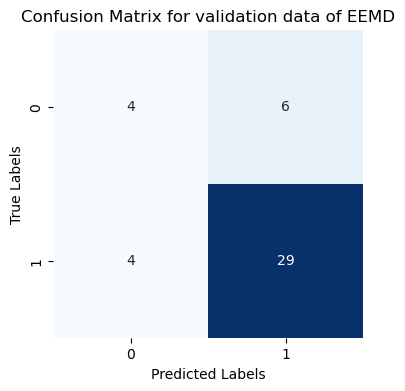

In [1260]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Compute confusion matrix VALIDATION DATA
cm = confusion_matrix(y_test, y_pred_binary, labels=[0, 1])
cm


# Calculate precision, recall, and F1-score
precision = precision_score(y_test, y_pred_binary, pos_label=1)
recall = recall_score(y_test, y_pred_binary, pos_label=1)
f1 = f1_score(y_test, y_pred_binary, pos_label=1)


# TN, TP FN, NPV and PPV
tn, fp, fn, tp = cm.ravel()
npv = tn / (tn + fn)
ppv = tp / (tp + fp)

# Print metrics
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1)
print("Negative Prediction Value (NPV):", npv)
print("Positive Prediction Value (PPV):", ppv)
print("Mean Absolute Error (MAE):", mae)
print("Root Mean Square Error (RMSE):", rmse)

# Visualize confusion matrix
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix for validation data of EEMD")
plt.show()

# MODEL PERFROMANCE ON SUBJECT 8, 9, 10

In [1261]:
imf_values_normalized_sub8 = scaler.fit_transform(imf_values_normalized_sub8)
imf_values_normalized_sub9 = scaler.fit_transform(imf_values_normalized_sub9)
imf_values_normalized_sub10 = scaler.fit_transform(imf_values_normalized_sub10)

In [1262]:
input_data_sub8 = imf_values_normalized_sub8.reshape((imf_values_normalized_sub8.shape[0], imf_values_normalized_sub8.shape[1], input_dim))
input_data_sub9 = imf_values_normalized_sub9.reshape((imf_values_normalized_sub9.shape[0], imf_values_normalized_sub9.shape[1], input_dim))
input_data_sub10 = imf_values_normalized_sub10.reshape((imf_values_normalized_sub10.shape[0], imf_values_normalized_sub10.shape[1], input_dim))

In [1263]:
y_pred_sub8 = model.predict(input_data_sub8)
y_pred_sub9 = model.predict(input_data_sub9)
y_pred_sub10 = model.predict(input_data_sub10)

1/1 [==============================] - 0s 19ms/step


In [1264]:
y_pred_binary_sub8 = []
for pred in y_pred_sub8:
    if  pred < 0.5:
        y_pred_binary_sub8.append(0)
    else:
        y_pred_binary_sub8.append(1)
y_pred_binary_sub8 = np.array(y_pred_binary_sub8)
print(y_pred_binary_sub8)


y_pred_binary_sub9 = []
for pred in y_pred_sub9:
    if pred < 0.5:
        y_pred_binary_sub9.append(0)
    else:
        y_pred_binary_sub9.append(1)
y_pred_binary_sub9 = np.array(y_pred_binary_sub9)
print(y_pred_binary_sub9)


y_pred_binary_sub10 = []
for pred in y_pred_sub10:
    if pred < 0.5:
        y_pred_binary_sub10.append(0)
    else:
        y_pred_binary_sub10.append(1)
y_pred_binary_sub10 = np.array(y_pred_binary_sub10)
print(y_pred_binary_sub10)

[1 1 1 1 1 1 1 1 0 1 1 0 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


# CONFUSION MATRIX FOR SUBJECT 8, 9, 10

In [1265]:
cm_sub8 = confusion_matrix(target_labels_sub8, y_pred_binary_sub8)
cm_sub9 = confusion_matrix(target_labels_sub9, y_pred_binary_sub9)
cm_sub10 = confusion_matrix(target_labels_sub10, y_pred_binary_sub10)

Precision: 0.8461538461538461
Recall: 0.9166666666666666
F1-Score: 0.8799999999999999
Negative Prediction Value (NPV): 0.5
Positive Prediction Value (PPV): 0.8461538461538461
Mean Absolute Error (MAE): 0.2
Root Mean Square Error (RMSE): 0.4472135954999579


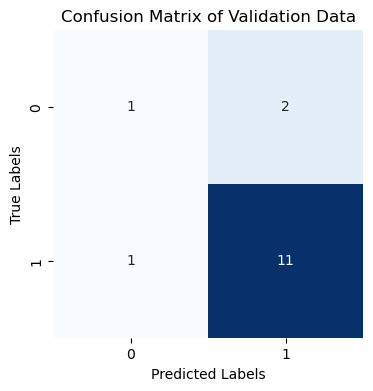

In [1266]:
cm_sub8 = confusion_matrix(target_labels_sub8, y_pred_binary_sub8, labels=[0, 1])

# precision, recall, and F1-score
precision = precision_score(target_labels_sub8,  y_pred_binary_sub8, pos_label=1)
recall = recall_score(target_labels_sub8, y_pred_binary_sub8 , pos_label=1)
f1 = f1_score(target_labels_sub8, y_pred_binary_sub8, pos_label=1)

# TN, TP FN, NPV and PPV
tn, fp, fn, tp = cm_sub8.ravel()
npv = tn / (tn + fn)
ppv = tp / (tp + fp)

#  Mean Absolute Error (MAE)
mae = mean_absolute_error(target_labels_sub8, y_pred_binary_sub8)

# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(target_labels_sub8, y_pred_binary_sub8))


print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1)
print("Negative Prediction Value (NPV):", npv)
print("Positive Prediction Value (PPV):", ppv)
print("Mean Absolute Error (MAE):", mae)
print("Root Mean Square Error (RMSE):", rmse)

plt.figure(figsize=(4, 4))
sns.heatmap(cm_sub8, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix of Validation Data")
plt.show()

Precision: 0.8888888888888888
Recall: 0.8421052631578947
F1-Score: 0.8648648648648649
Negative Prediction Value (NPV): 0.0
Positive Prediction Value (PPV): 0.8888888888888888
Mean Absolute Error (MAE): 0.2
Root Mean Square Error (RMSE): 0.4472135954999579


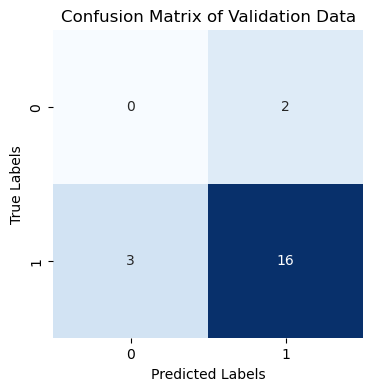

In [1267]:
cm_sub9 = confusion_matrix(target_labels_sub9, y_pred_binary_sub9, labels=[0, 1])

# Calculate precision, recall, and F1-score
precision = precision_score(target_labels_sub9,  y_pred_binary_sub9, pos_label=1)
recall = recall_score(target_labels_sub9, y_pred_binary_sub9 , pos_label=1)
f1 = f1_score(target_labels_sub9, y_pred_binary_sub9, pos_label=1)

# TN, TP FN, NPV and PPV
tn, fp, fn, tp = cm_sub9.ravel()
npv = tn / (tn + fn)
ppv = tp / (tp + fp)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(target_labels_sub8, y_pred_binary_sub8)

# Calculate Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(target_labels_sub8, y_pred_binary_sub8))

# Print metrics
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1)
print("Negative Prediction Value (NPV):", npv)
print("Positive Prediction Value (PPV):", ppv)
print("Mean Absolute Error (MAE):", mae)
print("Root Mean Square Error (RMSE):", rmse)


plt.figure(figsize=(4, 4))
sns.heatmap(cm_sub9, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix of Validation Data")
plt.show()

Precision: 0.95
Recall: 1.0
F1-Score: 0.9743589743589743
Negative Prediction Value (NPV): nan
Positive Prediction Value (PPV): 0.95
Mean Absolute Error (MAE): 0.2
Root Mean Square Error (RMSE): 0.4472135954999579


C:\Users\mds22awo\AppData\Local\Temp\ipykernel_16828\556397284.py:10: RuntimeWarning: invalid value encountered in scalar divide
  npv = tn / (tn + fn)


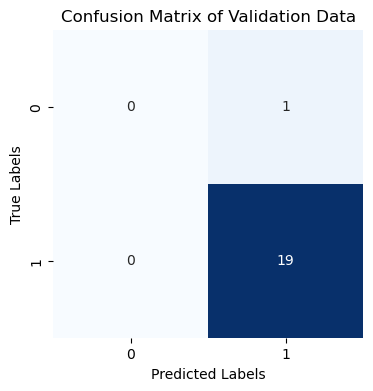

In [1268]:
cm_sub10 = confusion_matrix(target_labels_sub10, y_pred_binary_sub10, labels=[0, 1])

# Calculate precision, recall, and F1-score
precision = precision_score(target_labels_sub10,  y_pred_binary_sub10, pos_label=1)
recall = recall_score(target_labels_sub10, y_pred_binary_sub10 , pos_label=1)
f1 = f1_score(target_labels_sub10, y_pred_binary_sub10, pos_label=1)

# TN, TP FN, NPV and PPV
tn, fp, fn, tp = cm_sub10.ravel()
npv = tn / (tn + fn)
ppv = tp / (tp + fp)

# Mean Absolute Error (MAE)
mae = mean_absolute_error(target_labels_sub10, y_pred_binary_sub10)

#  Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(target_labels_sub10, y_pred_binary_sub10))

# Print metrics
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1)
print("Negative Prediction Value (NPV):", npv)
print("Positive Prediction Value (PPV):", ppv)
print("Mean Absolute Error (MAE):", mae)
print("Root Mean Square Error (RMSE):", rmse)


plt.figure(figsize=(4, 4))
sns.heatmap(cm_sub10, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix of Validation Data")
plt.show()